# Imports & General settings
change paths for your environments and folder architecture

In [92]:
%%time
# Standard library imports
import glob
import logging as log
import os
import sys

# Third party imports
from adjustText import adjust_text
%matplotlib inline
import matplotlib.pyplot as plt
import nglview as nv
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import spearmanr
import sklearn
from sklearn.metrics import mean_squared_error, accuracy_score,roc_auc_score, roc_curve
from sklearn.preprocessing import minmax_scale
import squarify

# Local application imports

log_message="verbose"

if log_message=="verbose":
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.INFO
    )
elif log_message=="debug":
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.WARNING
    )
else:
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.ERROR
    )

logger = log.getLogger(__name__)


CPU times: user 0 ns, sys: 1.92 ms, total: 1.92 ms
Wall time: 1.61 ms


In [3]:
# General settings

# saving_dir_flag = 'projects/Xray_calc'

# basepath = 
# shared_basepath = 
# path_to_prism_exec_dir = '_path_to_software_/PRISM_tools/rosetta_stability-v0.1.1/'

saving_dir_flag = 'projects/Xray_calc'

basepath = '/storage1/tiemann'
shared_basepath = '/storage1/shared/data'
path_to_prism_exec_dir = '/storage1/tiemann/dev/repos/PRISM'#'_path_to_software_/PRISM_tools/rosetta_stability-v0.1.1/'
path_to_exp_data = os.path.join(basepath, 'dev/repos/prism/prism_ddG/')


# Local application imports
try:
    sys.path.insert(1, os.path.join(basepath, 'dev/repos/prism/scripts/')) 
    from FillVariants import copy_wt_variants
    from PrismData import PrismParser
    
    sys.path.insert(1, os.path.join(path_to_prism_exec_dir, 'software/rosetta_ddG_pipeline'))
    from mp_helper import extract_from_opm
    
    sys.path.insert(1, os.path.join(path_to_prism_exec_dir, 'software/scripts'))
    from prism_parser_helper import read_prism, merge_prism_df
    from pdb_to_prism import download_pdb, rosetta_energy_to_prism

except (ModuleNotFoundError, ImportError) as e:
    logger.error("{} fileure".format(type(e)))
    print(e)
else:
    logger.info("Import succeeded")


/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/Bio/SubsMat/__init__.py:126: BiopythonDeprecationWarning: Bio.SubsMat has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.substitution_matrices as a replacement, and contact the Biopython developers if you still need the Bio.SubsMat module.
  warnings.warn(
INFO:Import succeeded
INFO:Import succeeded
INFO:Import succeeded


In [4]:
working_dir = os.path.join(basepath, saving_dir_flag)
os.makedirs(working_dir, exist_ok=True)

plots_dir = os.path.join(working_dir, 'plots')
os.makedirs(plots_dir, exist_ok=True)

tables_dir = os.path.join(working_dir, 'tables')
os.makedirs(tables_dir, exist_ok=True)

input_dir = os.path.join(working_dir, 'input')
os.makedirs(input_dir, exist_ok=True)

gnomAD_cutoff_value = float('9.931568854324432e-05') #'7.097735196763732e-05'

stats_file = os.path.join(working_dir, 'tables', '2022_05_05-count_hMP_Clinvar_gnomad_PDB_nonsyndel_df.csv')
rosetta_sci_bench_csv = os.path.join(working_dir, 'tables', 'Rosetta_sci_benchmark.csv')
sm_corr_dfs_csv = os.path.join(working_dir, 'tables', 'rosetta_2021_08_sm_benchmarked_corr_dfs.csv')
csv_file_all_merged_edited = os.path.join(working_dir, 'tables', '2022_05_05-merged_anno_hMP_merged_df_edited.csv')

shared_prism_dir = os.path.join(shared_basepath, 'prism')
pdb_prism_dir = os.path.join(shared_basepath, 'prism_pdb')
gemme_prism_dir = os.path.join(working_dir, 'prism_gemme')
rosetta_prism_dir = os.path.join(working_dir, 'prism_rosetta')
gemme_dir = os.path.join(working_dir, 'gemme')


In [5]:
# Target list to run on

target_list = [
    ['O15118', 'NPC1', ['Transporter', 'Slc65'], ['5u74-A', '6w5s-A']],
    ['P08100', 'OPSD', ['GPCR', 'A'], ['4zwj-A']],
    ['P11166', 'GTR1', ['Transporter', 'Slc2'], ['6tha-A']],
    ['P16615', 'AT2A2', ['Transporter', 'P'], ['7bt2-A']],
    ['P17787', 'ACHB2', ['Ion channel', 'ligand'], ['5kxi-C']],
    ['P29033', 'CXB2', ['Cell Junction', ''], ['2zw3-A']],
    ['P31213', 'S5A2', ['Enzyme', 'Oxidoreductase'], ['7bw1-A']],
    ['P32245', 'MC4R', ['GPCR', 'A'], ['6w25-A']],
    ['P41181', 'AQP2', ['Ion channel', 'other'], ['4nef-A']],
    ['P43681', 'ACHA4', ['Ion channel', 'ligand'], ['5kxi-A', '6cnj-A', '6usf-A']],
    ['Q8N5M9', 'JAGN1', ['Transporter', 'vesicle-mediated'], ['6wvd-A']],
    ['Q99835', 'SMO', ['GPCR', 'F'], ['5l7d-A']],
    ['Q9H221', 'ABCG8', ['Transporter', 'Atp8'], ['5do7-D']],
    ['Q9H222', 'ABCG5', ['Transporter', 'Atp5'], ['5do7-A']],
    ['Q9H3H5', 'GPT', ['Enzyme', 'Transferase'], ['6fm9-A', '6bw6-B']],
    ['Q9ULV1', 'FZD4', ['GPCR', 'F'], ['6bd4-A']],
]

# Functions

In [6]:
def read_prism(primsfile):
    parser = PrismParser()
    data = parser.read(primsfile)
    return data

In [7]:
def merge_specific_prism(uniprot_id, pdb_id='', pdb_chain=''):
    spliceAI_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_spliceai_*_{uniprot_id}*.txt'))
    gnomAD_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_gnomad_*{uniprot_id}*.txt'))
    clinvar_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_clinvar_*_{uniprot_id}*.txt'))
    uniprot_files = glob.glob(os.path.join(shared_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_uniprot_*{uniprot_id}.txt'))
    pdb_files = glob.glob(os.path.join(pdb_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_pdb_*{uniprot_id}*.txt'))
    gemme_files = glob.glob(os.path.join(gemme_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_gemme_XXX_{uniprot_id}*txt'))
    rosetta_files = glob.glob(os.path.join(rosetta_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_rosetta_XXX_{uniprot_id}*.txt'))
    rosettapdb_files = glob.glob(os.path.join(rosetta_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_rosettapdb*{uniprot_id}*.txt'))
    
    
    dataframe_list = []
    #uniprot
    if len(uniprot_files) !=0:
        try:
            uniprot = read_prism(uniprot_files[0])
            uniprot.dataframe = copy_wt_variants(uniprot.dataframe, incl_del=True)
            uniprot.dataframe['aa_ref'] = uniprot.dataframe['variant'].apply(lambda x: [x[0]])
            uniprot.dataframe['aa_var'] = uniprot.dataframe['variant'].apply(lambda x: [x[-1]])
            uniprot.dataframe['resi'] = uniprot.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            uniprot.dataframe['n_mut'] = 1
            dataframe_list.append(uniprot)
        except:
            logger.info(f'error at {uniprot_files}')
    else:
        logger.info(f'no uniprot file at {uniprot_files}')
        return
    #clinvar
    if len(clinvar_files) !=0:
        for clinvar_file in clinvar_files:
            try:
                clinvar = read_prism(clinvar_file)
                dataframe_list.append(clinvar)
            except:
                logger.info(f'error at {clinvar_file}')
    #gnomAD
    if len(gnomAD_files) !=0:
        for gnomAD_file in gnomAD_files:
            try:
                gnomAD = read_prism(gnomAD_file)
                dataframe_list.append(gnomAD)
            except:
                logger.info(f'error at {gnomAD_file}')

    #gemme
    if len(gemme_files) !=0:
        try:
            gemmef = read_prism(gemme_files[0])
            #gemmef.dataframe = copy_wt_variants(gemmef.dataframe, )#incl_del=False)
            gemmef.dataframe['aa_ref'] = gemmef.dataframe['variant'].apply(lambda x: [x[0]])
            gemmef.dataframe['aa_var'] = gemmef.dataframe['variant'].apply(lambda x: [x[-1]])
            gemmef.dataframe['resi'] = gemmef.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            gemmef.dataframe['n_mut'] = 1
            dataframe_list.append(gemmef)
        except:
            logger.info(f'error at {gemme_files}')

    #rosetta
    if len(rosetta_files) !=0:
        for rosetta_file in rosetta_files:
            if pdb_id!='' and pdb_chain!='':
                if f'{pdb_id.lower()}_{pdb_chain.upper()}' in rosetta_file:
                    try:
                        rosettaf = read_prism(rosetta_file)
                        #rosettaf.dataframe = copy_wt_variants(rosettaf.dataframe, )#incl_del=False)
                        rosettaf.dataframe['aa_ref'] = rosettaf.dataframe['variant'].apply(lambda x: [x[0]])
                        rosettaf.dataframe['aa_var'] = rosettaf.dataframe['variant'].apply(lambda x: [x[-1]])
                        rosettaf.dataframe['resi'] = rosettaf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                        rosettaf.dataframe['n_mut'] = 1
                        dataframe_list.append(rosettaf)
                    except:
                        logger.info(f'error at {rosetta_file}')
            else:
                try:
                    rosettaf = read_prism(rosetta_file)
                    #rosettaf.dataframe = copy_wt_variants(rosettaf.dataframe, )#incl_del=False)
                    rosettaf.dataframe['aa_ref'] = rosettaf.dataframe['variant'].apply(lambda x: [x[0]])
                    rosettaf.dataframe['aa_var'] = rosettaf.dataframe['variant'].apply(lambda x: [x[-1]])
                    rosettaf.dataframe['resi'] = rosettaf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                    rosettaf.dataframe['n_mut'] = 1
                    dataframe_list.append(rosettaf)
                except:
                    logger.info(f'error at {rosetta_file}')
                
    #rosettapdb
    if len(rosettapdb_files) !=0:
        for rosettapdb_file in rosettapdb_files:
            try:
                rosettapf = read_prism(rosettapdb_file)
                rosettapf.dataframe = copy_wt_variants(rosettapf.dataframe, )#incl_del=False)
                rosettapf.dataframe['aa_ref'] = rosettapf.dataframe['variant'].apply(lambda x: [x[0]])
                rosettapf.dataframe['aa_var'] = rosettapf.dataframe['variant'].apply(lambda x: [x[-1]])
                rosettapf.dataframe['resi'] = rosettapf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                rosettapf.dataframe['n_mut'] = 1
                dataframe_list.append(rosettapf)
            except:
                logger.info(f'error at {rosetta_file}')

    #spliceAI
    if len(spliceAI_files) !=0:
        for spliceAI_file in spliceAI_files:
            try:
                spliceAI = read_prism(spliceAI_file)
                dataframe_list.append(spliceAI)
            except:
                logger.info(f'error at {spliceAI_file}')
    #pdb
    if len(pdb_files) !=0:
        pdb_files_unique = []
        for pdb_file in pdb_files:
            if not pdb_file.upper() in pdb_files_unique:
                pdb_files_unique.append(pdb_file.upper())
                try:
                    pdb = read_prism(pdb_file)
                    pdb.dataframe = copy_wt_variants(pdb.dataframe, incl_del=True)
                    pdb.dataframe['aa_ref'] = pdb.dataframe['variant'].apply(lambda x: [x[0]])
                    pdb.dataframe['aa_var'] = pdb.dataframe['variant'].apply(lambda x: [x[-1]])
                    pdb.dataframe['resi'] = pdb.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                    pdb.dataframe['n_mut'] = 1
                    pdb.dataframe['ID'] = pdb_file.split(uniprot_id)[-1][1:-4]
                    pdb.metadata['columns']['ID'] = 'PDB_ID + chain'
                    dataframe_list.append(pdb)
                except:
                    logger.info(f'error at {pdb_file}')

    if len(dataframe_list) > 1:
        #try:
        all_merged = merge_prism_df(dataframe_list, identity=0.7)
        #except:
        #    return
    else:
        return

    key_dic = {}
    new_columns = {}
    for keyx in all_merged.metadata['merged']:
        num = keyx.split("_")[1]
        name = all_merged.metadata['merged'][keyx].split('_')[1]
        if all_merged.metadata['merged'][keyx].split('.txt')[0].endswith('cartesian'):
            name = f"{name};cart"
        for column in all_merged.metadata['columns']:
            if column.endswith(num):
                key_dic[column] = f'{name};{column}'
                new_columns[f'{name};{column}'] = all_merged.metadata['columns'][column]

    all_merged.dataframe.rename(columns=key_dic, inplace=True)
    all_merged.metadata['columns'] = new_columns
    #modify pdb IDs
    pdb_ids = [elem for elem in all_merged.dataframe.columns if elem.startswith('pdb;ID_')]
    all_merged.dataframe[f'pdb;IDs'] = all_merged.dataframe[pdb_ids].apply(
        lambda x: '|'.join(list(set(x.astype(str)))), axis=1)
    all_merged.dataframe = all_merged.dataframe.drop(columns=pdb_ids)
    for keyx in pdb_ids:
        all_merged.metadata['columns'].pop(keyx)
    all_merged.metadata['columns']['pdb;IDs'] = 'PDB_ID + chain'
    #removing no-values from FillVariants
    non_relevant = [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('uniprot')] + [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('pdb')]
    non_relevant = list(np.unique(non_relevant))
    tmp_df1 = all_merged.dataframe.copy()
    tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
    tmp_df2 = all_merged.dataframe.copy()
    tmp_df2 = tmp_df2.drop(columns=non_relevant)
    tmp_df2.dropna(axis=0, how='all', inplace=True, thresh=6)
    new_clean = pd.merge(tmp_df1, tmp_df2, how='right', on='variant')
    new_clean = new_clean.dropna(axis='columns', how ='all')
    all_merged.dataframe = new_clean
    drop_meta_columns = [keyx for keyx in all_merged.metadata['columns'].keys() if not keyx in all_merged.dataframe.columns]
    for keyx in drop_meta_columns:
        all_merged.metadata['columns'].pop(keyx)

    return all_merged

In [8]:
def write_to_csv_spec(target_dic_here, filename_xlsx):
    Excelwriter = pd.ExcelWriter(os.path.join(tables_dir, filename_xlsx),engine="xlsxwriter")
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        logger.info(f'#accession: {target_uniprot}')
        df = target_dic_here[target_uniprot].copy()
        df.to_excel(Excelwriter, sheet_name=target_uniprot,index=False)
    Excelwriter.save()

In [9]:
def classify_control(x):
    if x in ['benign','gnomad_high']:
        return 0
    elif x in ['pathogenic', ]:#'gnomad_low']:
        return 1

In [10]:
def calculate_AUC_error(control_df, nameA='rosetta;ddG', nameB='gemme;score', runs=1000):

    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_test_score2 = control_df[nameB].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    base_auc2 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score2)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    fpr2, tpr2, thresholds2 = sklearn.metrics.roc_curve(base_control_score, base_test_score2)

    results_rosetta = []
    results_gemme = []
    i = 0

    size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
    size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
    if size_groupA < size_groupB:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==1].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==0].reset_index(drop=True)
        size = size_groupA
    else:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==0].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==1].reset_index(drop=True)
        size = size_groupB
    while i < runs:
        i += 1
        new_large_df = large_df.copy()
        new_large_df = new_large_df.sample(n=size)
        df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

        control_score = np.copy(df_subset['score'].values)
        test_score1 = df_subset[nameA].values
        test_score2 = df_subset[nameB].values
        auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
        auc2 = sklearn.metrics.roc_auc_score(control_score, test_score2)
        results_rosetta.append(float(auc1))
        results_gemme.append(float(auc2))

    results_rosetta = np.array(results_rosetta)
    results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
    y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
    mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)

    results_gemme = np.array(results_gemme)
    results_gemme = results_gemme[~np.isnan(results_gemme)]
    y_true_gemme = [float(base_auc2)] * len(results_gemme)
    mse_gemme = mean_squared_error(results_gemme, y_true_gemme)

    return {'rosetta': [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1], 'gemme': [base_auc2, mse_gemme, np.std(results_gemme), thresholds2]}

In [11]:
def disease_ROC(control_df, control, test1, test2, plots_dir, target, region, title='', cutoff='1.0e-4', satu='', groupA=0, groupB=0, nameA='rosetta;ddG', nameB='gemme;score'):
    a4_dims = (7,7)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    #ax.set_prop_cycle(color=['Set2'])


    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('FPR (1-specificity)', fontsize=19)
    ax.set_ylabel('TPR (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title(f'{target} (region={region}, cutoff={cutoff}{satu})', fontsize=18)



    auc_dic = calculate_AUC_error(control_df, nameA=nameA, nameB=nameB, runs=1000)

    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['rosetta'][0]#sklearn.metrics.roc_auc_score(control, test1)
    auc1_mse = auc_dic['rosetta'][1]
    auc1_std = auc_dic['rosetta'][2]
    auc1_threshold = auc_dic['rosetta'][3]
#    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (rosetta): {auc1:.2f}, MSE: {auc1_mse:.2f}, std: {auc1_std:.2f}', linestyle='-', linewidth=1.2, color='mediumvioletred')
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (rosetta): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=1.2, color='mediumvioletred')

    roc_curve2 = sklearn.metrics.roc_curve(control,test2)
    auc2 = auc_dic['gemme'][0] #sklearn.metrics.roc_auc_score(control, test2)
    auc2_mse = auc_dic['gemme'][1]
    auc2_std = auc_dic['gemme'][2]
    auc2_threshold = auc_dic['gemme'][3]
#    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (gemme): {auc2:.2f}, MSE: {auc2_mse:.2f}, std: {auc2_std:.2f}', linestyle='-', linewidth=1.2, color='teal')
    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (gemme): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=1.2, color='teal')


    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=16, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    fig.text(0.15, 0.8, f'Group A: {groupA}\nGroup B: {groupB}', fontsize=16)
    filename = os.path.join(plots_dir, f'ROC_{cutoff}_{title}{satu}.png')
    plt.savefig(filename, transparent=True)
    plt.show()
    return auc_dic

In [12]:
def calculate_AUC_error_single(control_df, nameA='gnomad;AF_tot_first', runs=1000):

    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    results_rosetta = []
    i = 0
    size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
    size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
    if size_groupA < size_groupB:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==1].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==0].reset_index(drop=True)
        size = size_groupA
    else:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==0].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==1].reset_index(drop=True)
        size = size_groupB
    while i < runs:
        i += 1
        new_large_df = large_df.copy()
        new_large_df = new_large_df.sample(n=size)
        df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

        control_score = np.copy(df_subset['score'].values)
        test_score1 = df_subset[nameA].values
        auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
        results_rosetta.append(float(auc1))

    results_rosetta = np.array(results_rosetta)
    results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
    y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
    mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)

    return {'gnomAD': [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1], }


def disease_ROC_adapted_gnomad(control_df, control, test1, groupA=0, groupB=0, nameA='gnomad;AF_tot_first'):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])

    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('false positive rate (1-specificity)', fontsize=19)
    ax.set_ylabel('true positive rate (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    auc_dic = calculate_AUC_error_single(control_df, nameA=nameA, runs=10)#00
    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['gnomAD'][0]
    auc1_mse = auc_dic['gnomAD'][1]
    auc1_std = auc_dic['gnomAD'][2]
    auc1_threshold = auc_dic['gnomAD'][3]
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (gnomAD): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')
    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameA].values
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold
    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy1 = acc['accuracy'].max()
    cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    fig.text(0.25, 0.75, f'pathogenic: {groupA}\nbenign: {groupB}', fontsize=18)
    plt.savefig(os.path.join(plots_dir,'FigSXX1B-roc-gnomad.svg'))
    plt.show()
    return auc_dic, max_accuracy1, cutoff1


def clinvar_class_anno5(x, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', ]:
                return 0
            elif subx in [ 'pathogenic']:
                return 1
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return None
    return None


In [13]:
def special_class(x):
    special = []
    disulfid_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;DISULFID')], how='all')['resis'].unique()
    metal_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;METAL')], how='all')['resis'].unique()
    palmitoyl_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;LIPID')], how='all')['resis'].unique()
    modified_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;MOD_RES')], how='all')['resis'].unique()
    carbohydroxy_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;CARBOHYD')], how='all')['resis'].unique()
    if x['resis'] in disulfid_resis:
        special.append('disulfid')
    if x['resis'] in metal_binding_resis:
        special.append('metal')
    if x['resis'] in palmitoyl_binding_resis:
        special.append('lipid')
    if x['resis'] in modified_binding_resis:
        special.append('mod')
    if x['resis'] in carbohydroxy_resis:
        special.append('carbohyd')
    return "|".join(special)


def special_class_detail(x):
    special = []
    disulfid_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;DISULFID')], how='all')['resis'].unique()
    metal_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;METAL')], how='all')['resis'].unique()
    palmitoyl_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;LIPID')], how='all')['resis'].unique()
    modified_binding_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;MOD_RES')], how='all')['resis'].unique()
    carbohydroxy_resis = df.dropna(subset=[column for column in df.columns if column.startswith('uniprot;CARBOHYD')], how='all')['resis'].unique()
    if x['resis'] in disulfid_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;DISULFID')][0]])
    if x['resis'] in metal_binding_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;METAL')][0]])
    if x['resis'] in palmitoyl_binding_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;LIPID')][0]])
    if x['resis'] in modified_binding_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;MOD_RES')][0]])
    if x['resis'] in carbohydroxy_resis:
        special.append(x[[column for column in df.columns if column.startswith('uniprot;CARBOHYD')][0]])
    return "|".join(special)


def make_property(x):
    if x in ['R', 'H', 'K']:
        return 'positive'
    elif x in ['D', 'E']:
        return 'negative'
    elif x in ['S', 'T', 'N', 'Q']:
        return 'polar'
    elif x in ['C', 'U', 'G', 'P']:
        return 'special'
    elif x in ['A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']:
        return 'hydrophobic'
    
    
def make_property2(x):
    if x in ['R', 'H', 'K', 'D', 'E']:
        return 'charged'
    elif x in ['S', 'T', 'N', 'Q']:
        return 'polar'
    elif x in ['C', 'U', 'G', 'P']:
        return 'special'
    elif x in ['A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']:
        return 'hydrophobic'

    
def gnomad_class(x, split_val=gnomAD_cutoff_value, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', 'pathogenic']:#['VUS', 'conflict', 'benign', 'pathogenic']):
                return subx
            else:
                if not subx in ['VUS', 'conflict']:
                    if subx != '':
                        subx = float(subx)
                        if subx < float(split_val):
                            return 'gnomad_low'
                        else:
                            return 'gnomad_high'
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return subx
    return np.nan


def sasa(x):
    if x < 1/3.:
        return 'buried'
    elif x >= 1/3.:#
        return 'solvent-accessible'
    else:
        ''


In [14]:
def read_gemme_cov(target_uniprot, gemme_dir):
    base=False
    gemme_align = glob.glob(os.path.join(gemme_dir, target_uniprot, 'run', 'hhblits_run', f"hhblits_*_filtered.fasta"))[0]
    total_count = 0
    
    with open(gemme_align, 'r') as fp:
        for line in fp:
            if base:
                if not line.startswith('>'):
                    line = line.strip()
                    print(len(line))
                    target_seq = [0]*len(line)
                base=False
            else:
                if line.startswith('>sp'):
                    base=True
                elif not line.startswith('>'):
                    total_count +=1
                    line = line.strip()
                    for index, AA in enumerate(line):
                        if AA != '-':
                            target_seq[index] +=1
    #logger.info(f"total count of sequences: {total_count}")
    #logger.info(f"count of non-gap per AA of target sequence: {target_seq}")
    #logger.info(len(range(1,len(target_seq)+1)))
    gemme_seq_df = pd.DataFrame(data=list(map(list, zip(*[target_seq, range(1,len(target_seq)+1)]))), columns=['gemme;count', 'res'])
    gemme_seq_df['gemme;total'] = total_count
    gemme_seq_df['gemme;coverage_perc'] = (gemme_seq_df['gemme;count']/gemme_seq_df['gemme;total']).round(4)
    gemme_seq_df['gemme;seqperlen'] = (gemme_seq_df['gemme;count']/len(target_seq)).round(4)
    gemme_seq_df['gemme;coverage_count'] = gemme_seq_df['gemme;count']
    return gemme_seq_df

In [15]:
def gnomad_class_anno5(x, split_val=gnomAD_cutoff_value, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', ]:
                return 0
            elif subx in [ 'pathogenic']:
                return 1
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return None
        for subx in x:
            if not subx in ['benign', 'pathogenic', 'VUS', 'conflict']:
                if subx != '':
                    subx = float(subx)
                    if subx > float(split_val):
                        return 0
                    else:
                        return None
    return None

In [16]:
def check_gemme_seq(target_list):
    seq_count = [['accession', 'sequence_count']]
    for targetID, target in enumerate(target_list):
        count = 0
        accessionID, accessionName, classlist, pdblist = target
        gemme_workdir_target = os.path.join(gemme_workdir, accessionID)
        gemme_run_dir = os.path.join(gemme_workdir_target, 'run')
        input_file = glob.glob(os.path.join(gemme_run_dir, 'hhblits_run', 'hhblits*_filtered.fasta'))[0]
        with open(input_file, 'r')as fp:
            for line in fp:
                if line.startswith('>tr'):
                    count +=1
        seq_count.append([accessionID, count])
    return pd.DataFrame(data = seq_count[1:], columns=seq_count[0])

In [17]:
def cutoff_checks(control_df, nameA='rosetta;ddG', nameB='gemme;score', cutoffA=2.0, cutoffB=0.4):
    
    backup_df = control_df.copy()
    
    base_auc_dic = calculate_AUC_error(backup_df, nameA=nameA, nameB=nameB, runs=1000)
    base_rosetta_auc = int(base_auc_dic['rosetta'][0]*100)
    base_gemme_auc = int(base_auc_dic['gemme'][0]*100)
    
    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_test_score2 = control_df[nameB].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    base_auc2 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score2)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    fpr2, tpr2, thresholds2 = sklearn.metrics.roc_curve(base_control_score, base_test_score2)
    gmeans1 = np.sqrt(tpr1 * (1-fpr1))
    ix1 = np.argmax(gmeans1)
    cutoffA = thresholds1[ix1]
    gmeans2 =np. sqrt(tpr2 * (1-fpr2))
    ix2 = np.argmax(gmeans2)
    cutoffB = thresholds2[ix2]
    
    ddG_ddE_condition = (((control_df['score']==0) & (control_df[nameA]<=cutoffA) & (control_df['score']==0) & (control_df[nameB]<=cutoffB)) | 
                          ((control_df['score']==1) & (control_df[nameA]>cutoffA) & (control_df['score']==1) & (control_df[nameB]>cutoffB)))
    ddG_ddE = control_df.loc[ddG_ddE_condition, 'variant']
    ddG_condition = (((control_df['score']==0) & (control_df[nameA]<=cutoffA) & (control_df['score']==0) & (control_df[nameB]>cutoffB)) | 
                          ((control_df['score']==1) & (control_df[nameA]>cutoffA) & (control_df['score']==1) & (control_df[nameB]<=cutoffB)))
    ddG = control_df.loc[ddG_condition, 'variant']
    ddE_condition = (((control_df['score']==0) & (control_df[nameA]>cutoffA) & (control_df['score']==0) & (control_df[nameB]<=cutoffB)) | 
                          ((control_df['score']==1) & (control_df[nameA]<=cutoffA) & (control_df['score']==1) & (control_df[nameB]>cutoffB)))
    ddE = control_df.loc[ddE_condition, 'variant']
    both_not = control_df.loc[~(ddG_condition | ddE_condition | ddG_ddE_condition), 'variant']
    
    return ddG_ddE, ddG, ddE, both_not, cutoffA, cutoffB


def return_variant_in_cat(control_df, nameA='rosetta;ddG', nameB='gemme;score', cutoffA=2.0, cutoffB=0.4):
    
    control_df['variant2'] = control_df['uniprot;ID']+'_'+control_df['variant']
    #patho
    q2_A_condition = ((control_df['score']==1) & ((control_df[nameA]<cutoffA) & (control_df[nameB]>=cutoffB)))
    q2_A = control_df.loc[q2_A_condition, 'variant2']
    q1_A_condition = ((control_df['score']==1) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]>=cutoffB)))
    q1_A = control_df.loc[q1_A_condition, 'variant2']
    q4_A_condition = ((control_df['score']==1) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]<cutoffB)))
    q4_A = control_df.loc[q4_A_condition, 'variant2']
    q3_A_condition = ((control_df['score']==1) & ((control_df[nameA]<cutoffA) & (control_df[nameB]<cutoffB)))
    q3_A = control_df.loc[q3_A_condition, 'variant2']
    
    #benign
    q2_B_condition = ((control_df['score']==0) & ((control_df[nameA]<cutoffA) & (control_df[nameB]>=cutoffB)))
    q2_B = control_df.loc[q2_B_condition, 'variant2']
    q1_B_condition = ((control_df['score']==0) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]>=cutoffB)))
    q1_B = control_df.loc[q1_B_condition, 'variant2']
    q4_B_condition = ((control_df['score']==0) & ((control_df[nameA]>=cutoffA) & (control_df[nameB]<cutoffB)))
    q4_B = control_df.loc[q4_B_condition, 'variant2']
    q3_B_condition = ((control_df['score']==0) & ((control_df[nameA]<cutoffA) & (control_df[nameB]<cutoffB)))
    q3_B = control_df.loc[q3_B_condition, 'variant2']
    
    return q1_A, q2_A, q3_A, q4_A, q1_B, q2_B, q3_B, q4_B, cutoffA, cutoffB

In [18]:
def disease_ROC_adapted(control_df, control, test1, test2, target, region, title='', 
                        cutoff=gnomAD_cutoff_value, satu='', groupA=0, groupB=0, 
                        nameA='rosetta;ddG', nameB='gemme;score', runs=1000):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)
    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('false positive rate (1-specificity)', fontsize=19)
    ax.set_ylabel('true positive rate (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    auc_dic = calculate_AUC_error(control_df, nameA=nameA, nameB=nameB, runs=runs)

    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['rosetta'][0]
    auc1_mse = auc_dic['rosetta'][1]
    auc1_std = auc_dic['rosetta'][2]
    auc1_threshold = auc_dic['rosetta'][3]
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (∆∆G): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')

    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameA].values
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold

    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy1 = acc['accuracy'].max()
    cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()

    roc_curve2 = sklearn.metrics.roc_curve(control,test2)
    auc2 = auc_dic['gemme'][0] 
    auc2_mse = auc_dic['gemme'][1]
    auc2_std = auc_dic['gemme'][2]
    auc2_threshold = auc_dic['gemme'][3]
    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (∆∆E): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=3.5, color='#998ec3')

    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameB].values
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold

    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy2 = acc['accuracy'].max()
    cutoff2 = acc.loc[(acc['accuracy']==max_accuracy2), 'threshold'].mean()#.head()

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    fig.text(0.15, 0.8, f'Group A: {groupA}\nGroup B: {groupB}', fontsize=18)
    plt.title(f'{title}', fontsize=18)
    filename = os.path.join(plots_dir, f'{region}.svg')
    plt.savefig(filename, )
    plt.show()
    return auc_dic, max_accuracy1, cutoff1, max_accuracy2, cutoff2

In [19]:
def disease_ROC_adapted_all_except(control_df, control_df2, control, control2, test1, test2, test3, target, region, title='', 
                                   cutoff=gnomAD_cutoff_value, satu='', groupA=0, groupB=0, groupA2=0, groupB2=0, 
                           nameA='rosetta;ddG', nameB='gemme;score'):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])

    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('FPR (1-specificity)', fontsize=19)
    ax.set_ylabel('TPR (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    plt.title(title)

    auc_dic = calculate_AUC_error(control_df, nameA=nameA, nameB=nameB, runs=1000)

    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['rosetta'][0]
    auc1_mse = auc_dic['rosetta'][1]
    auc1_std = auc_dic['rosetta'][2]
    auc1_threshold = auc_dic['rosetta'][3]
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (∆∆G): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')

    auc_dic3 = calculate_AUC_error(control_df2, nameA=nameA, nameB=nameB, runs=1000)
    roc_curve3 = sklearn.metrics.roc_curve(control2,test3)
    auc3 = auc_dic3['rosetta'][0] 
    auc3_mse = auc_dic3['rosetta'][1]
    auc3_std = auc_dic3['rosetta'][2]
    auc3_threshold = auc_dic3['rosetta'][3]
    plt.plot(roc_curve3[0],roc_curve3[1], label=f'AUC (∆∆G_subset): {auc3:.2f}'+r'$\pm$'+f'{auc3_std:.2f}', linestyle='-', linewidth=3.5, color='#e8c598')

    roc_curve2 = sklearn.metrics.roc_curve(control,test2)
    auc2 = auc_dic['gemme'][0] 
    auc2_mse = auc_dic['gemme'][1]
    auc2_std = auc_dic['gemme'][2]
    auc2_threshold = auc_dic['gemme'][3]
    plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (∆∆E): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=3.5, color='#998ec3')
   
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    fig.text(0.15, 0.825, f'Group A: {groupA} (subset: {groupA2})\nGroup B: {groupB} (subset: {groupB2})', fontsize=18)
    plt.show()
    return auc_dic

In [20]:
def gnomad_class_anno3(x, split_val=gnomAD_cutoff_value, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['VUS','benign', 'pathogenic']:
                return subx
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return 'VUS'
        for subx in x:
            if not subx in ['benign', 'pathogenic', 'VUS', 'conflict']:
                if subx != '':
                    subx = float(subx)
                    return 'VUS'

In [21]:
def fishtail_plot_adapt3(tmp, min_y, max_y, labeling=False):
    
    SMALL_SIZE = 16
    MEDIUM_SIZE = 16
    BIGGER_SIZE = 16

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
    with sns.axes_style("white"):#("whitegrid")
        colors = ['white', 'green', 'red', 'grey', 'cornflowerblue','darkblue', 'cornflowerblue', 'lightblue']
        f, axs = plt.subplots(1,2,
                              figsize=(18,7.5),
                              sharey=True,
                              sharex=False,
                             gridspec_kw=dict(width_ratios=[0.5,7], wspace=0.01))
        ax1 = axs[0]
        ax2 = axs[1]
        tmp2 = tmp.copy()
        tmp2 = tmp2[~tmp2['label'].isin(['gnomad_high', 'gnomad_low'])].reset_index(drop=True)
        tmp2 = tmp2[tmp2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
        fig1 = sns.scatterplot(y = "rosetta;ddG", x = "label", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                               palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax1,
                             legend=False, x_jitter=True, y_jitter=True,
                               )

        ax1.set(xlim=(-1,4))
        ax1.set_xticks([])
        ax1.set_xlabel('')
        ax1.spines['right'].set_visible(False)
        ax1.spines['top'].set_visible(False)

        tmp['gnomad;AF_tot_first'] = tmp["gnomad;AF_tot_all"].apply(lambda x: float(x))
        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']=='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "rosetta;ddG", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2, legend=False
                               )

        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']!='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "rosetta;ddG", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=1, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2
                               )

        if labeling:
            texts = []
            for line in range(0,tmp.shape[0]):
                if tmp['label'][line] in ['benign', 'pathogenic']:
                    texts.append(ax2.text(tmp['gnomad;AF_tot_first'][line], tmp['rosetta;ddG'][line]+0.2, tmp['variant'][line], horizontalalignment='left', size='medium', color='black'))

        ax2.spines['top'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.tick_params(labelleft=False)

        d = .01#5  # proportion of vertical to horizontal extent of the slanted line
        d2 = .02
        kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
        ax1.plot((1-d,1+d), (-d,+d), **kwargs)

        kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
        ax2.plot((-d,+d), (-d,+d), **kwargs)
        ax2.set(xscale="log")
        plt.xlabel('gnomAD allele frequency')
        ax1.set(ylabel='Rosetta ∆∆G [REU]')

        plt.gca().legend().set_title('')

#    filename = os.path.join(plots_dir, f'fishtail_ddG_gnomAD-{target_uniprot}_{region}{satu}.png')
#    plt.savefig(filename, transparent=True)
    plt.show()

In [22]:
def fishtail_plot_adapt3b(tmp, min_y, max_y, labeling=False):
    
    SMALL_SIZE = 16
    MEDIUM_SIZE = 16
    BIGGER_SIZE = 16
    with sns.axes_style("white"):#("whitegrid")
        plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
        plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
        plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
        plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
        plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
        plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
        plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

        colors = ['white', 'green', 'red', 'grey', 'cornflowerblue','darkblue', 'cornflowerblue', 'lightblue']
        f, axs = plt.subplots(1,2,
                              figsize=(18,7.5),
                              sharey=True,
                              sharex=False,
                             gridspec_kw=dict(width_ratios=[0.5,7], wspace=0.01))
        ax1 = axs[0]
        ax2 = axs[1]
        tmp2 = tmp.copy()
        tmp2 = tmp2[~tmp2['label'].isin(['gnomad_high', 'gnomad_low'])].reset_index(drop=True)
        tmp2 = tmp2[tmp2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
        fig1 = sns.scatterplot(y = "gemme;score", x = "label", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                               palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax1,
                             legend=False, x_jitter=True, y_jitter=True,
                               )

        ax1.set(xlim=(-1,4))
        ax1.set_xticks([])
        ax1.set_xlabel('')
        ax1.spines['right'].set_visible(False)
        ax1.spines['top'].set_visible(False)

        tmp['gnomad;AF_tot_first'] = tmp["gnomad;AF_tot_all"].apply(lambda x: float(x))
        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']=='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "gemme;score", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=0.65, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2, legend=False
                               )

        tmp2 = tmp.copy()
        tmp2 = tmp2.loc[tmp2['label']!='VUS'].reset_index(drop=True)
        fig2 = sns.scatterplot(y = "gemme;score", x = "gnomad;AF_tot_first", data = tmp2, hue = "label",
                                     hue_order= ['VUS','benign', 'pathogenic'], 
                                       palette=colors[:3],
                                     alpha=1, linewidth=1, edgecolor='black', 
                               sizes=(45, 45, 45, ),
                               x_bins=log,ax=ax2
                               )

        if labeling:
            texts = []
            for line in range(0,tmp.shape[0]):
                if tmp['label'][line] in ['benign', 'pathogenic']:
                    texts.append(ax2.text(tmp['gnomad;AF_tot_first'][line], tmp['rosetta;ddG'][line]+0.2, tmp['variant'][line], horizontalalignment='left', size='medium', color='black'))

        ax2.spines['top'].set_visible(False)
        ax2.spines['left'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.tick_params(labelleft=False)

        d = .01#5  # proportion of vertical to horizontal extent of the slanted line
        d2 = .02
        kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
        ax1.plot((1-d,1+d), (-d,+d), **kwargs)

        kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
        ax2.plot((-d,+d), (-d,+d), **kwargs)
        ax2.set(xscale="log")
        plt.xlabel('gnomAD allele frequency')
        ax1.set(ylabel='Gemme ∆∆E score')

        plt.gca().legend().set_title('')
    #    filename = os.path.join(plots_dir, f'fishtail_ddG_gnomAD-{target_uniprot}_{region}{satu}.png')
    #    plt.savefig(filename, transparent=True)
    plt.show()

In [23]:
def median_position_plot(df, x_lab, x_label, target, region, target_plot_dir, satu='', fig_name='', cutoff=0):
    grouped_AA = {"R":1, "H":2, "K":3, "D":4, "E":5, "S":6, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}
    grouped_AA_list = ["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]

    tmp3 = df.copy()
    tmp3['from'] = tmp3['variant'].apply(lambda x: x[0])
    tmp3['to'] = tmp3['variant'].apply(lambda x: x[-1])
    tmp3['sorter'] = [grouped_AA[x] for x in tmp3['from']]#.unique()]
    tmp3 = tmp3.sort_values(by = ['sorter'])
    tmp3 = tmp3.drop(columns='sorter')
    tmp3 = tmp3.sort_values(by=['to'])
    
    tmp3['to'] = tmp3['to'].astype("category")
    tmp3['to'].cat.set_categories(grouped_AA_list, inplace=True)
    tmp3.sort_values(['to'])
    
    with sns.axes_style("whitegrid"):#white, dark, whitegrid, darkgrid, ticks
        sns.catplot(data=tmp3, x=x_lab, y='to', kind='box', height=6, aspect=0.7, )#col='label')
        if x_lab == 'rosetta;ddG':
            plt.xlim(-5.5, 15.5)
            plt.axvline(cutoff, linestyle='--')
        else:
            plt.xlim(1.05, -0.05)
            plt.axvline(cutoff, linestyle='--')
        plt.xlabel(f'{x_label} - median {x_label} of position')
        plt.ylabel(f'Target mutation type')
        if satu !='':
            satu = ', saturation run'
        plt.title(f'{target}{fig_name} ({region}{satu})', )#fontsize=18)
        filename = os.path.join(target_plot_dir, f"median_position_{fig_name}{target}{region}.png")
       # plt.savefig(filename, transparent=True)
        plt.show()

# Load and merge data

## load raw data or preprocessed

In [24]:
%%time
filtered_csv_filename_xlsx = '2022_05_05-results_raw-filtered.xlsx'
renamed_csv_filename_xlsx = '2022_05_05-results_raw-renamed.xlsx'

if os.path.isfile(os.path.join(tables_dir, renamed_csv_filename_xlsx)):
    xls = pd.ExcelFile(os.path.join(tables_dir, renamed_csv_filename_xlsx))
    renamed_df_dicts = pd.read_excel(xls, sheet_name=None)
    is_renamed_df_dicts = True
else:
    is_renamed_df_dicts = False

if os.path.isfile(os.path.join(tables_dir, filtered_csv_filename_xlsx)):
    xls = pd.ExcelFile(os.path.join(tables_dir, filtered_csv_filename_xlsx))
    subfiltered_df_dicts = pd.read_excel(xls, sheet_name=None)
    is_subfiltered_df_dicts = True
else:
    is_subfiltered_df_dicts = False


CPU times: user 5min 46s, sys: 4.37 s, total: 5min 50s
Wall time: 5min 53s


In [25]:
cutoff_value=gnomAD_cutoff_value
maxdelta_spliceai_column_global_name = 'maxdelta_spliceai'

## fresh loading, preprocessing & saving (if needed)

### change name convention

In [92]:
%%time
if is_renamed_df_dicts!=True:
    dataframe_dict = dict()
    for targetID, target in enumerate(target_list):
        target_uniprot = target[0]
        target_pdb = target[3][0].split('-')[0]
        target_chain = target[3][0].split('-')[1]
        logger.info(f'#accession: {target_uniprot}')
        target_merged_prism = merge_specific_prism(target_uniprot, pdb_id=target_pdb, pdb_chain=target_chain)

        target_df = target_merged_prism.dataframe.copy()
        target_df['aa_refs'] = target_df['variant'].apply(lambda x: x[0])
        target_df['aa_vars'] = target_df['variant'].apply(lambda x: x[-1])
        target_df['resis'] = target_df['variant'].apply(lambda x: int(x[1:-1]))

        dataframe_dict[target_uniprot] = target_df.copy()
        
    #print(list(dataframe_dict[target_uniprot].columns))
    #len(dataframe_dict)

INFO:#accession: O15118


['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;COMPBIAS_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_0

INFO:#accession: P08100


 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 

INFO:#accession: P11166


['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosett

INFO:#accession: P16615


['variant', 'uniprot;pfam_name_00', 'uniprot;ACT_SITE_00', 'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;REGION_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_

INFO:#accession: P17787


 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 

INFO:#accession: P29033


['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosettapdb;cart;energy;lk_ball_wtd_05', 'rosettapdb;

INFO:#accession: P31213


INFO:#accession: P32245


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosettapdb;cart;energy;lk_ball_wtd_05', 'rosettapdb;cart;energy;fa_elec_05', 'rosettapdb;cart;energy;hbond_sr_bb_05', 'rosettapdb;cart;energy;hbond_lr_bb_05', 'rosettapdb;cart;energy;hbond_bb_sc_05', '

INFO:#accession: P41181


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;CARBOHYD_00', 'uniprot;DISULFID_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosettapdb;cart;energy;lk_ball_wtd_05', 'rosettapdb;cart;energy;fa_elec_0

INFO:#accession: P43681


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;mobidb_lite_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rose

INFO:#accession: Q8N5M9


INFO:#accession: Q99835


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;gemme_score_03', 'rosetta;cart;mean_ddG_04', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosettapdb;cart;energy;lk_ball_wtd_05', 'rosettapdb;cart;energy;fa_elec_05', 'rosettapdb;cart;energy;hbond_sr_bb_05', 'rosettapdb;cart;energy;hbond_lr_bb_05

INFO:#accession: Q9H221


 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826. 826.
 826. 

INFO:#accession: Q9H222


 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 

INFO:#accession: Q9H3H5


 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103. -103.
 -103. -103. -103. -103. -103. -103. -103. -103. -1

INFO:#accession: Q9ULV1


 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145. -145.
 -145. -145. -145. -145. -145. -145. -145. -145. -1

In [98]:
%%time
if is_renamed_df_dicts!=True:
    renamed_df_dicts = {}
    for target in target_list:
        target_uniprot = target[0]
        logger.info(f'#accession: {target_uniprot}')

        df = dataframe_dict[target_uniprot].copy()
        print(list(df.columns))
        df['tmp_resi_var'] = df['variant'].apply(lambda x: x[-1])
        df = df[~ df['tmp_resi_var'].isin(['~', '.', '*', '='])].reset_index(drop=True).drop(columns=['tmp_resi_var'])
        df['resis'] = df['resi'].apply(lambda x: int(x[0]))

        logger.info(f'#number of variants: {len(df["variant"].unique())}')

        try:
            df['uniprot;regions_top'] = df['uniprot;TOPO_DOM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        try:
            df['uniprot;regions_tm'] = df['uniprot;TRANSMEM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        df['uniprot;regions_all'] = df[[elem for elem in df.columns if elem.startswith('uniprot;regions_')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        clinvar_columns = [elem for elem in df.columns if elem.startswith('clinvar')]
        df['clinvar;significance_all'] = df[[elem for elem in clinvar_columns if elem.startswith('clinvar;Clinvar_signifiance')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        gnomad_columns = [elem for elem in df.columns if elem.startswith('gnomad')]
        df['gnomad;AF_tot_all'] = df[[elem for elem in gnomad_columns if elem.startswith('gnomad;AF_tot')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)

        pdb_columns = [elem for elem in df.columns if elem.startswith('pdb')]
        df['pdb;SS_all'] = df[[elem for elem in pdb_columns if elem.startswith('pdb;SS_')]].apply(
            lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        print(list(df.columns))
        df = df.replace(to_replace=[''], value=np.nan)
        df = df.replace(to_replace=['nan'], value=np.nan)
        df = df.replace(to_replace=[None], value=np.nan)

        df['gnomad;label'] = df['gnomad;AF_tot_all']
        df['gnomad;label'] = df['gnomad;label'].apply(lambda x: 'gnomad' if not x in [np.nan, 'nan', None] else x)
        df['label'] = df[['clinvar;significance_all', 'gnomad;label']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        df['label'] = df['label'].apply(lambda x: 'unknown' if x=='' else x)
        logger.info(df['label'].unique())

        df['label_class'] = df[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        df['label_class'] = df['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))
        df['score'] = df['label_class'].apply(lambda x: classify_control(x))

        rosetta_sat_name = [column for column in df.columns if column.startswith('rosetta;cart;mean_ddG')]
        total_energy_column = [column for column in df.columns if column.startswith('rosettapdb;cart;energy;total')]
        gemme_sat_name = [column for column in df.columns if column.startswith('gemme;gemme_score')][0]

        if len(rosetta_sat_name)>0:
            rosetta_sat_name = rosetta_sat_name[0]
        else:
            rosetta_sat_name = [column for column in df.columns if column.startswith('rosetta;mean_ddG')][0]

        if len(total_energy_column)>0:
            total_energy_column = total_energy_column[0]
        else:
            total_energy_column = [column for column in df.columns if column.startswith('rosettapdb;energy;total')][0]
        
        df = df.rename(columns={rosetta_sat_name:'rosetta;ddG',gemme_sat_name:'gemme;score', total_energy_column:'E_res'})

        df['special'] = df.apply(lambda x: special_class(x), axis=1)
        df['special_detail'] = df.apply(lambda x: special_class_detail(x), axis=1)

        df['res'] = df['resi'].apply(lambda x: x[0])
        gemme_seq_df = read_gemme_cov(target_uniprot, gemme_dir)
        df = pd.merge(df, gemme_seq_df, on=['res'], how='outer')

        df['negative_count'] = df['rosetta;ddG'].apply(lambda x: 0 if x > 0 else 1)

        tmp_counts = df.copy()
        tmp_counts = tmp_counts[['res', 'negative_count']]
        tmp_counts = tmp_counts.pivot_table(index = 'res', aggfunc='sum', values=['negative_count']).reset_index(drop=False)
        df = df.drop(columns=['negative_count'])
        df = pd.merge(df, tmp_counts, on=['res'])

        maxdelta_spliceai_column = [column for column in df.columns if column.startswith('spliceai;maxdelta')][0]
        df = df.rename(columns={maxdelta_spliceai_column:maxdelta_spliceai_column_global_name})

        #make score/classes
        df['label_class_raw'] = df[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        df['score'] = df['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
        df['group'] = df['score'].apply(lambda x: 'group A' if x==1 else ('group B' if x==0 else None))
        logger.info(df['group'].unique())
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

        df['gnomad;AF_tot_first'] = df["gnomad;AF_tot_all"].apply(lambda x: float(x))

        x_norm = stats.rankdata(df['gemme;score'].to_numpy().reshape(-1, 1)*(-1))
        x_norm = minmax_scale(x_norm)
        df['gemme;score;norm'] = x_norm
        df['gemme;score;ori'] = df['gemme;score']
        df['gemme;score'] = x_norm

        df['uniprot_id'] = target_uniprot
        print(list(df.columns))

        renamed_df_dicts[target_uniprot] = df.copy()
        
    len(renamed_df_dicts)
    

INFO:#accession: O15118
INFO:#number of variants: 24282


['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;COMPBIAS_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;SS_20', 'pdb;ASA_20', 'pdb;SS_21', 'pdb;ASA_21', 'pdb;SS_22', 'pdb;ASA_22', 'pdb;SS_23', 'pdb;ASA_23', 'pdb;SS_24', 'pdb;ASA_24', 'pdb;SS_25', 'pdb;ASA_25', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gno

INFO:['unknown' 'pathogenic' 'gnomad' 'gnomad|VUS' 'VUS' 'gnomad|conflict'
 'gnomad|benign' 'gnomad|pathogenic']


1278


INFO:[None 'group A' 'group B']
INFO:groupA: 60
groupB: 36
benign: 13
INFO:#accession: P08100
INFO:#number of variants: 6612


['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;COMPBIAS_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;SS_20', 'pdb;ASA_20', 'pdb;SS_21', 'pdb;ASA_21', 'pdb;SS_22', 'pdb;ASA_22', 'pdb;SS_23', 'pdb;ASA_23', 'pdb;SS_24', 'pdb;ASA_24', 'pdb;SS_25', 'pdb;ASA_25', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gno

INFO:['unknown' 'gnomad' 'gnomad|VUS' 'pathogenic' 'gnomad|pathogenic'
 'gnomad|conflict' 'VUS' 'gnomad|benign' 'conflict']


348


INFO:[None 'group A' 'group B']
INFO:groupA: 67
groupB: 10
benign: 2
INFO:#accession: P11166
INFO:#number of variants: 9348


['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04',

INFO:['unknown' 'pathogenic' 'gnomad' 'VUS' 'gnomad|VUS' 'gnomad|conflict'
 'gnomad|pathogenic' 'conflict' 'gnomad|benign']


492


INFO:[None 'group A' 'group B']
INFO:groupA: 56
groupB: 9
benign: 4
INFO:#accession: P16615
INFO:#number of variants: 19798


['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapd

INFO:['unknown' 'pathogenic' 'gnomad' 'gnomad|benign' 'gnomad|VUS' 'VUS']


1042


INFO:[None 'group A' 'group B']
INFO:groupA: 12
groupB: 9
benign: 7
INFO:#accession: P17787
INFO:#number of variants: 9538


['variant', 'uniprot;pfam_name_00', 'uniprot;ACT_SITE_00', 'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;REGION_00', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;

INFO:['unknown' 'gnomad' 'gnomad|VUS' 'gnomad|benign' 'VUS' 'gnomad|conflict'
 'gnomad|pathogenic' 'pathogenic' 'benign']


502


INFO:[None 'group B' 'group A']
INFO:groupA: 3
groupB: 16
benign: 12
INFO:#accession: P29033
INFO:#number of variants: 4294


['variant', 'uniprot;pfam_name_00', 'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;SS_20', 'pdb;ASA_20', 'pdb;SS_21', 'pdb;ASA_21', 'pdb;SS_22', 'pdb;ASA_22', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Cod

INFO:['unknown' 'gnomad|conflict' 'gnomad' 'gnomad|VUS' 'VUS'
 'gnomad|pathogenic' 'pathogenic' 'gnomad|benign']


226


INFO:[None 'group B' 'group A']
INFO:groupA: 60
groupB: 23
benign: 8
INFO:#accession: P31213
INFO:#number of variants: 4826


['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;SS_20', 'pdb;ASA_20', 'pdb;SS_21', 'pdb;ASA_21', 'pdb;SS_22', 'pdb;ASA_22', 'pdb;SS_23', 'pdb;ASA_23', 'pdb;SS_24', 'pdb;ASA_24', 'pdb;SS_25', 'pdb;ASA_25', 'pdb;SS_26', 'pdb;ASA_26', 'pdb;SS_27', 'pdb;ASA_27', 'pdb;SS_28', 'pdb;ASA_28', 'pdb;SS_29', 'pdb;ASA_29', 'pdb;SS_30', 'pdb;ASA_30', 'pdb;SS_31', 'pdb;ASA_31', 'pdb;SS_32', 'pdb;ASA_32', 'pdb;SS_33', 'pdb;ASA_33', 'pdb;SS_34', 'pdb;ASA_34', 'pdb;SS_35', 'pdb;ASA_35', 'pdb;SS_3

INFO:['unknown' 'gnomad' 'VUS' 'benign' 'gnomad|pathogenic' 'gnomad|benign'
 'gnomad|VUS' 'pathogenic' 'gnomad|conflict']


254


INFO:[None 'group B' 'group A']
INFO:groupA: 21
groupB: 11
benign: 5
INFO:#accession: P32245
INFO:#number of variants: 6308


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosettapdb;cart;energy;lk_ball_wtd_05', 'rosettapdb;cart;energy;fa_elec_05', 'rosettapdb;cart;energy;hbond_sr_bb_05', 'rosettapdb;cart;energy;hbond_lr_bb_05', 'rosettapdb;cart;energy;hb

INFO:['unknown' 'gnomad' 'gnomad|VUS' 'gnomad|conflict' 'gnomad|pathogenic'
 'gnomad|benign' 'VUS' 'pathogenic']


332


INFO:[None 'group A' 'group B']
INFO:groupA: 12
groupB: 11
benign: 2
INFO:#accession: P41181
INFO:#number of variants: 5149


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;CARBOHYD_00', 'uniprot;DISULFID_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_0

INFO:['unknown' 'gnomad' 'gnomad|VUS' 'gnomad|conflict' 'gnomad|pathogenic'
 'pathogenic' 'gnomad|benign']


271


INFO:[None 'group B' 'group A']
INFO:groupA: 10
groupB: 2
benign: 1
INFO:#accession: P43681
INFO:#number of variants: 11913


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;mobidb_lite_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_

INFO:['unknown' 'gnomad' 'gnomad|VUS' 'gnomad|benign' 'gnomad|conflict' 'VUS'
 'benign' 'pathogenic']


627


INFO:[None 'group B' 'group A']
INFO:groupA: 3
groupB: 47
benign: 32
INFO:#accession: Q8N5M9
INFO:#number of variants: 3477


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;mobidb_lite_00', 'uniprot;mobi_db_consensus_00', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02'

INFO:['unknown' 'pathogenic' 'benign' 'gnomad' 'gnomad|VUS' 'VUS'
 'gnomad|pathogenic' 'conflict' 'gnomad|benign']


183


INFO:[None 'group A' 'group B']
INFO:groupA: 5
groupB: 4
benign: 3
INFO:#accession: Q99835
INFO:#number of variants: 14953


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol_05', 'rosettapdb;cart;energy;fa_intra_rep_05', 'rosettapdb;cart;energy;fa_intra_sol_xover4_05', 'rosettapdb;cart;energy;lk_ball_wtd_05', 'rosettapdb;cart;energy;fa_elec_05', 'rosettapdb;cart;energy;hbond_sr_bb_05', 'rosettapdb;cart;energ

INFO:['unknown' 'gnomad' 'gnomad|benign' 'gnomad|VUS' 'pathogenic']


787


INFO:[None 'group B' 'group A']
INFO:groupA: 1
groupB: 25
benign: 6
INFO:#accession: Q9H221
INFO:#number of variants: 12787


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00', 'uniprot;mobi_db_consensus_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;SS_20', 'pdb;ASA_20', 'pdb;SS_21', 'pdb;ASA_21', 'pdb;SS_22', 'pdb;ASA_22', 'pdb;SS_23', 'pdb;ASA_23', 'pdb;SS_24', 'pdb;ASA_24', 'pdb;SS_25', 'pdb;ASA_25', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad

INFO:['unknown' 'gnomad' 'gnomad|VUS' 'gnomad|benign' 'VUS' 'gnomad|conflict'
 'gnomad|pathogenic']


673


INFO:[None 'group B' 'group A']
INFO:groupA: 1
groupB: 35
benign: 11
INFO:#accession: Q9H222
INFO:#number of variants: 12369


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;mobidb_lite_00', 'uniprot;mobi_db_consensus_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;ene

INFO:['unknown' 'gnomad' 'VUS' 'gnomad|VUS' 'gnomad|benign' 'gnomad|conflict'
 'gnomad|pathogenic']


651


INFO:[None 'group B' 'group A']
INFO:groupA: 1
groupB: 27
benign: 9
INFO:#accession: Q9H3H5
INFO:#number of variants: 7752


['variant', 'uniprot;pfam_name_00', 'uniprot;NP_BIND_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;mobidb_lite_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04', 'rosettapdb;cart;energy;fa_atr_05', 'rosettapdb;cart;energy;fa_rep_05', 'rosettapdb;cart;energy;fa_sol

INFO:['unknown' 'conflict' 'gnomad' 'gnomad|VUS' 'gnomad|conflict' 'VUS'
 'pathogenic' 'gnomad|pathogenic' 'gnomad|benign']


408


INFO:[None 'group B' 'group A']
INFO:groupA: 7
groupB: 5
benign: 1
INFO:#accession: Q9ULV1
INFO:#number of variants: 10203


['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;REGION_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02'

INFO:['unknown' 'gnomad' 'gnomad|conflict' 'gnomad|benign' 'gnomad|VUS' 'VUS'
 'gnomad|pathogenic' 'pathogenic' 'benign']


537


INFO:[None 'group B' 'group A']
INFO:groupA: 5
groupB: 13
benign: 6


['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'uniprot;MOTIF_00', 'pdb;SS_07', 'pdb;ASA_07', 'pdb;SS_08', 'pdb;ASA_08', 'pdb;SS_09', 'pdb;ASA_09', 'pdb;SS_10', 'pdb;ASA_10', 'pdb;SS_11', 'pdb;ASA_11', 'pdb;SS_12', 'pdb;ASA_12', 'pdb;SS_13', 'pdb;ASA_13', 'pdb;SS_14', 'pdb;ASA_14', 'pdb;SS_15', 'pdb;ASA_15', 'pdb;SS_16', 'pdb;ASA_16', 'pdb;SS_17', 'pdb;ASA_17', 'pdb;SS_18', 'pdb;ASA_18', 'pdb;SS_19', 'pdb;ASA_19', 'pdb;SS_20', 'pdb;ASA_20', 'pdb;SS_21', 'pdb;ASA_21', 'pdb;SS_22', 'pdb;ASA_22', 'pdb;SS_23', 'pdb;ASA_23', 'pdb;SS_24', 'pdb;ASA_24', 'pdb;SS_25', 'pdb;ASA_25', 'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02', 'gnomad;st

In [99]:
%%time
# write to csv
if is_renamed_df_dicts != True:
    write_to_csv_spec(renamed_df_dicts, renamed_csv_filename_xlsx)

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H222
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1


CPU times: user 9min 39s, sys: 5.74 s, total: 9min 45s
Wall time: 9min 47s


### filtering down

In [100]:
%%time
if is_subfiltered_df_dicts != True:
    subfiltered_df_dicts = {}
    for target in target_list:
        target_uniprot = target[0]
        logger.info(f'#accession: {target_uniprot}')

        df = renamed_df_dicts[target_uniprot].copy()
        df_size = df['variant'].size
        logger.info(f"all in: {df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

        nostruc, special, gemme, eres, negvar, splice = True, True, True, True, False, False 

    # filtering no structure
        if nostruc:
            df = df.dropna(subset=['rosetta;ddG', 'gemme;score'], how='any').reset_index(drop=True)
            logger.info(f"only gemme& rosetta coverage:{df['variant'].size}, {df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out non-native AA like SS-bonds, modifications    
        if special:
            special_group = ['mod', 'carbohyd', 'disulfid', 'metal', 'lipid']
            special_group = ['mod', 'disulfid', 'lipid']
            special_group = ['disulfid', 'lipid']
            df = df.loc[~(df['special'].isin(special_group))].reset_index(drop=True)
            df = df.loc[~(df['special_detail']=='N6-(retinylidene)lysine|1')].reset_index(drop=True)
            df = df.loc[(df['special']=='')].reset_index(drop=True)
            without_special = df['variant'].size
            logger.info(f"without special: {df['variant'].size}, {df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out variants with low sequence coverage & no structural resolution
        if gemme:
            gemme_coverage_cutoff = 50
            df = df.loc[df['gemme;coverage_count'] >= gemme_coverage_cutoff].reset_index(drop=True)
            logger.info(f"without ddE coverage lower {gemme_coverage_cutoff}:{df['variant'].size}, {(without_special - df['variant'].size)/20}, {df['variant'].size/df_size}, {df['gemme;total'].max()}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")


    # filter out strongly positive E_res
        if eres:
            E_res_cutoff = 0.0
            df = df.loc[df['E_res'] <= E_res_cutoff].reset_index(drop=True)
            logger.info(f"without ddG with E_res larger than {E_res_cutoff}:{df['variant'].size}, {df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out variants with >15 neg variants per position
        if negvar:
            negvarcount_cutoff = 15
            df = df.loc[df['negative_count'] <= negvarcount_cutoff].reset_index(drop=True)
            logger.info(f"without ddG with negative variants per position larger than {negvarcount_cutoff}:{df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    # filter out splice variants > 0.5
        if splice:
            maxdelta_spliceai_column = [column for column in df.columns if column.startswith('spliceai;maxdelta')][0]
            splice_cutoff = 0.5
            df = df.loc[~(df[maxdelta_spliceai_column] > splice_cutoff)].reset_index(drop=True)
            logger.info(f"without splice variants with threshold smaller than {splice_cutoff}:{df['variant'].size/df_size}")
            groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
            groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
            benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        if groupA+groupB > 0:
            logger.info(f'Write out {target_uniprot}')
            subfiltered_df_dicts[target_uniprot] = df.copy()
    len(subfiltered_df_dicts)
        

INFO:#accession: O15118
INFO:all in: 24282
INFO:groupA: 60
groupB: 36
benign: 13
INFO:only gemme& rosetta coverage:774, 0.03187546330615271
INFO:groupA: 57
groupB: 21
benign: 8
INFO:without special: 753, 0.031010625154435385
INFO:groupA: 56
groupB: 20
benign: 8
INFO:without ddE coverage lower 50:753, 0.0, 0.031010625154435385, 1486
INFO:groupA: 56
groupB: 20
benign: 8
INFO:without ddG with E_res larger than 0.0:578, 0.023803640556791038
INFO:groupA: 44
groupB: 12
benign: 5
INFO:Write out O15118
INFO:#accession: P08100
INFO:all in: 6612
INFO:groupA: 67
groupB: 10
benign: 2
INFO:only gemme& rosetta coverage:338, 0.051119177253478525
INFO:groupA: 61
groupB: 9
benign: 2
INFO:without special: 325, 0.04915305505142166
INFO:groupA: 50
groupB: 9
benign: 2
INFO:without ddE coverage lower 50:317, 0.4, 0.04794313369630974, 1183
INFO:groupA: 50
groupB: 9
benign: 2
INFO:without ddG with E_res larger than 0.0:255, 0.03856624319419238
INFO:groupA: 41
groupB: 6
benign: 2
INFO:Write out P08100
INFO:#ac

CPU times: user 1.22 s, sys: 112 ms, total: 1.33 s
Wall time: 1.23 s


In [101]:
# write to csv
if is_subfiltered_df_dicts != True:
    write_to_csv_spec(subfiltered_df_dicts, filtered_csv_filename_xlsx)

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1


# Analysis & plotting

## Analysis on general/non-filtered subset

### Analyze helical content

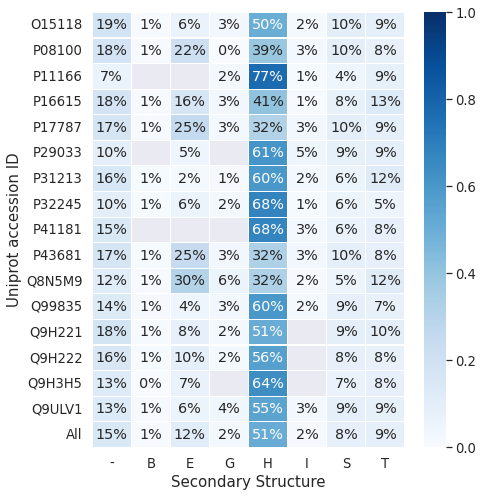

CPU times: user 7.44 s, sys: 1.79 s, total: 9.22 s
Wall time: 10.6 s


In [38]:
%%time
ss_content_df_dicts = []

for target in target_list:
    uniprot_id = target[0]
    pdb_id = target[3][0]    
    
    rosettapdb_file = os.path.join(pdb_prism_dir, uniprot_id[0:2], uniprot_id[2:4], uniprot_id[4:6], f'prism_pdb_XXX_{uniprot_id}-{pdb_id}.txt')
    rosettapf = read_prism(rosettapdb_file)
    rosettapf.dataframe = copy_wt_variants(rosettapf.dataframe, )
    rosettapf.dataframe['aa_ref'] = rosettapf.dataframe['variant'].apply(lambda x: [x[0]])
    rosettapf.dataframe['aa_var'] = rosettapf.dataframe['variant'].apply(lambda x: [x[-1]])
    rosettapf.dataframe['resi'] = rosettapf.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
    rosettapf.dataframe['n_mut'] = 1
    rosettapf.dataframe['tmp_resi_var'] = rosettapf.dataframe['variant'].apply(lambda x: x[-1])
    rosettapf.dataframe = rosettapf.dataframe[rosettapf.dataframe['tmp_resi_var']=='='].reset_index(drop=True).drop(columns=['tmp_resi_var'])
    rosettapf.dataframe['accession'] = uniprot_id
    ss_content_df_dicts.append(rosettapf.dataframe)
ss_content_df_dicts = pd.concat(ss_content_df_dicts)

ss_content_df_dicts['c'] = 1
df2 = pd.pivot_table(ss_content_df_dicts, columns=["SS"], index=["accession"], values='c', aggfunc=len, margins=True)
df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
df2.drop(columns=['All'], inplace=True)

with sns.axes_style("darkgrid"):
    f = plt.figure(figsize=(7,8))
    sns.set(font_scale = 1.2)
    sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
    plt.xlabel("Secondary Structure", size=15)
    plt.ylabel("Uniprot accession ID", size=15)
    filename = os.path.join(plots_dir, f'dataset_SS.svg')
    plt.savefig(filename, )
    plt.show()


### gemme seq counts

In [39]:
gemme_workdir = os.path.join(working_dir, 'gemme')
os.makedirs(gemme_workdir, exist_ok=True)
seq_count = check_gemme_seq(sorted(target_list))
seq_count

,accession,sequence_count
0,O15118,1486
1,P08100,1183
2,P11166,1772
3,P16615,1924
4,P17787,1789
5,P29033,1351
6,P31213,1177
7,P32245,1265
8,P41181,1326
9,P43681,1107


## Plots, stats & info on unfildered set

### functions

In [26]:
def calculate_AUC_error_single(control_df, nameA='rosetta;ddG', runs=1000):

    control_df1 = control_df.copy()
    control_df1 = control_df1.loc[~control_df1[nameA].isnull()]
    control_df1 = control_df1.dropna(subset = [nameA]).reset_index(drop=True)
    control_df1 = control_df1.dropna(subset = ['score']).reset_index(drop=True)
    
    if len(control_df1['score'].unique())>1:

        base_control_score1 = np.copy(control_df1['score'].values)
        base_test_score1 = control_df1[nameA].values
        base_auc1 = sklearn.metrics.roc_auc_score(base_control_score1, base_test_score1)
        fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score1, base_test_score1)

        results_rosetta = []
        i = 0

        size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
        size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
        if size_groupA < size_groupB:
            small_df = control_df.copy()
            small_df = small_df[small_df['score']==1].reset_index(drop=True)
            large_df = control_df.copy()
            large_df = large_df[large_df['score']==0].reset_index(drop=True)
            size = size_groupA
        else:
            small_df = control_df.copy()
            small_df = small_df[small_df['score']==0].reset_index(drop=True)
            large_df = control_df.copy()
            large_df = large_df[large_df['score']==1].reset_index(drop=True)
            size = size_groupB
        while i < runs:
            i += 1
            new_large_df = large_df.copy()
            new_large_df = new_large_df.sample(n=size)
            df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

            control_score = np.copy(df_subset['score'].values)
            test_score1 = df_subset[nameA].values
            auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
            results_rosetta.append(float(auc1))

        results_rosetta = np.array(results_rosetta)
        results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
        y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
        mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)


        return [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1]
    else:
        return [float("NaN"), float("NaN"), float("NaN"), float("NaN")]


In [27]:
def AUC_leaf1out(control_df, name='rosetta;ddG', nameprot='uniprot'):

    control_df_tmp = control_df.copy()
    control_df_tmp = control_df_tmp.loc[~control_df_tmp[name].isnull()]
    control_df_tmp = control_df_tmp.dropna(subset = [name]).reset_index(drop=True)
    control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)

    control_score = np.copy(control_df_tmp['score'].values)
    test_score1 = control_df_tmp[name].values
    if len(control_df_tmp['score'].unique())>1:
        base_auc = sklearn.metrics.roc_auc_score(control_score, test_score1)


        results_base = []
        for protein in control_df[nameprot].unique():
            control_df_tmp = control_df.copy()
            control_df_tmp = control_df_tmp.loc[control_df_tmp[nameprot]!=protein].reset_index(drop=True)
            control_df_tmp = control_df_tmp.loc[~control_df_tmp[name].isnull()]
            control_df_tmp = control_df_tmp.dropna(subset = [name]).reset_index(drop=True)
            control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)

            control_score = np.copy(control_df_tmp['score'].values)
            test_score1 = control_df_tmp[name].values
            if len(control_df_tmp['score'].unique())>1:
                auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
                results_base.append(float(auc1))    

        results = np.array(results_base)
        results = results[~np.isnan(results)]
        y_true = [float(base_auc)] * len(results)


        # Root Mean Squared Error (RMSE)
        RMSE = np.sqrt(mean_squared_error(y_true, results))
        # Mean Average Percent Error (MAPE)
        MAPerror = np.mean(np.abs((y_true - results) / y_true)) * 100 
        mse = mean_squared_error(results, y_true)
        MSE2 = np.sqrt(np.mean(results_base))

        return_dic = {
            'base_auc': base_auc, 
            'mse': mse, 
            'RMSE': RMSE, 
            'MAPerror': MAPerror, 
            'MSE2': MSE2, 
            'mean': np.mean(results_base), 
            'std': np.std(results_base)
        }
    else:
        return_dic = {
            'base_auc': float("NaN"), 
            'mse': float("NaN"), 
            'RMSE': float("NaN"), 
            'MAPerror': float("NaN"), 
            'MSE2': float("NaN"), 
            'mean': float("NaN"), 
            'std': float("NaN")
        }
    return return_dic


def ROC_adapted(control_df, target, region, title='', 
                        cutoff=gnomAD_cutoff_value, satu='', groupA=0, groupB=0, 
                        nameA='rosetta;ddG', nameB='gemme;score', runs=1000, leaf1out=True):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)
    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('false positive rate (1-specificity)', fontsize=19)
    ax.set_ylabel('true positive rate (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    
    control_df_tmp = control_df.copy()
    control_df_tmp = control_df_tmp.loc[~control_df_tmp[nameA].isnull()]
    control_df_tmp = control_df_tmp.dropna(subset = [nameA]).reset_index(drop=True)
    control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)
    control = np.copy(control_df_tmp['score'].values)
    test1 = control_df_tmp[nameA].values
    if leaf1out:
        auc_dic = AUC_leaf1out(control_df_tmp, name=nameA, nameprot='uniprot')
    else:
        
        auc_dic2 = calculate_AUC_error_single(control_df_tmp, nameA=nameA, runs=runs)
        auc_dic = {
            'base_auc': auc_dic2[0], 
            'mse': float("NaN"), 
            'RMSE': float("NaN"), 
            'MAPerror': float("NaN"), 
            'MSE2': float("NaN"), 
            'mean': auc_dic2[1], 
            'std': auc_dic2[2]
        }
    logger.info(f"ddG: {auc_dic}")
    if len(control_df_tmp['score'].unique())>1:
        roc_curve1 = sklearn.metrics.roc_curve(control, test1)

        groupA = len(control_df_tmp.loc[control_df_tmp['score']==1].reset_index(drop=True))
        groupB = len(control_df_tmp.loc[control_df_tmp['score']==0].reset_index(drop=True))
        plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (∆∆G): {auc_dic["base_auc"]:.2f}/{auc_dic["mean"]:.2f}'+r'$\pm$'+f'{auc_dic["std"]:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')
        fig.text(0.15, 0.8, f'Group A: {groupA}\nGroup B: {groupB}', fontsize=18)

#     y_test = np.copy(control_df['score'].values)
#     final_pred = control_df[nameA].values
#     print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
#     False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
#     False_pos_rate, True_pos_rate, threshold

#     acc = []
#     for thres in threshold:
#         y_pred = np.where(final_pred>thres,1,0)
#         acc.append(accuracy_score(y_test,y_pred,normalize=True))

#     acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
#     acc.columns = ['threshold','accuracy']
#     acc.sort_values(by="accuracy", ascending=False, inplace = True)
#     max_accuracy1 = acc['accuracy'].max()
#     cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()

    control_df_tmp = control_df.copy()
    control_df_tmp = control_df_tmp.loc[~control_df_tmp[nameB].isnull()].reset_index(drop=True)
    control_df_tmp = control_df_tmp.dropna(subset = [nameB]).reset_index(drop=True)
    control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)
    control = np.copy(control_df_tmp['score'].values)
    test2 = control_df_tmp[nameB].values
    if leaf1out:
        auc_dic = AUC_leaf1out(control_df_tmp, name=nameB, nameprot='uniprot')
    else:
        auc_dic2 = calculate_AUC_error_single(control_df_tmp, nameA=nameB, runs=runs)
        auc_dic = {
            'base_auc': auc_dic2[0], 
            'mse': float("NaN"), 
            'RMSE': float("NaN"), 
            'MAPerror': float("NaN"), 
            'MSE2': float("NaN"), 
            'mean': auc_dic2[1], 
            'std': auc_dic2[2]
        }
    logger.info(f"ddE: {auc_dic}")

    
    if len(control_df_tmp['score'].unique())>1:
        roc_curve2 = sklearn.metrics.roc_curve(control,test2)
        groupA = len(control_df_tmp.loc[control_df_tmp['score']==1].reset_index(drop=True))
        groupB = len(control_df_tmp.loc[control_df_tmp['score']==0].reset_index(drop=True))
        plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (∆∆E): {auc_dic["base_auc"]:.2f}/{auc_dic["mean"]:.2f}'+r'$\pm$'+f'{auc_dic["std"]:.2f}', linestyle='-', linewidth=3.5, color='#998ec3')
    #     plt.plot(roc_curve2[0],roc_curve2[1], label=f'AUC (∆∆E): {auc2:.2f}'+r'$\pm$'+f'{auc2_std:.2f}', linestyle='-', linewidth=3.5, color='#998ec3')
        fig.text(0.15, 0.73, f'Group A: {groupA}\nGroup B: {groupB}', fontsize=18)

#     y_test = np.copy(control_df['score'].values)
#     final_pred = control_df[nameB].values
#     print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
#     False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
#     False_pos_rate, True_pos_rate, threshold

#     acc = []
#     for thres in threshold:
#         y_pred = np.where(final_pred>thres,1,0)
#         acc.append(accuracy_score(y_test,y_pred,normalize=True))

#     acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
#     acc.columns = ['threshold','accuracy']
#     acc.sort_values(by="accuracy", ascending=False, inplace = True)
#     max_accuracy2 = acc['accuracy'].max()
#     cutoff2 = acc.loc[(acc['accuracy']==max_accuracy2), 'threshold'].mean()#.head()

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    if satu !='':
        satu = '_sat'
    plt.title(f'{title}', fontsize=18)
    filename = os.path.join(plots_dir, f'{region}.svg')
    plt.savefig(filename, )
    plt.show()
    return 0#auc_dic, max_accuracy1, cutoff1, max_accuracy2, cutoff2

### preps

In [38]:
%%time
nostruc, special, gemme, eres, negvar, splice = False, False, False, False, False, False
name_add='allFalse'
speci = True
# nostruc, special, gemme, eres, negvar, splice = True, False, False, False, False, False
# name_add='nostruc'
# speci = False
# nostruc, special, gemme, eres, negvar, splice = True, False, False, False, False, False
# name_add='nostruc'
# speci = True
# nostruc, special, gemme, eres, negvar, splice = False, True, False, False, False, False
# name_add='special'
# speci = False
# nostruc, special, gemme, eres, negvar, splice = True, True, False, False, False, False
# name_add='nostru_special'
# speci = True
# nostruc, special, gemme, eres, negvar, splice = False, False, True, False, False, False
# name_add='gemme'
# speci = False
# nostruc, special, gemme, eres, negvar, splice = True, True, True, False, False, False
# name_add='nostru_special_gemme'
# speci = True
# nostruc, special, gemme, eres, negvar, splice = False, False, False, True, False, False
# name_add='eres'
# speci = False
nostruc, special, gemme, eres, negvar, splice = True, True, True, True, False, False
name_add='nostru_special_gemme_eres'
speci = True


subfiltered_df_dicts2 = {}
non_subfiltered_df_dicts2 = {}
for target in target_list:
    target_uniprot = target[0]
    logger.info(f'#accession: {target_uniprot}')

    df = renamed_df_dicts[target_uniprot].copy()
    df_size = df['variant'].size
    logger.info(f"all in: {df_size}")
    groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
    groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
    benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")
    non_df = df.copy()

#     nostruc, special, gemme, eres, negvar, splice = True, True, True, True, False, False 

# filtering no structure
    if nostruc:
        df = df.dropna(subset=['rosetta;ddG', 'gemme;score'], how='any').reset_index(drop=True)
        logger.info(f"only gemme& rosetta coverage:{df['variant'].size}, {df['variant'].size/df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

# filter out non-native AA like SS-bonds, modifications    
    if special:
        special_group = ['mod', 'carbohyd', 'disulfid', 'metal', 'lipid']
        special_group = ['mod', 'disulfid', 'lipid']
        special_group = ['disulfid', 'lipid']
        df = df.loc[~(df['special'].isin(special_group))].reset_index(drop=True)
        df = df.loc[~(df['special_detail']=='N6-(retinylidene)lysine|1')].reset_index(drop=True)
        df = df.loc[((df['special']=='') | (df['special'].isnull()))].reset_index(drop=True)
        without_special = df['variant'].size
        logger.info(f"without special: {df['variant'].size}, {df['variant'].size/df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

# filter out variants with low sequence coverage & no structural resolution
    if gemme:
        gemme_coverage_cutoff = 50
        df = df.loc[df['gemme;coverage_count'] >= gemme_coverage_cutoff].reset_index(drop=True)
        logger.info(f"without ddE coverage lower {gemme_coverage_cutoff}:{df['variant'].size}, {(without_special - df['variant'].size)/20}, {df['variant'].size/df_size}, {df['gemme;total'].max()}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")


# filter out strongly positive E_res
    if eres:
        E_res_cutoff = 0.0
        df = df.loc[df['E_res'] <= E_res_cutoff].reset_index(drop=True)
        logger.info(f"without ddG with E_res larger than {E_res_cutoff}:{df['variant'].size}, {df['variant'].size/df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

# filter out variants with >15 neg variants per position
    if negvar:
        negvarcount_cutoff = 15
        df = df.loc[df['negative_count'] <= negvarcount_cutoff].reset_index(drop=True)
        logger.info(f"without ddG with negative variants per position larger than {negvarcount_cutoff}:{df['variant'].size/df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

# filter out splice variants > 0.5
    if splice:
        maxdelta_spliceai_column = [column for column in df.columns if column.startswith('spliceai;maxdelta')][0]
        splice_cutoff = 0.5
        df = df.loc[~(df[maxdelta_spliceai_column] > splice_cutoff)].reset_index(drop=True)
        logger.info(f"without splice variants with threshold smaller than {splice_cutoff}:{df['variant'].size/df_size}")
        groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
        groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
        benign = len(df[df['clinvar;significance_all']=='benign'].reset_index(drop=True)['variant'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}\nbenign: {benign}")

    groupA = len(df[df['score']==1].reset_index(drop=True)['variant'])
    groupB = len(df[df['score']==0].reset_index(drop=True)['variant'])
    logger.info(f"Total: group A={groupA}, group B={groupB}")
    if groupA+groupB > 0:
        logger.info(f'Write out {target_uniprot}')
        subfiltered_df_dicts2[target_uniprot] = df.copy()
    non_df = non_df.loc[~non_df['variant'].isin(df['variant'].unique())]
    non_subfiltered_df_dicts2[target_uniprot] = non_df.copy()
len(subfiltered_df_dicts2)


INFO:#accession: O15118
INFO:all in: 24282
INFO:groupA: 60
groupB: 36
benign: 13
INFO:only gemme& rosetta coverage:774, 0.03187546330615271
INFO:groupA: 57
groupB: 21
benign: 8
INFO:without special: 753, 0.031010625154435385
INFO:groupA: 56
groupB: 20
benign: 8
INFO:without ddE coverage lower 50:753, 0.0, 0.031010625154435385, 1486
INFO:groupA: 56
groupB: 20
benign: 8
INFO:without ddG with E_res larger than 0.0:578, 0.023803640556791038
INFO:groupA: 44
groupB: 12
benign: 5
INFO:Total: group A=44, group B=12
INFO:Write out O15118
INFO:#accession: P08100
INFO:all in: 6612
INFO:groupA: 67
groupB: 10
benign: 2
INFO:only gemme& rosetta coverage:338, 0.051119177253478525
INFO:groupA: 61
groupB: 9
benign: 2
INFO:without special: 325, 0.04915305505142166
INFO:groupA: 50
groupB: 9
benign: 2
INFO:without ddE coverage lower 50:317, 0.4, 0.04794313369630974, 1183
INFO:groupA: 50
groupB: 9
benign: 2
INFO:without ddG with E_res larger than 0.0:255, 0.03856624319419238
INFO:groupA: 41
groupB: 6
benig

CPU times: user 1.21 s, sys: 116 ms, total: 1.32 s
Wall time: 1.23 s


15

### AUC

INFO:allFalse
INFO:O15118
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 13
INFO:1.0    60
0.0    36
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.6842105263157895, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0034787056155326456, 'std': 0.05898054641563749}
INFO:ddE: {'base_auc': 0.8722222222222222, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0006064512364730985, 'std': 0.02461471302529205}


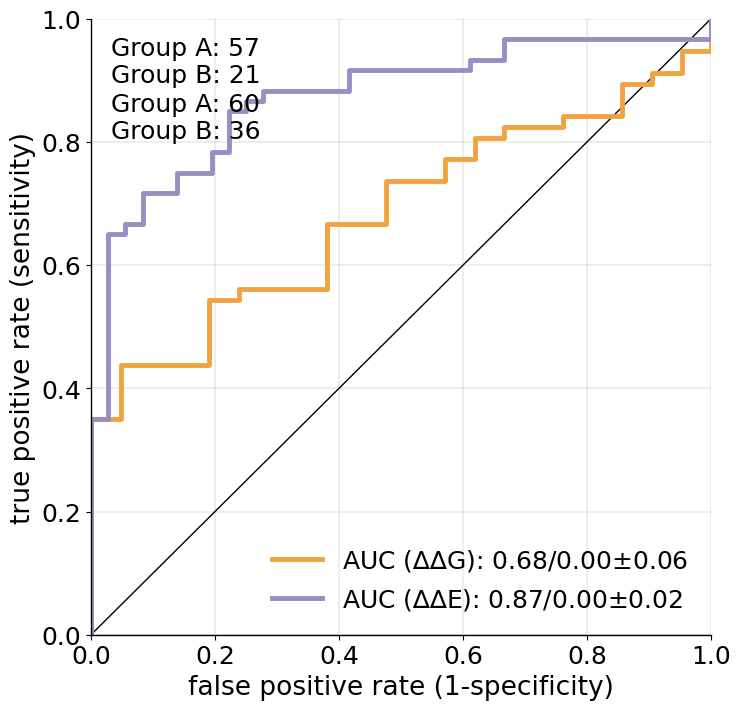

INFO:P08100
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 2
INFO:1.0    67
0.0    10
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.6994535519125683, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.011434773558100953, 'std': 0.10687157316346749}
INFO:ddE: {'base_auc': 0.7119402985074625, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.01029212893740254, 'std': 0.1013869340694352}


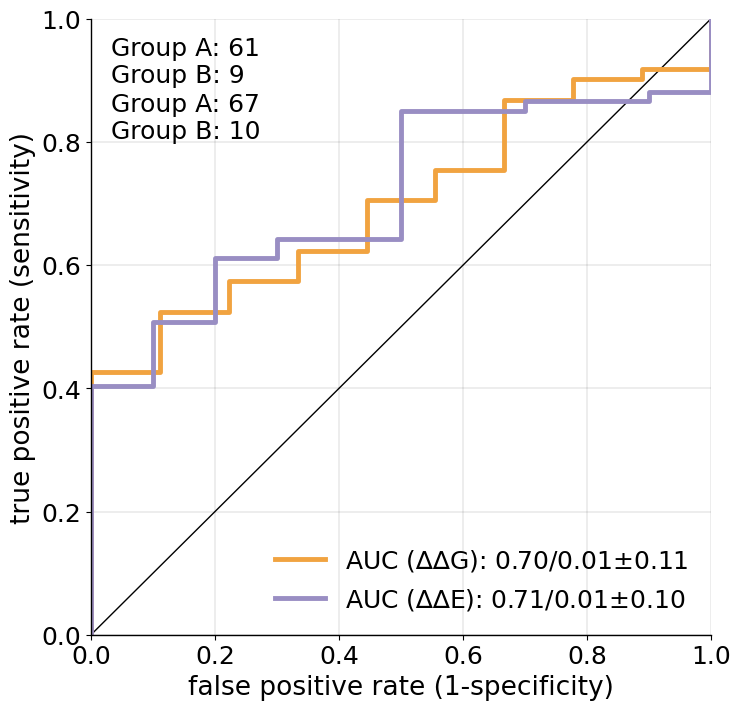

INFO:P11166
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 4
INFO:1.0    56
0.0     9
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.6397058823529412, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.017992630163278546, 'std': 0.1341365034675498}
INFO:ddE: {'base_auc': 0.8928571428571429, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.003281516630429036, 'std': 0.05727106602648842}


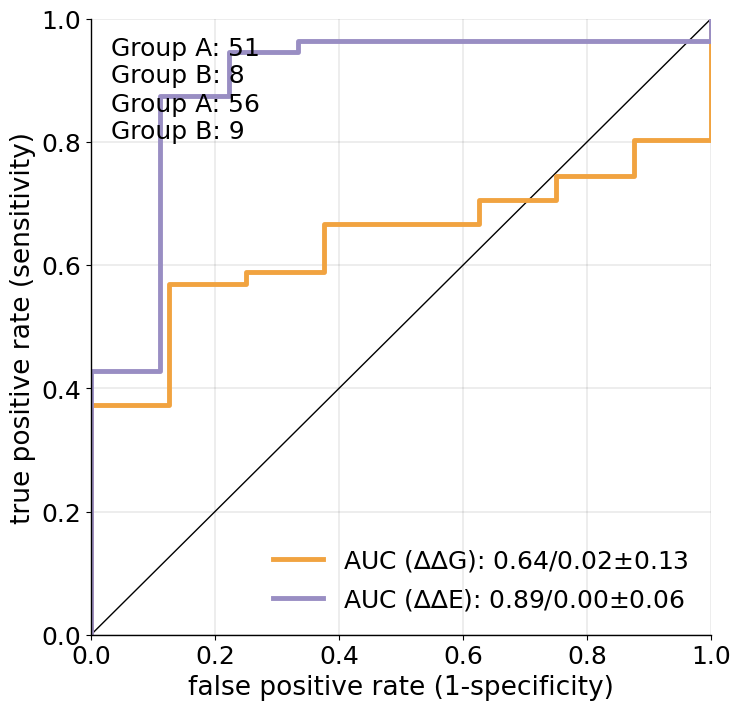

INFO:P16615
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 7
INFO:1.0    12
0.0     9
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.7777777777777778, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.00700462962962963, 'std': 0.08367107484329396}
INFO:ddE: {'base_auc': 1.0, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0, 'std': 0.0}


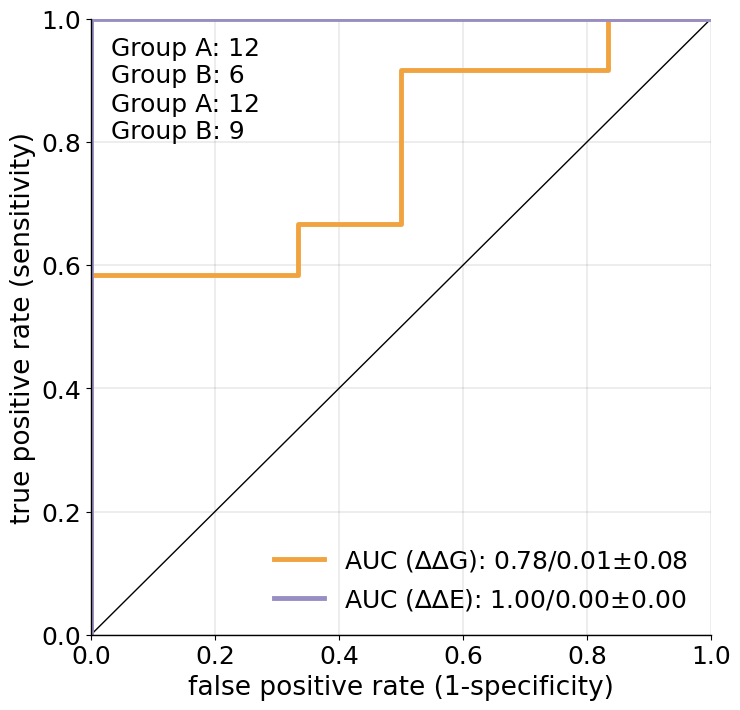

INFO:P17787
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 12
INFO:0.0    16
1.0     3
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.8571428571428572, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.013342907533383717, 'std': 0.11544866851431586}
INFO:ddE: {'base_auc': 0.9375, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.009461805555555546, 'std': 0.09726024653246333}


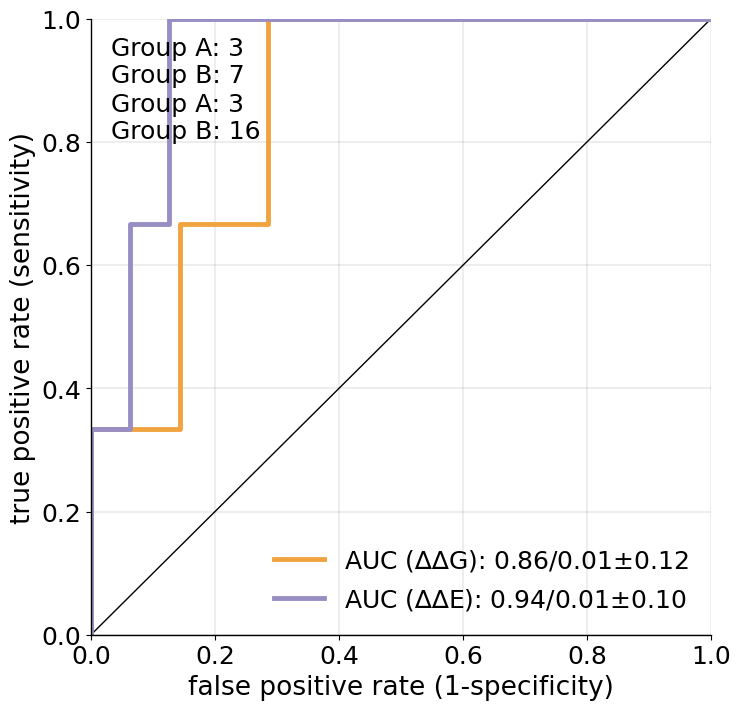

INFO:P29033
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 8
INFO:1.0    60
0.0    23
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.461244019138756, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.003688545353460029, 'std': 0.06071790920036247}
INFO:ddE: {'base_auc': 0.8942028985507245, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0005664684985799477, 'std': 0.02373511364620751}


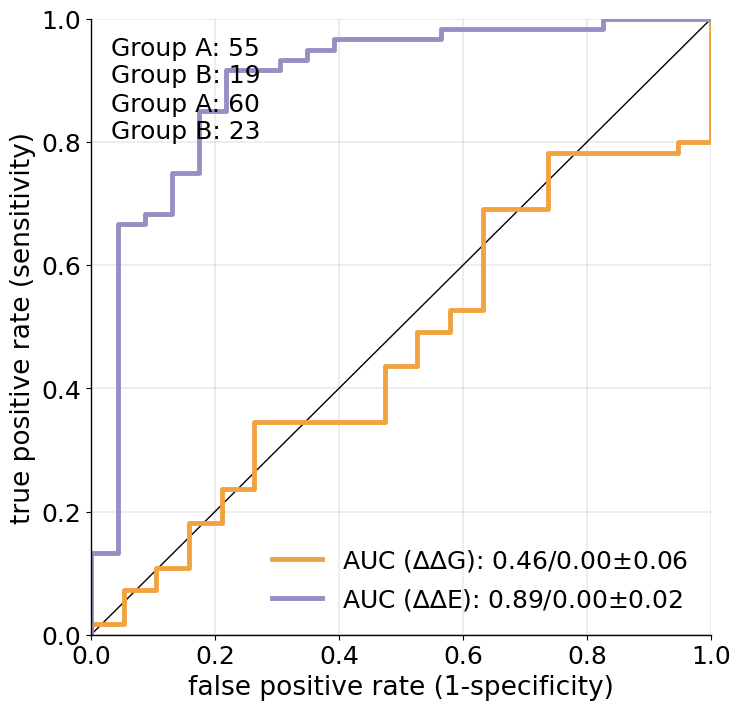

INFO:P31213
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 5
INFO:1.0    21
0.0    11
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.6375, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.004831201171875, 'std': 0.069505154864473}
INFO:ddE: {'base_auc': 0.8571428571428571, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.002666361866104271, 'std': 0.05163564406224475}


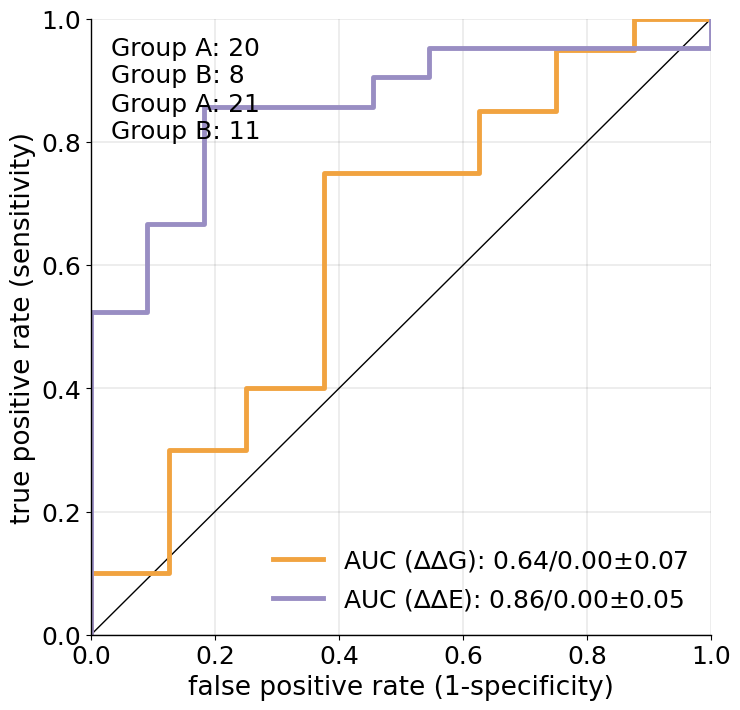

INFO:P32245
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 2
INFO:1.0    12
0.0    11
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.6250000000000001, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0027982000000000003, 'std': 0.05273888508491625}
INFO:ddE: {'base_auc': 0.9621212121212122, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 6.917408495169638e-05, 'std': 0.00830146674466011}


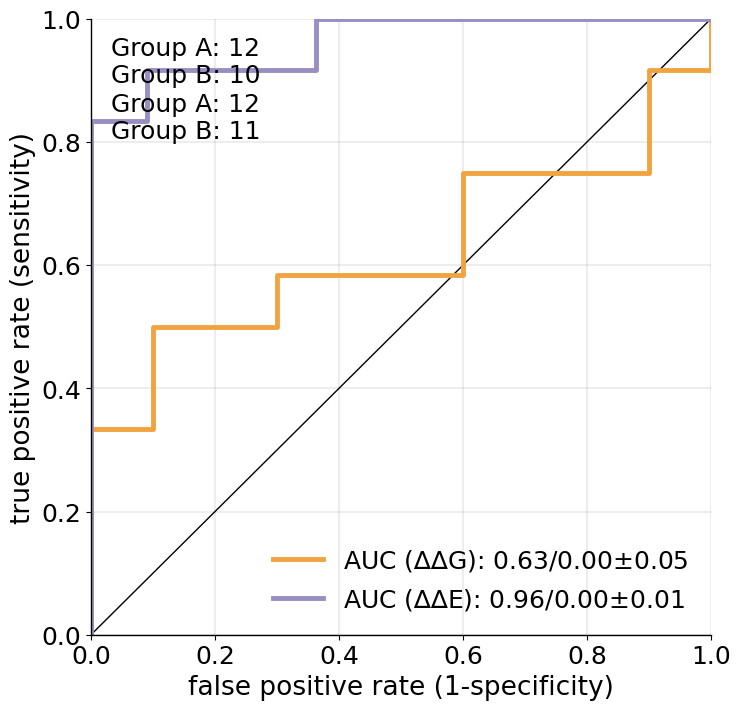

INFO:P41181
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 1
INFO:1.0    10
0.0     2
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.7222222222222222, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.07252854938271605, 'std': 0.26856551807706064}
INFO:ddE: {'base_auc': 0.75, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.068875, 'std': 0.26242856170775314}


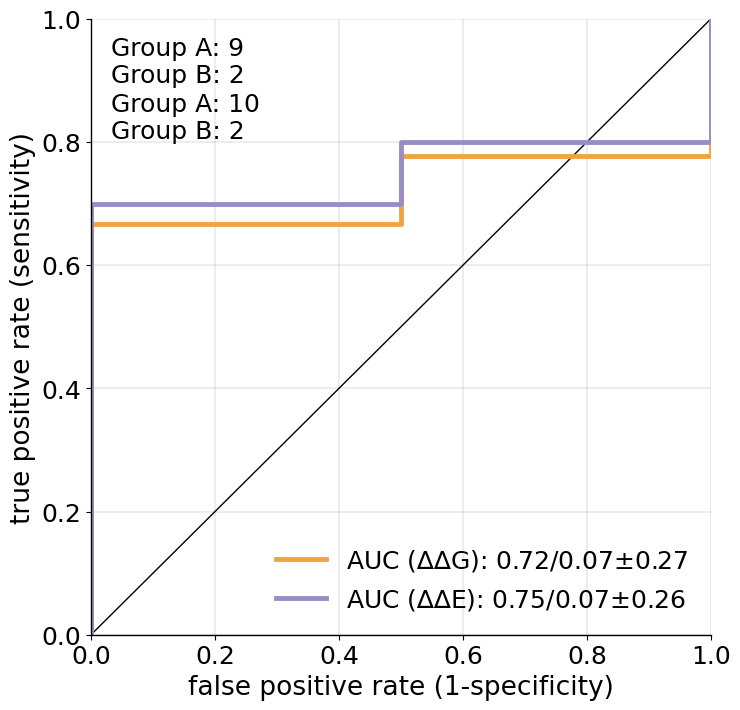

INFO:P43681
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 32
INFO:0.0    47
1.0     3
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.3333333333333333, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0, 'std': 5.551115123125783e-17}
INFO:ddE: {'base_auc': 0.9787234042553192, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0041608626885524394, 'std': 0.06442135601732633}


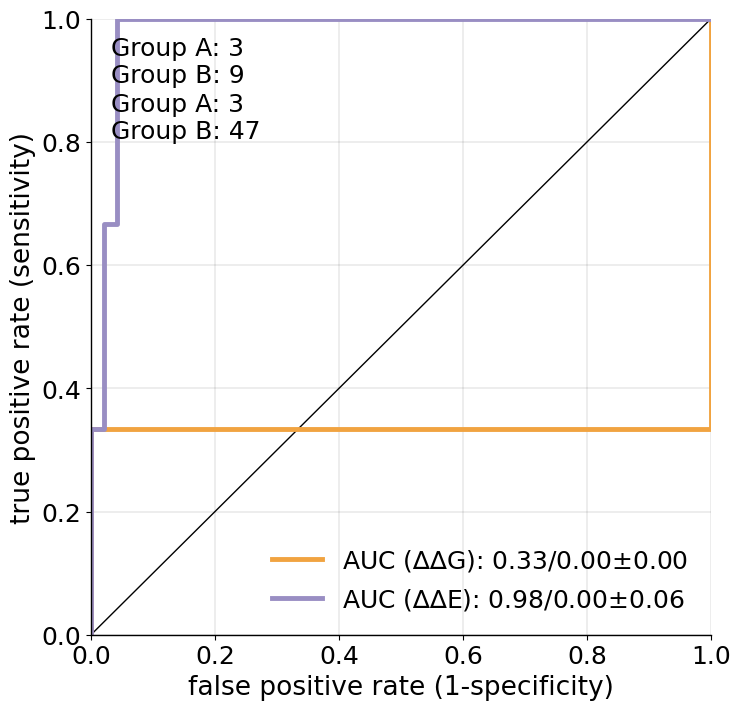

INFO:Q8N5M9
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 3
INFO:1.0    5
0.0    4
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.4, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.01090859375, 'std': 0.1044186099014443}
INFO:ddE: {'base_auc': 0.95, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0006109374999999999, 'std': 0.024714305068117937}


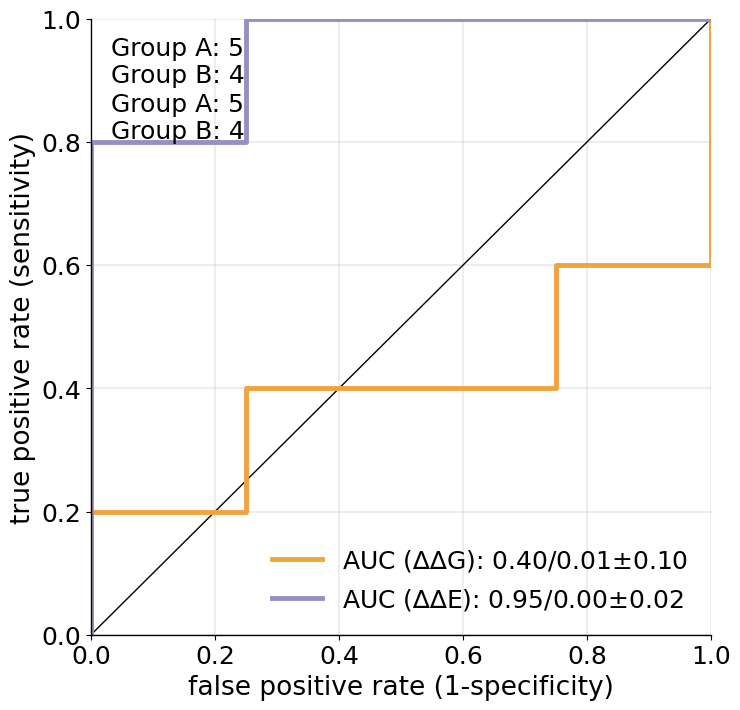

INFO:Q99835
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 6
INFO:0.0    25
1.0     1
Name: score, dtype: int64
INFO:ddG: {'base_auc': 1.0, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0, 'std': 0.0}
INFO:ddE: {'base_auc': 0.88, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.11852, 'std': 0.3438473498516456}


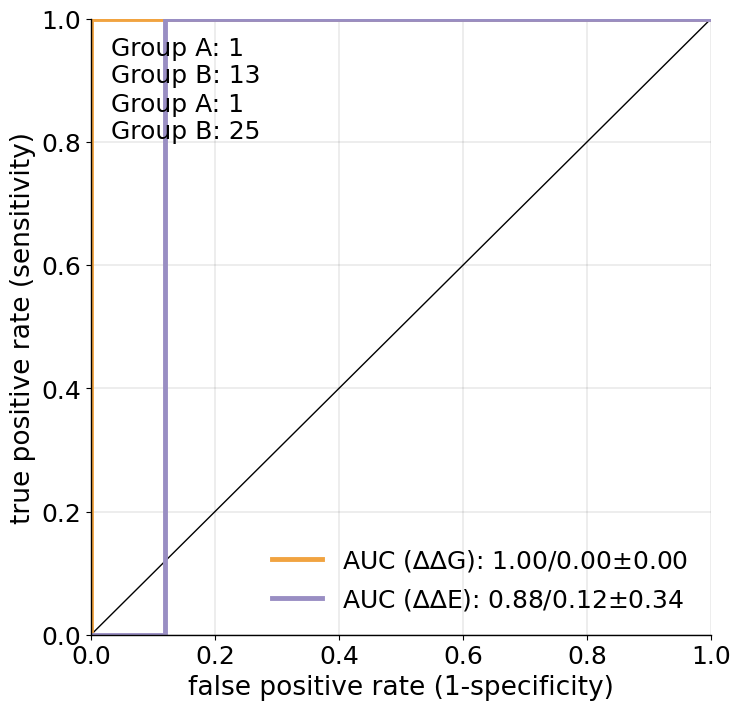

INFO:Q9H221
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 11
INFO:0.0    35
1.0     1
Name: score, dtype: int64
INFO:ddG: {'base_auc': 1.0, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0, 'std': 0.0}
INFO:ddE: {'base_auc': 0.6857142857142857, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.21094693877551018, 'std': 0.45912525524087644}


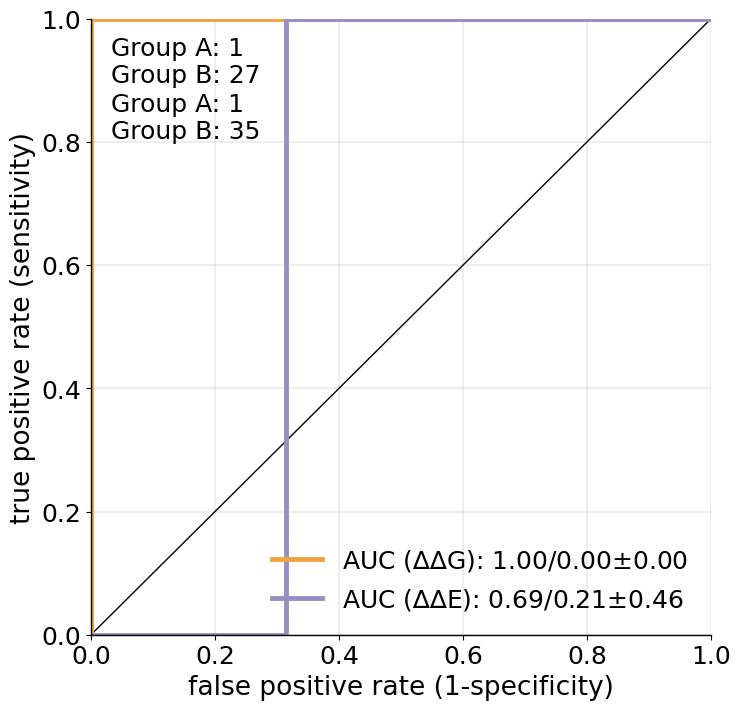

INFO:Q9H222
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 9
INFO:0.0    27
1.0     1
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.6818181818181819, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.2165123966942149, 'std': 0.4653074252577537}
INFO:ddE: {'base_auc': 0.5, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0, 'std': 0.0}


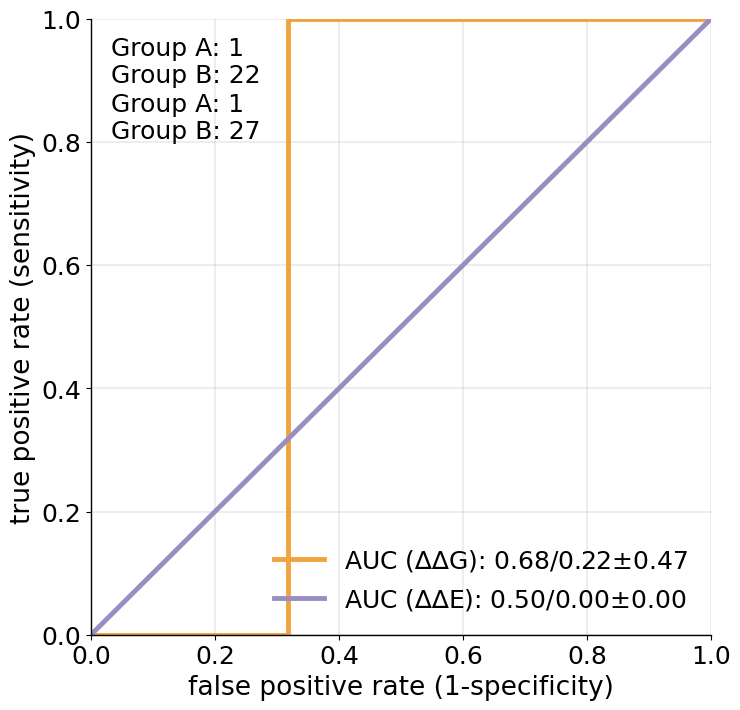

INFO:Q9H3H5
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 1
INFO:1.0    7
0.0    5
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.5357142857142857, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.021901626275510202, 'std': 0.14798917823611293}
INFO:ddE: {'base_auc': 0.9428571428571428, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.001263020408163264, 'std': 0.03551675660867696}


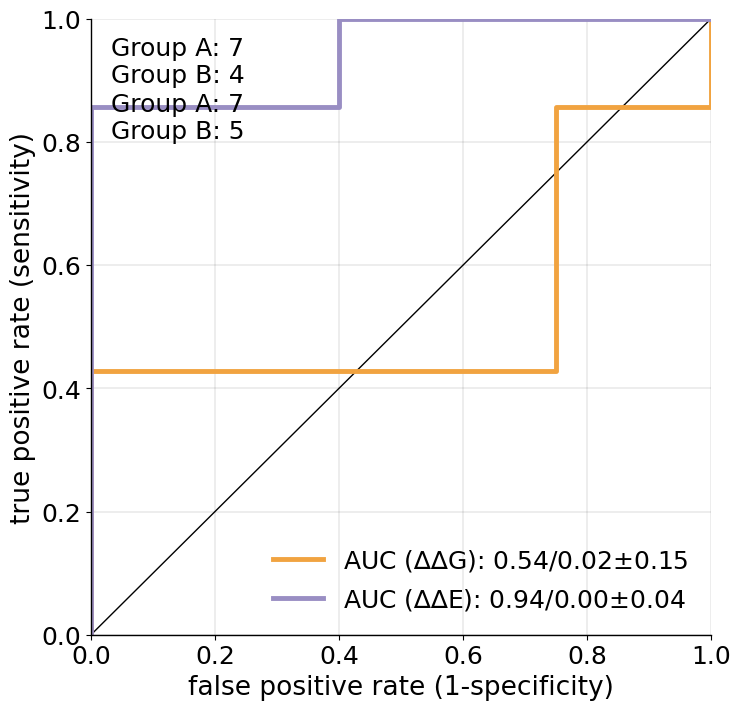

INFO:Q9ULV1
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 6
INFO:0.0    13
1.0     5
Name: score, dtype: int64
INFO:ddG: {'base_auc': 0.5625, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.0, 'std': 0.0}
INFO:ddE: {'base_auc': 0.9384615384615385, 'mse': nan, 'RMSE': nan, 'MAPerror': nan, 'MSE2': nan, 'mean': 0.002792520710059172, 'std': 0.052818178688781}


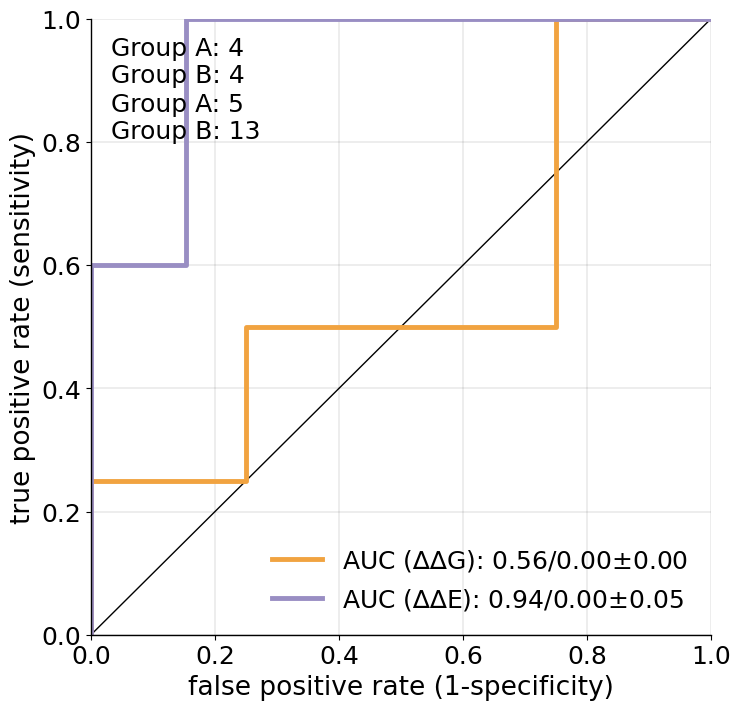

INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 122


In [ ]:
add_name = f"{name_add}"
logger.info(add_name)
if speci==True:
    target_dic_here = subfiltered_df_dicts2
else:
    target_dic_here = non_subfiltered_df_dicts2

region = 'all'
# add_name = f"non_{name_add}"
# target_dic_here = non_subfiltered_df_dicts2#non_subfiltered_df_dicts2#subfiltered_df_dicts2#subfiltered_df_dicts


gemme_name = 'gemme;score'
all_tmp = []
all_execpt_tmp = []
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    logger.info(target_uniprot)
    tmp_energy['uniprot'] = target_uniprot
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    all_tmp.append(tmp_energy)
    
    logger.info(region)
    tmp = tmp_energy.copy()
    title = ''
    if region != 'all':
        title = region
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp2 = tmp.copy()

    for cutoff_value in [cutoff_value]:
        logger.info(cutoff_value)
#         print(cutoff_value)
        control_df = tmp2.copy()
        
      #  control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
      #  control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        
        logger.info(f"bengin: {len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']])}")
        control_score = np.copy(control_df['score'].values)
#         control_score2 = np.copy(control_df2['score'].values)
#         print(control_df['score'].unique())
        logger.info(control_df['score'].value_counts())
        if 0 in control_df['score'].unique() and 1 in control_df['score'].unique():
#             test_score3 = control_df2['rosetta;ddG'].values
#             test_score1 = control_df['rosetta;ddG'].values
#             test_score2 = control_df[gemme_name].values
#             groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
#             groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
#             groupA2 = len(control_df2[control_df2['score']==1].reset_index(drop=True)['score'])
#             groupB2 = len(control_df2[control_df2['score']==0].reset_index(drop=True)['score'])
#             logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
            satu = ''

            auc_dici = ROC_adapted(control_df, 'all', f"Fig2add-B-{target_uniprot}_{add_name}", 
                                   cutoff=cutoff_value, satu=satu, groupA=groupA, 
                                   groupB=groupB, nameB=gemme_name, title=title, leaf1out=False)
all_tmp_backo = pd.concat(all_tmp)
all_tmp = all_tmp_backo.copy()
for region in ['all']:
    logger.info(region)
    tmp = all_tmp.copy()
    title = ''
    if region != 'all':
        title = region
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp2 = tmp.copy()

    for cutoff_value in [cutoff_value]:
        logger.info(cutoff_value)
#         print(cutoff_value)
        control_df = tmp2.copy()
        
      #  control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
      #  control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        
        logger.info(f"bengin: {len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']])}")
        control_score = np.copy(control_df['score'].values)
#         control_score2 = np.copy(control_df2['score'].values)
        if len(list(set(control_score))) > 1:
#             test_score3 = control_df2['rosetta;ddG'].values
#             test_score1 = control_df['rosetta;ddG'].values
#             test_score2 = control_df[gemme_name].values
#             groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
#             groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
#             groupA2 = len(control_df2[control_df2['score']==1].reset_index(drop=True)['score'])
#             groupB2 = len(control_df2[control_df2['score']==0].reset_index(drop=True)['score'])
#             logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
            satu = ''

            auc_dici = ROC_adapted(control_df, 'all', f"Fig2add-B_{add_name}", 
                                   cutoff=cutoff_value, satu=satu, groupA=groupA, 
                                   groupB=groupB, nameB=gemme_name, title=title)


INFO:nostru_special_gemme_eres
INFO:O15118
INFO:P08100
INFO:P11166
INFO:P16615
INFO:P17787
INFO:P29033
INFO:P31213
INFO:P32245
INFO:P41181
INFO:P43681
INFO:Q8N5M9
INFO:Q99835
INFO:Q9H221
INFO:Q9H3H5
INFO:Q9ULV1
INFO:all
INFO:9.931568854324432e-05
INFO:bengin: 42


[nan  0.  1.]
[nan  0.  1.]
[0.666751012145749, 0.00043958488560723015, 0.019528826855918602, array([16.    , 15.    , 13.3682, 13.2288, 12.584 , 12.4602, 12.225 ,
       12.1742, 10.7494, 10.571 , 10.395 ,  9.94  ,  9.621 ,  9.4882,
        9.439 ,  9.3568,  9.036 ,  8.9362,  8.7482,  8.6008,  7.7234,
        7.6246,  7.414 ,  7.326 ,  7.2638,  7.263 ,  6.965 ,  6.6262,
        6.393 ,  6.349 ,  6.3326,  6.2504,  5.809 ,  5.801 ,  5.774 ,
        5.709 ,  5.6662,  5.582 ,  5.2794,  5.2522,  4.8418,  4.8296,
        4.5922,  4.591 ,  4.3296,  4.186 ,  3.7548,  3.626 ,  3.578 ,
        3.3586,  3.1848,  1.0674,  0.944 ,  0.919 ,  0.7336,  0.695 ,
        0.6704,  0.5976,  0.508 ,  0.4196,  0.4184,  0.3948,  0.301 ,
        0.212 ,  0.1298,  0.056 , -0.0966, -0.134 , -0.2516, -0.522 ,
       -0.7508, -0.9242, -0.9752, -1.0782, -1.158 , -1.3884, -1.555 ,
       -1.581 , -1.618 , -1.633 , -1.69  , -2.2012, -2.2846, -3.01  ,
       -3.041 , -3.1622, -3.358 , -3.4358, -3.66  , -4.0412, -4.46

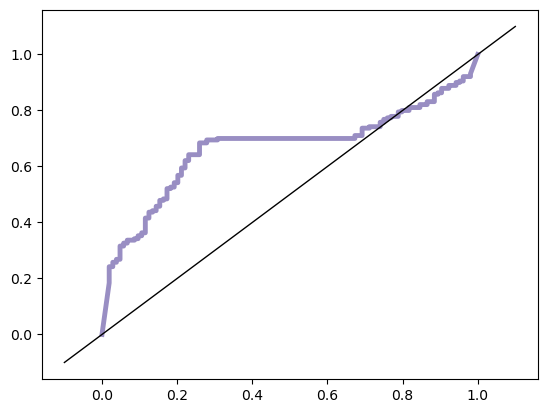

In [91]:
add_name = f"{name_add}"
logger.info(add_name)
if speci==True:
    target_dic_here = subfiltered_df_dicts2
else:
    target_dic_here = non_subfiltered_df_dicts2

region = 'all'
# add_name = f"non_{name_add}"
# target_dic_here = non_subfiltered_df_dicts2#non_subfiltered_df_dicts2#subfiltered_df_dicts2#subfiltered_df_dicts


gemme_name = 'gemme;score'
all_tmp = []
all_execpt_tmp = []
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    logger.info(target_uniprot)
    tmp_energy['uniprot'] = target_uniprot
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    all_tmp.append(tmp_energy)

all_tmp_backo = pd.concat(all_tmp)
all_tmp = all_tmp_backo.copy()
for region in ['all']:
    logger.info(region)
    tmp = all_tmp.copy()
    title = ''
    if region != 'all':
        title = region
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp2 = tmp.copy()

    for cutoff_value in [cutoff_value]:
        logger.info(cutoff_value)
#         print(cutoff_value)
        control_df = tmp2.copy()
        
      #  control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
      #  control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        
        logger.info(f"bengin: {len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']])}")
        control_score = np.copy(control_df['score'].values)
#         control_score2 = np.copy(control_df2['score'].values)
        if len(list(set(control_score))) > 1:
#             test_score3 = control_df2['rosetta;ddG'].values
#             test_score1 = control_df['rosetta;ddG'].values
#             test_score2 = control_df[gemme_name].values
#             groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
#             groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
#             groupA2 = len(control_df2[control_df2['score']==1].reset_index(drop=True)['score'])
#             groupB2 = len(control_df2[control_df2['score']==0].reset_index(drop=True)['score'])
#             logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
            satu = ''
        
        
        
        
        
        
        

            target = 'all'
            region = f"Fig2add-B_{add_name}"
            title = title
            cutoff=cutoff_value
            satu=satu
            groupA=groupA
            groupB=groupB
            nameA='rosetta;ddG'
            nameB=gemme_name
            runs=1000
            leaf1out=True

            control_df_tmp = control_df.copy()
            control_df_tmp.loc[(control_df_tmp[nameA]<-5), nameA] = -5
            control_df_tmp.loc[(control_df_tmp[nameA]>15), nameA] = 15
            control_df_tmp = control_df_tmp.loc[~control_df_tmp[nameA].isnull()]
            control_df_tmp = control_df_tmp.dropna(subset = [nameA]).reset_index(drop=True)
            
#             control_df_tmp[nameA] = control_df_tmp[nameA].apply(lambda x: x * (-3) if x < -1.5 else x)
            print(control_df_tmp['score'].unique())
            control_df_tmp = control_df_tmp[~((control_df_tmp['score'] == 1) & (control_df_tmp[nameA] >1) & (control_df_tmp[nameA] <3))].reset_index(drop=True)
            print(control_df_tmp['score'].unique())
            
            control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)
            control = np.copy(control_df_tmp['score'].values)
            test1 = control_df_tmp[nameA].values
#             if leaf1out:
#                 auc_dic = AUC_leaf1out(control_df_tmp, name=nameA, nameprot='uniprot')
#             else:

#                 auc_dic2 = calculate_AUC_error_single(control_df_tmp, nameA=nameA, runs=runs)
#                 auc_dic = {
#                     'base_auc': auc_dic2[0], 
#                     'mse': float("NaN"), 
#                     'RMSE': float("NaN"), 
#                     'MAPerror': float("NaN"), 
#                     'MSE2': float("NaN"), 
#                     'mean': auc_dic2[1], 
#                     'std': auc_dic2[2]
#                 }
#             logger.info(f"ddG: {auc_dic}")
            if len(control_df_tmp['score'].unique())>1:
                roc_curve1 = sklearn.metrics.roc_curve(control, test1)
                plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (∆∆G)', linestyle='-', linewidth=3.5, color='#998ec3')
                plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
                auc_dic2 = calculate_AUC_error_single(control_df_tmp, nameA=nameA, runs=10)
                print(auc_dic2)

                groupA = len(control_df_tmp.loc[control_df_tmp['score']==1].reset_index(drop=True))
                groupB = len(control_df_tmp.loc[control_df_tmp['score']==0].reset_index(drop=True))

        #     y_test = np.copy(control_df['score'].values)
        #     final_pred = control_df[nameA].values
        #     print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
        #     False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
        #     False_pos_rate, True_pos_rate, threshold

        #     acc = []
        #     for thres in threshold:
        #         y_pred = np.where(final_pred>thres,1,0)
        #         acc.append(accuracy_score(y_test,y_pred,normalize=True))

        #     acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
        #     acc.columns = ['threshold','accuracy']
        #     acc.sort_values(by="accuracy", ascending=False, inplace = True)
        #     max_accuracy1 = acc['accuracy'].max()
        #     cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()

            control_df_tmp = control_df.copy()
            control_df_tmp = control_df_tmp.loc[~control_df_tmp[nameB].isnull()].reset_index(drop=True)
            control_df_tmp = control_df_tmp.dropna(subset = [nameB]).reset_index(drop=True)
            control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)
            control = np.copy(control_df_tmp['score'].values)
            test2 = control_df_tmp[nameB].values
#             if leaf1out:
#                 auc_dic = AUC_leaf1out(control_df_tmp, name=nameB, nameprot='uniprot')
#             else:
#                 auc_dic2 = calculate_AUC_error_single(control_df_tmp, nameA=nameB, runs=runs)
#                 auc_dic = {
#                     'base_auc': auc_dic2[0], 
#                     'mse': float("NaN"), 
#                     'RMSE': float("NaN"), 
#                     'MAPerror': float("NaN"), 
#                     'MSE2': float("NaN"), 
#                     'mean': auc_dic2[1], 
#                     'std': auc_dic2[2]
#                 }
#             logger.info(f"ddE: {auc_dic}")


            if len(control_df_tmp['score'].unique())>1:
                roc_curve2 = sklearn.metrics.roc_curve(control,test2)
                groupA = len(control_df_tmp.loc[control_df_tmp['score']==1].reset_index(drop=True))
                groupB = len(control_df_tmp.loc[control_df_tmp['score']==0].reset_index(drop=True))

        #     y_test = np.copy(control_df['score'].values)
        #     final_pred = control_df[nameB].values
        #     print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
        #     False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
        #     False_pos_rate, True_pos_rate, threshold

        #     acc = []
        #     for thres in threshold:
        #         y_pred = np.where(final_pred>thres,1,0)
        #         acc.append(accuracy_score(y_test,y_pred,normalize=True))

        #     acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
        #     acc.columns = ['threshold','accuracy']
        #     acc.sort_values(by="accuracy", ascending=False, inplace = True)
        #     max_accuracy2 = acc['accuracy'].max()
        #     cutoff2 = acc.loc[(acc['accuracy']==max_accuracy2), 'threshold'].mean()#.head()

#             return 0#auc_dic, max_accuracy1, cutoff1, max_accuracy2, cutoff2
        

In [88]:
ddg_roc_df = pd.DataFrame(data=np.transpose(roc_curve1), columns=['fpr', 'tpr', 'thresholds'])
ddg_roc_df['value'] = 'ddg'
dde_roc_df = pd.DataFrame(data=np.transpose(roc_curve2), columns=['fpr', 'tpr', 'thresholds'])
dde_roc_df['value'] = 'dde'
roc_df = pd.concat([ddg_roc_df, dde_roc_df], ignore_index=False, join='outer', axis=0)
roc_df.sort_values(by=['fpr', 'tpr'])


,fpr,tpr,thresholds,value
0,0.000000,0.000000,16.000000,ddg
0,0.000000,0.000000,2.000000,dde
1,0.000000,0.004545,1.000000,dde
2,0.000000,0.150000,0.946869,dde
3,0.009615,0.150000,0.943972,dde
...,...,...,...,...
107,0.980769,0.990909,0.043871,dde
108,0.980769,0.995455,0.038839,dde
109,1.000000,0.995455,0.017379,dde
119,1.000000,1.000000,-5.000000,ddg


In [89]:
roc_df.loc[(roc_df['value']=='ddg') & (roc_df['tpr']> 0.55) & (roc_df['tpr']< 0.75)]

,fpr,tpr,thresholds,value
44,0.230769,0.554545,4.3296,ddg
45,0.259615,0.554545,4.1860,ddg
46,0.259615,0.590909,3.7548,ddg
47,0.278846,0.590909,3.6260,ddg
48,0.278846,0.600000,3.5780,ddg
49,0.307692,0.600000,3.3586,ddg
50,0.307692,0.604545,3.1848,ddg
51,0.317308,0.604545,2.8860,ddg
52,0.317308,0.609091,2.8792,ddg
53,0.346154,0.609091,2.7532,ddg


## Plotting combined datasets

In [32]:
# general settings:
except_uniprot_list = ['P29033', 'P43681', 'Q8N5M9'] # to check if a few uniprots do affect the cutoff
key = 'all' # for cutoff choice in ddG-ddE plots
maxdelta_spliceai_column_global_name = 'maxdelta_spliceai'
cutoff_value = gnomAD_cutoff_value
gemme_name = 'gemme;score'


### ∆∆G and ∆∆E cutoffs

#### on total

In [33]:
%%time
cutoff_value = gnomAD_cutoff_value
gemme_name = 'gemme;score'
all_tmp = []
all_aucs = {}
all_vals_cat = {}
all_execpt_tmp = []
all_execpt_aucs = {}
all_execpt_vals_cat = {}
target_dic_here = subfiltered_df_dicts

for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['uniprot;ID'] = target_uniprot
    if not target_uniprot in except_uniprot_list:
        all_execpt_tmp.append(tmp_energy)
    all_tmp.append(tmp_energy)
    
    control_df = tmp_energy.copy()
    control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
    control_score = np.copy(control_df['score'].values)
    if len(list(set(control_score))) > 1:
        auc_dici = cutoff_checks(control_df, nameB=gemme_name)
        all_aucs[target_uniprot]=auc_dici
        auc_dici = return_variant_in_cat(control_df, nameB=gemme_name, cutoffA=auc_dici[4], cutoffB=auc_dici[5])
        all_vals_cat[target_uniprot]=auc_dici
        logger.info(f"{target_uniprot} GroupA (cutoffA:{auc_dici[8]}, cutoffB:{auc_dici[9]}):: Q1: {len(auc_dici[0])}, Q2: {len(auc_dici[1])}, Q3: {len(auc_dici[2])}, Q4: {len(auc_dici[3])}")
        logger.info(f"{target_uniprot} GroupB (cutoffA:{auc_dici[8]}, cutoffB:{auc_dici[9]}):: Q1: {len(auc_dici[4])}, Q2: {len(auc_dici[5])}, Q3: {len(auc_dici[6])}, Q4: {len(auc_dici[7])}")
        
all_tmp = pd.concat(all_tmp)
all_execpt_tmp = pd.concat(all_execpt_tmp)
for region in ['all', ]:
    logger.info(region)
    tmp = all_tmp.copy()
    tmp2 = all_execpt_tmp.copy()
    if region != 'all':
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp2 = tmp2[(tmp2['uniprot;regions_all']==region)].reset_index(drop=True)

    for cutoff_value in [gnomAD_cutoff_value]:
        logger.info(cutoff_value)
        print(cutoff_value)
        control_df = tmp.copy()
        control_df2 = tmp2.copy()
        control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
        control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        control_score = np.copy(control_df2['score'].values)
        if len(list(set(control_score))) > 1:
            if region == 'all':
                auc_dici = cutoff_checks(control_df, nameB=gemme_name)
                all_aucs['all']=auc_dici
                logger.info(auc_dici)
                auc_dici = return_variant_in_cat(control_df, nameB=gemme_name, cutoffA=auc_dici[4], cutoffB=auc_dici[5])
                all_vals_cat['all']=auc_dici
                logger.info(auc_dici)
                
                auc_dici2 = cutoff_checks(control_df2, nameB=gemme_name)
                all_execpt_aucs['all']=auc_dici2
                auc_dici2 = return_variant_in_cat(control_df2, nameB=gemme_name, cutoffA=auc_dici2[4], cutoffB=auc_dici2[5])
                all_execpt_vals_cat['all']=auc_dici2


INFO:#accession: O15118
INFO:O15118 GroupA (cutoffA:2.459800000000178, cutoffB:0.6380691529891472):: Q1: 19, Q2: 11, Q3: 6, Q4: 8
INFO:O15118 GroupB (cutoffA:2.459800000000178, cutoffB:0.6380691529891472):: Q1: 1, Q2: 0, Q3: 9, Q4: 2
INFO:#accession: P08100
INFO:P08100 GroupA (cutoffA:5.666200000000027, cutoffB:0.3525462583920091):: Q1: 26, Q2: 11, Q3: 1, Q4: 3
INFO:P08100 GroupB (cutoffA:5.666200000000027, cutoffB:0.3525462583920091):: Q1: 1, Q2: 2, Q3: 3, Q4: 0
INFO:#accession: P11166
INFO:P11166 GroupA (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 24, Q2: 17, Q3: 0, Q4: 1
INFO:P11166 GroupB (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 0, Q2: 1, Q3: 5, Q4: 1
INFO:#accession: P16615
INFO:P16615 GroupA (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 6, Q2: 2, Q3: 0, Q4: 0
INFO:P16615 GroupB (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 0, Q2: 0, Q3: 5, Q4: 0
INFO:#accession: P17787
INFO:P17787 GroupA (cutoffA:1.679000000000

9.931568854324432e-05


INFO:(0      A363V
1      R389C
7      A521S
8      P543L
9      N589S
       ...  
318    I393V
319    W226R
321    N461S
322    M493V
323    K506R
Name: variant, Length: 161, dtype: object, 26      G910S
28      A926T
30      A927V
34      R978C
36     G1034R
47     R1183H
52     S1200G
58       P23S
59       M39R
61       G51A
66       T70M
70       L95P
84      C167W
86      P180L
92      G188E
93      D190N
96      H211R
120     V165I
129     E247D
131     R269C
138     T310I
140     S313P
149     P383L
167      H71Q
170     R460G
177      M34T
178      V37A
182      A40G
215     M195V
221      C88W
227     R168C
239     F234L
251     I170V
256     N240S
279     T337M
282       M1V
294     R296C
295     L412F
296     R164Q
297     A193V
300     S241F
301     R263Q
305     N409S
312     A195G
313     F233S
Name: variant, dtype: object, 2      R404Q
3      R404W
4      T511M
6      R518W
13     L684F
       ...  
308    R543S
309    A550T
310    F556S
314    R247W
317    H375Y
Name:

CPU times: user 3min 11s, sys: 1.11 s, total: 3min 12s
Wall time: 3min 12s


In [34]:
for key in all_vals_cat.keys():
    logger.info(f"{key} GroupA (cutoffA:{all_vals_cat[key][8]}, cutoffB:{all_vals_cat[key][9]}):: Q1: {len(all_vals_cat[key][0])}, Q2: {len(all_vals_cat[key][1])}, Q3: {len(all_vals_cat[key][2])}, Q4: {len(all_vals_cat[key][3])}")
    logger.info(f"{key} GroupB (cutoffA:{all_vals_cat[key][8]}, cutoffB:{all_vals_cat[key][9]}):: Q1: {len(all_vals_cat[key][4])}, Q2: {len(all_vals_cat[key][5])}, Q3: {len(all_vals_cat[key][6])}, Q4: {len(all_vals_cat[key][7])}")


INFO:O15118 GroupA (cutoffA:2.459800000000178, cutoffB:0.6380691529891472):: Q1: 19, Q2: 11, Q3: 6, Q4: 8
INFO:O15118 GroupB (cutoffA:2.459800000000178, cutoffB:0.6380691529891472):: Q1: 1, Q2: 0, Q3: 9, Q4: 2
INFO:P08100 GroupA (cutoffA:5.666200000000027, cutoffB:0.3525462583920091):: Q1: 26, Q2: 11, Q3: 1, Q4: 3
INFO:P08100 GroupB (cutoffA:5.666200000000027, cutoffB:0.3525462583920091):: Q1: 1, Q2: 2, Q3: 3, Q4: 0
INFO:P11166 GroupA (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 24, Q2: 17, Q3: 0, Q4: 1
INFO:P11166 GroupB (cutoffA:4.116200000000299, cutoffB:0.2769582494148386):: Q1: 0, Q2: 1, Q3: 5, Q4: 1
INFO:P16615 GroupA (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 6, Q2: 2, Q3: 0, Q4: 0
INFO:P16615 GroupB (cutoffA:10.39499999999953, cutoffB:0.1743193413143405):: Q1: 0, Q2: 0, Q3: 5, Q4: 0
INFO:P17787 GroupA (cutoffA:1.679000000000087, cutoffB:0.8691397849462366):: Q1: 1, Q2: 0, Q3: 0, Q4: 0
INFO:P17787 GroupB (cutoffA:1.679000000000087, cutoffB:0.8

In [35]:
for key in all_execpt_vals_cat.keys():
    logger.info(f"{key} GroupA (cutoffA:{all_execpt_vals_cat[key][8]}, cutoffB:{all_execpt_vals_cat[key][9]}):: Q1: {len(all_execpt_vals_cat[key][0])}, Q2: {len(all_execpt_vals_cat[key][1])}, Q3: {len(all_execpt_vals_cat[key][2])}, Q4: {len(all_execpt_vals_cat[key][3])}")
    logger.info(f"{key} GroupB (cutoffA:{all_execpt_vals_cat[key][8]}, cutoffB:{all_execpt_vals_cat[key][9]}):: Q1: {len(all_execpt_vals_cat[key][4])}, Q2: {len(all_execpt_vals_cat[key][5])}, Q3: {len(all_execpt_vals_cat[key][6])}, Q4: {len(all_execpt_vals_cat[key][7])}")


INFO:all GroupA (cutoffA:3.80159999999978, cutoffB:0.4717148211454107):: Q1: 95, Q2: 48, Q3: 17, Q4: 20
INFO:all GroupB (cutoffA:3.80159999999978, cutoffB:0.4717148211454107):: Q1: 4, Q2: 18, Q3: 41, Q4: 16


#### std cutoff when leave-1 out for all

In [106]:
def cutoff_checks_range(control_df, name='rosetta;ddG', nameprot='uniprot;ID'):
    
    cutoffAs = []
    for protein in control_df[nameprot].unique():
        control_df_tmp = control_df.copy()
        control_df_tmp = control_df_tmp.loc[control_df_tmp[nameprot]!=protein].reset_index(drop=True)
        control_df_tmp = control_df_tmp.loc[~control_df_tmp[name].isnull()]
        control_df_tmp = control_df_tmp.dropna(subset = [name]).reset_index(drop=True)
        control_df_tmp = control_df_tmp.dropna(subset = ['score']).reset_index(drop=True)

        control_score = np.copy(control_df_tmp['score'].values)
        test_score1 = control_df_tmp[name].values
        if len(control_df_tmp['score'].unique())>1:
            fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(control_score, test_score1)
            gmeans1 = np.sqrt(tpr1 * (1-fpr1))
            ix1 = np.argmax(gmeans1)
            cutoffA = thresholds1[ix1]
            cutoffAs.append(float(cutoffA))  
    
    return cutoffAs


In [126]:

%%time
cutoff_value = gnomAD_cutoff_value
gemme_name = 'gemme;score'
rosetta_name = 'rosetta;ddG'
all_tmp = []
all_aucs = {}
all_vals_cat = {}
target_dic_here = subfiltered_df_dicts

for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['uniprot;ID'] = target_uniprot
    all_tmp.append(tmp_energy)
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:
    tmp = all_tmp.copy()
    if region != 'all':
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)

    for cutoff_value in [gnomAD_cutoff_value]:
        control_df = tmp.copy()
        control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
        control_score = np.copy(control_df['score'].values)
        if len(list(set(control_score))) > 1:
            if region == 'all':
                auc_dici_rosetta = cutoff_checks_range(control_df)
                
                auc_dici_gemme = cutoff_checks_range(control_df, name=gemme_name)

ddg_mean_cut = np.mean(auc_dici_rosetta)
ddg_std_cut = np.std(auc_dici_rosetta)
ddg_min_cut = np.min(auc_dici_rosetta)
ddg_max_cut = np.max(auc_dici_rosetta)

dde_mean_cut = np.mean(auc_dici_gemme)
dde_std_cut = np.std(auc_dici_gemme)
dde_min_cut = np.min(auc_dici_gemme)
dde_max_cut = np.max(auc_dici_gemme)

print('rosetta', np.mean(auc_dici_rosetta), np.std(auc_dici_rosetta), np.min(auc_dici_rosetta), np.max(auc_dici_rosetta), )
print('gemme', np.mean(auc_dici_gemme), np.std(auc_dici_gemme), np.min(auc_dici_gemme), np.max(auc_dici_gemme), )

rosetta 3.7343466666664984 0.062413480025578144 3.57799999999952 3.80159999999978
gemme 0.46890760229005096 0.011146974753416337 0.427256843331392 0.4740645161290323
CPU times: user 599 ms, sys: 0 ns, total: 599 ms
Wall time: 597 ms


In [127]:
control_df['variant2'] = control_df['uniprot;ID']+'_'+control_df['variant']
control_df.loc[control_df[rosetta_name]>15, rosetta_name] = 15
control_df.loc[control_df[rosetta_name]<-5, rosetta_name] = -5
#quadrant 1
q1_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q1_A = control_df.loc[q1_A_con, 'variant2']
print(len(control_df))
q1_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q1_B = control_df.loc[q1_B_con, 'variant2']

q1_neut_A_con = ((control_df['score']==1) & 
                 (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
            ((control_df[rosetta_name]>=ddg_mean_cut) & 
             (control_df[gemme_name]>=dde_mean_cut) ))
q1_A_neut = control_df.loc[q1_neut_A_con, 'variant2']
q1_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
            ((control_df[rosetta_name]>=ddg_mean_cut) & 
             (control_df[gemme_name]>=dde_mean_cut) ))
q1_B_neut = control_df.loc[q1_neut_B_con, 'variant2']

#quadrant 2
q2_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q2_A = control_df.loc[q2_A_con, 'variant2']
q2_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q2_B = control_df.loc[q2_B_con, 'variant2']

q2_neut_A_con = ((control_df['score']==1) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]>=(dde_mean_cut))))
q2_A_neut = control_df.loc[q2_neut_A_con, 'variant2']
q2_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]>=(dde_mean_cut))))
q2_B_neut = control_df.loc[q2_neut_B_con, 'variant2']

#quadrant 3
q3_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q3_A = control_df.loc[q3_A_con, 'variant2']
q3_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q3_B = control_df.loc[q3_B_con, 'variant2']

q3_neut_A_con = ((control_df['score']==1) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut))))
q3_A_neut = control_df.loc[q3_neut_A_con, 'variant2']
q3_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut))))
q3_B_neut = control_df.loc[q3_neut_B_con, 'variant2']

#quadrant 4
q4_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q4_A = control_df.loc[q4_A_con, 'variant2']
q4_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q4_B = control_df.loc[q4_B_con, 'variant2']

q4_neut_A_con = ((control_df['score']==1) & 
            (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))) &
            ((control_df[rosetta_name]>=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut)))))
q4_A_neut = control_df.loc[q4_neut_A_con, 'variant2']
q4_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))) &
            ((control_df[rosetta_name]>=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut)))))
q4_B_neut = control_df.loc[q4_neut_B_con, 'variant2']


listi = [
    ['quadrant', 'group', 'grey', 'count'],
    ['Q1', 'A', False, len(q1_A)],
    ['Q1', 'B', False, len(q1_B)],
    ['Q1', 'A', True, len(q1_A_neut)],
    ['Q1', 'B', True, len(q1_B_neut)],
    ['Q2', 'A', False, len(q2_A)],
    ['Q2', 'B', False, len(q2_B)],
    ['Q2', 'A', True, len(q2_A_neut)],
    ['Q2', 'B', True, len(q2_B_neut)],
    ['Q3', 'A', False, len(q3_A)],
    ['Q3', 'B', False, len(q3_B)],
    ['Q3', 'A', True, len(q3_A_neut)],
    ['Q3', 'B', True, len(q3_B_neut)],
    ['Q4', 'A', False, len(q4_A)],
    ['Q4', 'B', False, len(q4_B)],
    ['Q4', 'A', True, len(q4_A_neut)],
    ['Q4', 'B', True, len(q4_B_neut)],
]

df_ = pd.DataFrame(data=listi[1:], columns=listi[0])
df_

324


,quadrant,group,grey,count
0,Q1,A,False,104
1,Q1,B,False,6
2,Q1,A,True,1
3,Q1,B,True,2
4,Q2,A,False,63
5,Q2,B,False,20
6,Q2,A,True,1
7,Q2,B,True,0
8,Q3,A,False,24
9,Q3,B,False,54


In [152]:
print('Q1', 'A', list(q1_A_neut))
print('Q1', 'B', list(q1_B_neut))
print('Q2', 'A', list(q2_A_neut))
print('Q2', 'B', list(q2_B_neut))
print('Q3', 'A', list(q3_A_neut))
print('Q3', 'B', list(q3_B_neut))
print('Q4', 'A', list(q4_A_neut))
print('Q4', 'B', list(q4_B_neut))

Q1 A ['O15118_A926T']
Q1 B ['O15118_R714H', 'Q9H221_A550T']
Q2 A ['P31213_R246Q']
Q2 B []
Q3 A ['O15118_P887L', 'P31213_Y235F']
Q3 B ['Q99835_R173C', 'Q9H221_R204H', 'Q9H221_A342S']
Q4 A ['P08100_H211R', 'P29033_I82M', 'Q99835_L412F']
Q4 B []


In [148]:
104/(104+1+63+1)
104+1+64+1+24+2+22+3
(3)/(df_['count'].sum())
(54+3+19+0)/(df_.loc[df_['group']=='B', 'count'].sum())
(54+3+0+0)/(54+3+19+0)
(104+1+63+1)/(df_.loc[df_['group']=='A', 'count'].sum())
(1)/(104+1+63+1)

0.005917159763313609

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 20000x20000 with 0 Axes>

<Figure size 800x800 with 0 Axes>

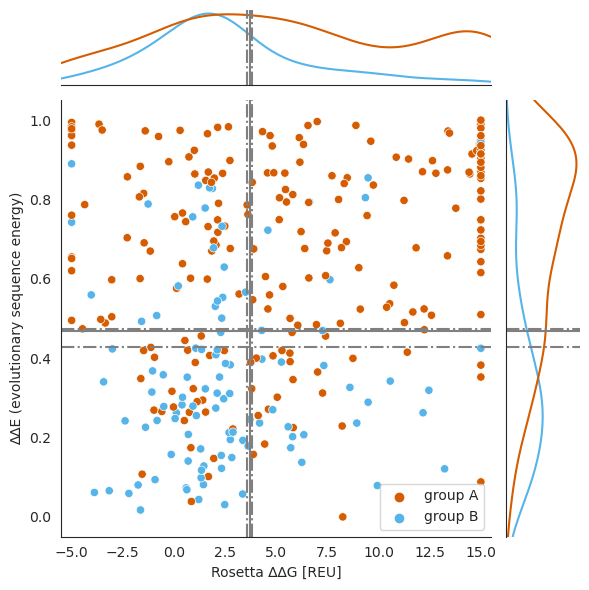

In [135]:
x_range = 0.5
y_range = 0.1

all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    all_tmp.append(tmp_energy)
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:#+list(all_tmp['uniprot;regions_all'].unique()): TRANSMEM
    logger.info(region)
    f = plt.figure(figsize=(8,8), dpi=2500)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])
        g.ax_joint.axvline(x=ddg_mean_cut, color='grey')
        g.ax_joint.axhline(y=dde_mean_cut, color='grey')
        g.ax_joint.axvline(x=ddg_min_cut, color='grey', ls='-.')
        g.ax_joint.axvline(x=ddg_max_cut, color='grey', ls='-.')
        g.ax_joint.axhline(y=dde_min_cut, color='grey', ls='-.')
        g.ax_joint.axhline(y=dde_max_cut, color='grey', ls='-.')
        
        g.ax_marg_x.axvline(x=ddg_mean_cut, color='grey')
        g.ax_marg_y.axhline(y=dde_mean_cut, color='grey')
        g.ax_marg_x.axvline(x=ddg_min_cut, color='grey', ls='-.')
        g.ax_marg_x.axvline(x=ddg_max_cut, color='grey', ls='-.')
        g.ax_marg_y.axhline(y=dde_min_cut, color='grey', ls='-.')
        g.ax_marg_y.axhline(y=dde_max_cut, color='grey', ls='-.')
        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        filename = os.path.join(plots_dir, f'Fig2-AXXX_{region}.svg')
        plt.savefig(filename, )
        plt.show()


#### std cutoff when leave-1 out for protein classes

In [190]:
categories = list(set([target[2][0] for target in target_list]))
logger.info(categories)
key = 'all' # for cutoff choice in ddG-ddE plots
protein_categories = {'Transporter':[], 'Cell Junction':[], 'Ion channel':[], 'Enzyme':[], 'GPCR':[]}
for target in target_list:
    protein_categories[target[2][0]].append(target[0])
logger.info(protein_categories)
#protein_categories = {'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}
protein_categories['all'] = list(subfiltered_df_dicts.keys())
question = 'all'
spec_region = 'all'#'TRANSMEM' #'all'

protein_categories

INFO:['GPCR', 'Enzyme', 'Transporter', 'Ion channel', 'Cell Junction']
INFO:{'Transporter': ['O15118', 'P11166', 'P16615', 'Q8N5M9', 'Q9H221', 'Q9H222'], 'Cell Junction': ['P29033'], 'Ion channel': ['P17787', 'P41181', 'P43681'], 'Enzyme': ['P31213', 'Q9H3H5'], 'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}


{'Transporter': ['O15118', 'P11166', 'P16615', 'Q8N5M9', 'Q9H221', 'Q9H222'],
 'Cell Junction': ['P29033'],
 'Ion channel': ['P17787', 'P41181', 'P43681'],
 'Enzyme': ['P31213', 'Q9H3H5'],
 'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1'],
 'all': ['O15118',
  'P08100',
  'P11166',
  'P16615',
  'P17787',
  'P29033',
  'P31213',
  'P32245',
  'P41181',
  'P43681',
  'Q8N5M9',
  'Q99835',
  'Q9H221',
  'Q9H3H5',
  'Q9ULV1']}

INFO:all
INFO:ddG: {'base_auc': 0.642701048951049, 'mse': 0.0002147756002896361, 'RMSE': 0.01465522433433334, 'MAPerror': 1.2866560091114596, 'MSE2': 0.8017322048142803, 'mean': 0.6427745282363672, 'std': 0.01465504012564501}
INFO:ddE: {'base_auc': 0.8190996503496504, 'mse': 7.690034665691351e-05, 'RMSE': 0.008769284272784953, 'MAPerror': 0.7603990423032085, 'MSE2': 0.905157776296514, 'mean': 0.81931059999005, 'std': 0.008766746654610755}


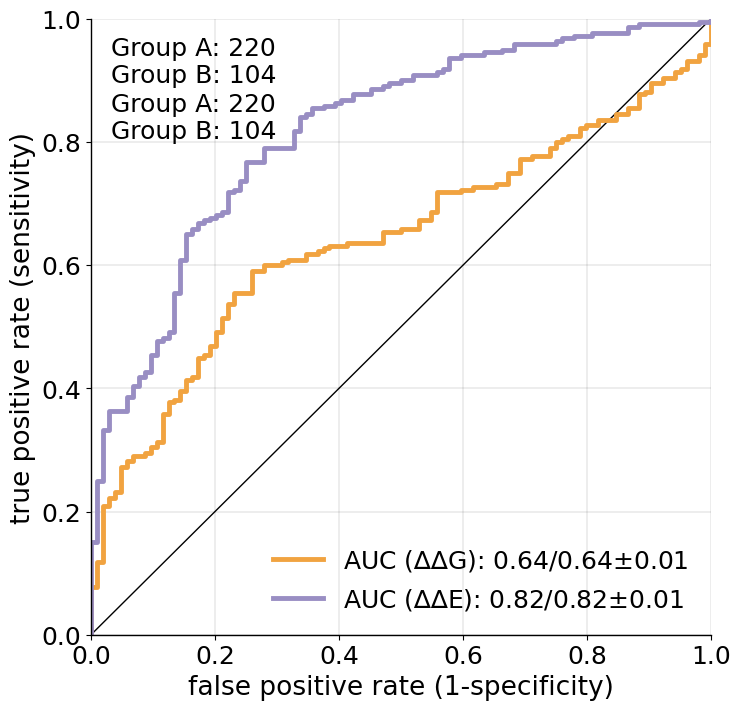

rosetta 3.7343466666664984 0.062413480025578144 3.57799999999952 3.80159999999978
gemme 0.46890760229005096 0.011146974753416337 0.427256843331392 0.4740645161290323
CPU times: user 1.44 s, sys: 208 ms, total: 1.65 s
Wall time: 1.75 s


In [191]:

%%time
logger.info(question)
cutoff_value = gnomAD_cutoff_value
gemme_name = 'gemme;score'
rosetta_name = 'rosetta;ddG'
all_tmp = []
all_aucs = {}
all_vals_cat = {}
target_dic_here = subfiltered_df_dicts

for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['uniprot;ID'] = target_uniprot
    tmp_energy['uniprot'] = target_uniprot
    if target_uniprot in protein_categories[question]:
        all_tmp.append(tmp_energy)
    
all_tmp = pd.concat(all_tmp)
for region in [spec_region ]:#TRANSMEM
    tmp = all_tmp.copy()
    if region != 'all':
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)

    for cutoff_value in [gnomAD_cutoff_value]:
        control_df = tmp.copy()
        control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
        control_score = np.copy(control_df['score'].values)
        if len(list(set(control_score))) > 1:
            auc_dici_rosetta = cutoff_checks_range(control_df)

            auc_dici_gemme = cutoff_checks_range(control_df, name=gemme_name)
            auc_dici = ROC_adapted(control_df, 'all', f"Fig2add-B--_{add_name}", 
                               cutoff=cutoff_value, satu=satu, groupA=groupA, 
                               groupB=groupB, nameB=gemme_name, title=title)

ddg_mean_cut = np.mean(auc_dici_rosetta)
ddg_std_cut = np.std(auc_dici_rosetta)
ddg_min_cut = np.min(auc_dici_rosetta)
ddg_max_cut = np.max(auc_dici_rosetta)

dde_mean_cut = np.mean(auc_dici_gemme)
dde_std_cut = np.std(auc_dici_gemme)
dde_min_cut = np.min(auc_dici_gemme)
dde_max_cut = np.max(auc_dici_gemme)

print('rosetta', np.mean(auc_dici_rosetta), np.std(auc_dici_rosetta), np.min(auc_dici_rosetta), np.max(auc_dici_rosetta), )
print('gemme', np.mean(auc_dici_gemme), np.std(auc_dici_gemme), np.min(auc_dici_gemme), np.max(auc_dici_gemme), )

In [192]:
control_df['variant2'] = control_df['uniprot;ID']+'_'+control_df['variant']
control_df.loc[control_df[rosetta_name]>15, rosetta_name] = 15
control_df.loc[control_df[rosetta_name]<-5, rosetta_name] = -5
#quadrant 1
q1_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q1_A = control_df.loc[q1_A_con, 'variant2']
print(len(control_df))
q1_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q1_B = control_df.loc[q1_B_con, 'variant2']

q1_neut_A_con = ((control_df['score']==1) & 
                 (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
            ((control_df[rosetta_name]>=ddg_mean_cut) & 
             (control_df[gemme_name]>=dde_mean_cut) ))
q1_A_neut = control_df.loc[q1_neut_A_con, 'variant2']
q1_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
            ((control_df[rosetta_name]>=ddg_mean_cut) & 
             (control_df[gemme_name]>=dde_mean_cut) ))
q1_B_neut = control_df.loc[q1_neut_B_con, 'variant2']

#quadrant 2
q2_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q2_A = control_df.loc[q2_A_con, 'variant2']
q2_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut))))
q2_B = control_df.loc[q2_B_con, 'variant2']

q2_neut_A_con = ((control_df['score']==1) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]>=(dde_mean_cut))))
q2_A_neut = control_df.loc[q2_neut_A_con, 'variant2']
q2_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]>=(dde_max_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]>=(dde_mean_cut))))
q2_B_neut = control_df.loc[q2_neut_B_con, 'variant2']

#quadrant 3
q3_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q3_A = control_df.loc[q3_A_con, 'variant2']
q3_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q3_B = control_df.loc[q3_B_con, 'variant2']

q3_neut_A_con = ((control_df['score']==1) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut))))
q3_A_neut = control_df.loc[q3_neut_A_con, 'variant2']
q3_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]<=(ddg_min_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut)))) &
                ((control_df[rosetta_name]<=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut))))
q3_B_neut = control_df.loc[q3_neut_B_con, 'variant2']

#quadrant 4
q4_A_con = ((control_df['score']==1) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q4_A = control_df.loc[q4_A_con, 'variant2']
q4_B_con = ((control_df['score']==0) & 
            ((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))))
q4_B = control_df.loc[q4_B_con, 'variant2']

q4_neut_A_con = ((control_df['score']==1) & 
            (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))) &
            ((control_df[rosetta_name]>=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut)))))
q4_A_neut = control_df.loc[q4_neut_A_con, 'variant2']
q4_neut_B_con = ((control_df['score']==0) & 
            (~((control_df[rosetta_name]>=(ddg_max_cut)) & 
             (control_df[gemme_name]<=(dde_min_cut))) &
            ((control_df[rosetta_name]>=(ddg_mean_cut)) & 
             (control_df[gemme_name]<=(dde_mean_cut)))))
q4_B_neut = control_df.loc[q4_neut_B_con, 'variant2']


listi = [
    ['quadrant', 'group', 'grey', 'count'],
    ['Q1', 'A', False, len(q1_A)],
    ['Q1', 'B', False, len(q1_B)],
    ['Q1', 'A', True, len(q1_A_neut)],
    ['Q1', 'B', True, len(q1_B_neut)],
    ['Q2', 'A', False, len(q2_A)],
    ['Q2', 'B', False, len(q2_B)],
    ['Q2', 'A', True, len(q2_A_neut)],
    ['Q2', 'B', True, len(q2_B_neut)],
    ['Q3', 'A', False, len(q3_A)],
    ['Q3', 'B', False, len(q3_B)],
    ['Q3', 'A', True, len(q3_A_neut)],
    ['Q3', 'B', True, len(q3_B_neut)],
    ['Q4', 'A', False, len(q4_A)],
    ['Q4', 'B', False, len(q4_B)],
    ['Q4', 'A', True, len(q4_A_neut)],
    ['Q4', 'B', True, len(q4_B_neut)],
]

df_ = pd.DataFrame(data=listi[1:], columns=listi[0])
df_

324


,quadrant,group,grey,count
0,Q1,A,False,104
1,Q1,B,False,6
2,Q1,A,True,1
3,Q1,B,True,2
4,Q2,A,False,63
5,Q2,B,False,20
6,Q2,A,True,1
7,Q2,B,True,0
8,Q3,A,False,24
9,Q3,B,False,54


In [200]:
104/(104+1+63+1)
104+1+64+1+24+2+22+3
(3)/(df_['count'].sum())
(54+3+19+0)/(df_.loc[df_['group']=='B', 'count'].sum())
(54+3+0+0)/(54+3+19+0)
(12+3)/(df_.loc[df_['group']=='A', 'count'].sum())
# (1)/(104+1+63+1)
(2+6)/(12+2+6+1+1+0+3+6)
(19+0)/(df_['count'].sum())
(54+3+19+0)/(df_.loc[df_['group']=='B', 'count'].sum())
(3)/(54+3+19+0)
(1+1)/(df_.loc[df_['group']=='A', 'count'].sum())

0.00909090909090909

In [178]:
print('Q1', 'A', list(q1_A_neut))
print('Q1', 'B', list(q1_B_neut))
print('Q2', 'A', list(q2_A_neut))
print('Q2', 'B', list(q2_B_neut))
print('Q3', 'A', list(q3_A_neut))
print('Q3', 'B', list(q3_B_neut))
print('Q4', 'A', list(q4_A_neut))
print('Q4', 'B', list(q4_B_neut))

Q1 A ['P08100_G90D', 'P08100_G114V', 'P08100_G182S', 'P08100_C185R', 'P08100_M207R', 'P08100_H211P', 'P32245_S180P']
Q1 B ['P08100_A299S']
Q2 A ['P08100_T17M', 'P08100_G121V']
Q2 B ['P32245_I170V', 'P32245_N240S', 'Q99835_R296C']
Q3 A ['P08100_P180L']
Q3 B ['P32245_S127L', 'P32245_I251L']
Q4 A ['P08100_C167W', 'P08100_P180A', 'P08100_P180S', 'P08100_P180T', 'P08100_H211R', 'Q99835_L412F']
Q4 B ['P08100_T320N']


INFO:#accession: O15118
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: Q8N5M9
INFO:#accession: Q9H221
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 20000x20000 with 0 Axes>

<Figure size 800x800 with 0 Axes>

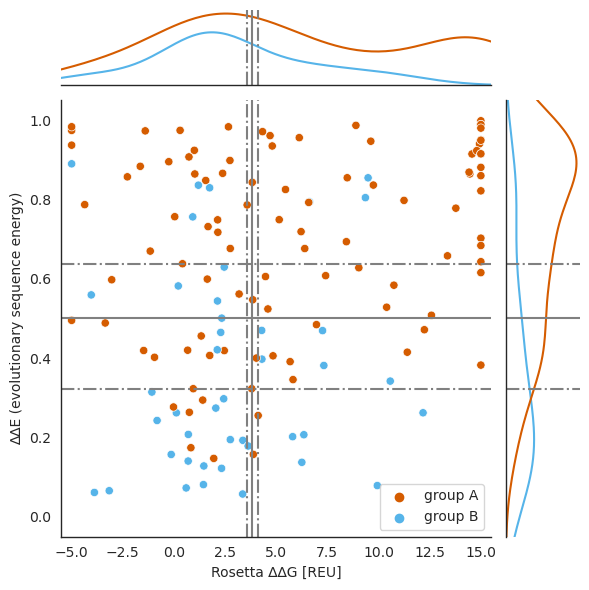

In [171]:
x_range = 0.5
y_range = 0.1

all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    if target_uniprot in protein_categories[question]:
        logger.info(f'#accession: {target_uniprot}')
        all_tmp.append(tmp_energy)
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:#+list(all_tmp['uniprot;regions_all'].unique()): TRANSMEM
    logger.info(region)
    f = plt.figure(figsize=(8,8), dpi=2500)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])
        g.ax_joint.axvline(x=ddg_mean_cut, color='grey')
        g.ax_joint.axhline(y=dde_mean_cut, color='grey')
        g.ax_joint.axvline(x=ddg_min_cut, color='grey', ls='-.')
        g.ax_joint.axvline(x=ddg_max_cut, color='grey', ls='-.')
        g.ax_joint.axhline(y=dde_min_cut, color='grey', ls='-.')
        g.ax_joint.axhline(y=dde_max_cut, color='grey', ls='-.')
        
        g.ax_marg_x.axvline(x=ddg_mean_cut, color='grey')
        g.ax_marg_y.axhline(y=dde_mean_cut, color='grey')
        g.ax_marg_x.axvline(x=ddg_min_cut, color='grey', ls='-.')
        g.ax_marg_x.axvline(x=ddg_max_cut, color='grey', ls='-.')
        g.ax_marg_y.axhline(y=dde_min_cut, color='grey', ls='-.')
        g.ax_marg_y.axhline(y=dde_max_cut, color='grey', ls='-.')
        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        filename = os.path.join(plots_dir, f'Fig2-AXXX_{region}.svg')
        plt.savefig(filename, )
        plt.show()


### ROC curves

INFO:all
INFO:9.931568854324432e-05
INFO:42
INFO:groupA: 220
groupB: 104


9.931568854324432e-05
Ensemble test roc-auc:0.642701048951049
Ensemble test roc-auc:0.8190996503496504


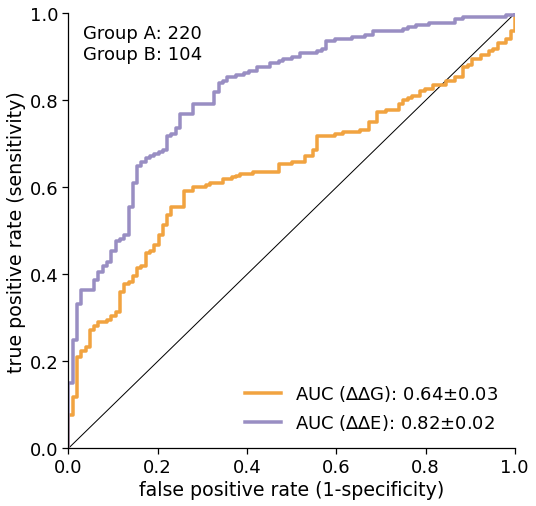

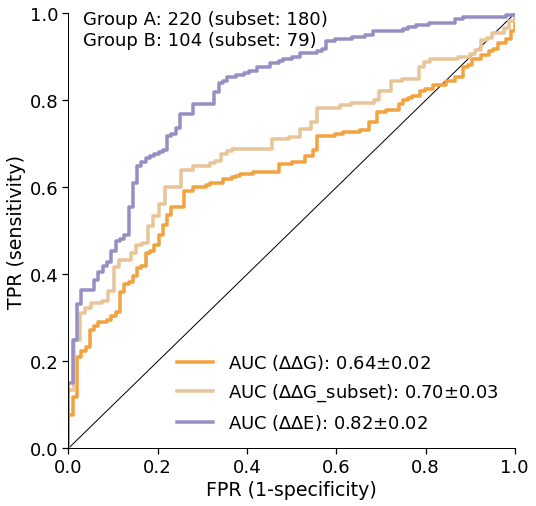

INFO:TRANSMEM
INFO:9.931568854324432e-05
INFO:15
INFO:groupA: 109
groupB: 35


9.931568854324432e-05
Ensemble test roc-auc:0.6851900393184798
Ensemble test roc-auc:0.8663171690694627


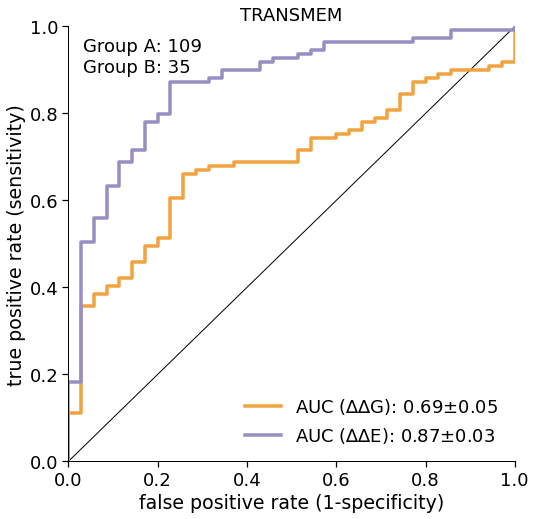

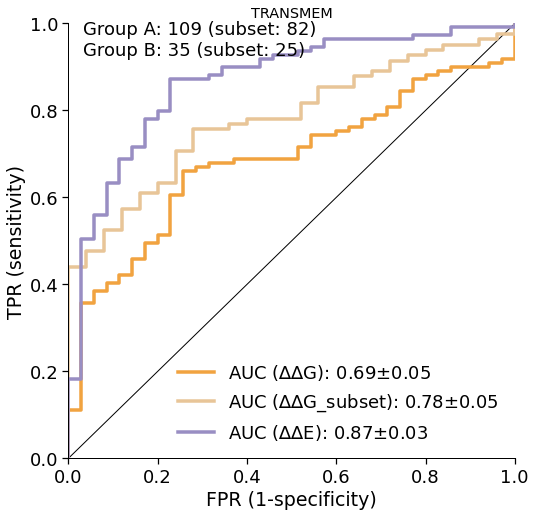

In [44]:
gemme_name = 'gemme;score'
all_tmp = []
all_execpt_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    if not target_uniprot in except_uniprot_list:
        all_execpt_tmp.append(tmp_energy)
    all_tmp.append(tmp_energy)

all_execpt_tmp = pd.concat(all_execpt_tmp)
all_tmp = pd.concat(all_tmp)
for region in ['all', 'TRANSMEM']:
    logger.info(region)
    tmp = all_tmp.copy()
    tmp_2 = all_execpt_tmp.copy()
    title = ''
    if region != 'all':
        title = region
        tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_2 = tmp_2[(tmp_2['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp2 = tmp.copy()

    for cutoff_value in [cutoff_value]:
        logger.info(cutoff_value)
        print(cutoff_value)
        control_df2 = tmp_2.copy()
        control_df = tmp2.copy()
        
        control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
        control_df2 = control_df2.dropna(subset = ['score']).reset_index(drop=True)
        
        logger.info(len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']]))
        control_score = np.copy(control_df['score'].values)
        control_score2 = np.copy(control_df2['score'].values)
        if len(list(set(control_score))) > 1:
            test_score3 = control_df2['rosetta;ddG'].values
            test_score1 = control_df['rosetta;ddG'].values
            test_score2 = control_df[gemme_name].values
            groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
            groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
            groupA2 = len(control_df2[control_df2['score']==1].reset_index(drop=True)['score'])
            groupB2 = len(control_df2[control_df2['score']==0].reset_index(drop=True)['score'])
            logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
            satu = ''

            auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, test_score2, 
                                           'all', f"Fig2-B_{region}", cutoff=cutoff_value, satu=satu, 
                                           groupA=groupA, groupB=groupB, nameB=gemme_name, title=title)
            auc_dici = disease_ROC_adapted_all_except(control_df, control_df2, control_score, 
                                                      control_score2, test_score1, test_score2, 
                                                      test_score3, 'all', region, 
                                                      cutoff=cutoff_value, satu=satu, groupA=groupA, 
                                                      groupB=groupB, groupA2=groupA2, groupB2=groupB2, 
                                                      nameB=gemme_name, title=title)


INFO:#accession: O15118
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Lumenal']
INFO:578
INFO:groupA: 44
groupB: 12


Ensemble test roc-auc:0.6912878787878789
Ensemble test roc-auc:0.8446969696969697


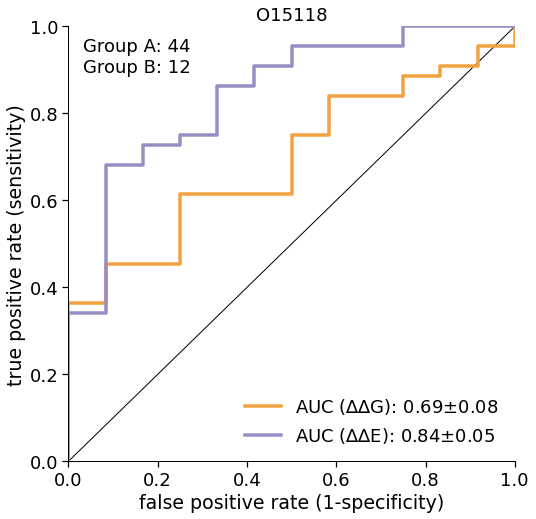

INFO:#accession: P08100
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic']
INFO:255
INFO:groupA: 41
groupB: 6


Ensemble test roc-auc:0.7926829268292683
Ensemble test roc-auc:0.6910569105691057


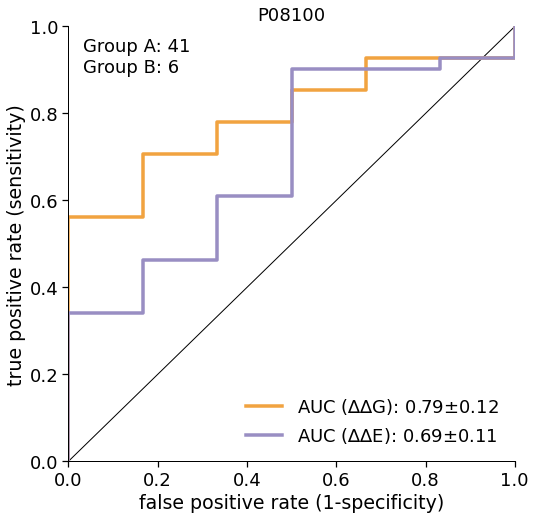

INFO:#accession: P11166
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Extracellular']
INFO:254
INFO:groupA: 42
groupB: 7


Ensemble test roc-auc:0.6462585034013606
Ensemble test roc-auc:0.9217687074829932


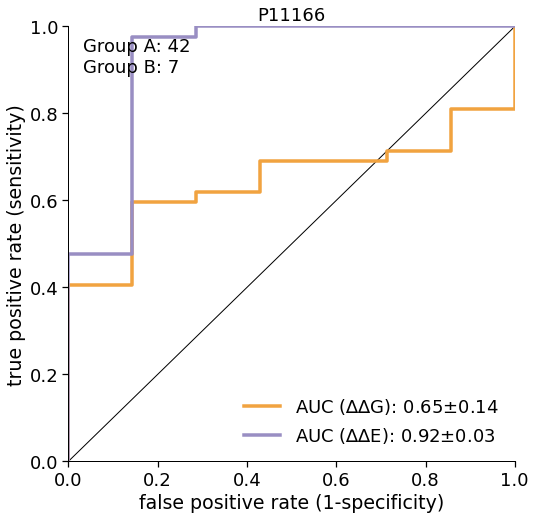

INFO:#accession: P16615
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Lumenal']
INFO:346
INFO:groupA: 8
groupB: 5


Ensemble test roc-auc:0.85
Ensemble test roc-auc:1.0


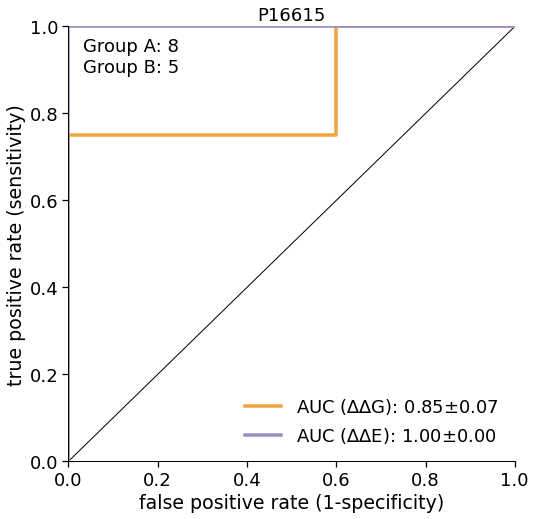

INFO:#accession: P17787
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic' nan]
INFO:193
INFO:groupA: 1
groupB: 5


Ensemble test roc-auc:0.8
Ensemble test roc-auc:1.0


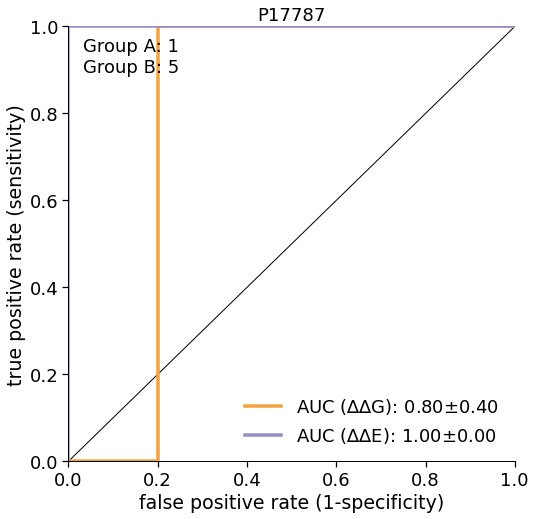

INFO:#accession: P29033
INFO:all
INFO:[nan 'Cytoplasmic' 'TRANSMEM' 'Extracellular']
INFO:140
INFO:groupA: 33
groupB: 16


Ensemble test roc-auc:0.4185606060606061
Ensemble test roc-auc:0.8371212121212122


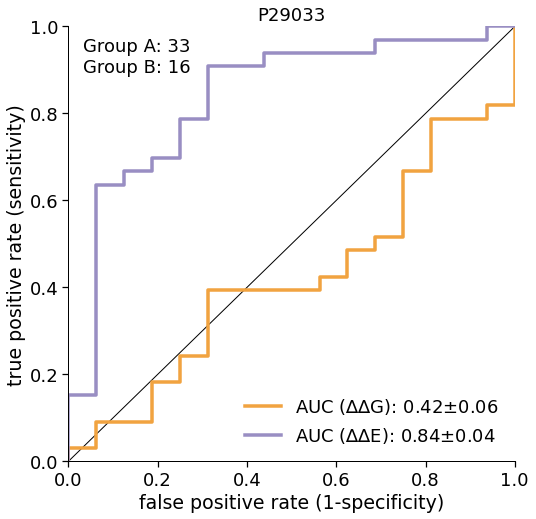

INFO:#accession: P31213
INFO:all
INFO:['TRANSMEM' nan]
INFO:107
INFO:groupA: 18
groupB: 8


Ensemble test roc-auc:0.6319444444444444
Ensemble test roc-auc:0.8958333333333334


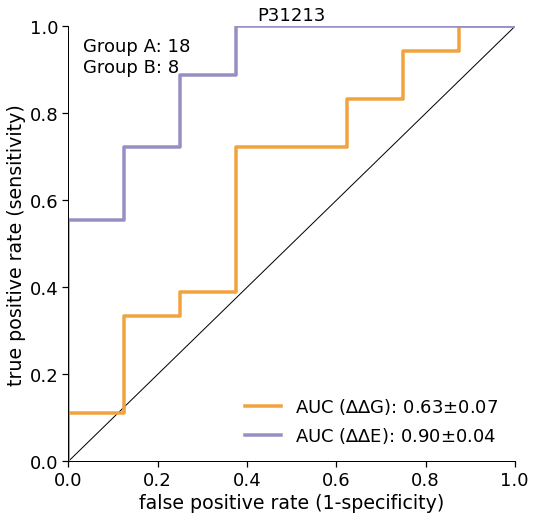

INFO:#accession: P32245
INFO:all
INFO:['TRANSMEM' 'Cytoplasmic' 'Extracellular']
INFO:180
INFO:groupA: 10
groupB: 8


Ensemble test roc-auc:0.6625000000000001
Ensemble test roc-auc:0.975


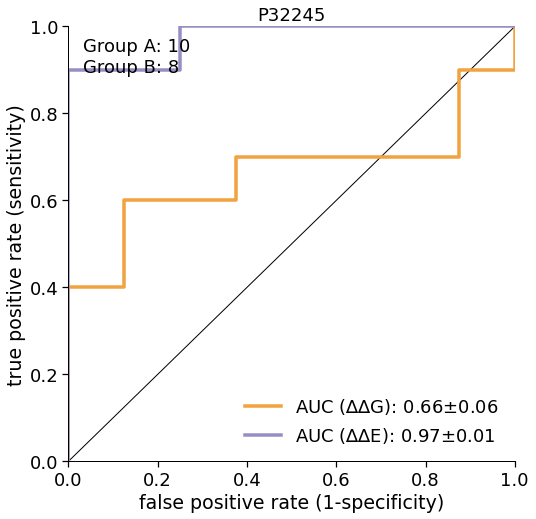

INFO:#accession: P41181
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Extracellular' nan]
INFO:130
INFO:groupA: 7
groupB: 1


Ensemble test roc-auc:1.0
Ensemble test roc-auc:0.8571428571428571


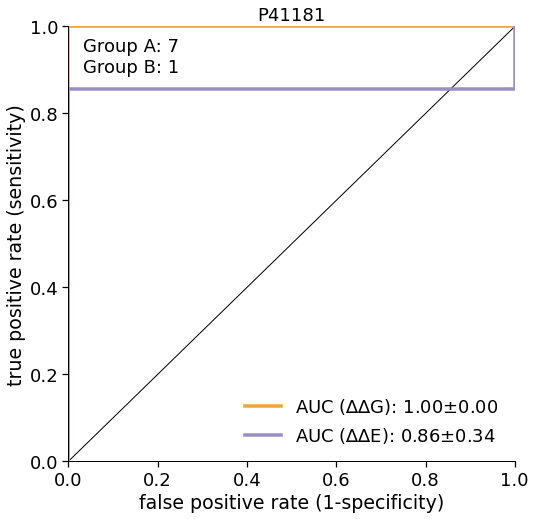

INFO:#accession: P43681
INFO:all
INFO:['Extracellular' 'TRANSMEM' nan 'Cytoplasmic']
INFO:206
INFO:groupA: 3
groupB: 6


Ensemble test roc-auc:0.3333333333333333
Ensemble test roc-auc:0.9444444444444444


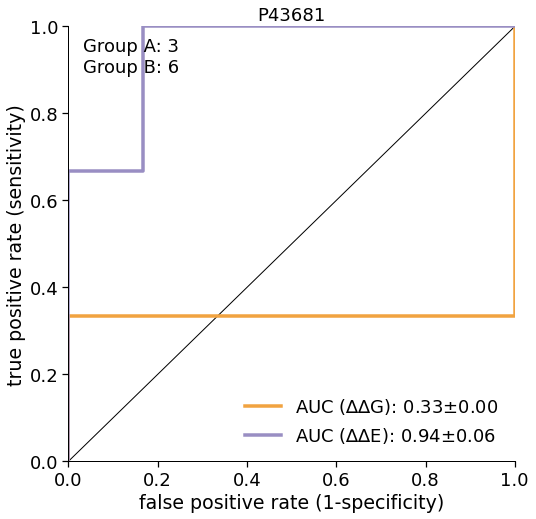

INFO:#accession: Q8N5M9
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Lumenal']
INFO:110
INFO:groupA: 4
groupB: 3


Ensemble test roc-auc:0.4166666666666667
Ensemble test roc-auc:0.9166666666666667


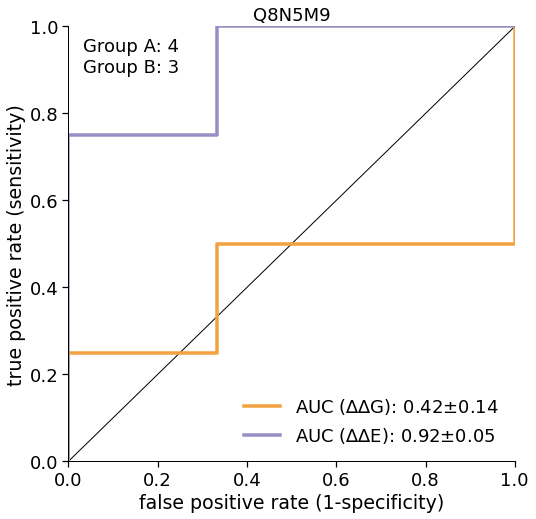

INFO:#accession: Q99835
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic']
INFO:218
INFO:groupA: 1
groupB: 7


Ensemble test roc-auc:1.0
Ensemble test roc-auc:0.8571428571428572


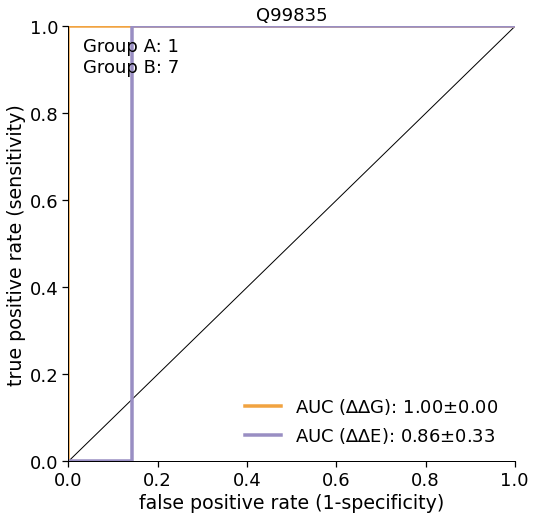

INFO:#accession: Q9H221
INFO:all
INFO:['Cytoplasmic' 'TRANSMEM' 'Extracellular']
INFO:367
INFO:#accession: Q9H3H5
INFO:all
INFO:['Lumenal' 'TRANSMEM' 'Cytoplasmic']
INFO:233
INFO:groupA: 6
groupB: 2


Ensemble test roc-auc:0.5
Ensemble test roc-auc:0.9166666666666667


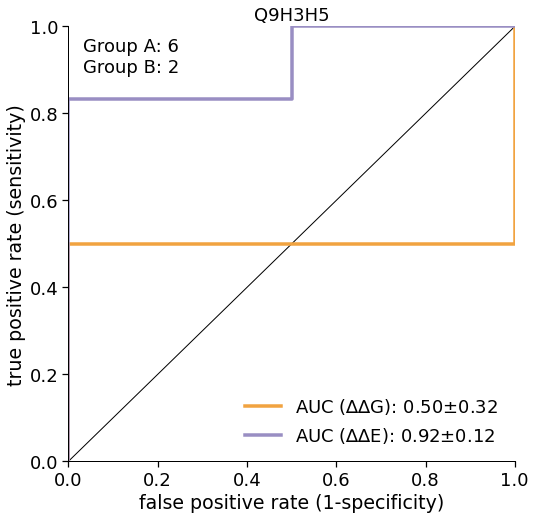

INFO:#accession: Q9ULV1
INFO:all
INFO:['Extracellular' 'TRANSMEM' 'Cytoplasmic']
INFO:154
INFO:groupA: 2
groupB: 3


Ensemble test roc-auc:0.8333333333333334
Ensemble test roc-auc:1.0


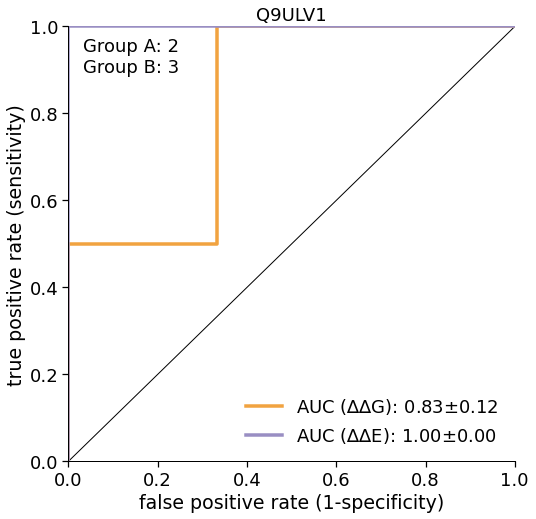

In [45]:
gemme_name = 'gemme;score'

target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    tmp_energy = target_dic_here[target_uniprot].copy()

    for region in ['all']:
        logger.info(region)
        tmp2 = tmp_energy.copy()
        logger.info(tmp2['uniprot;regions_all'].unique())
        if region != 'all':
            tmp2 = tmp2[(tmp2['uniprot;regions_all']==region)].reset_index(drop=True)
        if len(tmp2['variant'])==0:
            continue
        logger.info(len(tmp2['variant']))

        for cutoff_value in [gnomAD_cutoff_value]:
            control_df = tmp2.copy()
            control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
            control_score = np.copy(control_df['score'].values)
            if len(list(set(control_score))) > 1:
                test_score1 = control_df['rosetta;ddG'].values
                test_score2 = control_df[gemme_name].values
                title = f"{target_uniprot}_{region}"
                groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
                groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
                logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
                satu = ''

                auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, test_score2, target_uniprot, 
                                               region, cutoff=cutoff_value, satu=satu, groupA=groupA, groupB=groupB, 
                                               nameB=gemme_name, title=target_uniprot, runs=1000)


### ddG-ddE distribution

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 20000x20000 with 0 Axes>

<Figure size 576x576 with 0 Axes>

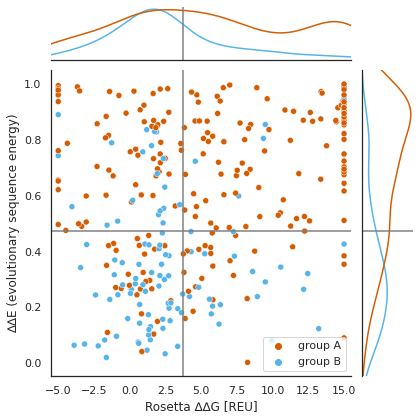

INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 20000x20000 with 0 Axes>

<Figure size 576x576 with 0 Axes>

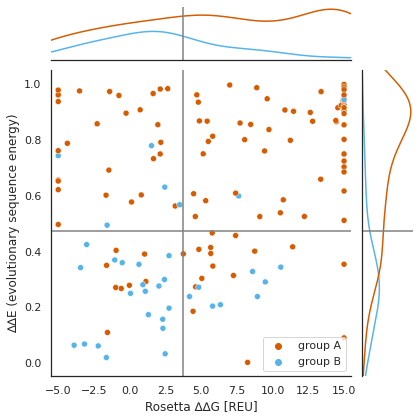

In [62]:
x_range = 0.5
y_range = 0.1

all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    all_tmp.append(tmp_energy)
    
all_tmp = pd.concat(all_tmp)
for region in ['all', 'TRANSMEM']:#+list(all_tmp['uniprot;regions_all'].unique()):
    logger.info(region)
    f = plt.figure(figsize=(8,8), dpi=2500)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])
        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        filename = os.path.join(plots_dir, f'Fig2-A_{region}.svg')
        plt.savefig(filename, )
        plt.show()


INFO:#accession: O15118
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

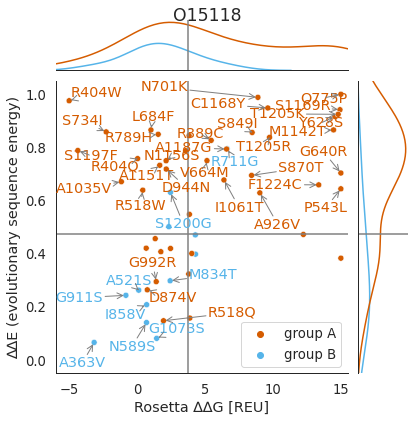

INFO:#accession: P08100
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

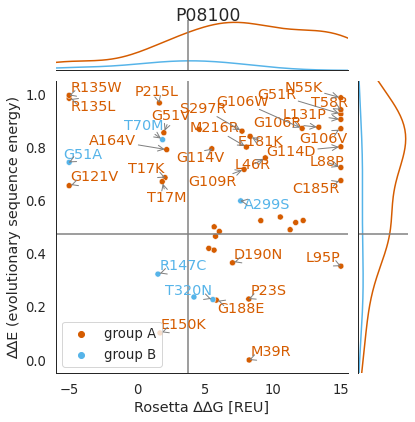

INFO:#accession: P11166
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

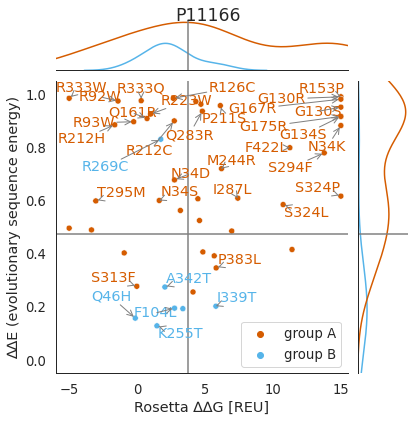

INFO:#accession: P16615
INFO:['group A' 'other' 'group B']


<Figure size 576x576 with 0 Axes>

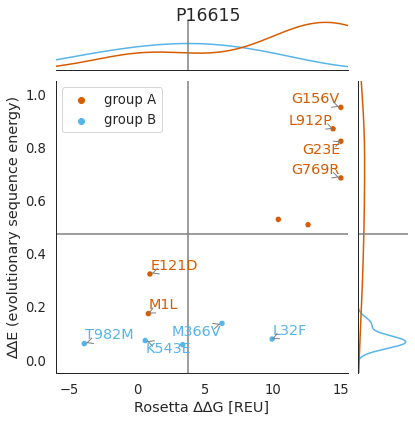

INFO:#accession: P17787
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

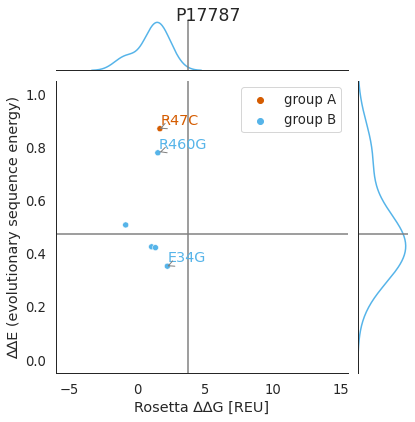

INFO:#accession: P29033
INFO:['group B' 'other' 'group A']


<Figure size 576x576 with 0 Axes>

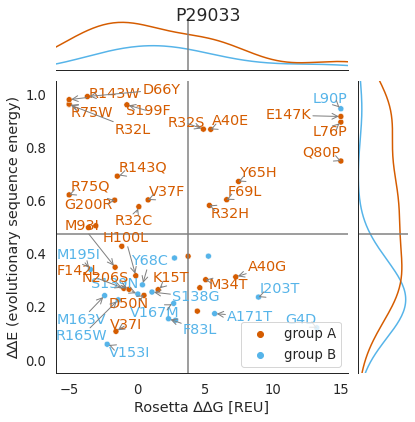

INFO:#accession: P31213
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

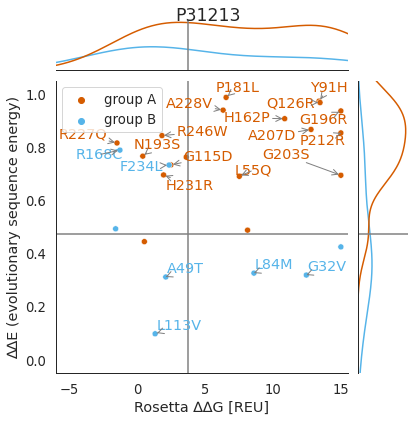

INFO:#accession: P32245
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

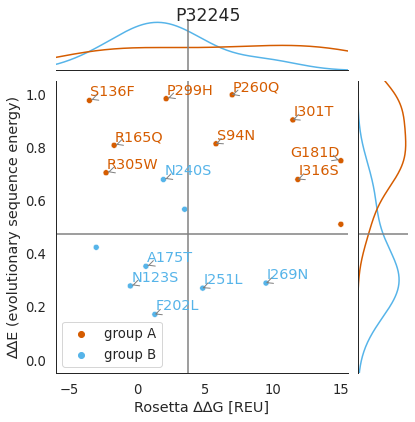

INFO:#accession: P41181
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

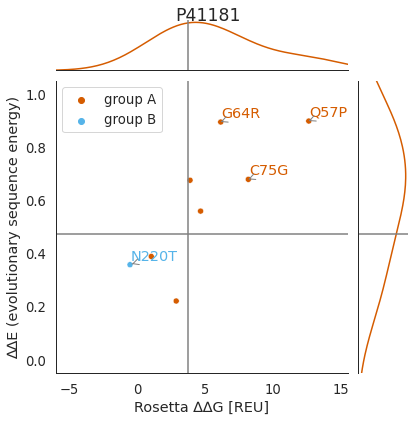

INFO:#accession: P43681
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

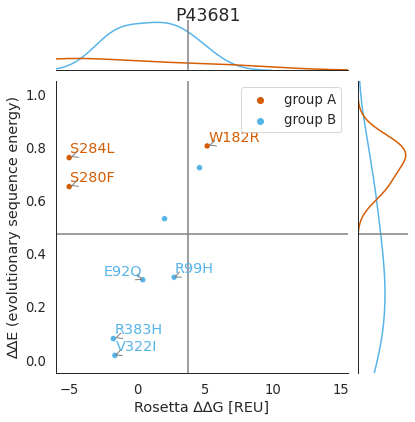

INFO:#accession: Q8N5M9
INFO:['group A' 'group B' 'other']


<Figure size 576x576 with 0 Axes>

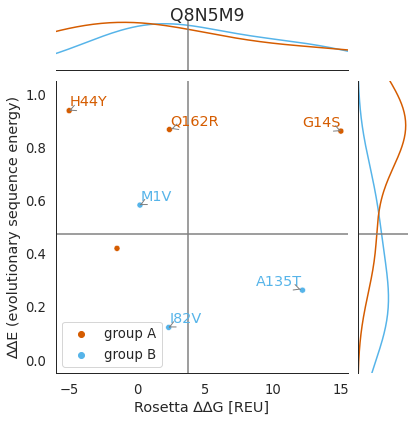

INFO:#accession: Q99835
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

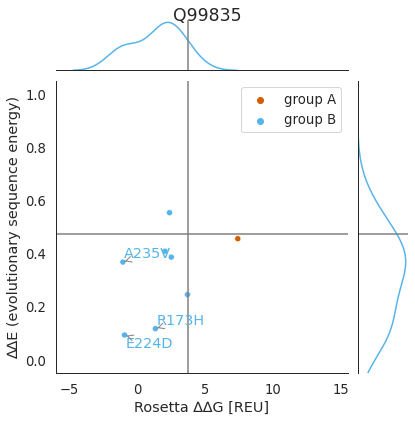

INFO:#accession: Q9H221
INFO:['other' 'group B']


<Figure size 576x576 with 0 Axes>

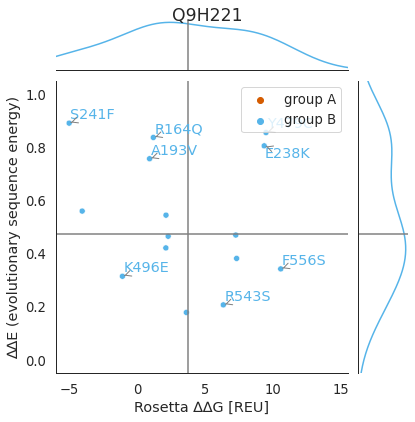

INFO:#accession: Q9H3H5
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

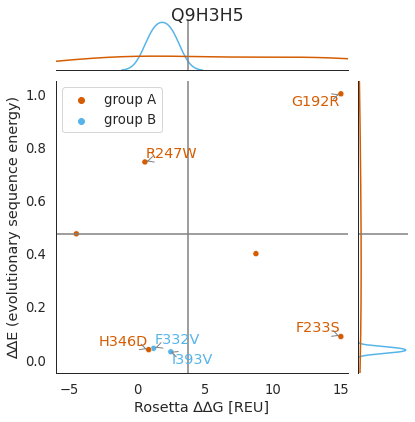

INFO:#accession: Q9ULV1
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

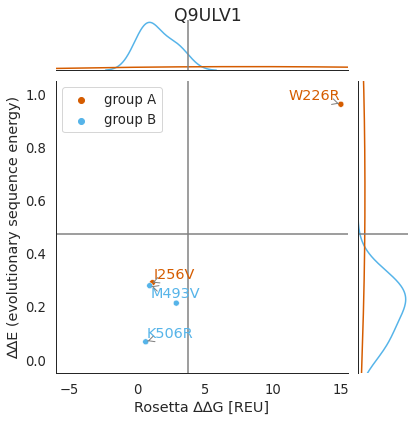

In [47]:
x_range = 1
y_range = 0.1
rosetta_grey = True
gemme_grey = True
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_joint.set_xlim(-5-x_range,15+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')
        g.fig.suptitle(target_uniprot)

        texts = []
        for line in range(0,tmpi.shape[0]):
            labeler=True
            if rosetta_grey==True and gemme_grey==True:
                if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)) and ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                    labeler=True
                else:
                    labeler=False
            else:
                if rosetta_grey==True:
                    if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)):
                        labeler=True
                    else:
                        labeler=False
                if gemme_grey==True:
                    if ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                        labeler=True
                    else:
                        labeler=False
            if labeler==True:
                if tmpi['label'][line] == 'group A':
                    texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#D55C00'))
                elif tmpi['label'][line] == 'group B':
                    texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#56B4E9'))

        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        g.fig.subplots_adjust(top=0.95)
        plt.show()
    

### ddG-ddE distribution plot + spliceAI

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

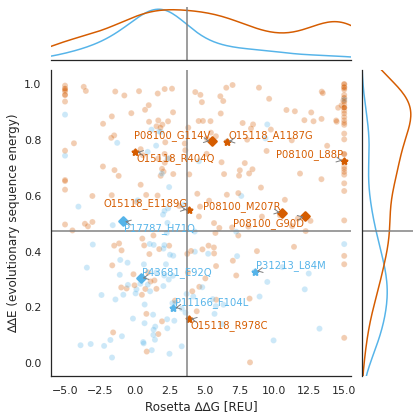

In [63]:
x_range = 1
y_range = 0.1
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['uniprot'] = target_uniprot
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp)
for region in ['all',]:
    logger.info(region)
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        tmp_energy = all_tmp.copy()
        if region != 'all':
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ], alpha=0.3, legend=False
                         )

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')

        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="*")
        texts = []
        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="*")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['uniprot'][line]}_{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        filename = os.path.join(plots_dir, f'FigS2-splice-dist.svg')
        plt.savefig(filename, )
        plt.show()


INFO:#accession: O15118
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

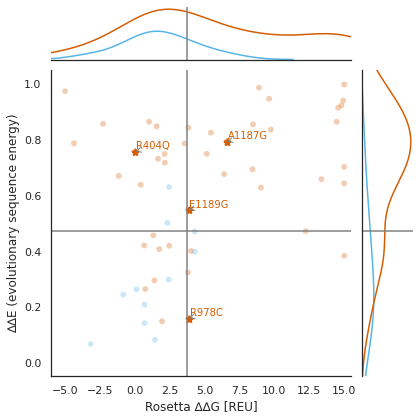

INFO:#accession: P08100
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

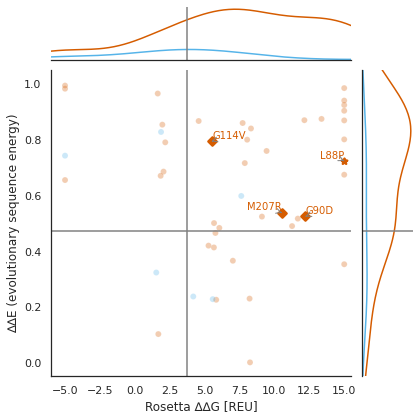

INFO:#accession: P11166
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

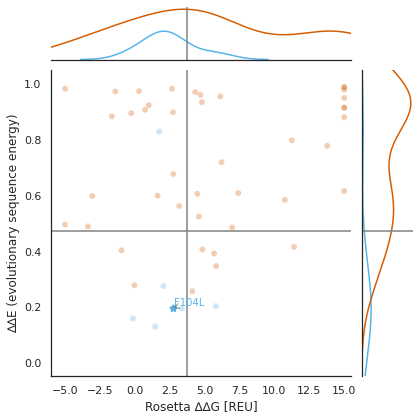

INFO:#accession: P16615
INFO:['group A' 'other' 'group B']


<Figure size 576x576 with 0 Axes>

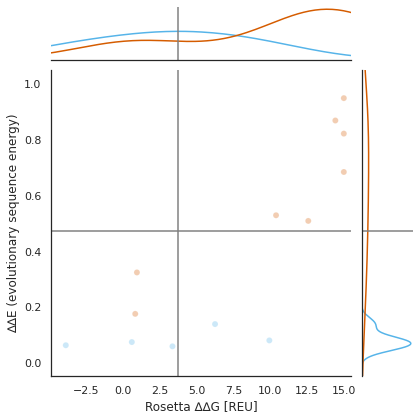

INFO:#accession: P17787
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

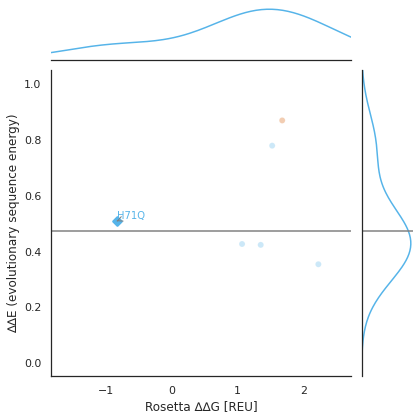

INFO:#accession: P29033
INFO:['group B' 'other' 'group A']


<Figure size 576x576 with 0 Axes>

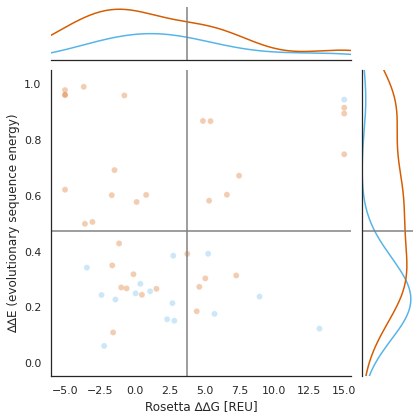

INFO:#accession: P31213
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

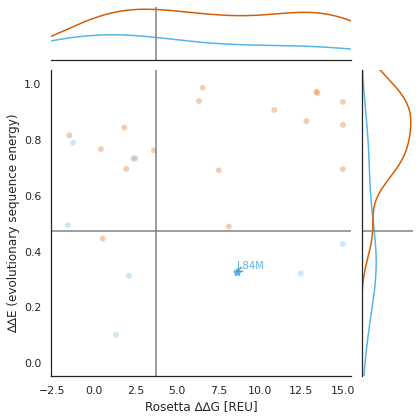

INFO:#accession: P32245
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

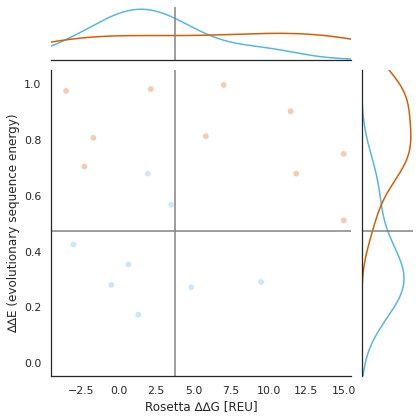

INFO:#accession: P41181
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

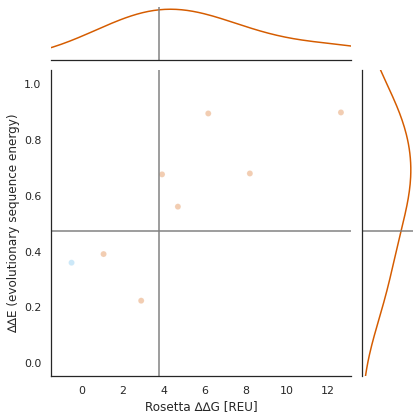

INFO:#accession: P43681
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

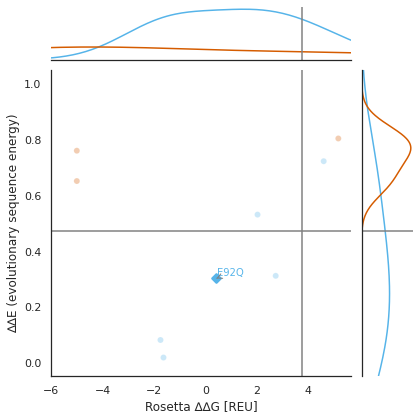

INFO:#accession: Q8N5M9
INFO:['group A' 'group B' 'other']


<Figure size 576x576 with 0 Axes>

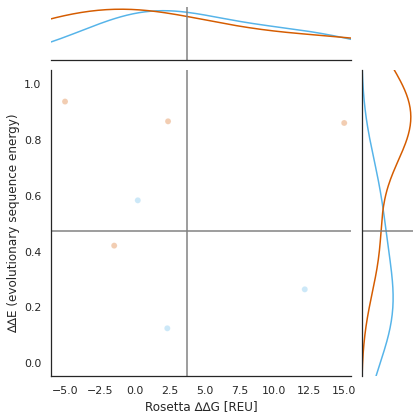

INFO:#accession: Q99835
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

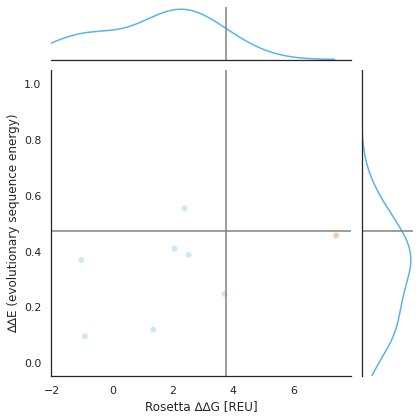

INFO:#accession: Q9H221
INFO:['other' 'group B']


<Figure size 576x576 with 0 Axes>

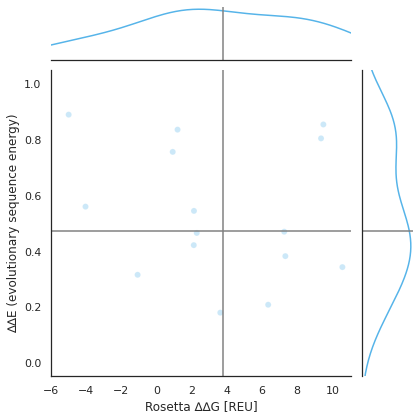

INFO:#accession: Q9H3H5
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

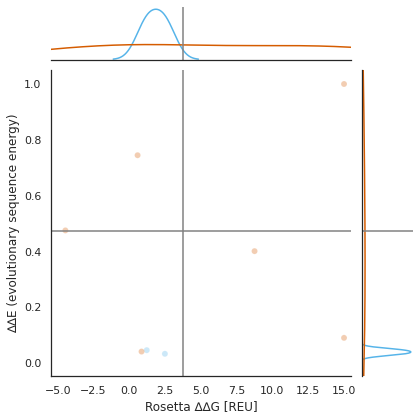

INFO:#accession: Q9ULV1
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

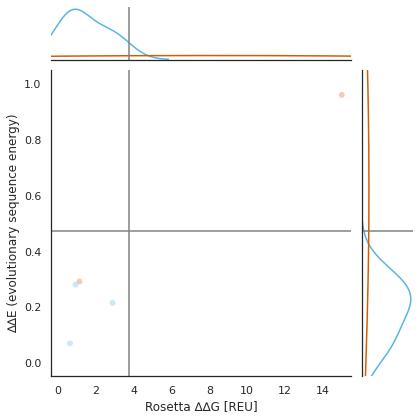

In [64]:
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    with sns.axes_style("white"):
        f = plt.figure(figsize=(8,8))
        if region != 'all':
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                          hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ], alpha=0.3, legend=False
                         )

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')

        g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score'].isna()]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="*")
        texts = []
        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==1]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#D55C00', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]

        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.2) & (tmpi[maxdelta_spliceai_column_global_name]<=0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="*")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
     #   adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[tmpi['score']==0]
        tmpi = tmpi.loc[(tmpi[maxdelta_spliceai_column_global_name]>0.5)].reset_index(drop=True)
        g.ax_joint.scatter(tmpi['rosetta;ddG'], tmpi['gemme;score'], color='#56B4E9', linewidths=2.25, alpha=1, marker="D")

        for line in range(0,tmpi.shape[0]):
            if tmpi['label'][line] == 'group A':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#D55C00'))
            elif tmpi['label'][line] == 'group B':
                texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], f"{tmpi['variant'][line]}", horizontalalignment='left', size='small', color='#56B4E9'))
        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)
        plt.show()
    

### gnomAD ddG/ddE distribution plot

INFO:#accession: O15118
INFO:['gnomad' 'gnomad|VUS' 'gnomad|conflict' 'unknown' 'gnomad|benign' 'VUS'
 'gnomad|pathogenic' 'pathogenic']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00',
       'uniprot;COMPBIAS_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02'

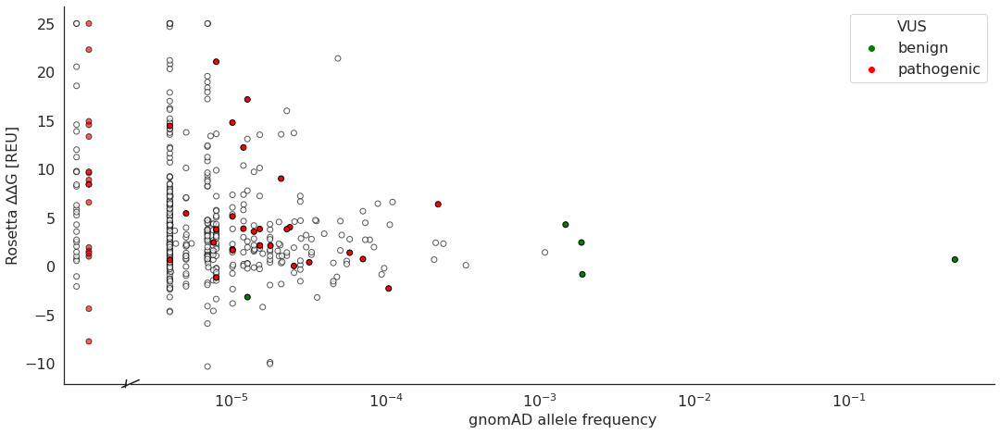

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']
INFO:#accession: P08100
INFO:['gnomad' 'pathogenic' 'gnomad|pathogenic' 'gnomad|conflict' 'VUS'
 'gnomad|VUS' 'gnomad|benign' 'unknown' 'conflict']
INFO:['gnomad_low' 'pathogenic' nan 'gnomad_high']
INFO:['VUS' 'pathogenic' 'benign' None]
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;LIPID_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
  

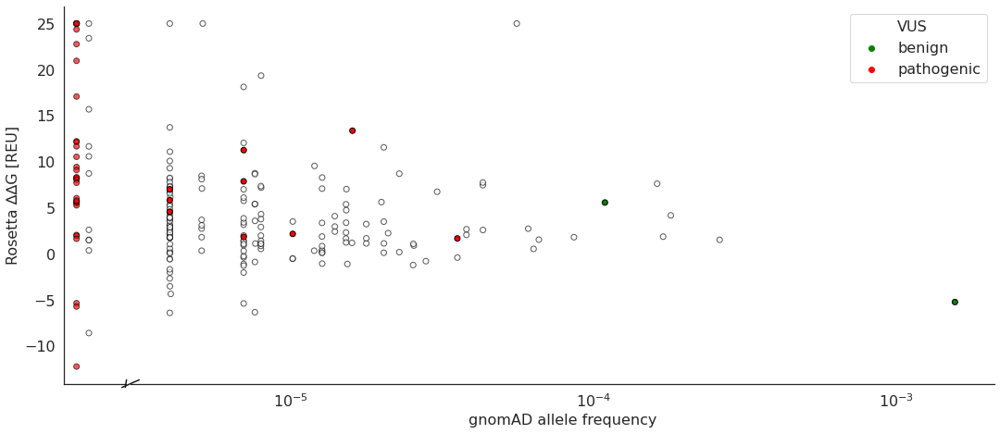

INFO:[nan 'pathogenic' 'conflict' 'VUS' 'benign']
INFO:#accession: P11166
INFO:['gnomad|VUS' 'gnomad' 'pathogenic' 'VUS' 'gnomad|conflict' 'unknown'
 'gnomad|pathogenic' 'conflict' 'gnomad|benign']
INFO:['gnomad_low' 'pathogenic' nan 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gno

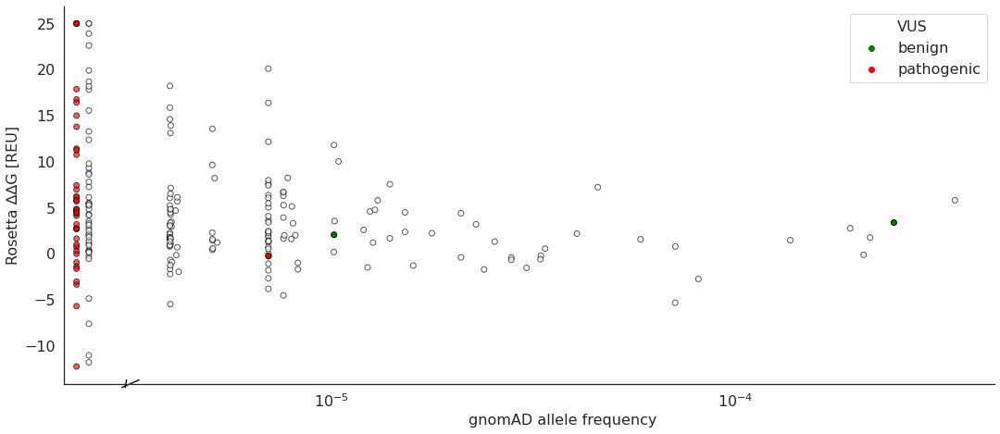

INFO:['VUS' nan 'pathogenic' 'conflict' 'benign']
INFO:#accession: P16615
INFO:['pathogenic' 'gnomad' 'unknown' 'gnomad|benign' 'gnomad|VUS' 'VUS']
INFO:['pathogenic' 'gnomad_low' nan 'gnomad_high']
INFO:['pathogenic' 'VUS' None 'benign']
INFO:[ 1. nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;ACT_SITE_00',
       'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=104)
INFO:[ 1. nan  0.]


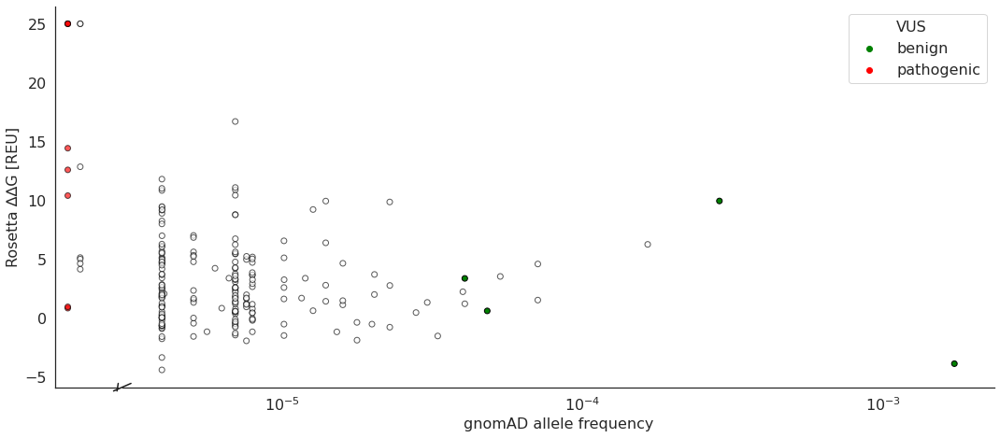

INFO:['pathogenic' nan 'benign' 'VUS']
INFO:#accession: P17787
INFO:['gnomad|VUS' 'gnomad' 'VUS' 'gnomad|conflict' 'gnomad|pathogenic'
 'unknown' 'gnomad|benign']
INFO:['gnomad_low' 'gnomad_high' nan 'pathogenic']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;SITE_00',
       'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00',
       'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00',
       'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_

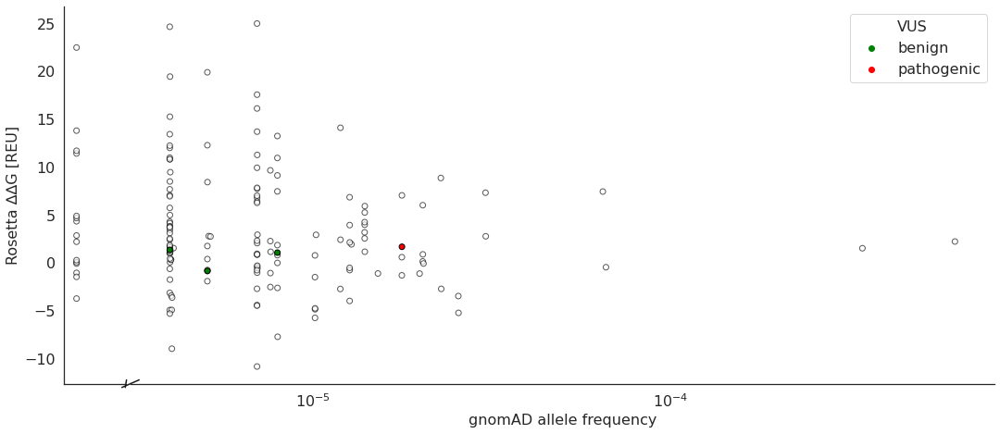

INFO:['VUS' nan 'conflict' 'pathogenic' 'benign']
INFO:#accession: P29033
INFO:['gnomad|conflict' 'gnomad' 'gnomad|VUS' 'VUS' 'gnomad|pathogenic'
 'unknown' 'pathogenic' 'gnomad|benign']
INFO:['gnomad_high' 'gnomad_low' nan 'pathogenic' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[ 0. nan  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnoma

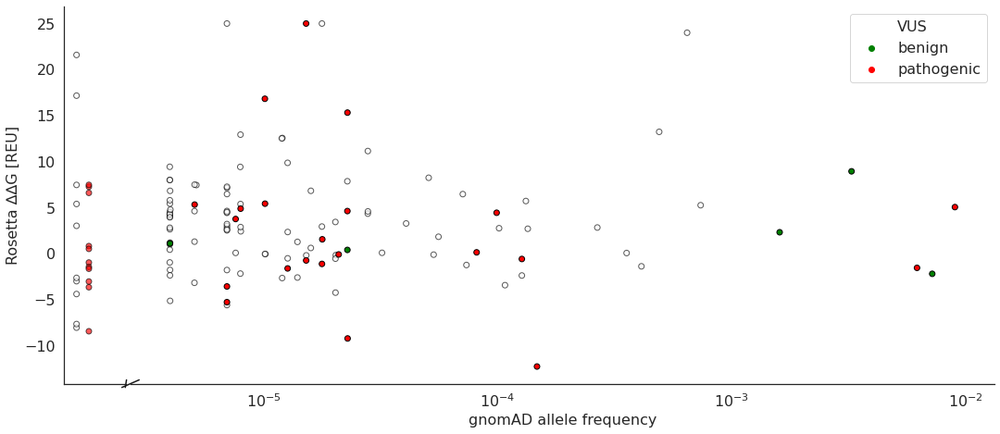

INFO:['conflict' nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P31213
INFO:['unknown' 'VUS' 'gnomad' 'benign' 'gnomad|pathogenic' 'gnomad|benign'
 'gnomad|VUS' 'pathogenic' 'gnomad|conflict']
INFO:[nan 'gnomad_high' 'benign' 'gnomad_low' 'pathogenic']
INFO:[None 'VUS' 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04',
       'rosetta;cart;LAR_04', 'rosettapdb;cart;energy

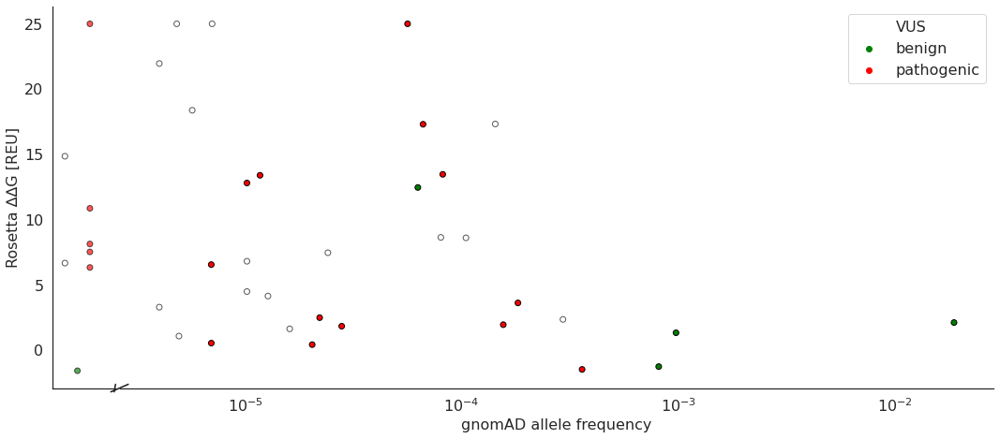

INFO:[nan 'VUS' 'benign' 'pathogenic' 'conflict']
INFO:#accession: P32245
INFO:['gnomad' 'unknown' 'gnomad|pathogenic' 'gnomad|benign' 'gnomad|VUS'
 'gnomad|conflict' 'VUS' 'pathogenic']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
    

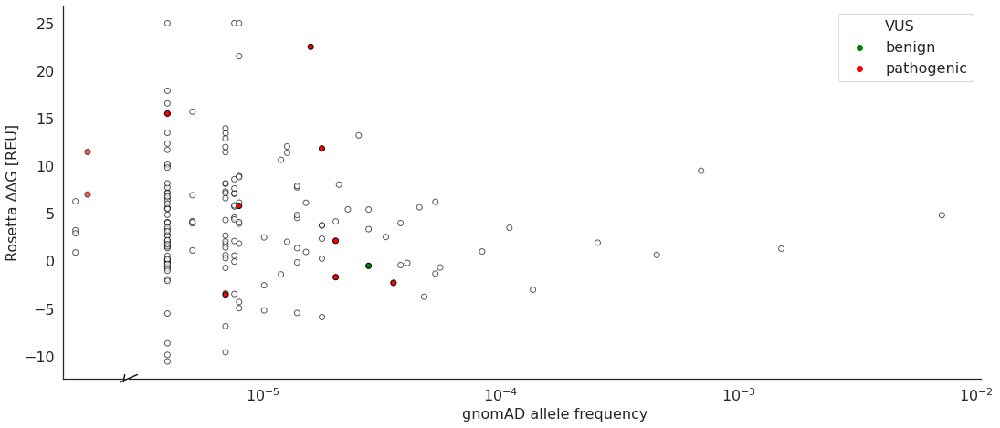

INFO:[nan 'pathogenic' 'benign' 'VUS' 'conflict']
INFO:#accession: P41181
INFO:['gnomad' 'gnomad|VUS' 'gnomad|pathogenic' 'pathogenic' 'unknown'
 'gnomad|benign']
INFO:['gnomad_low' 'pathogenic' nan 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;mobidb_lite_00',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygo

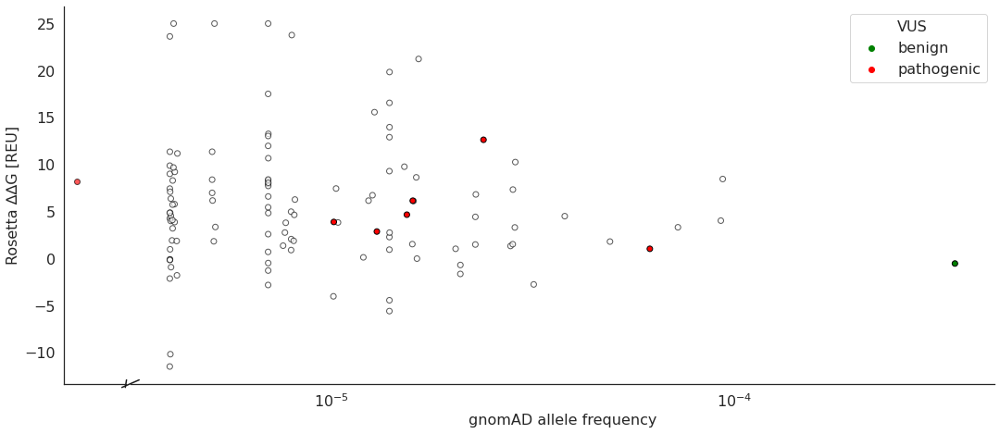

INFO:[nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P43681
INFO:['gnomad' 'gnomad|VUS' 'unknown' 'VUS' 'gnomad|conflict' 'pathogenic'
 'gnomad|benign']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=105)
INFO:[nan  0.  1.]


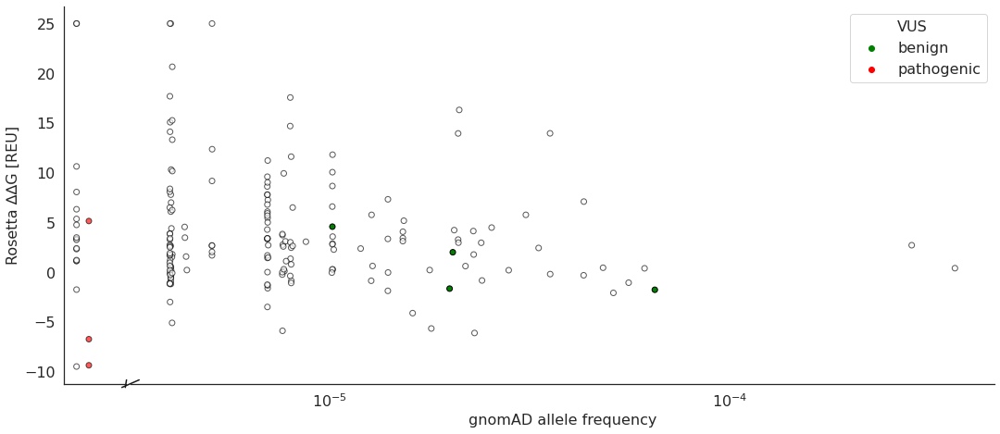

INFO:[nan 'VUS' 'conflict' 'pathogenic' 'benign']
INFO:#accession: Q8N5M9
INFO:['pathogenic' 'benign' 'gnomad|VUS' 'gnomad' 'VUS' 'conflict' 'unknown'
 'gnomad|benign' 'gnomad|pathogenic']
INFO:['pathogenic' 'benign' 'gnomad_low' nan 'gnomad_high']
INFO:['pathogenic' 'benign' 'VUS' None]
INFO:[ 1.  0. nan]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04',
       '

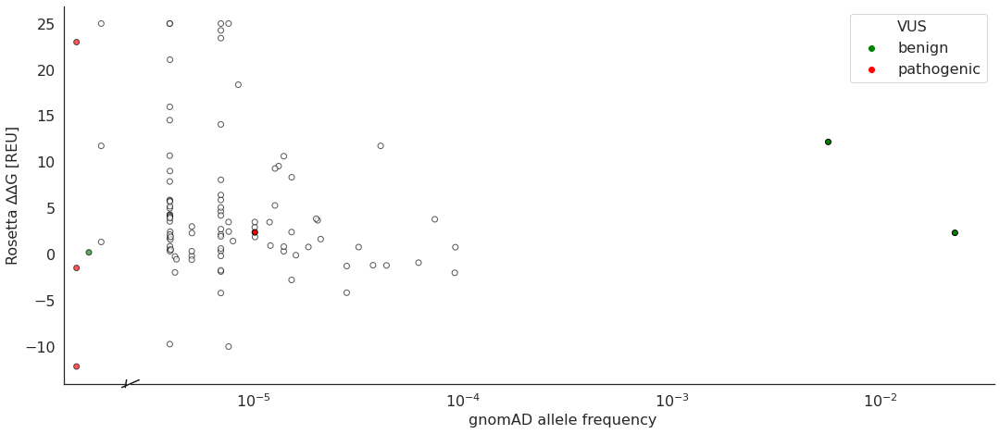

INFO:['pathogenic' 'benign' 'VUS' nan 'conflict']
INFO:#accession: Q99835
INFO:['gnomad' 'unknown' 'gnomad|benign' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homoz

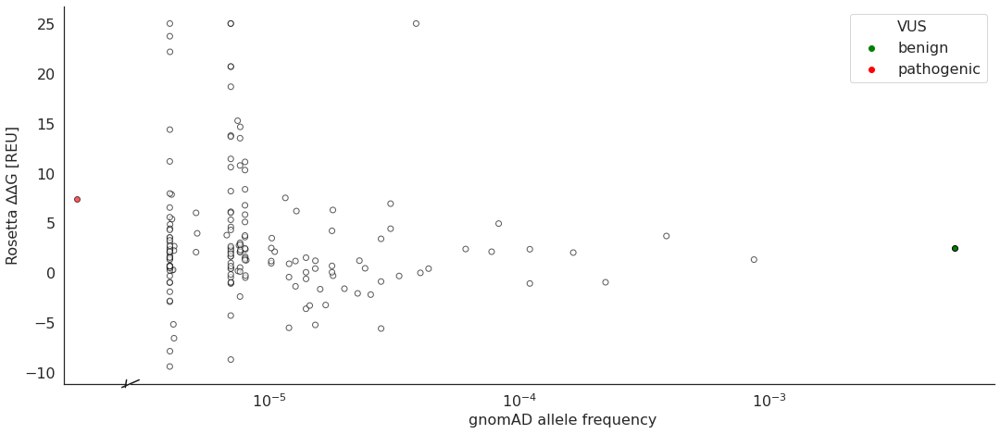

INFO:[nan 'benign' 'pathogenic']
INFO:#accession: Q9H221
INFO:['unknown' 'gnomad' 'gnomad|VUS' 'VUS' 'gnomad|benign']
INFO:[nan 'gnomad_low' 'gnomad_high']
INFO:[None 'VUS' 'benign']
INFO:[nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02',
       'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04',
       'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04',
       'rosettapdb;cart;energ

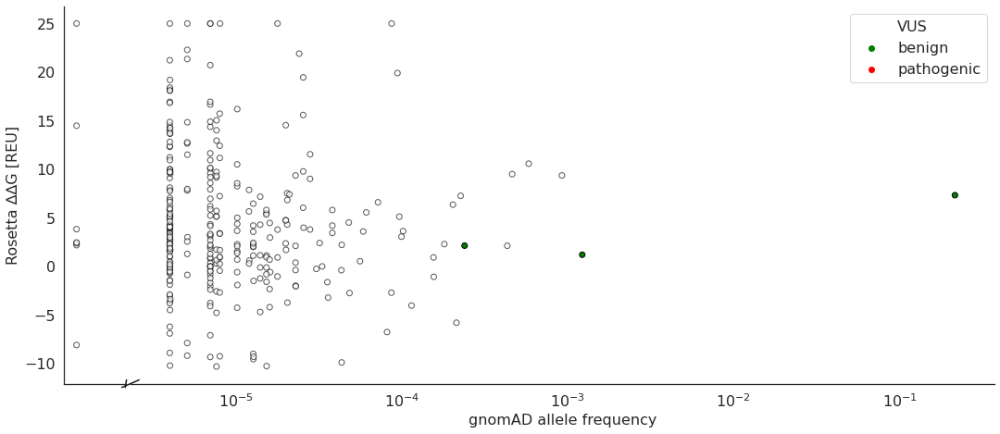

INFO:[nan 'VUS' 'benign']
INFO:#accession: Q9H3H5
INFO:['gnomad' 'unknown' 'VUS' 'gnomad|VUS' 'gnomad|pathogenic'
 'gnomad|conflict' 'pathogenic' 'gnomad|benign']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_

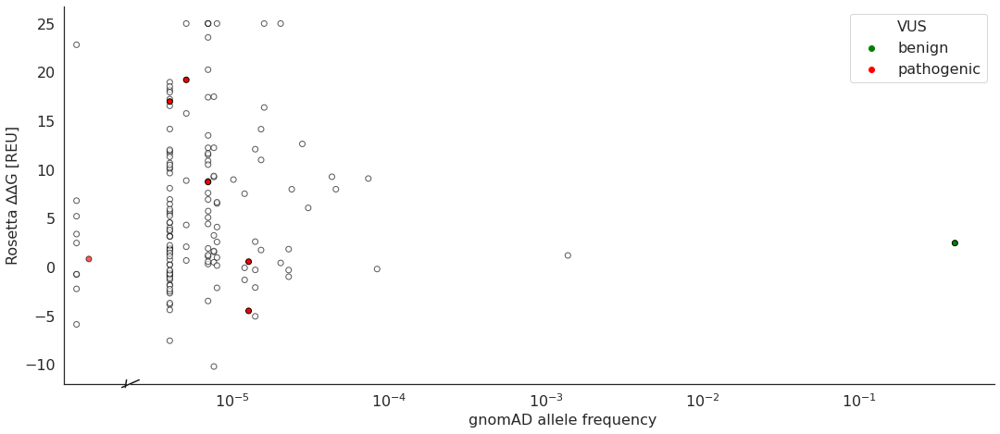

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:#accession: Q9ULV1
INFO:['gnomad' 'VUS' 'pathogenic' 'gnomad|VUS' 'gnomad|pathogenic' 'unknown'
 'gnomad|conflict' 'benign' 'gnomad|benign']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
   

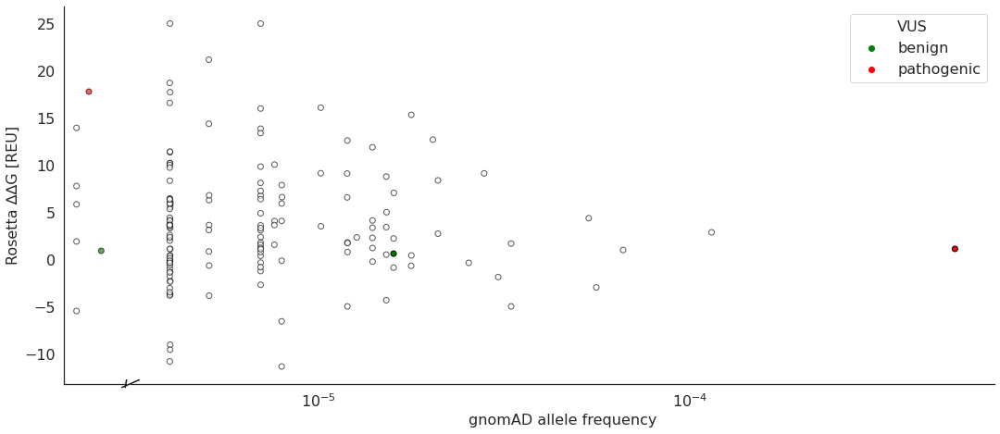

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:all
INFO:['VUS' None 'benign' 'pathogenic']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'uniprot;mobidb_lite_00', 'uniprot;ACT_SITE_00', 'spliceai;maxdelta_07',
       'spliceai;DS_AG_07', 'spliceai;DS_AL_07', 'spliceai;DS_DG_07',
       'spliceai;DS_DL_07', 'spliceai;HGVSc_07', 'uniprot;INTRAMEM_00',
       'uniprot;mobi_db_consensus_00'],
      dtype='object', length=113)
INFO:[nan  0.  1.]


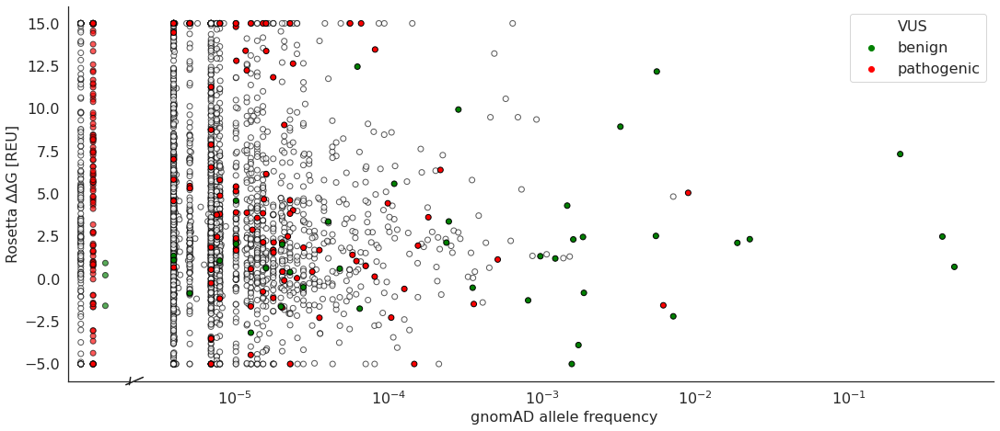

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']


In [65]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    target_plot_dir = os.path.join(plots_dir, target_uniprot)

    tmp_energy = target_dic_here[target_uniprot].copy()
    all_tmp.append(tmp_energy)

    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))
    
    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())
    
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 25, 'rosetta;ddG'] = 25
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -25, 'rosetta;ddG'] = -25
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))

    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())


INFO:#accession: O15118
INFO:['gnomad' 'gnomad|VUS' 'gnomad|conflict' 'unknown' 'gnomad|benign' 'VUS'
 'gnomad|pathogenic' 'pathogenic']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00', 'uniprot;HELIX_00', 'uniprot;TURN_00',
       'uniprot;COMPBIAS_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02'

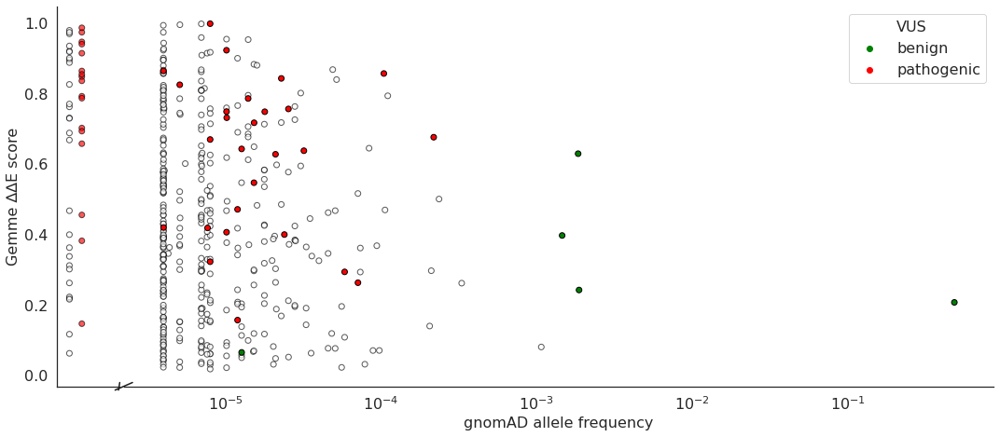

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']
INFO:#accession: P08100
INFO:['gnomad' 'pathogenic' 'gnomad|pathogenic' 'gnomad|conflict' 'VUS'
 'gnomad|VUS' 'gnomad|benign' 'unknown' 'conflict']
INFO:['gnomad_low' 'pathogenic' nan 'gnomad_high']
INFO:['VUS' 'pathogenic' 'benign' None]
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;LIPID_00', 'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;REGION_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
  

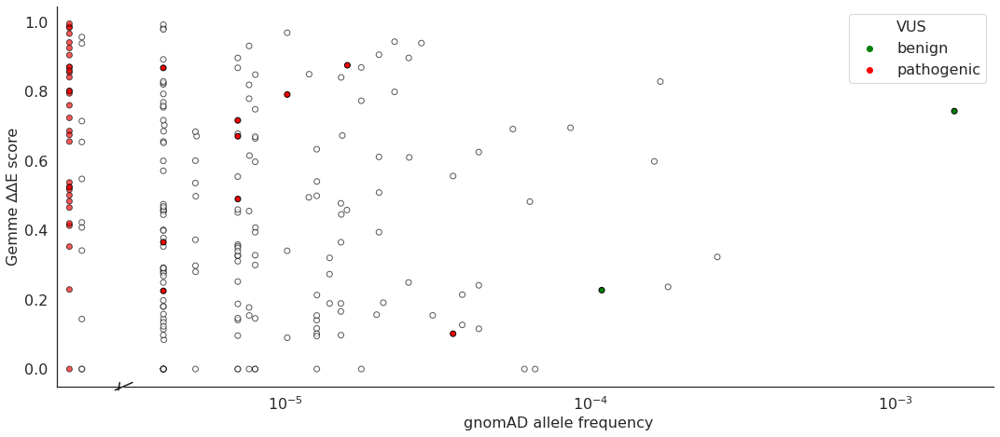

INFO:[nan 'pathogenic' 'conflict' 'VUS' 'benign']
INFO:#accession: P11166
INFO:['gnomad|VUS' 'gnomad' 'pathogenic' 'VUS' 'gnomad|conflict' 'unknown'
 'gnomad|pathogenic' 'conflict' 'gnomad|benign']
INFO:['gnomad_low' 'pathogenic' nan 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;MOD_RES_00', 'uniprot;CARBOHYD_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gno

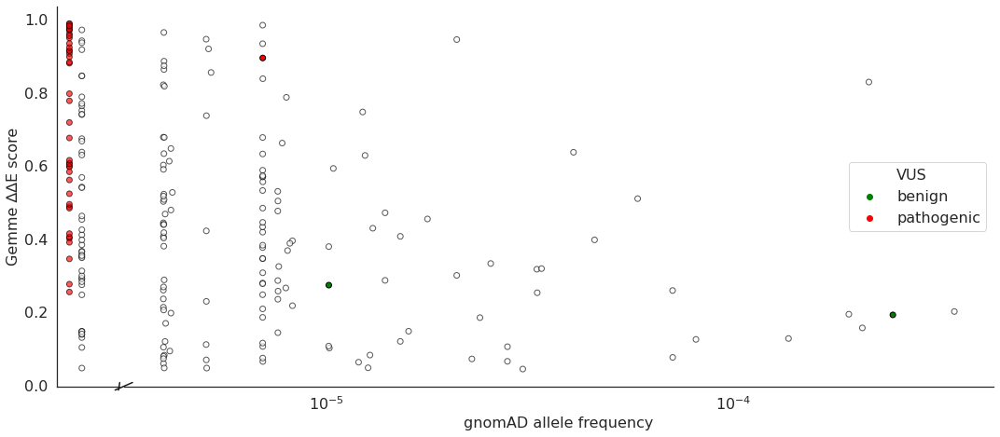

INFO:['VUS' nan 'pathogenic' 'conflict' 'benign']
INFO:#accession: P16615
INFO:['pathogenic' 'gnomad' 'unknown' 'gnomad|benign' 'gnomad|VUS' 'VUS']
INFO:['pathogenic' 'gnomad_low' nan 'gnomad_high']
INFO:['pathogenic' 'VUS' None 'benign']
INFO:[ 1. nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;ACT_SITE_00',
       'uniprot;BINDING_00', 'uniprot;METAL_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=104)
INFO:[ 1. nan  0.]


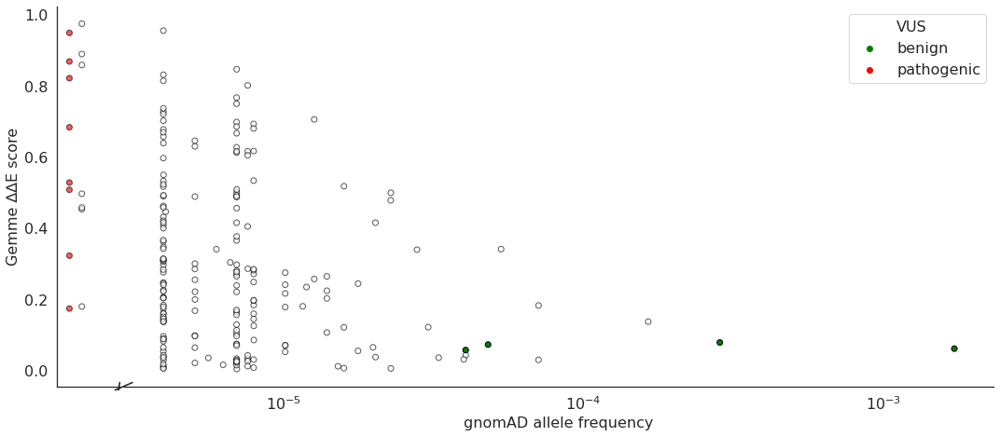

INFO:['pathogenic' nan 'benign' 'VUS']
INFO:#accession: P17787
INFO:['gnomad|VUS' 'gnomad' 'VUS' 'gnomad|conflict' 'gnomad|pathogenic'
 'unknown' 'gnomad|benign']
INFO:['gnomad_low' 'gnomad_high' nan 'pathogenic']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;SITE_00',
       'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00',
       'uniprot;SIGNAL_00', 'uniprot;DISULFID_00', 'uniprot;STRAND_00',
       'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_

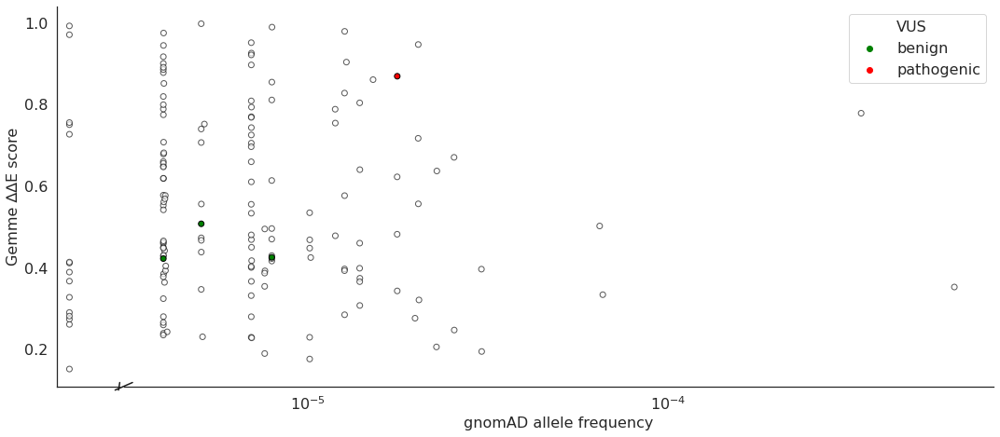

INFO:['VUS' nan 'conflict' 'pathogenic' 'benign']
INFO:#accession: P29033
INFO:['gnomad|conflict' 'gnomad' 'gnomad|VUS' 'VUS' 'gnomad|pathogenic'
 'unknown' 'pathogenic' 'gnomad|benign']
INFO:['gnomad_high' 'gnomad_low' nan 'pathogenic' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[ 0. nan  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;METAL_00',
       'uniprot;TRANSMEM_00', 'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnoma

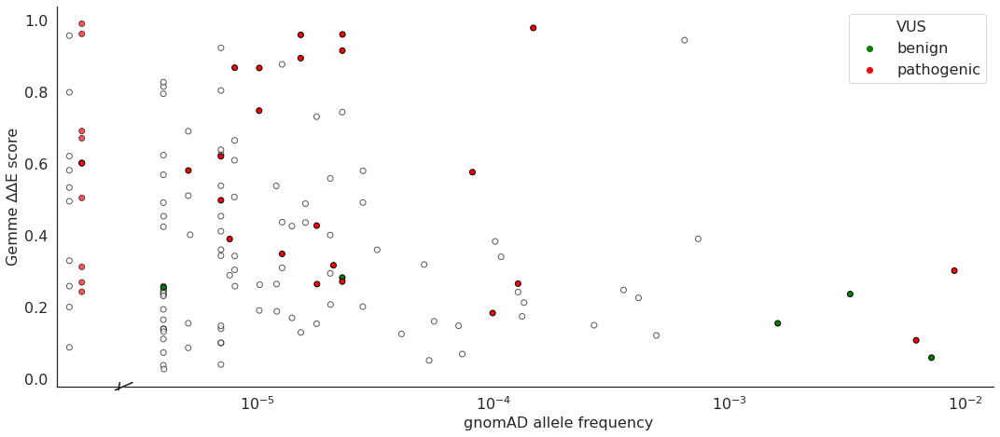

INFO:['conflict' nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P31213
INFO:['unknown' 'VUS' 'gnomad' 'benign' 'gnomad|pathogenic' 'gnomad|benign'
 'gnomad|VUS' 'pathogenic' 'gnomad|conflict']
INFO:[nan 'gnomad_high' 'benign' 'gnomad_low' 'pathogenic']
INFO:[None 'VUS' 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04',
       'rosetta;cart;LAR_04', 'rosettapdb;cart;energy

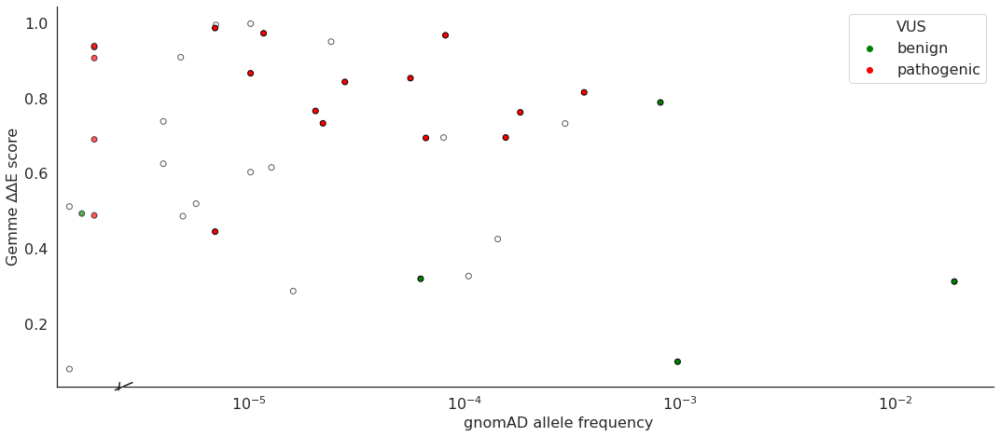

INFO:[nan 'VUS' 'benign' 'pathogenic' 'conflict']
INFO:#accession: P32245
INFO:['gnomad' 'unknown' 'gnomad|pathogenic' 'gnomad|benign' 'gnomad|VUS'
 'gnomad|conflict' 'VUS' 'pathogenic']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;CARBOHYD_00',
       'uniprot;DISULFID_00', 'uniprot;HELIX_00', 'uniprot;TURN_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
    

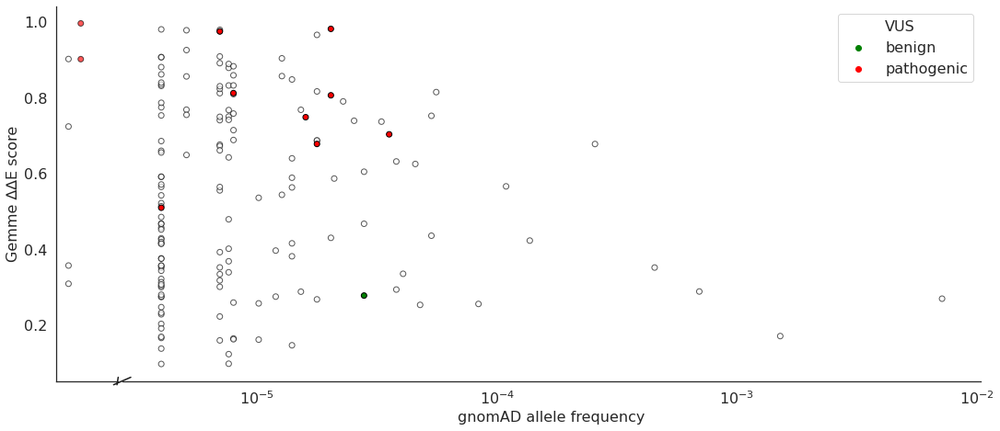

INFO:[nan 'pathogenic' 'benign' 'VUS' 'conflict']
INFO:#accession: P41181
INFO:['gnomad' 'gnomad|VUS' 'gnomad|pathogenic' 'pathogenic' 'unknown'
 'gnomad|benign']
INFO:['gnomad_low' 'pathogenic' nan 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;INTRAMEM_00', 'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'uniprot;mobidb_lite_00',
       'pdb;IDs', 'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygo

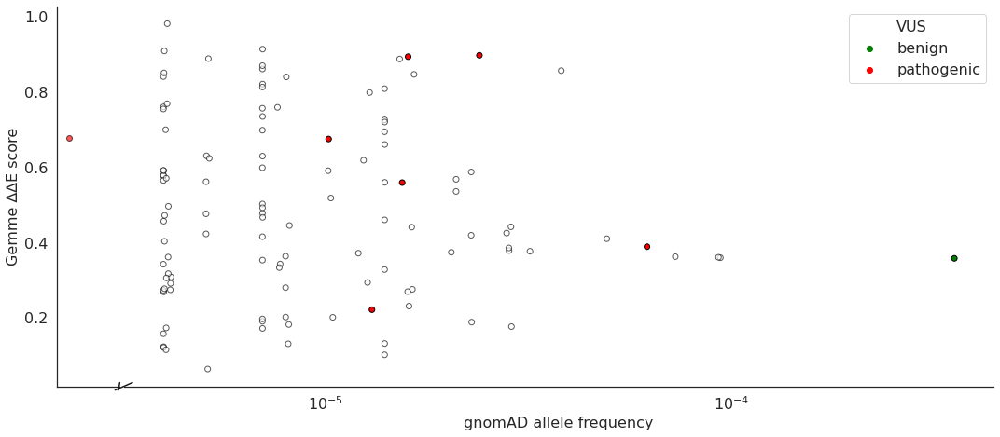

INFO:[nan 'VUS' 'pathogenic' 'benign']
INFO:#accession: P43681
INFO:['gnomad' 'gnomad|VUS' 'unknown' 'VUS' 'gnomad|conflict' 'pathogenic'
 'gnomad|benign']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;LIPID_00', 'uniprot;MOD_RES_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'gemme;seqperlen', 'gemme;coverage_count', 'negative_count',
       'label_class_raw', 'group', 'gnomad;AF_tot_first', 'gemme;score;norm',
       'gemme;score;ori', 'uniprot_id', 'label_class_detail'],
      dtype='object', length=105)
INFO:[nan  0.  1.]


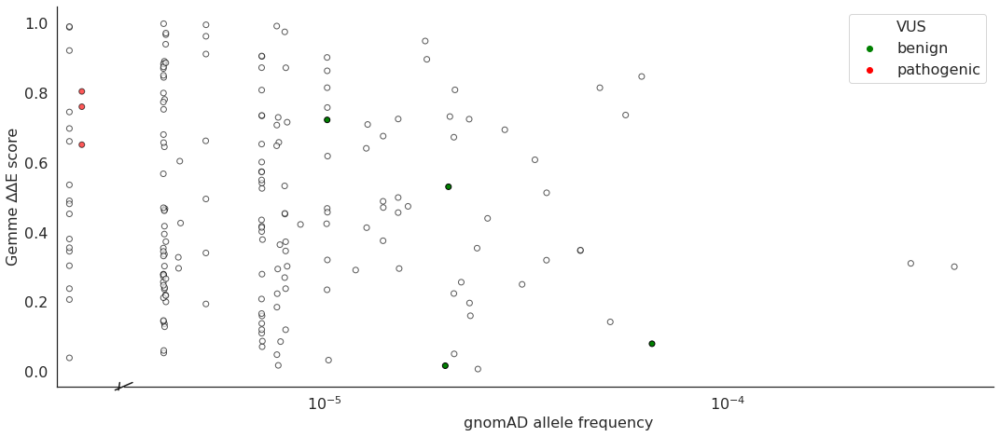

INFO:[nan 'VUS' 'conflict' 'pathogenic' 'benign']
INFO:#accession: Q8N5M9
INFO:['pathogenic' 'benign' 'gnomad|VUS' 'gnomad' 'VUS' 'conflict' 'unknown'
 'gnomad|benign' 'gnomad|pathogenic']
INFO:['pathogenic' 'benign' 'gnomad_low' nan 'gnomad_high']
INFO:['pathogenic' 'benign' 'VUS' None]
INFO:[ 1.  0. nan]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;MOD_RES_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_02', 'gemme;score',
       'rosetta;ddG', 'rosetta;cart;std_ddG_04', 'rosetta;cart;TMspan_04',
       '

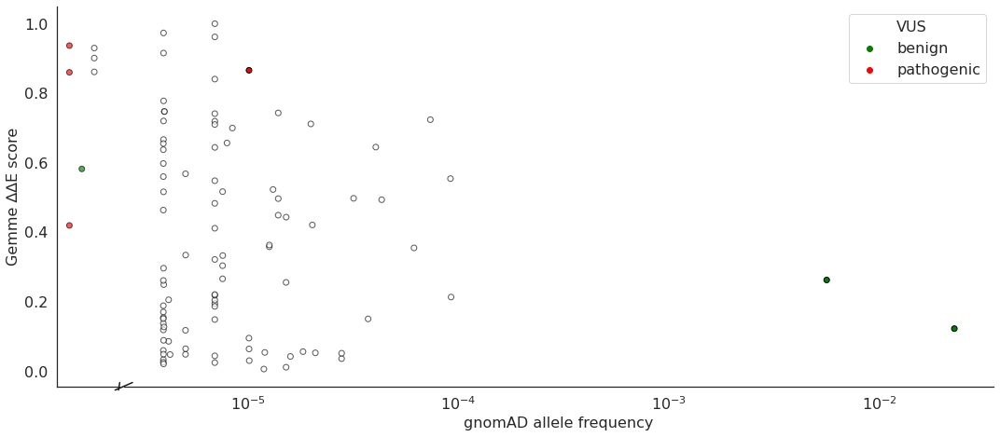

INFO:['pathogenic' 'benign' 'VUS' nan 'conflict']
INFO:#accession: Q99835
INFO:['gnomad' 'unknown' 'gnomad|benign' 'pathogenic']
INFO:['gnomad_low' nan 'gnomad_high' 'pathogenic']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homoz

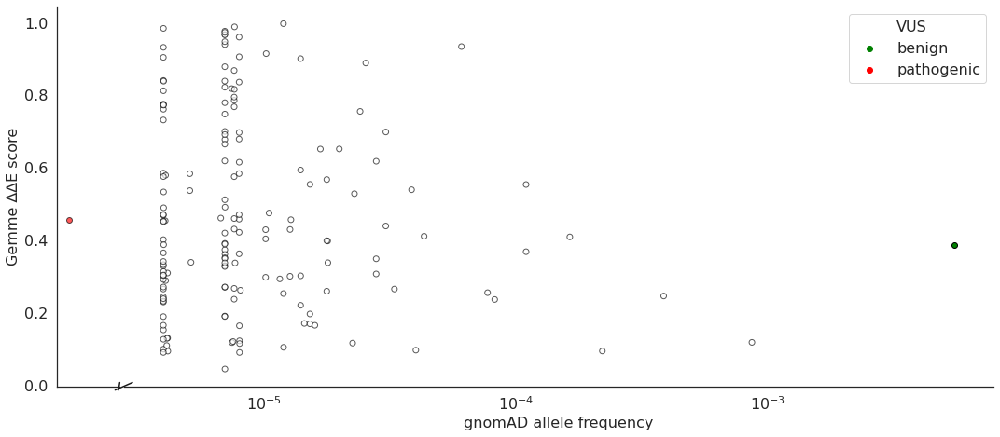

INFO:[nan 'benign' 'pathogenic']
INFO:#accession: Q9H221
INFO:['unknown' 'gnomad' 'gnomad|VUS' 'VUS' 'gnomad|benign']
INFO:[nan 'gnomad_low' 'gnomad_high']
INFO:[None 'VUS' 'benign']
INFO:[nan  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;mobidb_lite_00',
       'uniprot;mobi_db_consensus_00', 'pdb;IDs', 'clinvar;Clinvar_ID_01',
       'clinvar;Clinvar_signifiance_01', 'clinvar;Clinvar_review_status_01',
       'gnomad;AF_tot_02', 'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02',
       'gnomad;std_AF_ex_02', 'gnomad;AC_ex_02', 'gnomad;AN_ex_02',
       'gnomad;AF_g_02', 'gnomad;std_AF_g_02', 'gnomad;AC_g_02',
       'gnomad;AN_g_02', 'gnomad;Codons_ex_02', 'gnomad;Codons_g_02',
       'gnomad;Homozygotes_ex_02', 'gnomad;Homozygotes_g_02', 'gnomad;SNP_02',
       'gemme;score', 'rosetta;ddG', 'rosetta;cart;std_ddG_04',
       'rosetta;cart;TMspan_04', 'rosetta;cart;LAR_04',
       'rosettapdb;cart;energ

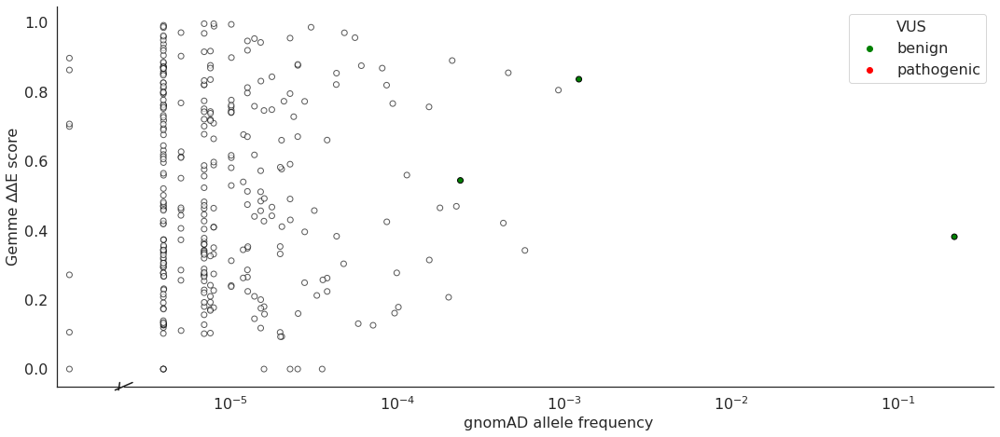

INFO:[nan 'VUS' 'benign']
INFO:#accession: Q9H3H5
INFO:['gnomad' 'unknown' 'VUS' 'gnomad|VUS' 'gnomad|pathogenic'
 'gnomad|conflict' 'pathogenic' 'gnomad|benign']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high']
INFO:['VUS' None 'pathogenic' 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;METAL_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;REGION_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
       'gnomad;Homozygotes_g_02', 'gnomad;SNP_

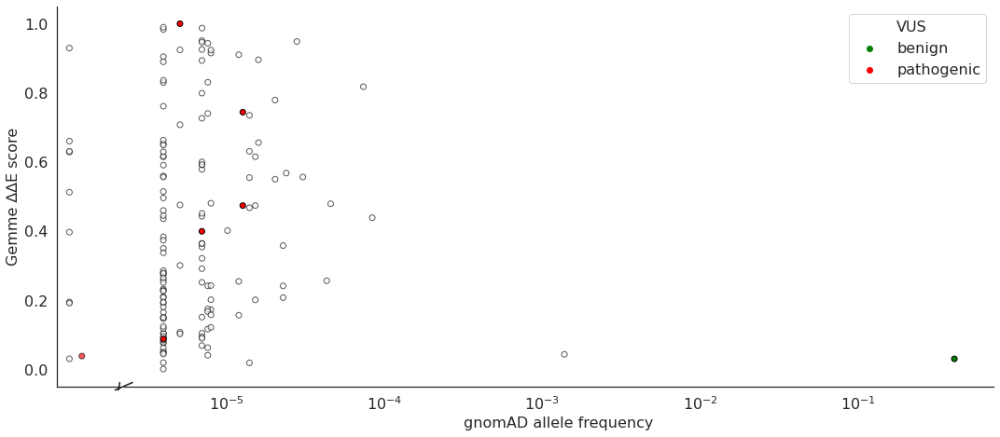

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:#accession: Q9ULV1
INFO:['gnomad' 'VUS' 'pathogenic' 'gnomad|VUS' 'gnomad|pathogenic' 'unknown'
 'gnomad|conflict' 'benign' 'gnomad|benign']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' 'pathogenic' None 'benign']
INFO:[nan  1.  0.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;DISULFID_00', 'uniprot;STRAND_00', 'uniprot;HELIX_00',
       'uniprot;TURN_00', 'uniprot;MOTIF_00', 'pdb;IDs',
       'clinvar;Clinvar_ID_01', 'clinvar;Clinvar_signifiance_01',
       'clinvar;Clinvar_review_status_01', 'gnomad;AF_tot_02',
       'gnomad;std_AF_tot_02', 'gnomad;AF_ex_02', 'gnomad;std_AF_ex_02',
       'gnomad;AC_ex_02', 'gnomad;AN_ex_02', 'gnomad;AF_g_02',
       'gnomad;std_AF_g_02', 'gnomad;AC_g_02', 'gnomad;AN_g_02',
       'gnomad;Codons_ex_02', 'gnomad;Codons_g_02', 'gnomad;Homozygotes_ex_02',
   

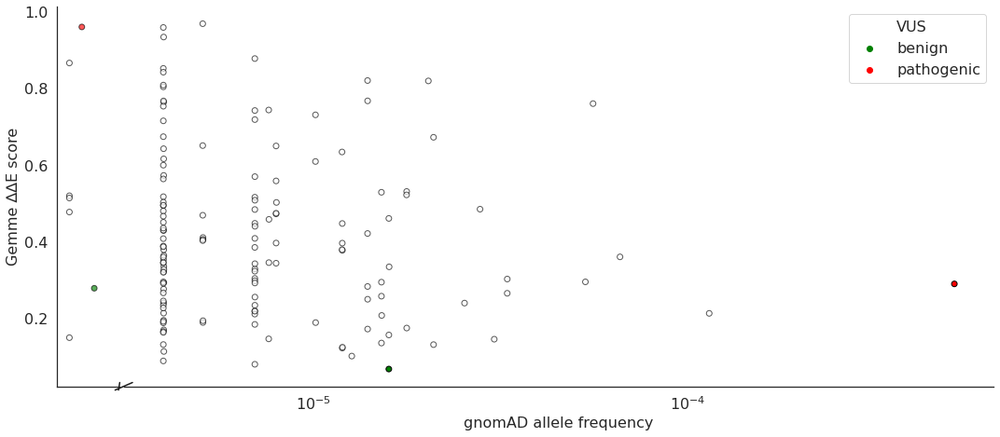

INFO:[nan 'VUS' 'pathogenic' 'conflict' 'benign']
INFO:all
INFO:['VUS' None 'benign' 'pathogenic']
INFO:['gnomad_low' nan 'pathogenic' 'gnomad_high' 'benign']
INFO:['VUS' None 'benign' 'pathogenic']
INFO:[nan  0.  1.]
INFO:Index(['variant', 'uniprot;pfam_name_00', 'uniprot;BINDING_00',
       'uniprot;SITE_00', 'uniprot;TRANSMEM_00', 'uniprot;TOPO_DOM_00',
       'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00', 'uniprot;DISULFID_00',
       'uniprot;STRAND_00',
       ...
       'uniprot;mobidb_lite_00', 'uniprot;ACT_SITE_00', 'spliceai;maxdelta_07',
       'spliceai;DS_AG_07', 'spliceai;DS_AL_07', 'spliceai;DS_DG_07',
       'spliceai;DS_DL_07', 'spliceai;HGVSc_07', 'uniprot;INTRAMEM_00',
       'uniprot;mobi_db_consensus_00'],
      dtype='object', length=113)
INFO:[nan  0.  1.]


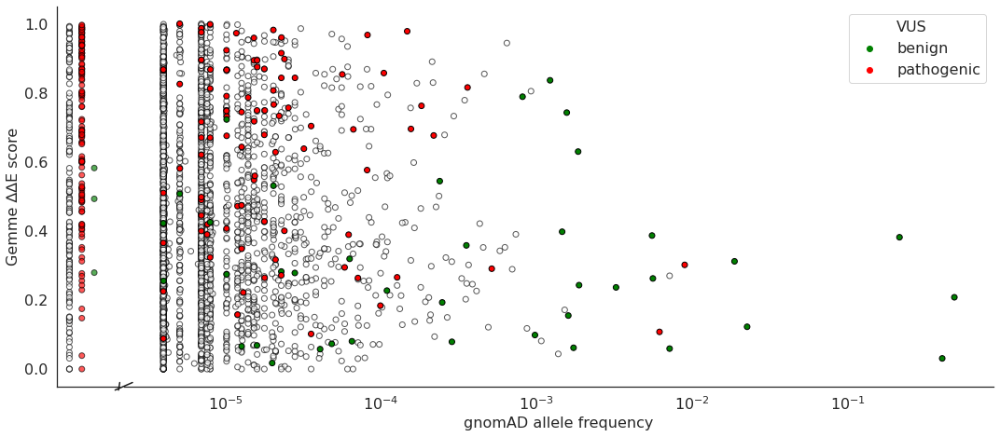

INFO:[nan 'VUS' 'conflict' 'benign' 'pathogenic']


In [66]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    
    tmp_energy = target_dic_here[target_uniprot].copy()
    all_tmp.append(tmp_energy)
    
    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))
    
    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
                   
    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 25, 'rosetta;ddG'] = 25
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -25, 'rosetta;ddG'] = -25
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3b(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())
    
all_tmp = pd.concat(all_tmp)
for region in ['all', ]:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    tmp_energy['label_class_detail'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class_detail'] = tmp_energy['label_class_detail'].apply(lambda x: gnomad_class_anno3(x, split_val=cutoff_value))

    logger.info(tmp_energy['label'].unique())
    logger.info(tmp_energy['label_class'].unique())
    logger.info(tmp_energy['label_class_detail'].unique())
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'groupA'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'groupB'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    logger.info(tmp_energy.columns)
    logger.info(tmp_energy['score'].unique())

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 25, 'rosetta;ddG'] = 25
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -25, 'rosetta;ddG'] = -25
    min_y = tmp_energy['rosetta;ddG'].min()
    max_y = tmp_energy['rosetta;ddG'].max()
    tmp_energy['label'] = tmp_energy['label_class_detail']
    fishtail_plot_adapt3b(tmp_energy, min_y, max_y, labeling=False)
    logger.info(tmp_energy['clinvar;significance_all'].unique())


### quadrant count plot

In [67]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    logger.info(f'#accession: {target_uniprot}')
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    all_tmp.append(tmp_energy)
all_tmp = pd.concat(all_tmp)

INFO:#accession: O15118
INFO:#accession: P08100
INFO:#accession: P11166
INFO:#accession: P16615
INFO:#accession: P17787
INFO:#accession: P29033
INFO:#accession: P31213
INFO:#accession: P32245
INFO:#accession: P41181
INFO:#accession: P43681
INFO:#accession: Q8N5M9
INFO:#accession: Q99835
INFO:#accession: Q9H221
INFO:#accession: Q9H3H5
INFO:#accession: Q9ULV1


INFO:all
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


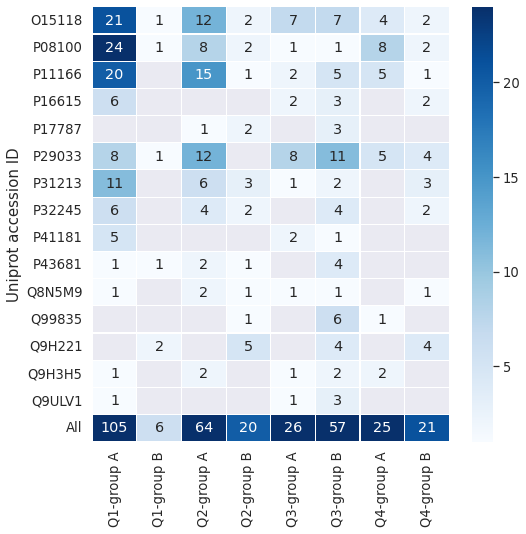

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


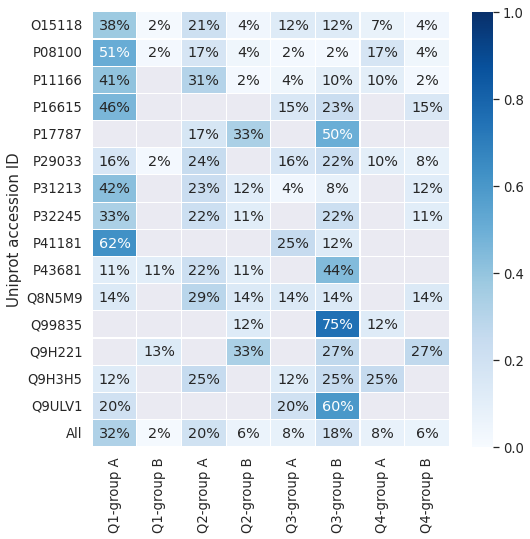

INFO:TRANSMEM
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


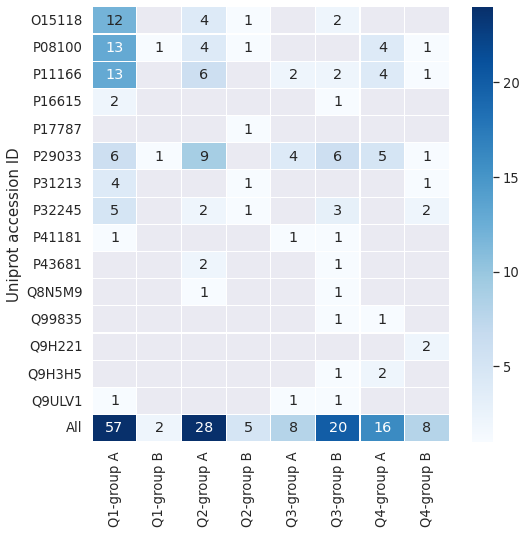

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


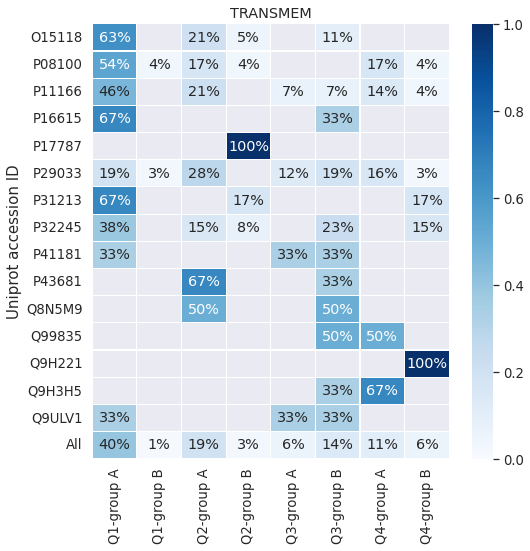

In [68]:
x_range = 1
y_range = 0.1

for region in ['all', 'TRANSMEM']:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    title = ''
    if region != 'all':
        title = region
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    
    tmpi['c'] = 1
    df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["accession"], values='c', aggfunc=len, margins=True)
    df2.drop(columns=['All'], inplace=True)

    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,8))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, fmt=".0f", vmin=1, vmax=24)
        plt.xlabel('')
        plt.ylabel("Uniprot accession ID", size=15)
        plt.show()

    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

    tmpi2 = tmpi.copy()
    tmpi2['c'] = 1
    df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["accession"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
    df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
    df2.drop(columns=['All'], inplace=True)
    
    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,8))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
        plt.xlabel('')
        plt.title(title)
        plt.ylabel("Uniprot accession ID", size=15)
        plt.show()
    

INFO:all
INFO:all


<Figure size 576x576 with 0 Axes>

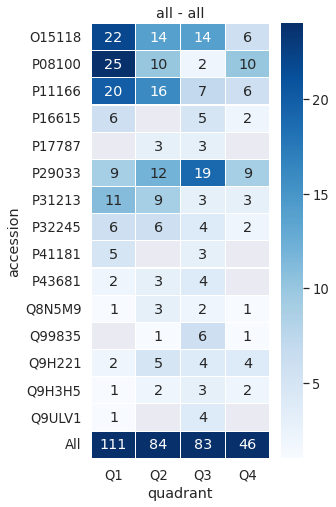

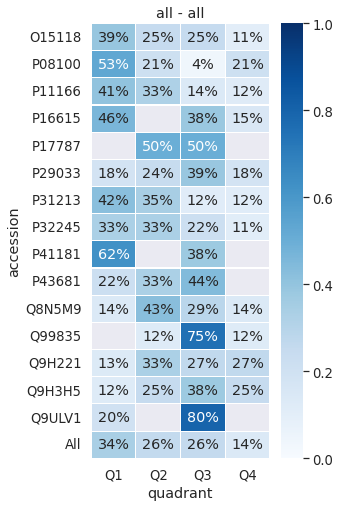

INFO:group A
INFO:all


<Figure size 576x576 with 0 Axes>

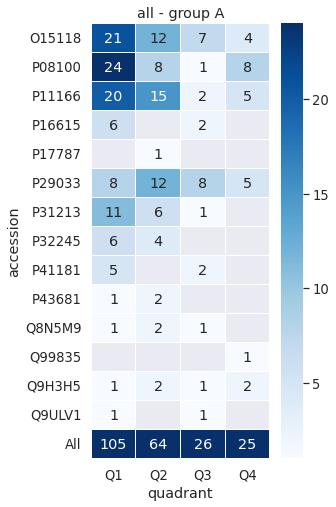

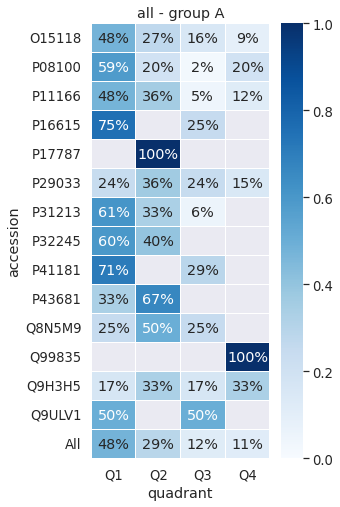

INFO:group B
INFO:all


<Figure size 576x576 with 0 Axes>

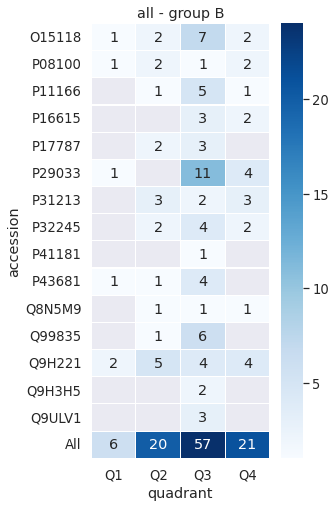

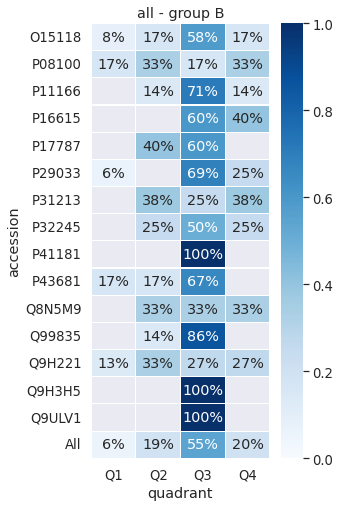

INFO:all
INFO:TRANSMEM


<Figure size 576x576 with 0 Axes>

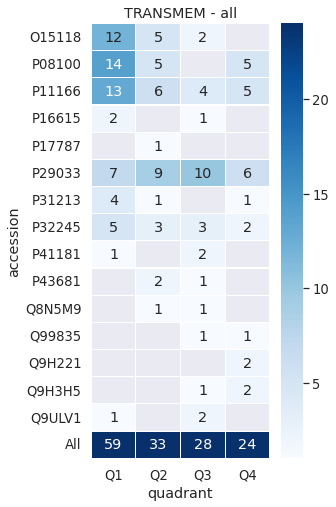

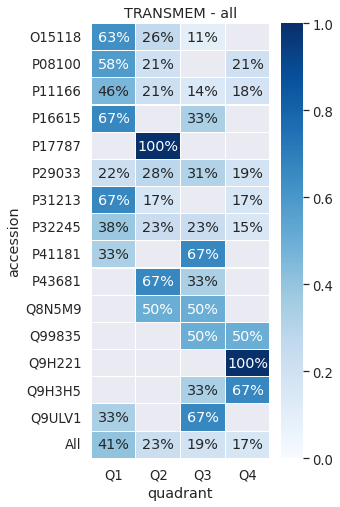

INFO:group A
INFO:TRANSMEM


<Figure size 576x576 with 0 Axes>

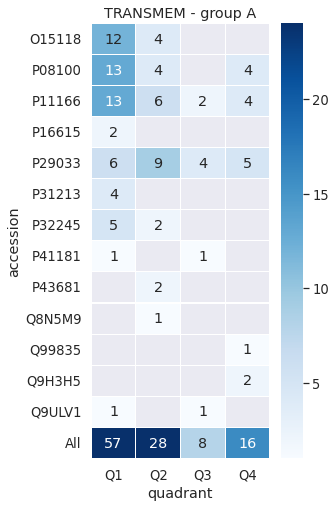

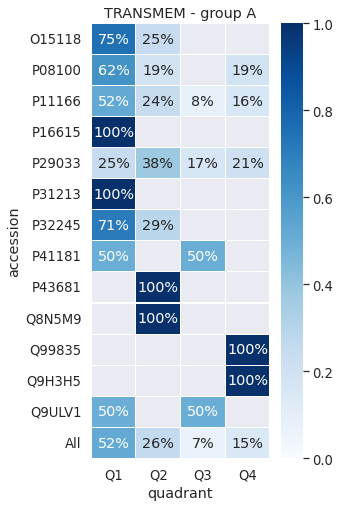

INFO:group B
INFO:TRANSMEM


<Figure size 576x576 with 0 Axes>

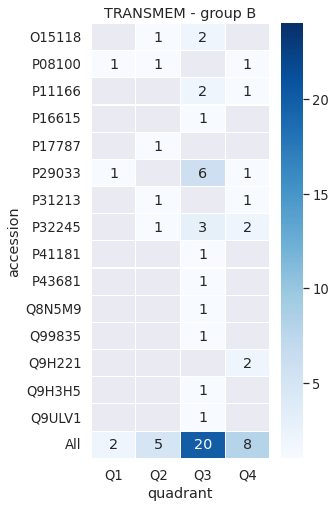

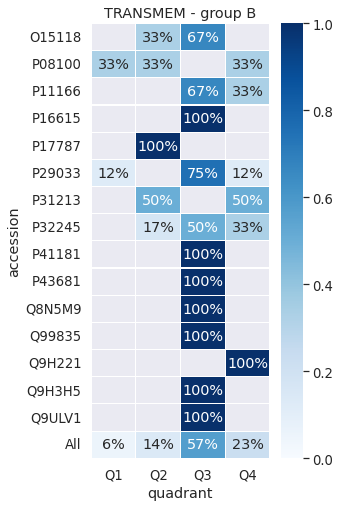

In [69]:
cutoff_value = gnomAD_cutoff_value
x_range = 1
y_range = 0.1
rosetta_grey = False
gemme_grey = False
maxdelta_spliceai_column_global_name = 'maxdelta_spliceai'

for region in ['all', 'TRANSMEM']:
    for case in ['all', 'group A', 'group B']:
        logger.info(case)
        logger.info(region)
        f = plt.figure(figsize=(8,8))
        tmp_energy = all_tmp.copy()
        if region != 'all':
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        if case == 'all':
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        else:
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[(tmpi['label']==case)].reset_index(drop=True)
        f = plt.figure(figsize=(4,8))
        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant"], index=["accession"], values='c', aggfunc=len, margins=True)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, fmt=".0f", vmin=1, vmax=24)
        plt.title(f'{region} - {case}')
        plt.show()
        
        if case == 'all':
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        else:
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[(tmpi['label']==case)].reset_index(drop=True)
        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant"], index=["accession"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)
        f = plt.figure(figsize=(4,8))
        with sns.axes_style("darkgrid"):
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
        plt.title(f'{region} - {case}')
        plt.show()
    

### Mean & median wt vs mut count plot

INFO:all


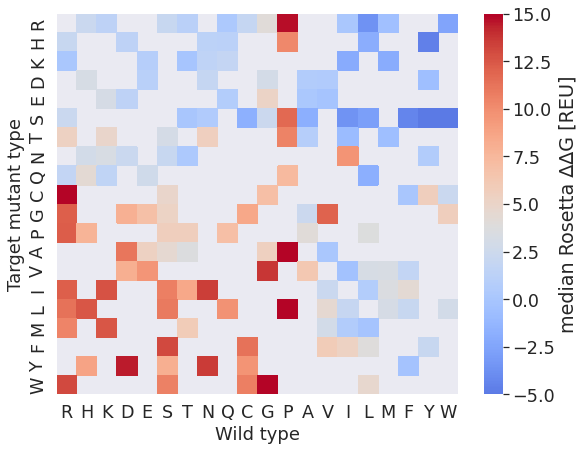

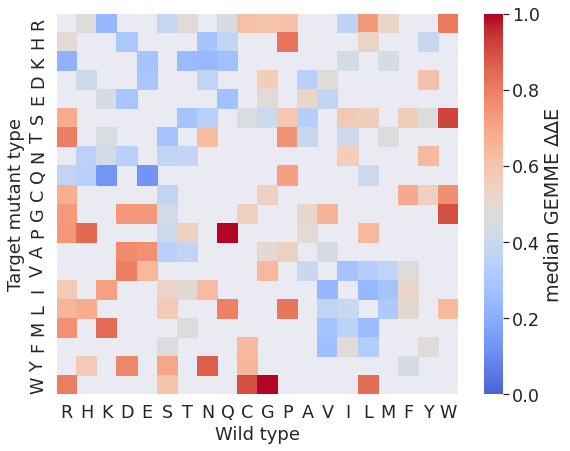

INFO:group A


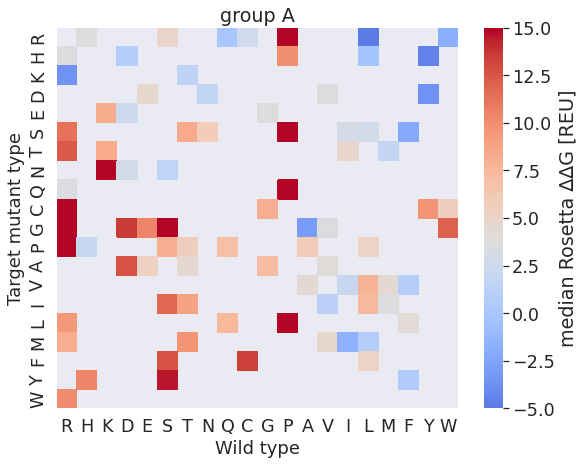

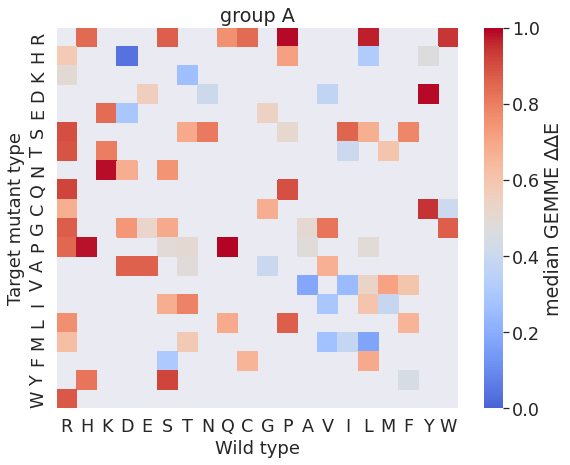

INFO:group B


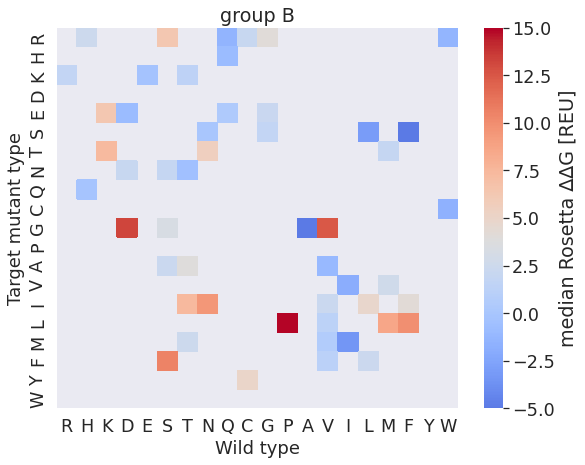

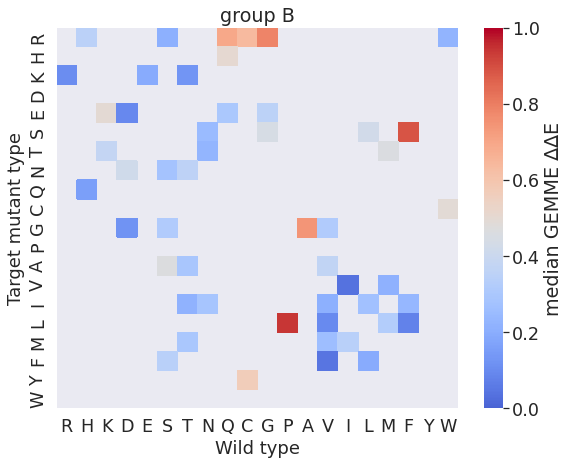

In [55]:
grouped_AA = {"R":1, "H":2, "K":3, "D":4, "E":5, "S":6, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    tmp_energy['wild type'] = tmp_energy['variant'].apply(lambda x: x[0])
    tmp_energy['mutant'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy.loc[tmp_energy['rosetta;ddG']>15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']<-5, 'rosetta;ddG'] = -5
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp).reset_index(drop=True)
for group in ['all', 'group A', 'group B']:
    logger.info(group)
    for aggfunc in ['median', ]:
        heatmap_df = all_tmp.copy()
        title = ''
        if group != 'all':
            title = group
            heatmap_df = heatmap_df.loc[heatmap_df['label']==group].reset_index(drop=True)

        heatmap_df['var'] = heatmap_df['wild type']
        heatmap_df['mut'] = heatmap_df['mutant']
        all_resis = heatmap_df['mut'].unique()
        all_length = len(heatmap_df['mut'].unique())
        min_val = heatmap_df['rosetta;ddG'].min()
        max_val = heatmap_df['rosetta;ddG'].max()
        heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
        heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="rosetta;ddG", aggfunc=aggfunc)

        for elem in ["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]:
            if not elem in heatmap_pvt.columns:
                heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
            if not elem in heatmap_pvt.index:
                heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
        heatmap_pvt = heatmap_pvt[["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]]
        heatmap_pvt['sorter'] = [grouped_AA[x] for x in heatmap_pvt.index]
        heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
        heatmap_pvt = heatmap_pvt.drop(columns='sorter')
        with sns.axes_style("darkgrid"):
            fig = plt.figure(figsize=(9,7))
            sns.set(font_scale=1.6)
            ax = sns.heatmap(heatmap_pvt, vmax=max_val, vmin=min_val, cmap='coolwarm',center=all_execpt_vals_cat['all'][8], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                             cbar_kws={'label': f'{aggfunc} Rosetta ∆∆G [REU]', })

            plt.xlabel('Wild type', fontsize=18)
            plt.ylabel('Target mutant type', fontsize=18)
            plt.title(title)
            plt.show()
        heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
        heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="gemme;score", aggfunc=aggfunc)

        for elem in ["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]:
            if not elem in heatmap_pvt.columns:
                heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
            if not elem in heatmap_pvt.index:
                heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
        heatmap_pvt = heatmap_pvt[["R", "H", "K", "D", "E", "S", "T", "N", "Q", "C", "G", "P", "A", "V", "I", "L", "M", "F", "Y", "W"]]
        heatmap_pvt['sorter'] = [grouped_AA[x] for x in heatmap_pvt.index]
        heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
        heatmap_pvt = heatmap_pvt.drop(columns='sorter')
        with sns.axes_style("darkgrid"):
            fig = plt.figure(figsize=(9,7))
            sns.set(font_scale=1.6)
            ax = sns.heatmap(heatmap_pvt, vmax=1, vmin=0, cmap='coolwarm',center=all_execpt_vals_cat['all'][9], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                             cbar_kws={'label': f'{aggfunc} GEMME ∆∆E', })#

            plt.xlabel('Wild type', fontsize=18)
            plt.ylabel('Target mutant type', fontsize=18)
            plt.title(title)
            plt.show()


INFO:kdHydrophobicitya
INFO:group A


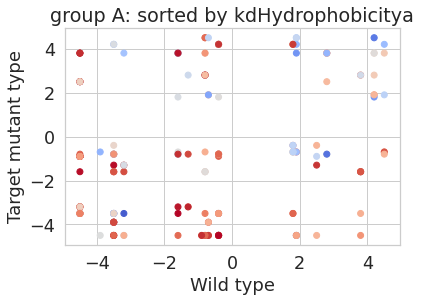

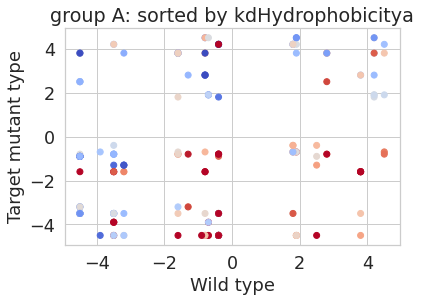

INFO:['R', 'K', 'N', 'D', 'Q', 'E', 'H', 'P', 'Y', 'W', 'S', 'T', 'G', 'A', 'M', 'C', 'F', 'L', 'V', 'I']


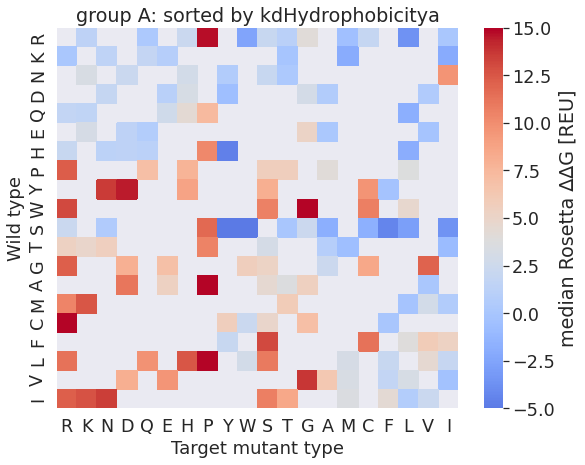

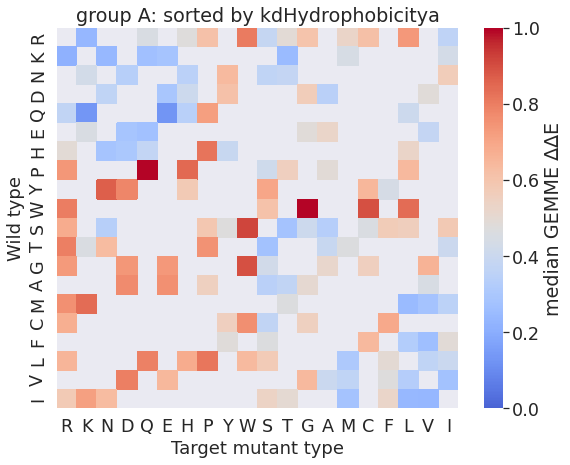

INFO:wwHydrophobicityb
INFO:group A


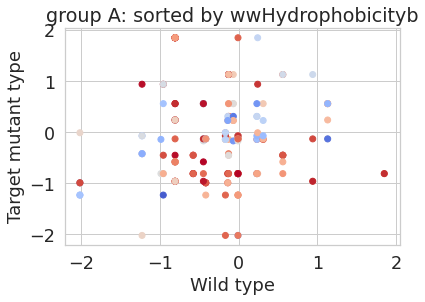

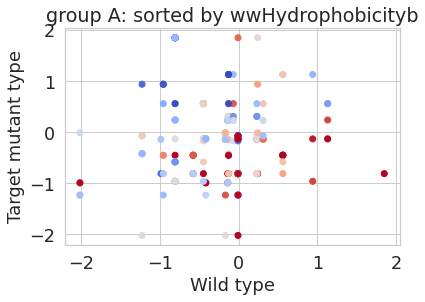

INFO:['E', 'D', 'K', 'H', 'R', 'Q', 'P', 'N', 'A', 'T', 'S', 'V', 'G', 'M', 'C', 'I', 'L', 'Y', 'F', 'W']


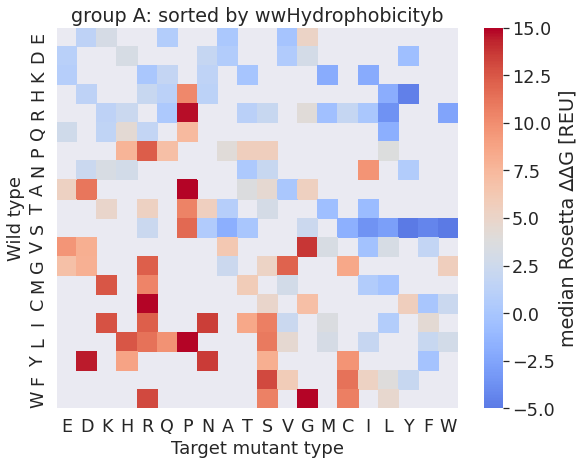

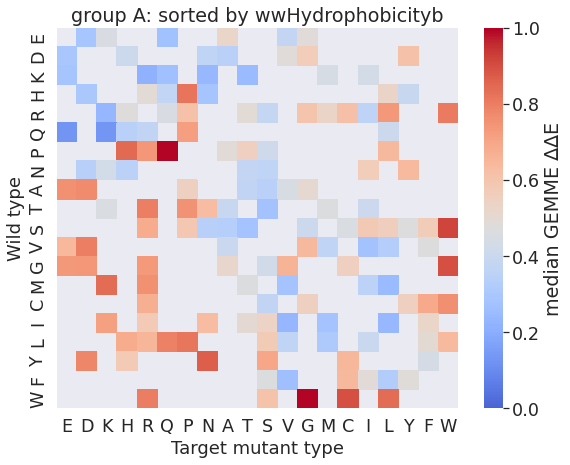

INFO:hhHydrophobicityc
INFO:group A


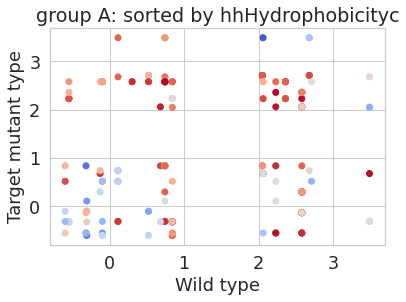

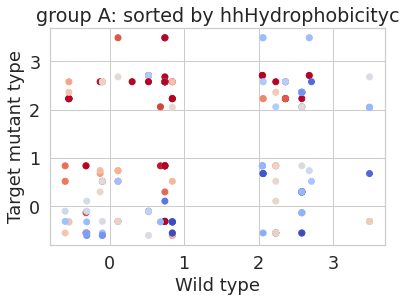

INFO:['I', 'L', 'F', 'V', 'C', 'M', 'A', 'W', 'T', 'Y', 'G', 'S', 'N', 'H', 'P', 'Q', 'R', 'E', 'K', 'D']


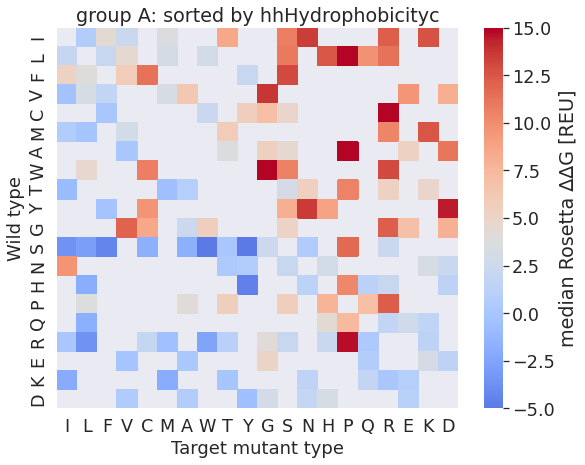

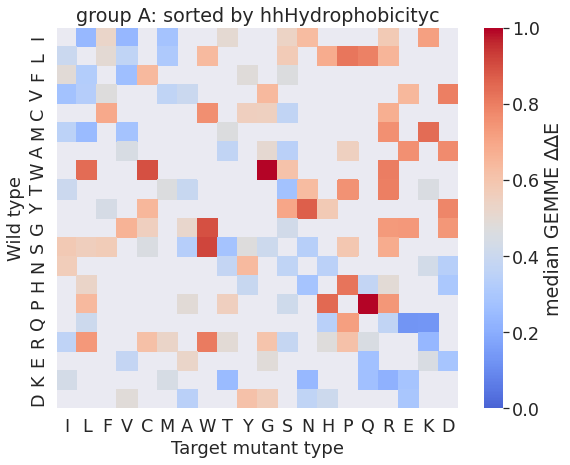

INFO:mfHydrophobicityd
INFO:group A


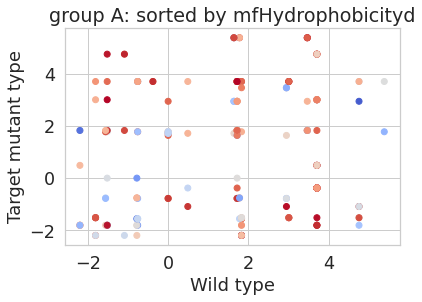

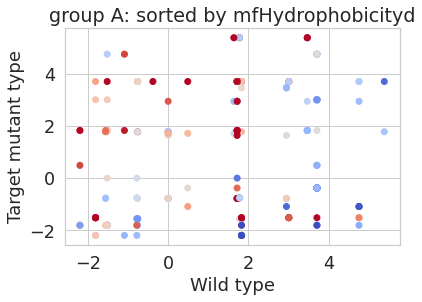

INFO:['F', 'L', 'I', 'P', 'Y', 'V', 'M', 'W', 'A', 'C', 'E', 'G', 'T', 'S', 'D', 'Q', 'N', 'R', 'H', 'K']


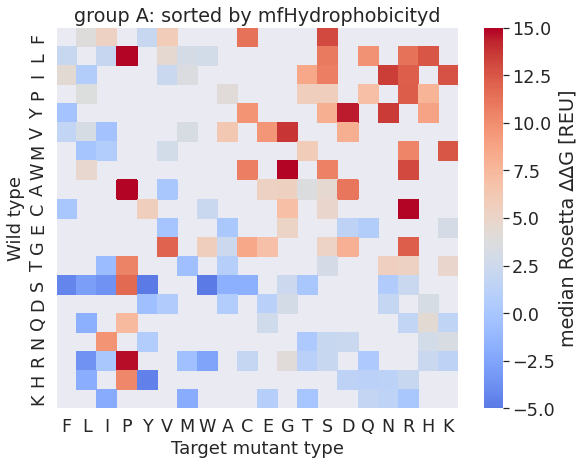

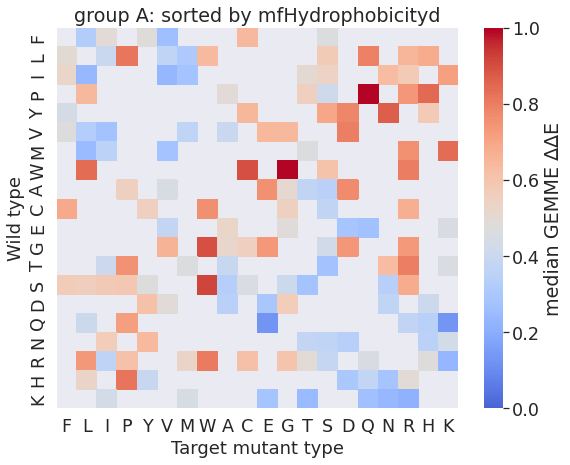

INFO:transmembrane tendency hydrophobicity scale
INFO:group A


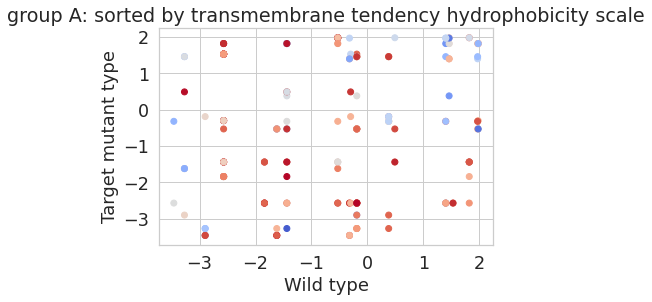

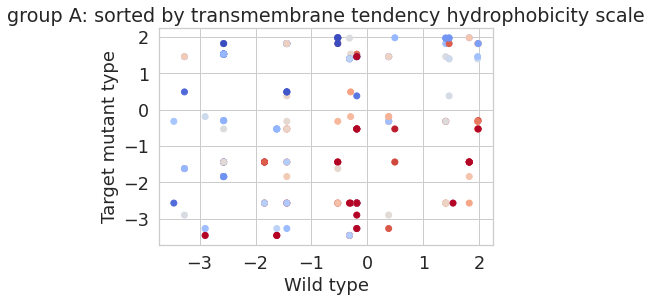

INFO:['K', 'D', 'E', 'R', 'Q', 'N', 'H', 'P', 'S', 'T', 'C', 'G', 'A', 'Y', 'M', 'V', 'W', 'L', 'I', 'F']


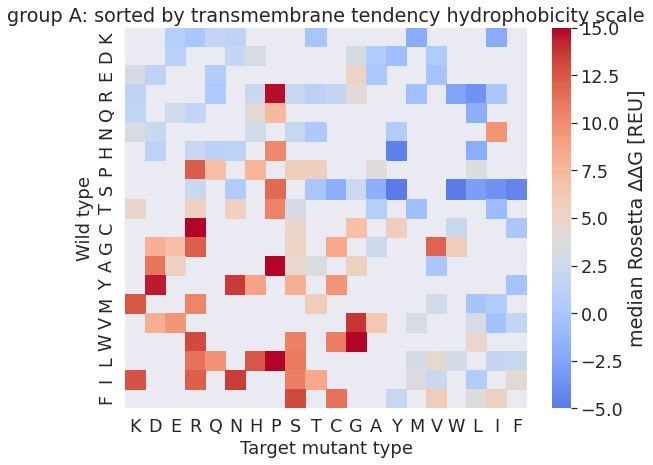

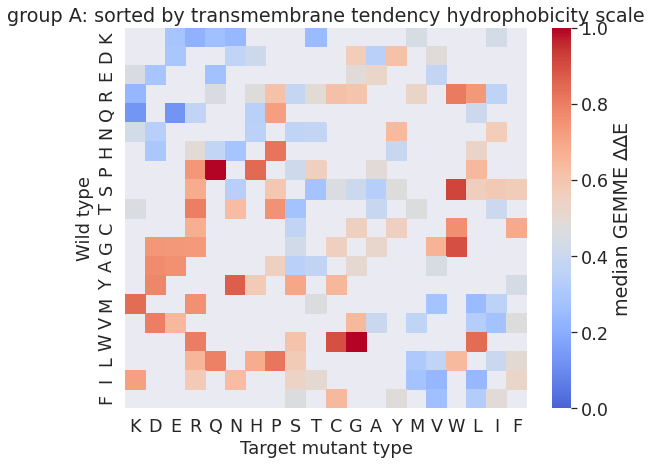

INFO:Residue Weight
INFO:group A


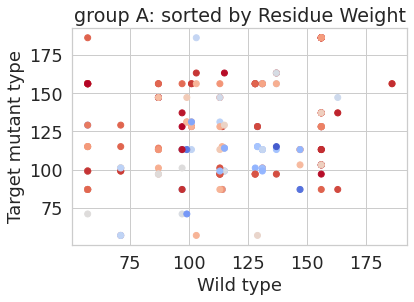

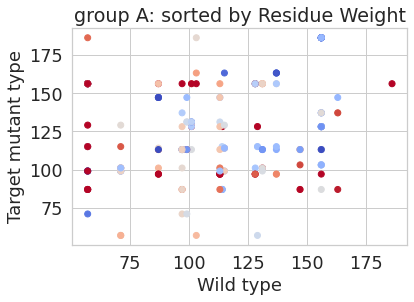

INFO:['G', 'A', 'S', 'P', 'V', 'T', 'C', 'I', 'L', 'N', 'D', 'Q', 'K', 'E', 'M', 'H', 'F', 'R', 'Y', 'W']


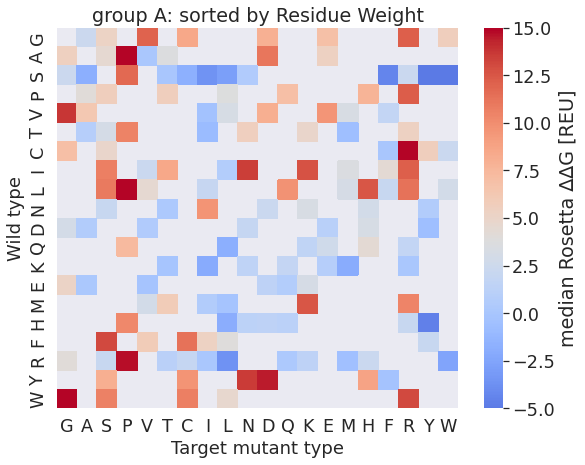

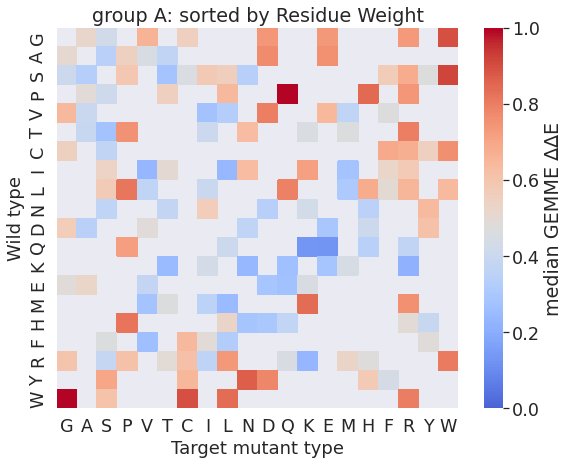

INFO:pKa1
INFO:group A


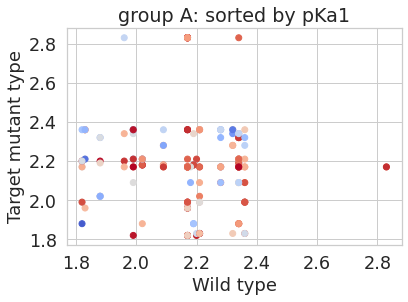

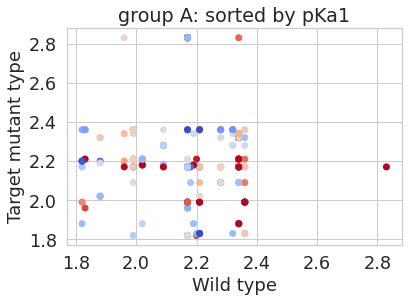

INFO:['H', 'F', 'D', 'C', 'P', 'N', 'T', 'R', 'Q', 'K', 'E', 'Y', 'S', 'M', 'V', 'G', 'A', 'L', 'I', 'W']


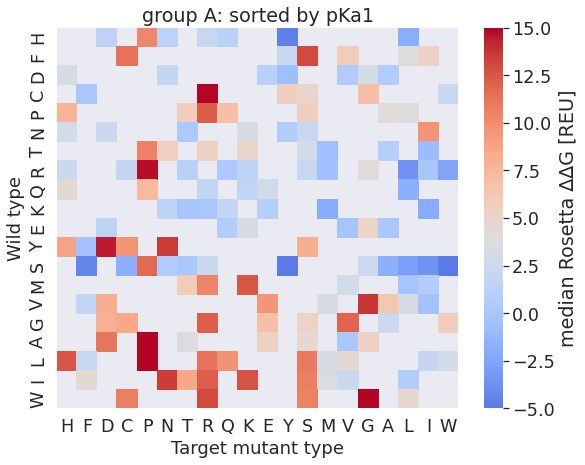

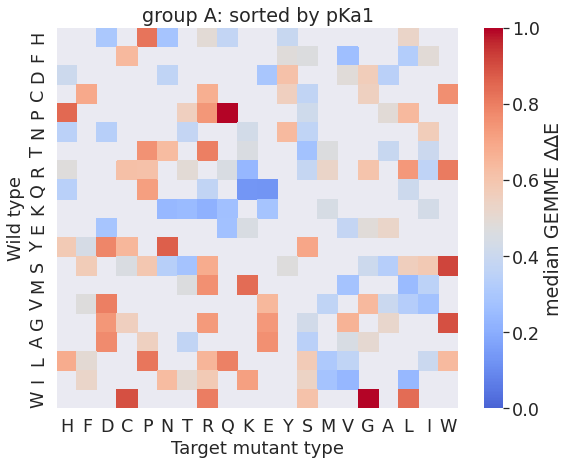

INFO:pKb2
INFO:group A


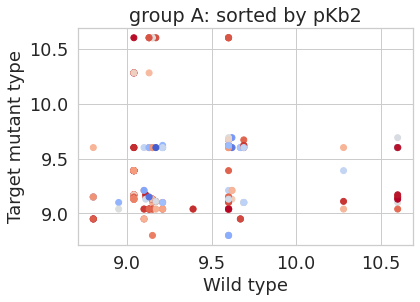

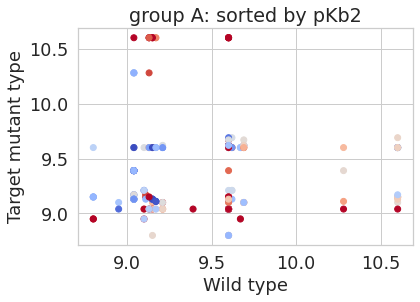

INFO:['N', 'K', 'R', 'T', 'Y', 'Q', 'F', 'S', 'H', 'M', 'W', 'L', 'D', 'G', 'I', 'V', 'E', 'A', 'C', 'P']


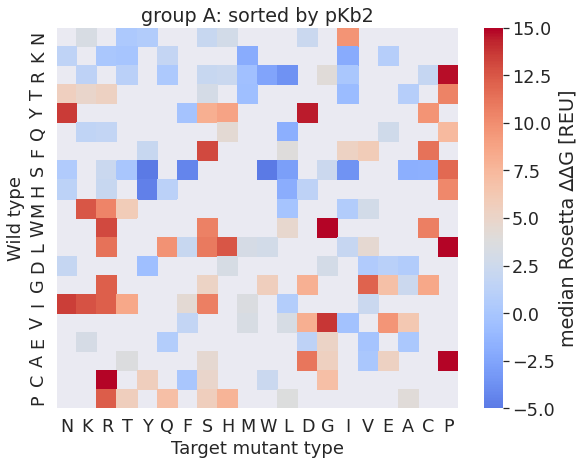

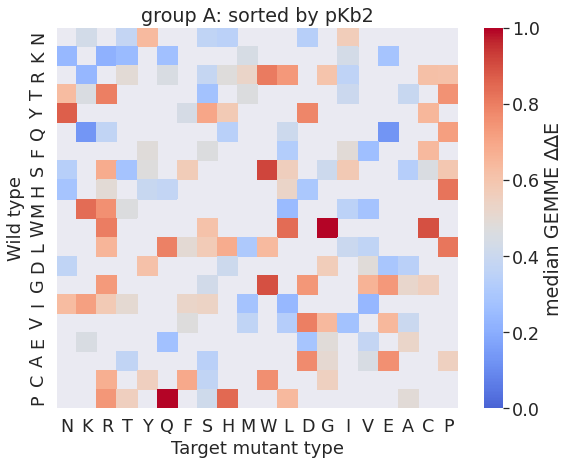

INFO:pKx3
INFO:group A


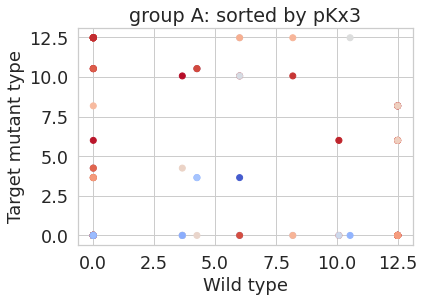

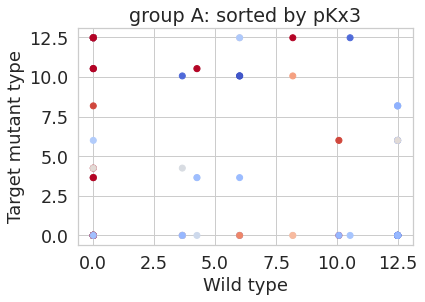

INFO:['I', 'N', 'Q', 'P', 'W', 'T', 'G', 'S', 'M', 'F', 'L', 'V', 'A', 'D', 'E', 'H', 'C', 'Y', 'K', 'R']


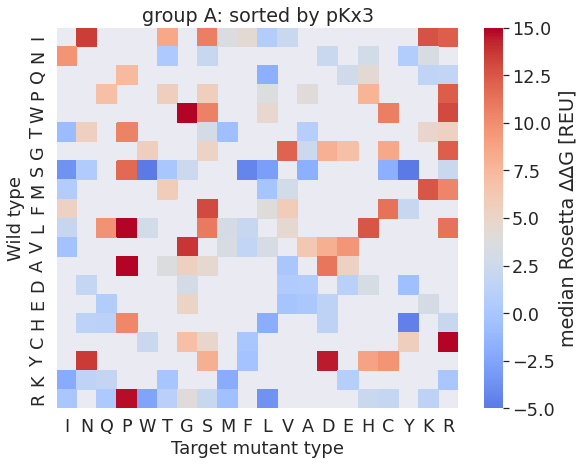

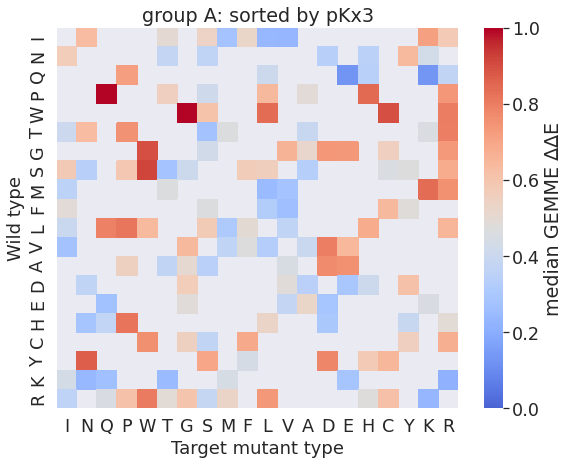

INFO:pl4
INFO:group A


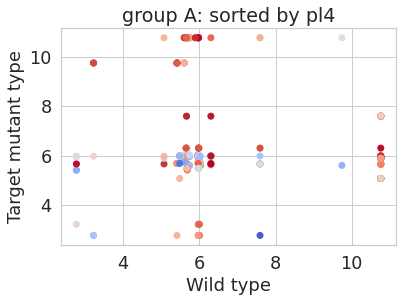

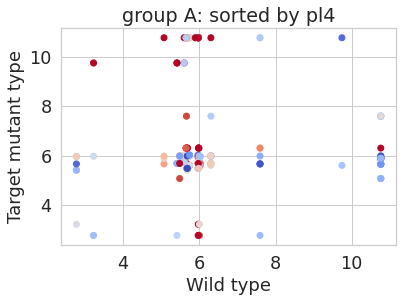

INFO:['D', 'E', 'C', 'N', 'F', 'T', 'Q', 'Y', 'S', 'M', 'W', 'V', 'G', 'L', 'A', 'I', 'P', 'H', 'K', 'R']


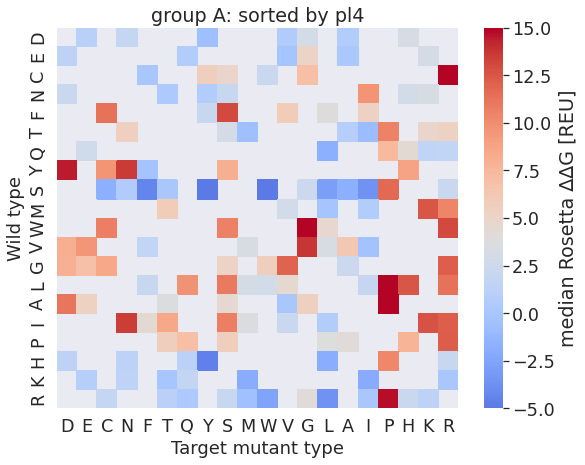

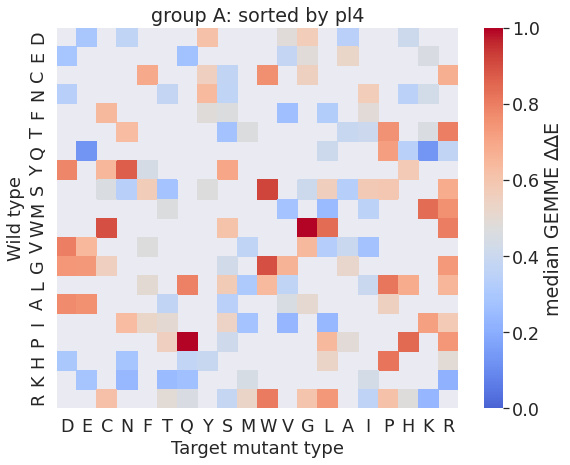

In [56]:
grouped_AA = {"R":1, "H":2, "K":3, "D":4, "E":5, "S":6, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}

hydrophobicity = {"R":-4.5, "H":2, "K":-3.9, "D":4, "E":5, "S":-0.8, "T":7, 
              "N":8, "Q":9, "C":10, "G":11, "P":12, "A":13, 
              "V":14, "I":15, "L":16, "M":17, "F":18, "Y":19, "W":20}
hydro_index = 0
hydrophobicity_scale = {'method': ['kdHydrophobicitya', 'wwHydrophobicityb', 'hhHydrophobicityc', 
                                   'mfHydrophobicityd', 'transmembrane tendency hydrophobicity scale', 'Residue Weight', 
                                   'pKa1', 'pKb2', 'pKx3', 'pl4'],
'I': [4.5, 0.31, -0.60, -1.56, 1.97, 113.16, 2.36, 9.60, 0, 6.02],
'V': [4.2, -0.07, -0.31, -0.78, 1.46, 99.13, 2.32, 9.62, 0, 5.96],
'L': [3.8, 0.56, -0.55, -1.81, 1.82, 113.16, 2.36, 9.60, 0, 5.98],
'F': [2.8, 1.13, -0.32, -2.20, 1.98, 147.18, 1.83, 9.13, 0, 5.48],
'C': [2.5, 0.24, -0.13, 0.49, -0.30, 103.15, 1.96, 10.28, 8.18, 5.07],
'M': [1.9, 0.23, -0.10, -0.76, 1.40, 131.20, 2.28, 9.21, 0, 5.74],
'A': [1.8, -0.17, 0.11, 0.0, 0.38, 71.08, 2.34, 9.69, 0, 6.00],
'G': [-0.4, -0.01, 0.74, 1.72, -0.19, 57.05, 2.34, 9.60, 0, 5.97],
'T': [-0.7, -0.14, 0.52, 1.78, -0.32, 101.11, 2.09, 9.10, 0, 5.60],
'S': [-0.8, -0.13, 0.84, 1.83, -0.53, 87.08, 2.21, 9.15, 0, 5.68],
'W': [-0.9, 1.85, 0.30, -0.38, 1.53, 186.22, 2.83, 9.39, 0, 5.89],
'Y': [-1.3, 0.94, 0.68, -1.09, 0.49, 163.18, 2.20, 9.11, 10.07, 5.66],
'P': [-1.6, -0.45, 2.23, -1.52, -1.44, 97.12, 1.99, 10.60, 0, 6.30],
'H': [-3.2, -0.96, 2.06, 4.76, -1.44, 137.14, 1.82, 9.17, 6.00, 7.59],
'E': [-3.5, -2.02, 2.68, 1.64, -2.90, 129.12, 2.19, 9.67, 4.25, 3.22],
'Q': [-3.5, -0.58, 2.36, 3.01, -1.84, 128.13, 2.17, 9.13, 0, 5.65],
'D': [-3.5, -1.23, 3.49, 2.95, -3.27, 115.09, 1.88, 9.60, 3.65, 2.77],
'N': [-3.5, -0.42, 2.05, 3.47, -1.62, 114.11, 2.02, 8.80, 0, 5.41],
'K': [-3.9, -0.99, 2.71, 5.39, -3.46, 128.18, 2.18, 8.95, 10.53, 9.74],
'R': [-4.5, -0.81, 2.58, 3.71, -2.57, 156.19, 2.17, 9.04, 12.48, 10.76],}
#https://www.cgl.ucsf.edu/chimera/docs/UsersGuide/midas/hydrophob.html
#https://www.sigmaaldrich.com/DK/en/technical-documents/technical-article/protein-biology/protein-structural-analysis/amino-acid-reference-chart
for hydro_index, hydr in enumerate(hydrophobicity_scale['method']):
    logger.info(hydrophobicity_scale['method'][hydro_index])

    all_tmp = []
    target_dic_here = subfiltered_df_dicts
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        tmp_energy['wild type'] = tmp_energy['variant'].apply(lambda x: x[0])
        tmp_energy['mutant'] = tmp_energy['variant'].apply(lambda x: x[-1])

        tmp_energy['wild type hydrophobicity'] = tmp_energy['variant'].apply(lambda x: hydrophobicity_scale[x[0]][hydro_index])
        tmp_energy['mutant hydrophobicity'] = tmp_energy['variant'].apply(lambda x: hydrophobicity_scale[x[-1]][hydro_index])

        tmp_energy.loc[tmp_energy['rosetta;ddG']>15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']<-5, 'rosetta;ddG'] = -5
        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
        all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp).reset_index(drop=True)
    for group in ['group A']:#'all', 'group A', 'group B']:
        logger.info(group)
        for aggfunc in ['median', ]: #'mean']: 
            all_tmp_tmp = all_tmp.copy()

            title = f"sorted by {hydr}"
            if group != 'all':
                title = f"{group}: {title}"
                all_tmp_tmp = all_tmp_tmp.loc[all_tmp_tmp['label']==group].reset_index(drop=True)

            all_tmp_tmp['var'] = all_tmp_tmp['wild type']
            all_tmp_tmp['mut'] = all_tmp_tmp['mutant']
            min_val = all_tmp_tmp['rosetta;ddG'].min()
            max_val = all_tmp_tmp['rosetta;ddG'].max()

            with sns.axes_style("whitegrid"):
                fig, ax1 = plt.subplots()
                ax1.scatter(all_tmp_tmp['wild type hydrophobicity'], all_tmp_tmp['mutant hydrophobicity'], c=all_tmp_tmp['gemme;score'], vmax=1, vmin=0, cmap='coolwarm')#
                
                plt.xlabel('Wild type', fontsize=18)
                plt.ylabel('Target mutant type', fontsize=18)
                plt.title(title)
                plt.show()

            with sns.axes_style("whitegrid"):
                fig, ax1 = plt.subplots()
                ax1.scatter(all_tmp_tmp['wild type hydrophobicity'], all_tmp_tmp['mutant hydrophobicity'], vmax=max_val, vmin=min_val, c=all_tmp_tmp['rosetta;ddG'], cmap='coolwarm')#
                
                plt.xlabel('Wild type', fontsize=18)
                plt.ylabel('Target mutant type', fontsize=18)
                plt.title(title)
                plt.show()
                
            heatmap_df = all_tmp.copy()
            heatmap_df['var'] = heatmap_df['wild type']
            heatmap_df['mut'] = heatmap_df['mutant']
            all_resis = heatmap_df['mut'].unique()
            all_length = len(heatmap_df['mut'].unique())
            heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
            heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="rosetta;ddG", aggfunc=aggfunc)

            
            #define AA order according to scale
            method = pd.DataFrame.from_dict(hydrophobicity_scale, orient='index', dtype=None, columns=hydrophobicity_scale['method'])
            method = method.iloc[1: , :].reset_index(drop=False)
            aa_order = method.sort_values(by=hydr)['index'].tolist()
            logger.info(aa_order)
            new_grouped_AA = {}
            for index, elem in enumerate(aa_order):
                if not elem in heatmap_pvt.columns:
                    heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
                if not elem in heatmap_pvt.index:
                    heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
                new_grouped_AA[elem] = index
            heatmap_pvt = heatmap_pvt[aa_order]
            heatmap_pvt['sorter'] = [new_grouped_AA[x] for x in heatmap_pvt.index]
            heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
            heatmap_pvt = heatmap_pvt.drop(columns='sorter')
            with sns.axes_style("darkgrid"):
                fig = plt.figure(figsize=(9,7))
                sns.set(font_scale=1.6)
                ax = sns.heatmap(heatmap_pvt, vmax=max_val, vmin=min_val, cmap='coolwarm',center=all_execpt_vals_cat['all'][8], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                                 cbar_kws={'label': f'{aggfunc} Rosetta ∆∆G [REU]', })

                plt.ylabel('Wild type', fontsize=18)
                plt.xlabel('Target mutant type', fontsize=18)
                plt.title(title)
                filename = os.path.join(plots_dir, f'FigS7-rosetta_{title}.svg')
                plt.savefig(filename, )
                plt.show()
            heatmap_pvt = heatmap_df.copy().reset_index(drop=True)
            heatmap_pvt = heatmap_pvt.pivot_table(index="wild type", columns="mutant", values="gemme;score", aggfunc=aggfunc)

            for elem in aa_order:
                if not elem in heatmap_pvt.columns:
                    heatmap_pvt[elem] = [np.nan]*len(heatmap_pvt[heatmap_pvt.columns[0]])
                if not elem in heatmap_pvt.index:
                    heatmap_pvt.loc[elem] = [np.nan]*len(heatmap_pvt.columns)
            heatmap_pvt = heatmap_pvt[aa_order]
            heatmap_pvt['sorter'] = [new_grouped_AA[x] for x in heatmap_pvt.index]
            heatmap_pvt = heatmap_pvt.sort_values(by = ['sorter'])
            heatmap_pvt = heatmap_pvt.drop(columns='sorter')
            with sns.axes_style("darkgrid"):
                fig = plt.figure(figsize=(9,7))
                sns.set(font_scale=1.6)
                ax = sns.heatmap(heatmap_pvt, vmax=1, vmin=0, cmap='coolwarm',center=all_execpt_vals_cat['all'][9], #annot=True, fmt='.1f', annot_kws={"size": 14}, 
                                 cbar_kws={'label': f'{aggfunc} GEMME ∆∆E', })#

                plt.ylabel('Wild type', fontsize=18)
                plt.xlabel('Target mutant type', fontsize=18)
                plt.title(title)
                filename = os.path.join(plots_dir, f'FigS7-gemme_{title}.svg')
                plt.savefig(filename, )
                plt.show()
            

### SASA count for quadrant and groups A & B

In [116]:
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
                   
    tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
    tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

    tmp_energy['property_wt'] = tmp_energy['wt'].apply(lambda x: make_property(x))
    tmp_energy['property_var'] = tmp_energy['var'].apply(lambda x: make_property(x))
    def remove_dup(x):
        if type(x)==str:
            x = x.split('|')
            x= list(set(x))
            for elem in x:
                if elem!='':
                    return elem
        else:
            return None
    tmp_energy['SAR'] = ''
    for pdbASA in [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')]:
        tmp_energy['SAR_tmp'] = tmp_energy[pdbASA].apply(lambda x: sasa(x))
        tmp_energy['SAR_tmp'] = tmp_energy['SAR_tmp'].fillna('')
        tmp_energy['SAR'] = tmp_energy['SAR'] +'|'+ tmp_energy['SAR_tmp']
    tmp_energy['SAR'] = tmp_energy['SAR'].apply(lambda x: remove_dup(x) )

    tmp_energy['TMspan'] = ''
    for tmspan_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')]:
        tmp_energy['TMspan_tmp'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        tmp_energy['TMspan'] = tmp_energy['TMspan'] +'|'+ tmp_energy['TMspan_tmp']
    tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: remove_dup(x) )
    tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: 'TM-region' if x else '')
    tmp_energy['LAR'] = ''
    for lar_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')]:
        tmp_energy['LAR_tmp'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'] = tmp_energy['LAR'] +'|'+ tmp_energy['LAR_tmp']
    tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: remove_dup(x) )
    tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: 'lipid-facing' if x else '')
    tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

    def tmpiii_ds(x):
        if type(x)!=float:
            return '|'.join(list(filter(None, x.split('|')))) 
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

    tmp_energy['position_backup'] = tmp_energy['position']
    
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: x if x in 
                                                          ['buried', 'solvent-accessible',  'TM-region|buried', 
                                                           'TM-region|lipid-facing|solvent-accessible', 
                                                           'TM-region|lipid-facing|buried'] else 'others')
    all_tmp.append(tmp_energy)
all_tmp = pd.concat(all_tmp)
logger.info(all_tmp['position_backup'].unique())
logger.info(all_tmp['position'].unique())


INFO:['buried' 'solvent-accessible' 'TM-region|lipid-facing|solvent-accessible'
 'TM-region|lipid-facing|buried' 'lipid-facing|solvent-accessible'
 'lipid-facing|buried' 'TM-region|solvent-accessible' 'TM-region|buried'
 None]
INFO:['buried' 'solvent-accessible' 'TM-region|lipid-facing|solvent-accessible'
 'TM-region|lipid-facing|buried' 'others' 'TM-region|buried']


INFO:all
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)
INFO:MultiIndex([('Q1', 'group A'),
            ('Q1', 'group B'),
            ('Q2', 'group A'),
            ('Q2', 'group B'),
            ('Q3', 'group A'),
            ('Q3', 'group B'),
            ('Q4', 'group A'),
            ('Q4', 'group B')],
           names=['quadrant', 'label'])


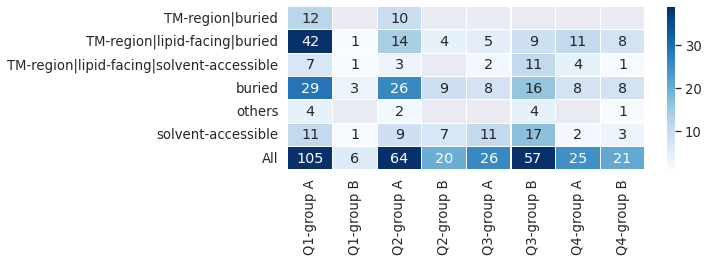

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


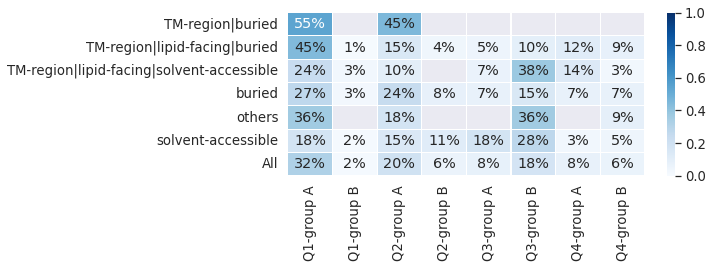

INFO:['other' 'group B' 'group A']
INFO:0      0.000007
1      0.000025
2      0.000010
3      0.000004
4      0.000015
         ...   
149    0.000018
150    0.000004
151    0.000016
152    0.000004
153         NaN
Name: gnomad;AF_tot_first, Length: 3471, dtype: float64


<Figure size 576x576 with 0 Axes>

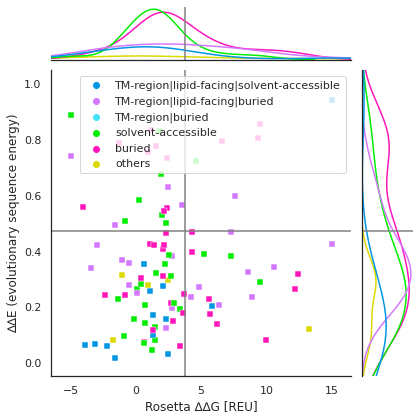

In [117]:
x_range = 1
y_range = 0.1

for region in ['all']:
    logger.info(region)
    tmp_energy = all_tmp.copy()
    if region != 'all':
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    
    tmpi['c'] = 1
    df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
    df2.drop(columns=['All'], inplace=True)

    logger.info(df2.columns)
    hue_order=['TM-region|lipid-facing|solvent-accessible', 'TM-region|lipid-facing|buried', 
               'TM-region|buried', 'solvent-accessible', 'buried', 'others']

    
    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,3))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, fmt=".0f", vmin=1, vmax=39,
                   )
        plt.xlabel('')
        plt.ylabel("", size=15)
        plt.show()

    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

    tmpi2 = tmpi.copy()
    tmpi2['c'] = 1
    df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
    df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
    df2.drop(columns=['All'], inplace=True)
    
    with sns.axes_style("darkgrid"):
        f = plt.figure(figsize=(8,3))
        sns.set(font_scale = 1.2)
        sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, annot=True, fmt=".0%", )
        plt.xlabel('')
        plt.ylabel("", size=15)
        plt.show()

    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
    
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    logger.info(tmp_energy['gnomad;AF_tot_first'])
    
    with sns.axes_style("whitegrid"):
        sns.set(font_scale = 1.0)
        sns.set(style = 'white')
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        
        tmpi = tmpi.loc[(tmpi['label']=='group B')].reset_index(drop=True)
        tmpi['position2'] = tmpi['position'] + tmpi['label']

        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='position', marginal_kws=dict(fill=False), 
                          hue_order = hue_order, marker='s',
                          palette = ['#0096e3', '#d477ff', '#44e2f7', '#00ed00', '#ff15bb', '#dada00',]
                         )
        key = 'all'#target_uniprot

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_joint.set_ylim(-0.05,1.05)
        g.ax_joint.set_xlim(-6.5,16.5)
        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        filename = os.path.join(plots_dir, f'FigS8-groupB.svg')
        plt.savefig(filename, )
        plt.show()


In [118]:
tmpi = tmp_energy.copy()
tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
logger.info(tmpi['position_backup'].unique())
tmpi['c'] = 1
df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
df2 = df2.fillna(0)
df2.columns
df2['All']
tmpi[['variant', 'label', 'position']]
logger.info(tmpi['position'].unique())
tmpi.loc[~tmpi['position'].isin(['solvent-accessible', 'buried', 'others', 'TM-region|lipid-facing|buried',
 'TM-region|buried'])][['variant', 'label', 'position', 'quadrant']]#['variant'].tolist()
for elem in ['solvent-accessible', 
                    'buried', 
                    'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|lipid-facing|solvent-accessible', 
                    'lipid-facing|buried', 
            ]:
    print(elem)
    print(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())


INFO:['TM-region|lipid-facing|solvent-accessible' 'buried' 'solvent-accessible'
 'TM-region|lipid-facing|buried' 'TM-region|solvent-accessible'
 'lipid-facing|solvent-accessible' 'TM-region|buried'
 'lipid-facing|buried' None]
INFO:['TM-region|lipid-facing|solvent-accessible' 'buried' 'solvent-accessible'
 'TM-region|lipid-facing|buried' 'others' 'TM-region|buried']


solvent-accessible
['A521S', 'N589S', 'G640R', 'I858V', 'S870T', 'D874V', 'G910S', 'A926T', 'A926V', 'A927V', 'D944N', 'D948N', 'G992R', 'I1061T', 'G1073S', 'F1087L', 'R1183H', 'E1189G', 'F1224C', 'T17K', 'T17M', 'R147C', 'E150K', 'Q46H', 'R223W', 'D236V', 'K255T', 'R269C', 'E299K', 'E121D', 'G156V', 'E34G', 'H71Q', 'K15T', 'Y68C', 'M93I', 'H100L', 'H100Y', 'G160S', 'R165W', 'R165Q', 'N240S', 'I269N', 'R305W', 'I316S', 'G64R', 'R99H', 'R333C', 'T337M', 'M1I', 'M1V', 'R168H', 'E224D', 'S241F', 'T400K', 'R247W', 'F332V', 'H346D', 'H375Y', 'N461S', 'K506R']
buried
['R389C', 'R404Q', 'R404W', 'T511M', 'R518Q', 'R518W', 'P543L', 'L684F', 'R711G', 'R714H', 'R789H', 'P887L', 'G911S', 'R934Q', 'R978C', 'G1034R', 'A1035V', 'D1097N', 'A1151T', 'R1186H', 'A1187G', 'P23S', 'T70M', 'N73S', 'G106R', 'G106V', 'G106W', 'G109R', 'R135L', 'R135W', 'P180A', 'P180L', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'G188E', 'D190N', 'T320N', 'N34D', 'N34K', 'N34S', 'P36L', 'R92W', 'R93W', 'R153L', 'R153P', 'P

[111.0, 84.0, 83.0, 46.0]


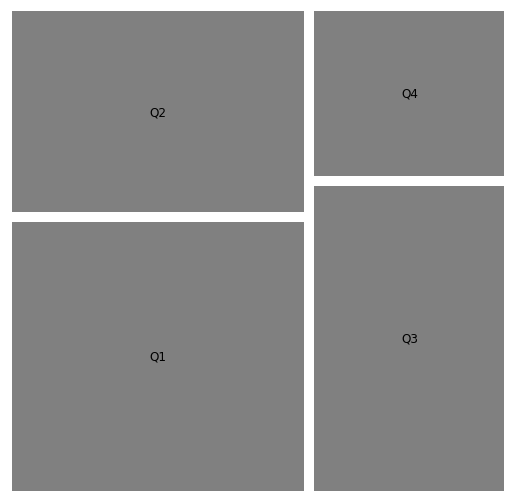

([111.0, 84.0, 83.0, 46.0], ['Q1', 'Q2', 'Q3', 'Q4'])

In [119]:
quadrant = 'Q4'
label = ['Q1', 'Q2', 'Q3', 'Q4']
labels = []
sizes = []
for lab in label:
    if df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'] > 0:
        sizes.append(df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS8-base_all.svg')
plt.savefig(filename, )
plt.show()

sizes,labels

[12.0, 32.0, 8.0, 43.0, 12.0, 4.0]


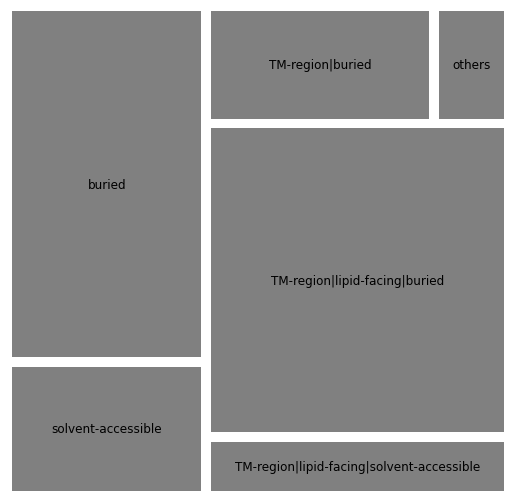

([12.0, 32.0, 8.0, 43.0, 12.0, 4.0],
 ['solvent-accessible',
  'buried',
  'TM-region|lipid-facing|solvent-accessible',
  'TM-region|lipid-facing|buried',
  'TM-region|buried',
  'others'])

In [123]:
quadrant = 'Q1'
#['#D55C00', '#56B4E9', ]

label = ['solvent-accessible', 'buried', 'TM-region|lipid-facing|solvent-accessible',
 'TM-region|lipid-facing|buried', 'TM-region|buried', 'others']
labels = []
sizes = []
for lab in label:
    if df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab] > 0:
        sizes.append(df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS8-base_{quadrant}.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

INFO:all
INFO:['gnomad|pathogenic' 'pathogenic' 'gnomad|benign' 'gnomad|conflict'
 'gnomad|VUS' 'gnomad' 'benign']
INFO:groupA: 193
groupB: 92
INFO:[1. 0.]
INFO:['groupA' 'groupB']
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


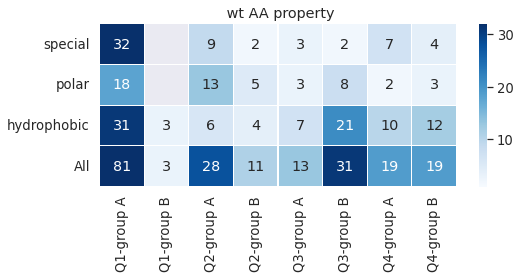

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


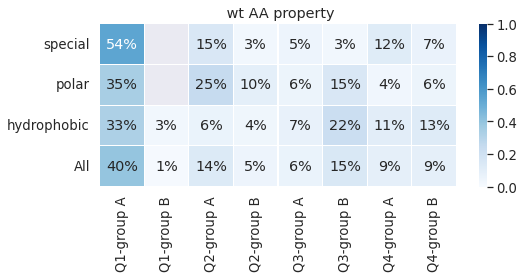

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


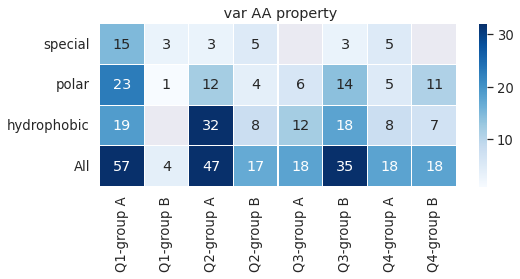

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


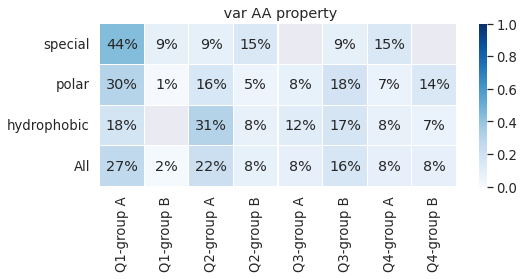

INFO:TRANSMEM
INFO:['pathogenic' 'gnomad|pathogenic' 'gnomad|conflict' 'gnomad|benign'
 'gnomad' 'gnomad|VUS' 'benign']
INFO:groupA: 96
groupB: 33
INFO:[1. 0.]
INFO:['groupA' 'groupB']
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


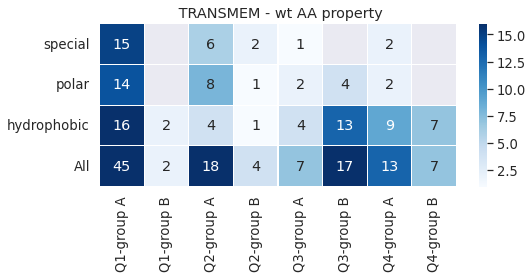

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


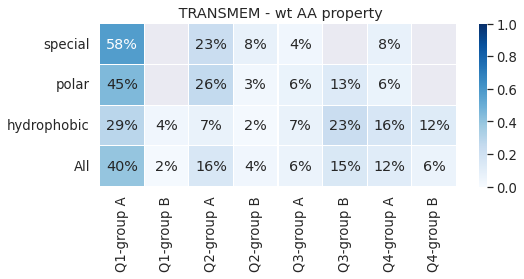

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


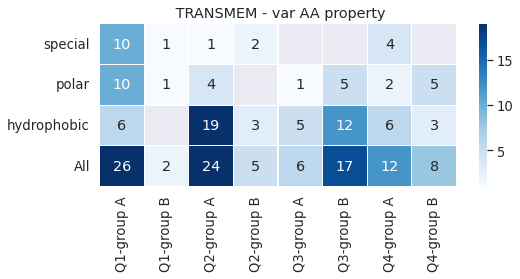

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


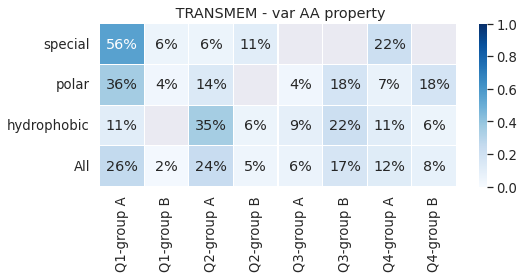

In [112]:
target_dic_here = subfiltered_df_dicts
all_tmp = []
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)

    pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
    tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
    tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
    tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
    lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
    tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
    tmp_energy['LAR'].unique()
    tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

    def tmpiii_ds(x):
        if type(x)!=float:
            return '|'.join(list(filter(None, x.split('|')))) 
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

    tmp_energy['position_backup'] = tmp_energy['position']
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)

    tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

    tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
    tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp)
title_raw = ''
for region in ['all', 'TRANSMEM']:
    logger.info(region)
    tmp_energy = all_tmp.copy()

    if region != 'all':
        title_raw = title_raw + f' {region} -'
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    y_value = "rosetta;ddG"
    ylabel = 'Rosetta ∆∆G [REU]'
    typee = 'ddG'
    min_y = 50
    max_y =  tmp_energy[y_value].min()
    logger.info(tmp_energy['label'].unique())
    y_value = "gemme;score"
    ylabel = 'GEMME ∆∆E'
    typee = 'ddE'
    min_y = tmp_energy[y_value].min()
    max_y =  tmp_energy[y_value].max()
    r_max = tmp_energy["rosetta;ddG"].max()
    r_min =  tmp_energy["rosetta;ddG"].min()
    g_max = 0
    g_min = tmp_energy["gemme;score"].min()

    groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
    groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

    def label_gorup_class(x):
        if x==1:
            return 'groupA' 
        else:
            return 'groupB'
    logger.info(tmp_energy['score'].unique())
    tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))

    tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

    tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property2(x))
    tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property2(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    x_range = 1
    y_range = 0.1
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    for hue in ['wt AA property', 'var AA property']:
        title = f'{title_raw} {hue}'
        tmpi = tmp_energy.copy()
        sorter = ['CHARGED', 'special', 'polar', 'hydrophobic']
        tmpi[hue] = tmpi[hue].astype("category")
        tmpi[hue].cat.set_categories(sorter, inplace=True)
        tmpi.sort_values([hue])
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        tmpi[hue] = tmpi[hue].astype("category")
        tmpi[hue].cat.set_categories(sorter, inplace=True)
        tmpi.sort_values([hue])
        
        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                        annot=True, fmt=".0%", )
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()


INFO:all
INFO:['gnomad' 'gnomad|VUS' 'gnomad|conflict' 'unknown' 'gnomad|benign' 'VUS'
 'gnomad|pathogenic' 'pathogenic' 'conflict' 'benign']
INFO:groupA: 220
groupB: 104
INFO:[nan  0.  1.]
INFO:['groupB' 'groupA']
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


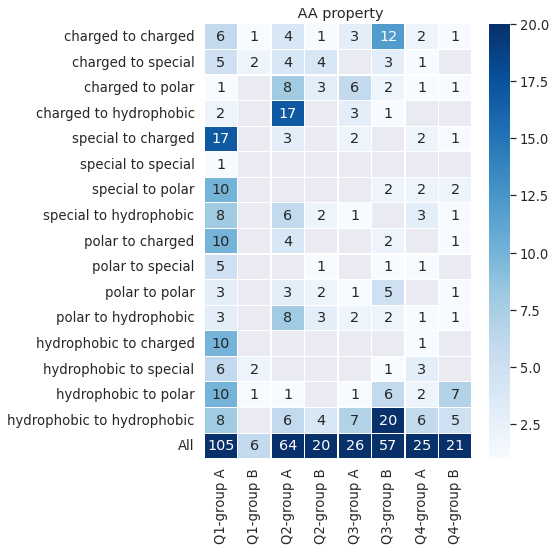

INFO:TRANSMEM
INFO:['gnomad|conflict' 'unknown' 'gnomad' 'gnomad|VUS' 'gnomad|benign'
 'pathogenic' 'VUS' 'gnomad|pathogenic' 'conflict' 'benign']
INFO:groupA: 109
groupB: 35
INFO:[nan  0.  1.]
INFO:['groupB' 'groupA']
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


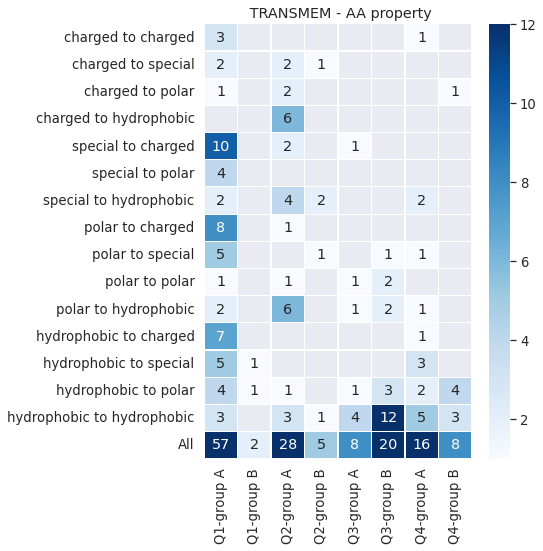

In [124]:
target_dic_here = subfiltered_df_dicts
all_tmp = []
for target_uniprot in sorted(target_dic_here):
    tmp_energy = target_dic_here[target_uniprot].copy()
    tmp_energy['accession'] = target_uniprot
    if gemme_name == 'gemme;score;ori':
        tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    all_tmp.append(tmp_energy)

all_tmp = pd.concat(all_tmp)
title_raw = ''
for region in ['all', 'TRANSMEM', ]:
    logger.info(region)
    tmp_energy = all_tmp.copy()

    if region != 'all':
        title_raw = title_raw + f' {region} -'
        tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

    y_value = "rosetta;ddG"
    ylabel = 'Rosetta ∆∆G [REU]'
    typee = 'ddG'
    min_y = 50
    max_y =  tmp_energy[y_value].min()
    logger.info(tmp_energy['label'].unique())
    y_value = "gemme;score"
    ylabel = 'GEMME ∆∆E'
    typee = 'ddE'
    min_y = tmp_energy[y_value].min()
    max_y =  tmp_energy[y_value].max()
    r_max = tmp_energy["rosetta;ddG"].max()
    r_min =  tmp_energy["rosetta;ddG"].min()
    g_max = 0
    g_min = tmp_energy["gemme;score"].min()

    groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
    groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

    def label_gorup_class(x):
        if x==1:
            return 'groupA' 
        else:
            return 'groupB'
    logger.info(tmp_energy['score'].unique())
    tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))

    tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
    tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

    tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property2(x))
    tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property2(x))
    tmp_energy['AA property'] = tmp_energy['wt AA property']+ ' to ' + tmp_energy['var AA property']


    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    x_range = 1
    y_range = 0.1
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

    def make_groups(x):
        if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
            return 'Q1'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
            return 'Q2'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
            return 'Q3'
        elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
            return 'Q4'
    tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    for hue in ['AA property', ]:#'wt AA property', 'var AA property']:
        title = f'{title_raw} {hue}'
        tmpi = tmp_energy.copy()
        if hue == 'AA property':
            figsize = (6,8)
            sorter_base = ['charged', 'special', 'polar', 'hydrophobic']
            sorter = []
            for base in sorter_base:
                for base2 in sorter_base:
                    sorter.append(f"{base} to {base2}")
        else:
            figsize = (8,3)
            sorter = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
        tmpi[hue] = tmpi[hue].astype("category")
        tmpi[hue].cat.set_categories(sorter, inplace=True)
        tmpi.sort_values([hue])
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=figsize)
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            filename = os.path.join(plots_dir, f'FigS7b-base_{region}.svg')
            plt.savefig(filename, )
            plt.show()


## investigate protein categories

In [28]:
categories = list(set([target[2][0] for target in target_list]))
logger.info(categories)
key = 'all' # for cutoff choice in ddG-ddE plots
protein_categories = {'Transporter':[], 'Cell Junction':[], 'Ion channel':[], 'Enzyme':[], 'GPCR':[]}
for target in target_list:
    protein_categories[target[2][0]].append(target[0])
logger.info(protein_categories)
#protein_categories = {'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}
protein_categories

INFO:['Enzyme', 'Ion channel', 'GPCR', 'Cell Junction', 'Transporter']
INFO:{'Transporter': ['O15118', 'P11166', 'P16615', 'Q8N5M9', 'Q9H221', 'Q9H222'], 'Cell Junction': ['P29033'], 'Ion channel': ['P17787', 'P41181', 'P43681'], 'Enzyme': ['P31213', 'Q9H3H5'], 'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}


{'Transporter': ['O15118', 'P11166', 'P16615', 'Q8N5M9', 'Q9H221', 'Q9H222'],
 'Cell Junction': ['P29033'],
 'Ion channel': ['P17787', 'P41181', 'P43681'],
 'Enzyme': ['P31213', 'Q9H3H5'],
 'GPCR': ['P08100', 'P32245', 'Q99835', 'Q9ULV1']}

### ROC curves

INFO:Cell Junction
INFO:all
INFO:9.931568854324432e-05
INFO:5
INFO:groupA: 33
groupB: 16


9.931568854324432e-05
Ensemble test roc-auc:0.4185606060606061
Ensemble test roc-auc:0.8371212121212122


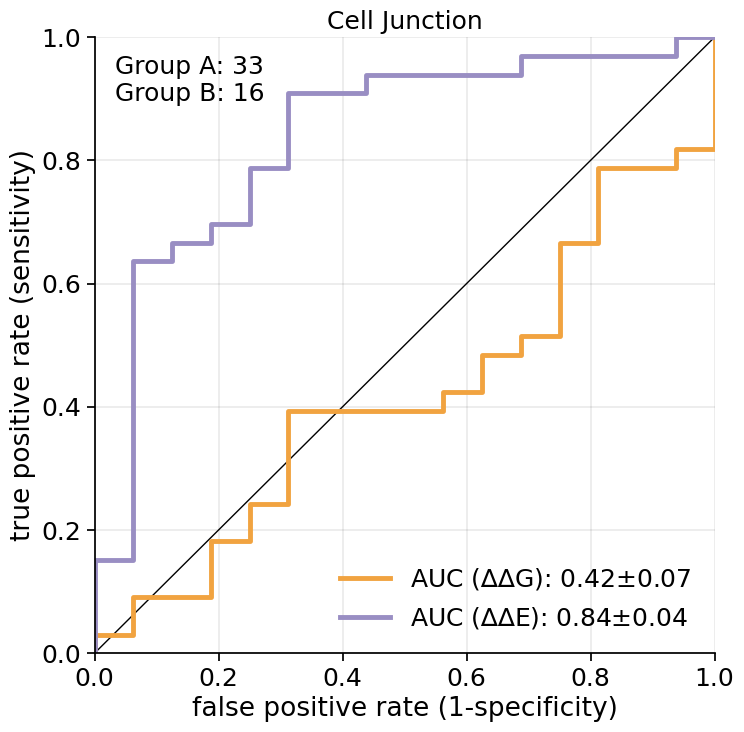

INFO:TRANSMEM
INFO:9.931568854324432e-05
INFO:4
INFO:groupA: 24
groupB: 8


9.931568854324432e-05
Ensemble test roc-auc:0.46875
Ensemble test roc-auc:0.78125


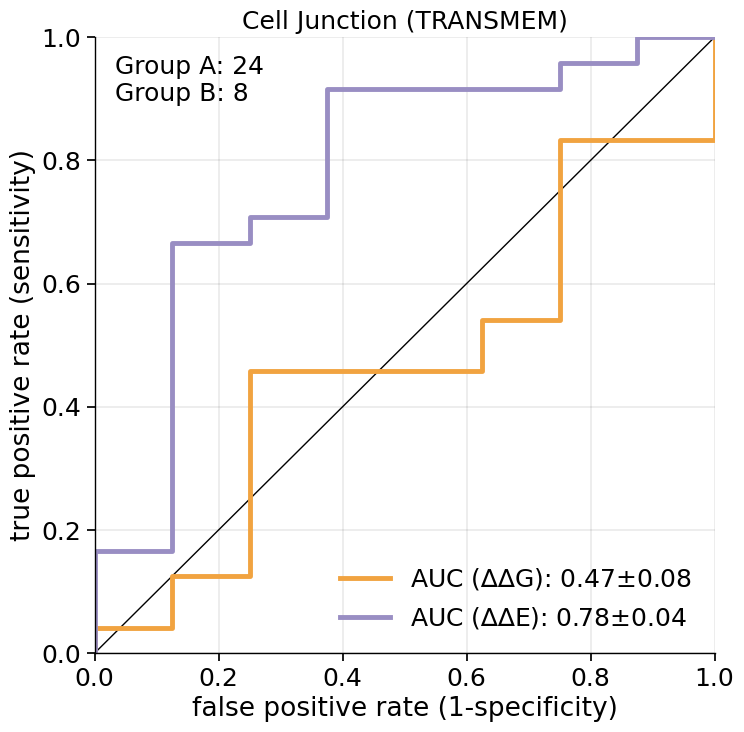

INFO:Enzyme
INFO:all
INFO:9.931568854324432e-05
INFO:6
INFO:groupA: 24
groupB: 10


9.931568854324432e-05
Ensemble test roc-auc:0.625
Ensemble test roc-auc:0.8333333333333334


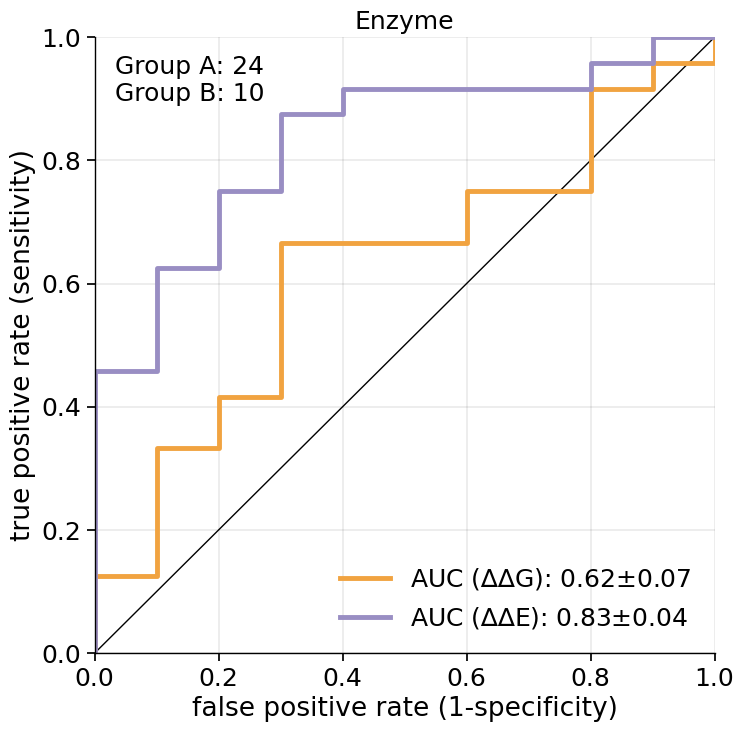

INFO:TRANSMEM
INFO:9.931568854324432e-05
INFO:2
INFO:groupA: 6
groupB: 3


9.931568854324432e-05
Ensemble test roc-auc:1.0
Ensemble test roc-auc:0.8333333333333334


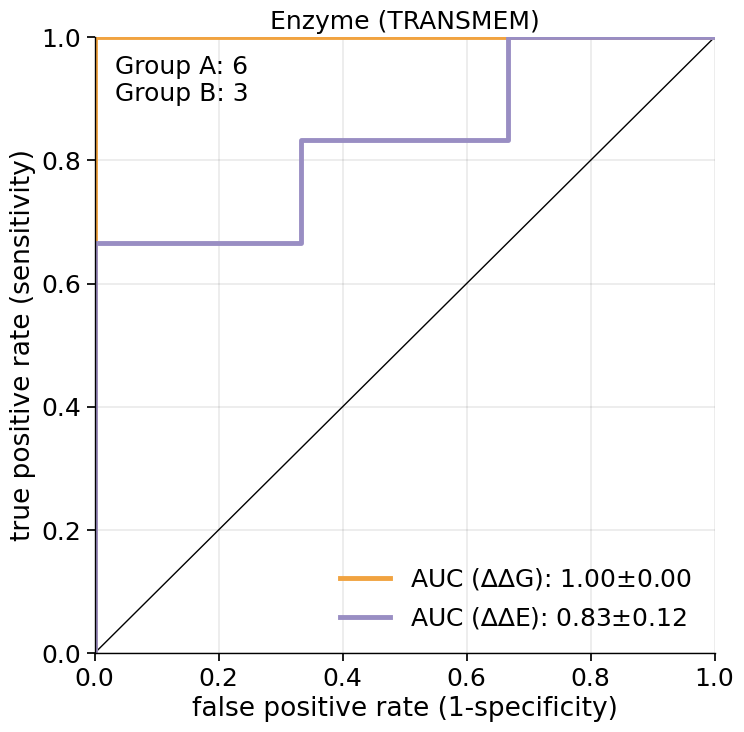

INFO:GPCR
INFO:all
INFO:9.931568854324432e-05
INFO:6
INFO:groupA: 54
groupB: 24


9.931568854324432e-05
Ensemble test roc-auc:0.790895061728395
Ensemble test roc-auc:0.8333333333333334


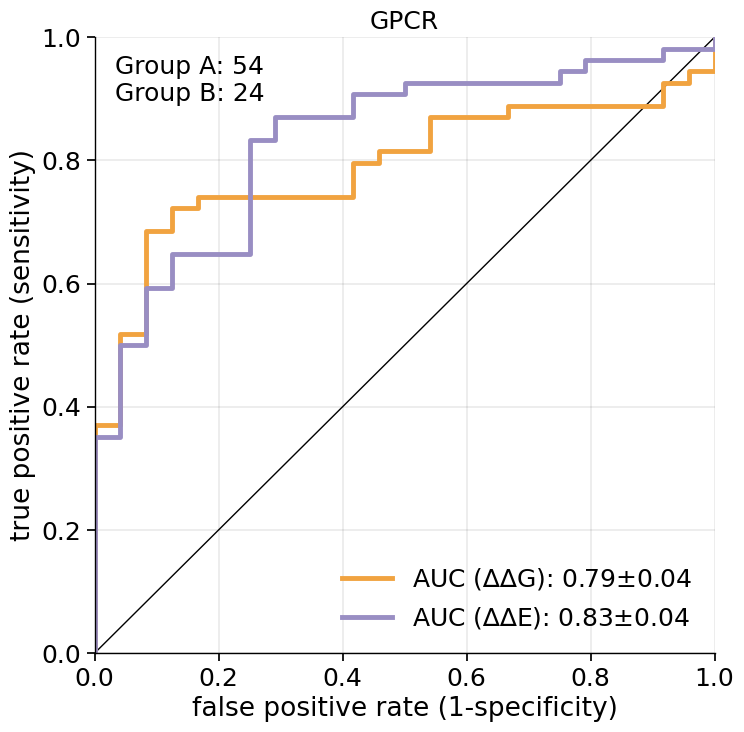

INFO:TRANSMEM
INFO:9.931568854324432e-05
INFO:2
INFO:groupA: 31
groupB: 11


9.931568854324432e-05
Ensemble test roc-auc:0.812316715542522
Ensemble test roc-auc:0.8651026392961877


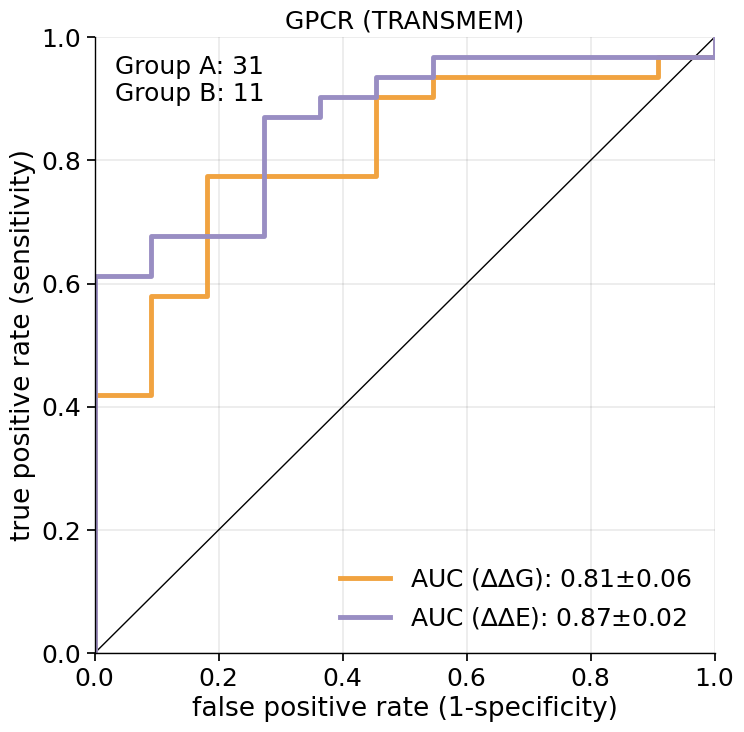

INFO:Ion channel
INFO:all
INFO:9.931568854324432e-05
INFO:8
INFO:groupA: 11
groupB: 12


9.931568854324432e-05
Ensemble test roc-auc:0.7196969696969697
Ensemble test roc-auc:0.8106060606060607


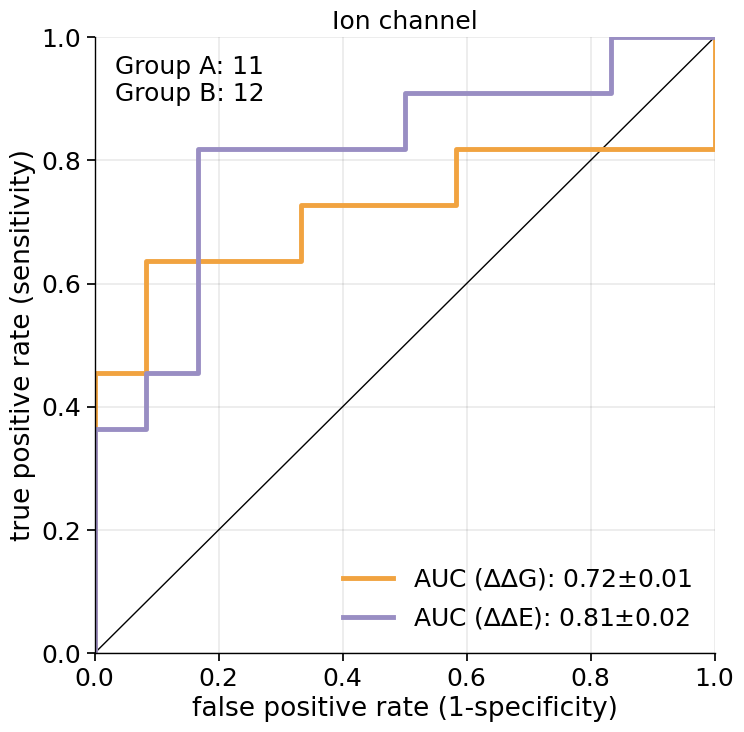

INFO:TRANSMEM
INFO:9.931568854324432e-05
INFO:2
INFO:groupA: 4
groupB: 3


9.931568854324432e-05
Ensemble test roc-auc:0.4166666666666667
Ensemble test roc-auc:0.7500000000000001


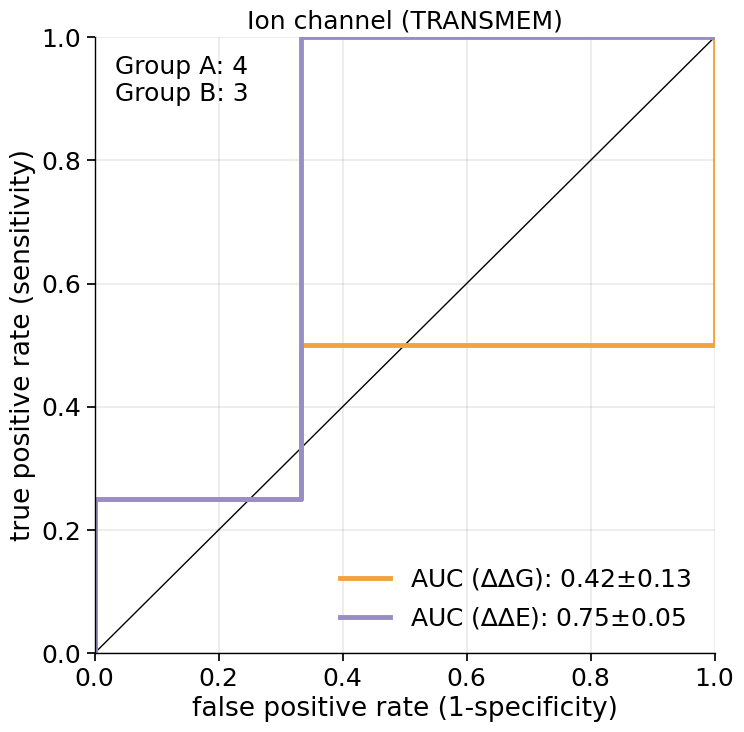

INFO:Transporter
INFO:all
INFO:9.931568854324432e-05
INFO:17
INFO:groupA: 98
groupB: 42


9.931568854324432e-05
Ensemble test roc-auc:0.6345966958211856
Ensemble test roc-auc:0.8233722060252673


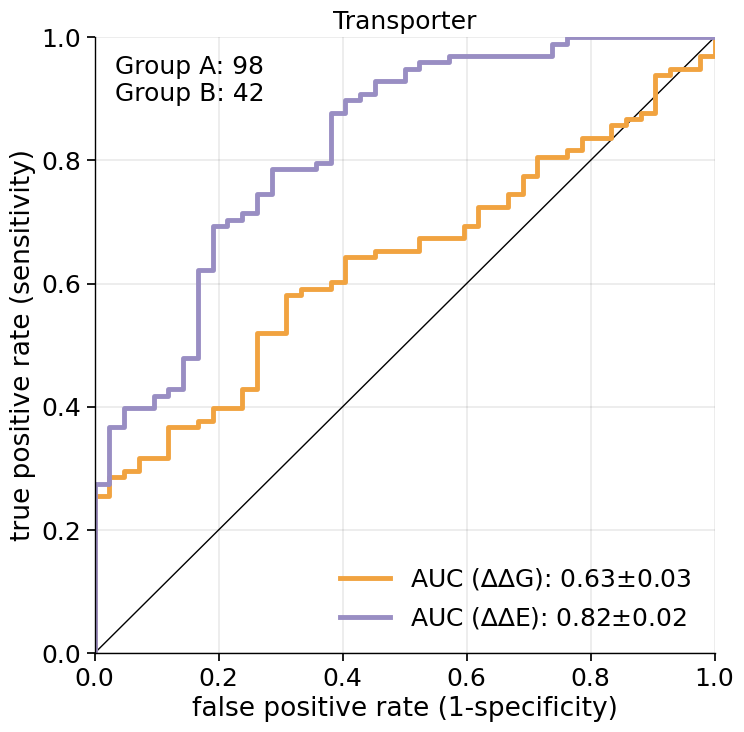

INFO:TRANSMEM
INFO:9.931568854324432e-05
INFO:5
INFO:groupA: 44
groupB: 10


9.931568854324432e-05
Ensemble test roc-auc:0.7090909090909091
Ensemble test roc-auc:0.9659090909090908


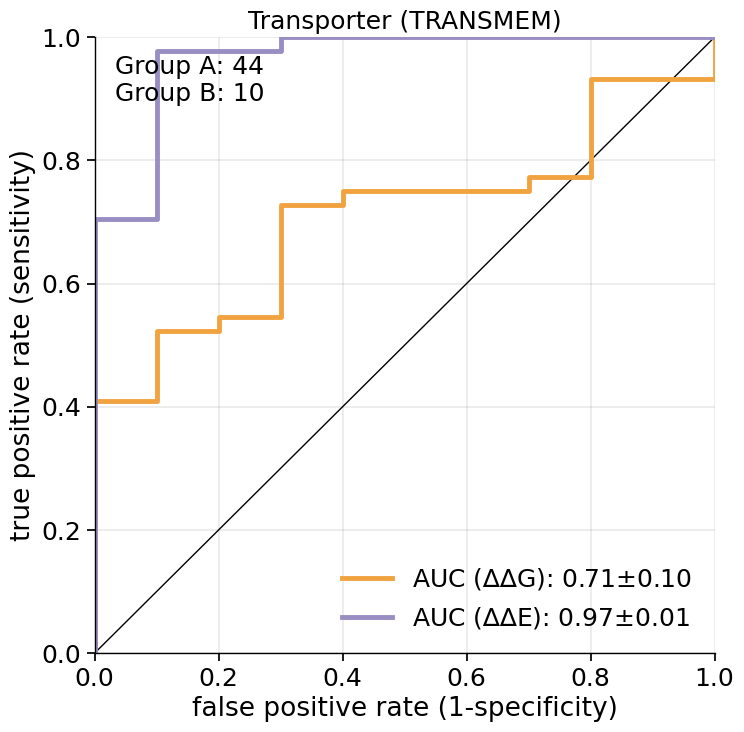

In [170]:
gemme_name = 'gemme;score'

target_dic_here = subfiltered_df_dicts
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp = all_tmp.copy()
        title = f"{category}"
        if region != 'all':
            title = title + f' ({region})'
            tmp = tmp[(tmp['uniprot;regions_all']==region)].reset_index(drop=True)

        for cutoff_value in [cutoff_value]:
            logger.info(cutoff_value)
            print(cutoff_value)
            control_df = tmp.copy()
            control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)

            logger.info(len(control_df.loc[control_df['clinvar;significance_all']=='benign', ['variant']]))
            control_score = np.copy(control_df['score'].values)
            if len(list(set(control_score))) > 1:
                test_score1 = control_df['rosetta;ddG'].values
                test_score2 = control_df[gemme_name].values
                groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
                groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
                logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
                satu = ''

                auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, test_score2, 
                                               'all', f"Fig4-A_{title}", cutoff=cutoff_value, satu=satu, 
                                               groupA=groupA, groupB=groupB, nameB=gemme_name, title=title, runs=10)


### ddG-ddE distribution

INFO:Cell Junction
INFO:all
INFO:['group B' 'other' 'group A']


<Figure size 576x576 with 0 Axes>

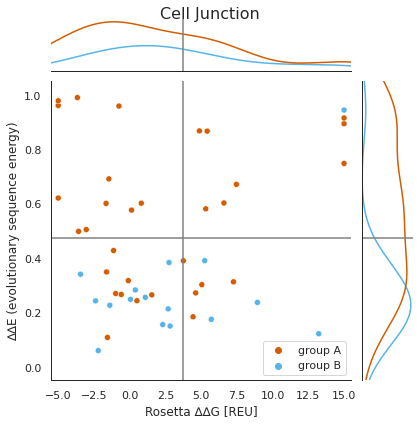

INFO:Q1 - group A: 8
INFO:Q1 - group B: 1
INFO:Q2 - group A: 12
INFO:Q2 - group B: 0
INFO:Q3 - group A: 8
INFO:Q3 - group B: 11
INFO:Q4 - group A: 5
INFO:Q4 - group B: 4
INFO:TRANSMEM
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

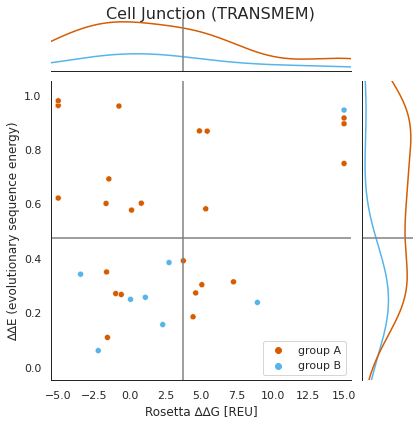

INFO:Q1 - group A: 6
INFO:Q1 - group B: 1
INFO:Q2 - group A: 9
INFO:Q2 - group B: 0
INFO:Q3 - group A: 4
INFO:Q3 - group B: 6
INFO:Q4 - group A: 5
INFO:Q4 - group B: 1
INFO:Enzyme
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

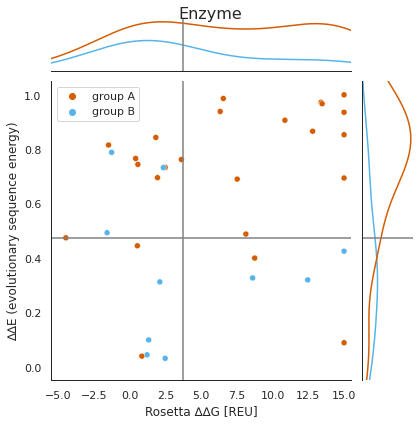

INFO:Q1 - group A: 12
INFO:Q1 - group B: 0
INFO:Q2 - group A: 8
INFO:Q2 - group B: 3
INFO:Q3 - group A: 2
INFO:Q3 - group B: 4
INFO:Q4 - group A: 2
INFO:Q4 - group B: 3
INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

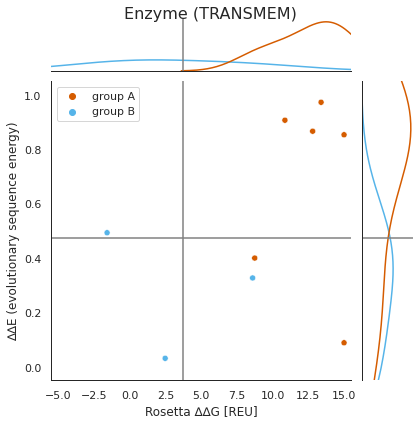

INFO:Q1 - group A: 4
INFO:Q1 - group B: 0
INFO:Q2 - group A: 0
INFO:Q2 - group B: 1
INFO:Q3 - group A: 0
INFO:Q3 - group B: 1
INFO:Q4 - group A: 2
INFO:Q4 - group B: 1
INFO:GPCR
INFO:all
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

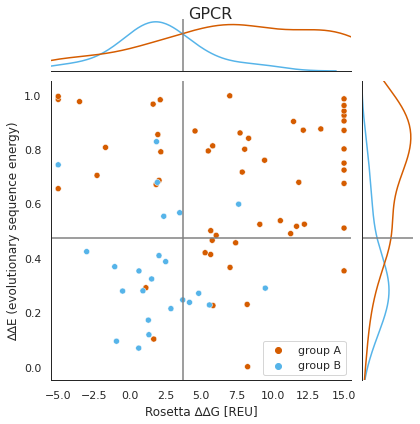

INFO:Q1 - group A: 31
INFO:Q1 - group B: 1
INFO:Q2 - group A: 12
INFO:Q2 - group B: 5
INFO:Q3 - group A: 2
INFO:Q3 - group B: 14
INFO:Q4 - group A: 9
INFO:Q4 - group B: 4
INFO:TRANSMEM
INFO:['other' 'group A' 'group B']


<Figure size 576x576 with 0 Axes>

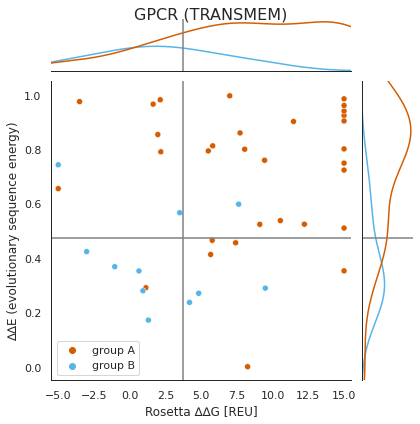

INFO:Q1 - group A: 19
INFO:Q1 - group B: 1
INFO:Q2 - group A: 6
INFO:Q2 - group B: 2
INFO:Q3 - group A: 1
INFO:Q3 - group B: 5
INFO:Q4 - group A: 5
INFO:Q4 - group B: 3
INFO:Ion channel
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

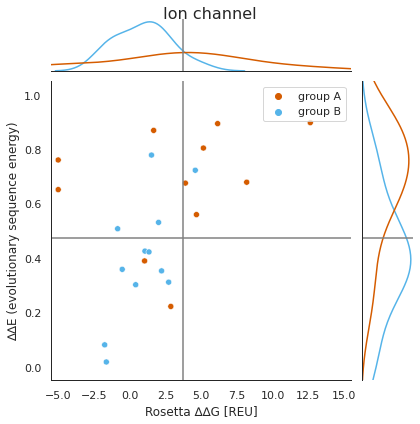

INFO:Q1 - group A: 6
INFO:Q1 - group B: 1
INFO:Q2 - group A: 3
INFO:Q2 - group B: 3
INFO:Q3 - group A: 2
INFO:Q3 - group B: 8
INFO:Q4 - group A: 0
INFO:Q4 - group B: 0
INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

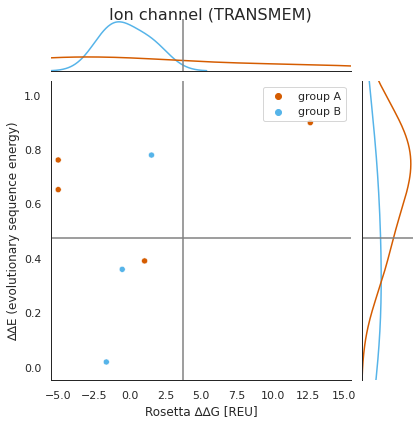

INFO:Q1 - group A: 1
INFO:Q1 - group B: 0
INFO:Q2 - group A: 2
INFO:Q2 - group B: 1
INFO:Q3 - group A: 1
INFO:Q3 - group B: 2
INFO:Q4 - group A: 0
INFO:Q4 - group B: 0
INFO:Transporter
INFO:all
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

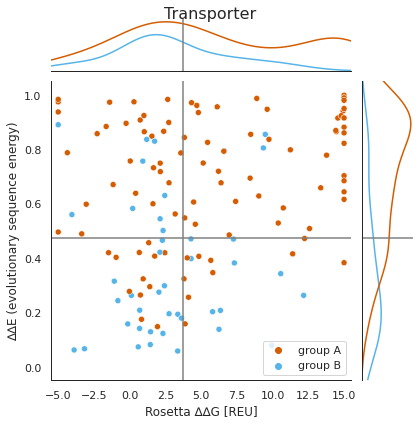

INFO:Q1 - group A: 48
INFO:Q1 - group B: 3
INFO:Q2 - group A: 29
INFO:Q2 - group B: 9
INFO:Q3 - group A: 12
INFO:Q3 - group B: 20
INFO:Q4 - group A: 9
INFO:Q4 - group B: 10
INFO:TRANSMEM
INFO:['other' 'group B' 'group A']


<Figure size 576x576 with 0 Axes>

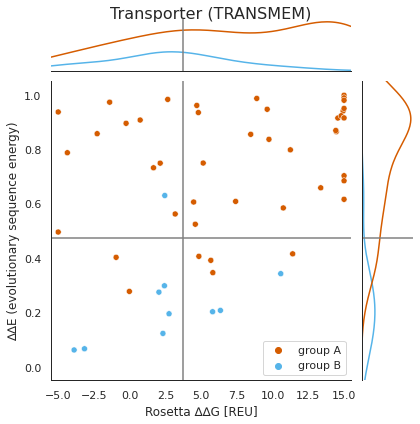

INFO:Q1 - group A: 27
INFO:Q1 - group B: 0
INFO:Q2 - group A: 11
INFO:Q2 - group B: 1
INFO:Q3 - group A: 2
INFO:Q3 - group B: 6
INFO:Q4 - group A: 4
INFO:Q4 - group B: 3


In [248]:
x_range = 1
y_range = 0.1

target_dic_here = subfiltered_df_dicts
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        title = category
        if region != 'all':
            title = title + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        with sns.axes_style("white"):
            f = plt.figure(figsize=(8,8))
            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                              hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])
            g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_joint.set_xlim(-5.5,15.5)
            g.ax_joint.set_ylim(-0.05,1.05)

            g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
            g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
            g.ax_joint.legend().set_title('')
            g.fig.suptitle(title)
            g.fig.subplots_adjust(top=0.95)

            filename = os.path.join(plots_dir, f'Fig4-B_{title}.svg')
            plt.savefig(filename, )
            plt.show()
            logger.info(f'Q1 - group A: {len(tmpi.loc[((tmpi["rosetta;ddG"]>=all_vals_cat[key][8]) & (tmpi["gemme;score"]>=all_vals_cat[key][9]) & (tmpi["label"]=="group A")), "label"])}')
            logger.info(f'Q1 - group B: {len(tmpi.loc[((tmpi["rosetta;ddG"]>=all_vals_cat[key][8]) & (tmpi["gemme;score"]>=all_vals_cat[key][9]) & (tmpi["label"]=="group B")), "label"])}')
            logger.info(f'Q2 - group A: {len(tmpi.loc[((tmpi["rosetta;ddG"]<all_vals_cat[key][8]) & (tmpi["gemme;score"]>=all_vals_cat[key][9]) & (tmpi["label"]=="group A")), "label"])}')
            logger.info(f'Q2 - group B: {len(tmpi.loc[((tmpi["rosetta;ddG"]<all_vals_cat[key][8]) & (tmpi["gemme;score"]>=all_vals_cat[key][9]) & (tmpi["label"]=="group B")), "label"])}')
            logger.info(f'Q3 - group A: {len(tmpi.loc[((tmpi["rosetta;ddG"]<all_vals_cat[key][8]) & (tmpi["gemme;score"]<all_vals_cat[key][9]) & (tmpi["label"]=="group A")), "label"])}')
            logger.info(f'Q3 - group B: {len(tmpi.loc[((tmpi["rosetta;ddG"]<all_vals_cat[key][8]) & (tmpi["gemme;score"]<all_vals_cat[key][9]) & (tmpi["label"]=="group B")), "label"])}')
            logger.info(f'Q4 - group A: {len(tmpi.loc[((tmpi["rosetta;ddG"]>=all_vals_cat[key][8]) & (tmpi["gemme;score"]<all_vals_cat[key][9]) & (tmpi["label"]=="group A")), "label"])}')
            logger.info(f'Q4 - group B: {len(tmpi.loc[((tmpi["rosetta;ddG"]>=all_vals_cat[key][8]) & (tmpi["gemme;score"]<all_vals_cat[key][9]) & (tmpi["label"]=="group B")), "label"])}')



### SASA & AA property count for quadrant and groups A & B

INFO:Cell Junction
INFO:all


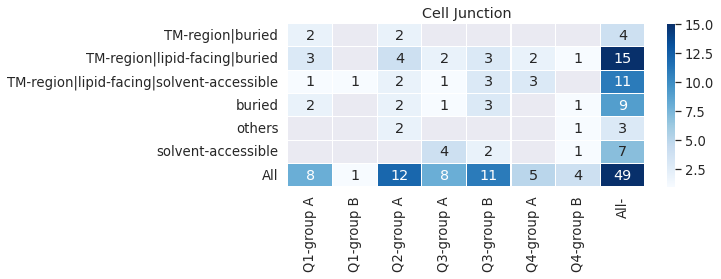

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


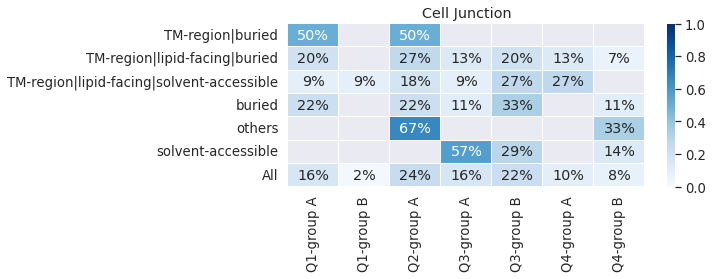

INFO:Enzyme
INFO:all


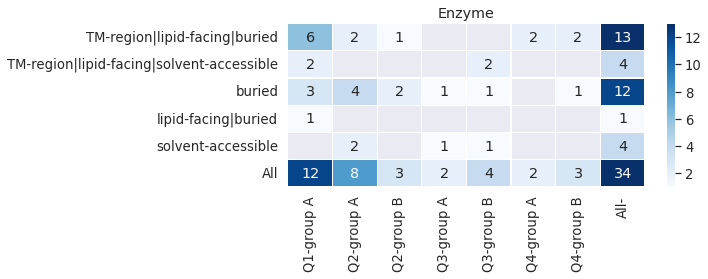

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


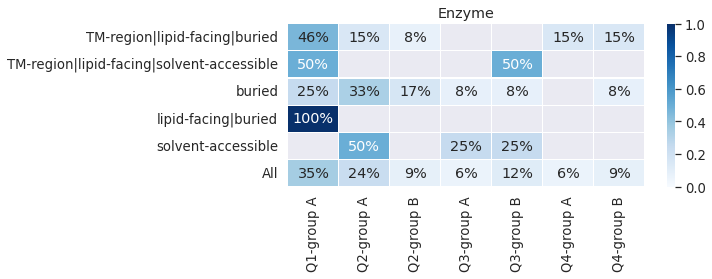

INFO:GPCR
INFO:all


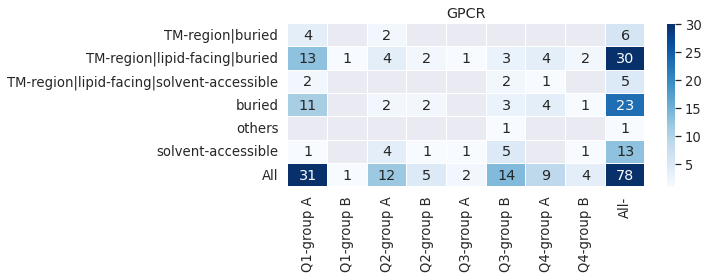

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


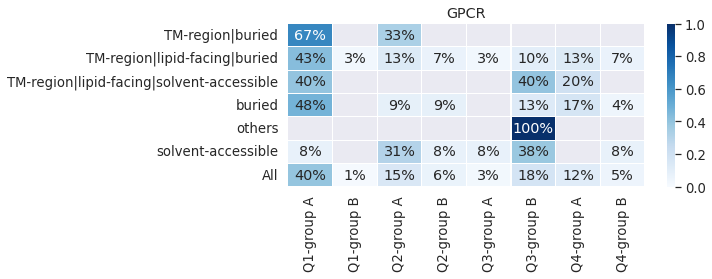

INFO:Ion channel
INFO:all


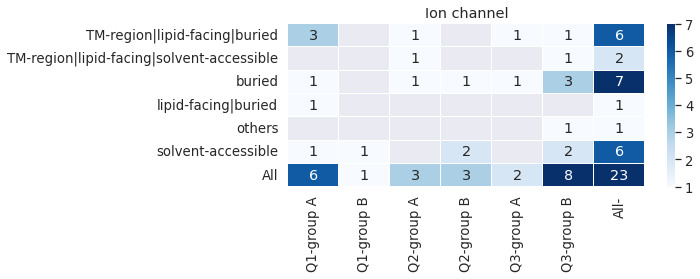

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


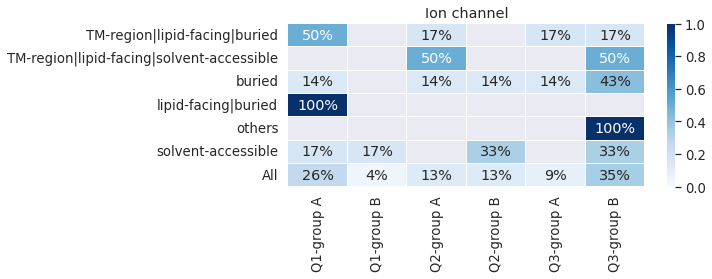

INFO:Transporter
INFO:all


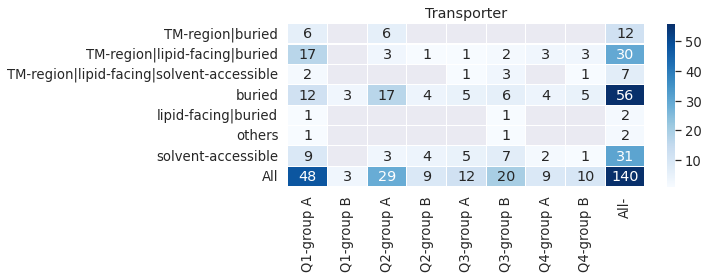

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


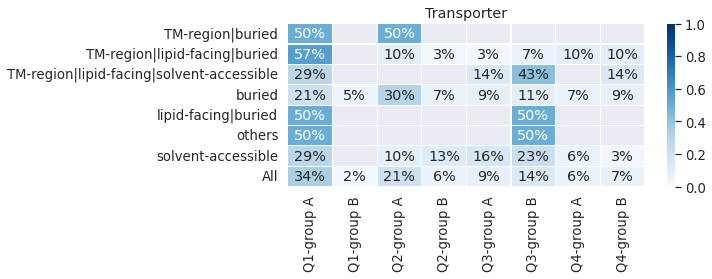

In [134]:
target_dic_here = subfiltered_df_dicts
all_all_tmp = []
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
        tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
        tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

        tmp_energy['property_wt'] = tmp_energy['wt'].apply(lambda x: make_property(x))
        tmp_energy['property_var'] = tmp_energy['var'].apply(lambda x: make_property(x))

        def remove_dup(x):
            if type(x)==str:
                x = x.split('|')
                x= list(set(x))
                for elem in x:
                    if elem!='':
                        return elem
            else:
                return None
        tmp_energy['SAR'] = ''
        for pdbASA in [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')]:
            tmp_energy['SAR_tmp'] = tmp_energy[pdbASA].apply(lambda x: sasa(x))
            tmp_energy['SAR_tmp'] = tmp_energy['SAR_tmp'].fillna('')
            tmp_energy['SAR'] = tmp_energy['SAR'] +'|'+ tmp_energy['SAR_tmp']
        tmp_energy['SAR'] = tmp_energy['SAR'].apply(lambda x: remove_dup(x) )

        tmp_energy['TMspan'] = ''
        for tmspan_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')]:
            tmp_energy['TMspan_tmp'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
            tmp_energy['TMspan'] = tmp_energy['TMspan'] +'|'+ tmp_energy['TMspan_tmp']
        tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: remove_dup(x) )
        tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: 'TM-region' if x else '')
        tmp_energy['LAR'] = ''
        for lar_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')]:
            tmp_energy['LAR_tmp'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
            tmp_energy['LAR'] = tmp_energy['LAR'] +'|'+ tmp_energy['LAR_tmp']
        tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: remove_dup(x) )
        tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

        tmp_energy['position_backup'] = tmp_energy['position']
        pos_list = ['solvent-accessible', 
                    'buried', 
                    'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|lipid-facing|solvent-accessible', 
                    'lipid-facing|buried', 
                   ]
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: x if x in pos_list else 'others')

        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    all_all_tmp.append(all_tmp)
    for region in ['all']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        title = category
        if region != 'all':
            title = title + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        x_range = 1
        y_range = 0.1
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))
        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        all_all_tmp.append(tmp_energy)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                        annot=True, fmt=".0%", )
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()
all_all_tmp = pd.concat(all_all_tmp)
            

In [142]:
tmpi = all_all_tmp.copy()

tmpi = tmpi.loc[tmpi['accession'].isin(protein_categories['GPCR'])]
tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
logger.info(tmpi['position_backup'].unique())
tmpi['c'] = 1
df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
df2 = df2.fillna(0)
df2.columns
df2['All']#['All']
tmpi[['variant', 'label', 'position']]
logger.info(tmpi['position'].unique())
tmpi.loc[~tmpi['position'].isin(['solvent-accessible', 'buried', 'others', 'TM-region|lipid-facing|buried',
 'TM-region|buried'])][['variant', 'label', 'position', 'quadrant']]#['variant'].tolist()
for elem in ['solvent-accessible', 
                    'buried', 
                    'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|lipid-facing|solvent-accessible', 
                    'lipid-facing|buried', 
            ]:
    print(elem)
    print(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())


INFO:['solvent-accessible' 'buried' 'TM-region|lipid-facing|solvent-accessible'
 'TM-region|lipid-facing|buried' 'TM-region|buried'
 'lipid-facing|solvent-accessible']
INFO:['solvent-accessible' 'buried' 'TM-region|lipid-facing|solvent-accessible'
 'TM-region|lipid-facing|buried' 'TM-region|buried' 'others']


solvent-accessible
['T17K', 'T17M', 'R147C', 'E150K', 'R165Q', 'N240S', 'I269N', 'R305W', 'I316S', 'R168H', 'E224D', 'N461S', 'K506R', 'T17K', 'T17M', 'R147C', 'E150K', 'R165Q', 'N240S', 'I269N', 'R305W', 'I316S', 'R168H', 'E224D', 'N461S', 'K506R']
buried
['P23S', 'T70M', 'N73S', 'G106R', 'G106V', 'G106W', 'G109R', 'R135L', 'R135W', 'P180A', 'P180L', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'G188E', 'D190N', 'T320N', 'R144H', 'R173C', 'R173H', 'R296C', 'P23S', 'T70M', 'N73S', 'G106R', 'G106V', 'G106W', 'G109R', 'R135L', 'R135W', 'P180A', 'P180L', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'G188E', 'D190N', 'T320N', 'R144H', 'R173C', 'R173H', 'R296C']
TM-region|lipid-facing|buried
['G51A', 'G51R', 'G51V', 'N55K', 'G90D', 'L95P', 'G114D', 'G114V', 'G121V', 'A164V', 'C167W', 'H211P', 'H211R', 'M216R', 'S297R', 'A299S', 'I307F', 'S94N', 'N123S', 'S127L', 'I170V', 'S180P', 'G181D', 'I251L', 'P260Q', 'P299H', 'A235V', 'L412F', 'W226R', 'I256V', 'G51A', 'G51R', 'G51V', 'N55K', 'G90D', 

[32.0, 17.0, 16.0, 13.0]


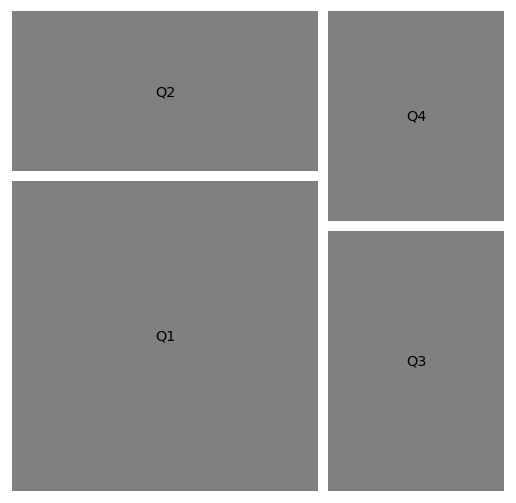

([32.0, 17.0, 16.0, 13.0], ['Q1', 'Q2', 'Q3', 'Q4'])

In [143]:
quadrant = 'Q3'
#['#D55C00', '#56B4E9', ]

label = ['Q1', 'Q2', 'Q3', 'Q4']
labels = []
sizes = []
for lab in label:
    if df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'] > 0:
        sizes.append(df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-base_all.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

[1.0, 5.0, 1.0, 6.0]


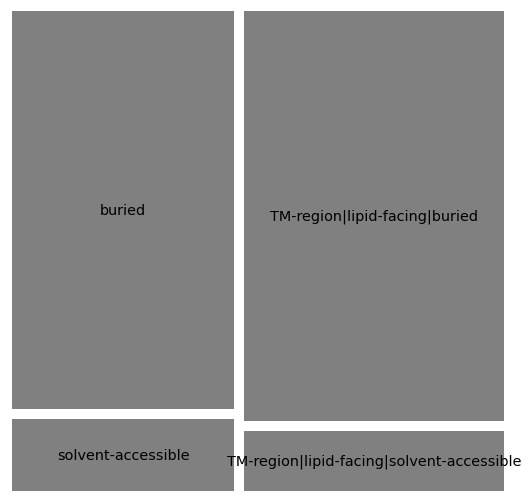

([1.0, 5.0, 1.0, 6.0],
 ['solvent-accessible',
  'buried',
  'TM-region|lipid-facing|solvent-accessible',
  'TM-region|lipid-facing|buried'])

In [147]:
quadrant = 'Q4'
#['#D55C00', '#56B4E9', ]

label = ['solvent-accessible', 'buried', 'TM-region|lipid-facing|solvent-accessible',
 'TM-region|lipid-facing|buried', 'TM-region|buried', 'others']
labels = []
sizes = []
for lab in label:
    if df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab] > 0:
        sizes.append(df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-base_{quadrant}.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

INFO:GPCR
INFO:all
INFO:groupA: 48
groupB: 23
INFO:[1. 0.]
INFO:['groupA' 'groupB']


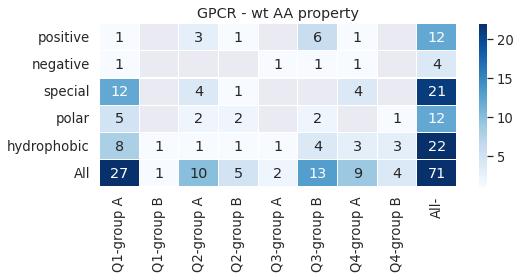

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


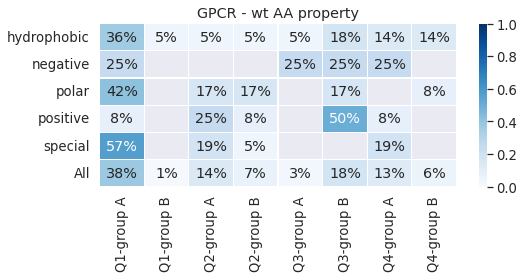

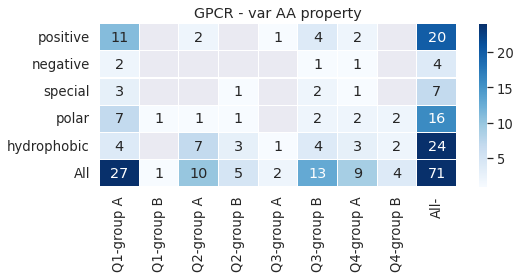

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


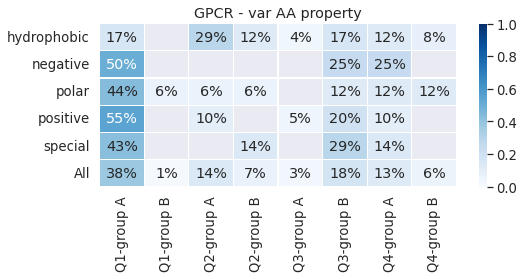

INFO:TRANSMEM
INFO:groupA: 29
groupB: 11
INFO:[1. 0.]
INFO:['groupA' 'groupB']


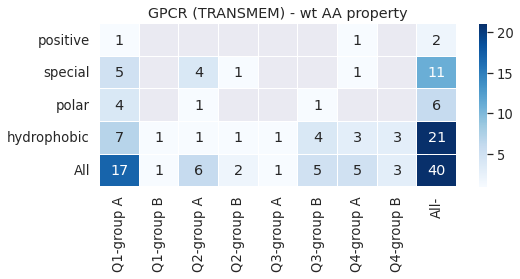

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


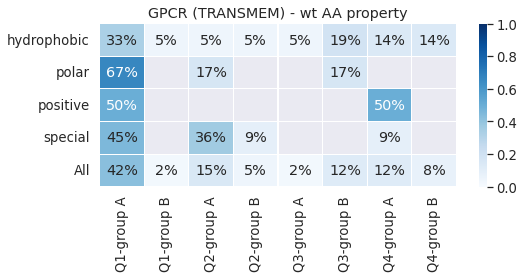

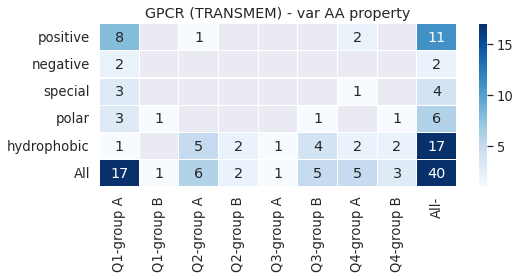

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


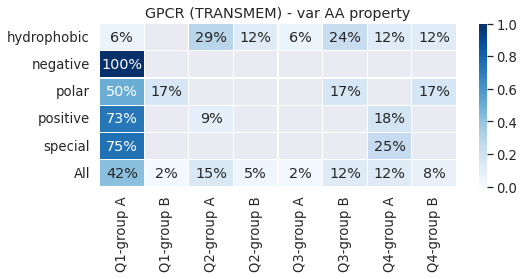

INFO:Transporter
INFO:all
INFO:groupA: 93
groupB: 39
INFO:[1. 0.]
INFO:['groupA' 'groupB']


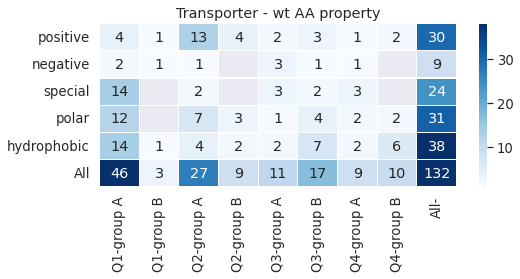

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


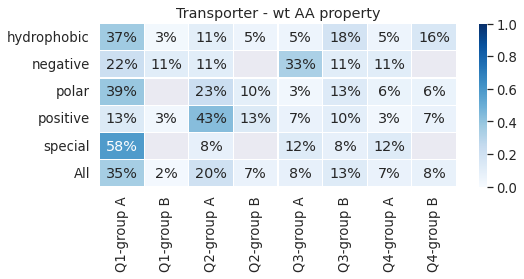

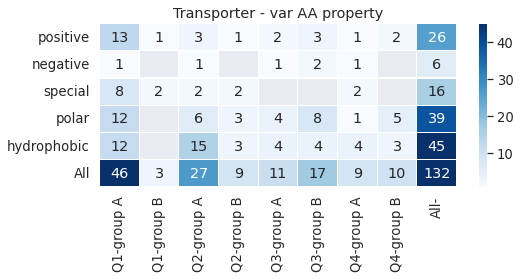

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


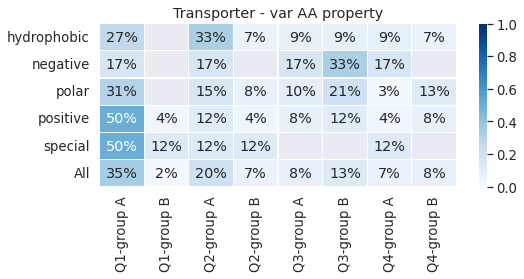

INFO:TRANSMEM
INFO:groupA: 43
groupB: 9
INFO:[1. 0.]
INFO:['groupA' 'groupB']


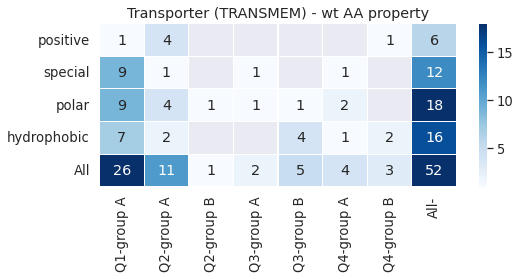

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


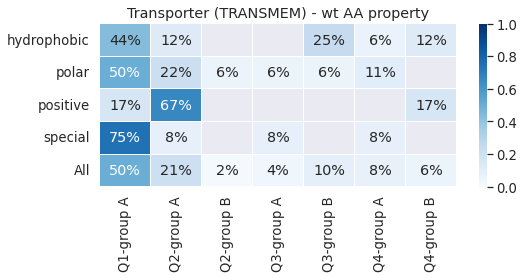

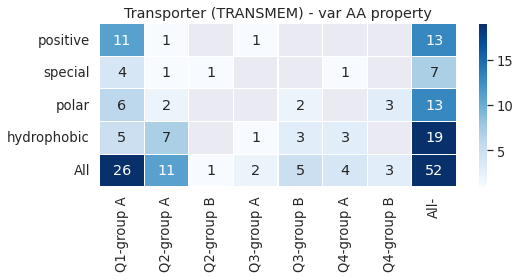

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


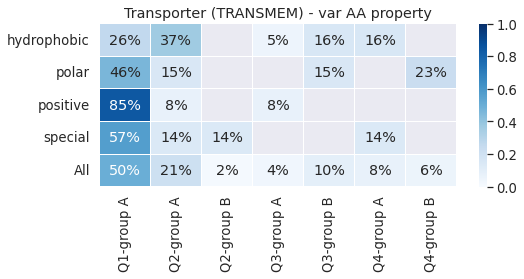

In [133]:
target_dic_here = subfiltered_df_dicts
for category in ['GPCR', 'Transporter']:
    logger.info(category)
    title_raw = category
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    
        pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
        tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
        tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
        tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
        tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'].unique()
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )
        tmp_energy['position_backup'] = tmp_energy['position']
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)

        tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

        tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
        tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        
        if region != 'all':
            title_raw = title_raw + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
        groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

        def label_gorup_class(x):
            if x==1:
                return 'groupA' 
            else:
                return 'groupB'
        logger.info(tmp_energy['score'].unique())
        tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))
        tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
        tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])
        tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property(x))
        tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        x_range = 1
        y_range = 0.1
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        for hue in ['wt AA property', 'var AA property']:
            title = f'{title_raw} - {hue}'
            tmpi = tmp_energy.copy()
            sorter = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
            tmpi[hue] = tmpi[hue].astype("category")
            tmpi[hue].cat.set_categories(sorter, inplace=True)
            tmpi.sort_values([hue])
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            tmpi['c'] = 1
            df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)

            with sns.axes_style("darkgrid"):
                f = plt.figure(figsize=(8,3))
                sns.set(font_scale = 1.2)
                sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                            fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
                plt.xlabel('')
                plt.ylabel("", size=15)
                plt.title(title)
                plt.show()

            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

            tmpi2 = tmpi.copy()
            tmpi2['c'] = 1
            df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
            df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
            df2.drop(columns=['All'], inplace=True)

            with sns.axes_style("darkgrid"):
                f = plt.figure(figsize=(8,3))
                sns.set(font_scale = 1.2)
                sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                            annot=True, fmt=".0%", )
                plt.xlabel('')
                plt.ylabel("", size=15)
                plt.title(title)
                plt.show()


### SASA & AA property count for quadrant and groups A & B without LAR

INFO:Cell Junction
INFO:all


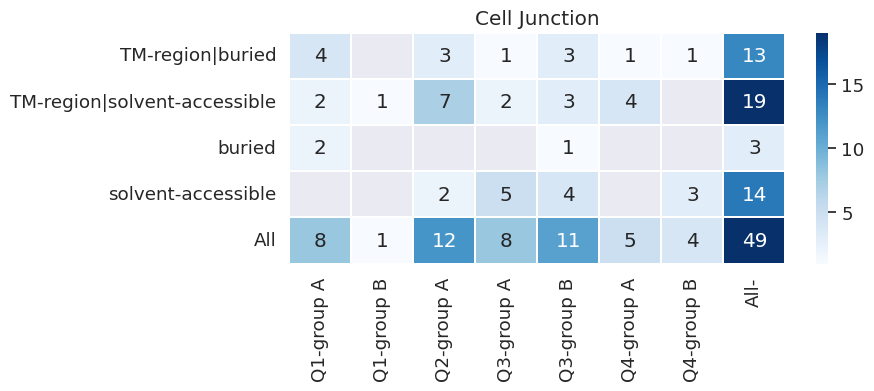

/tmp/ipykernel_38333/1966624194.py:130: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df2.drop(columns=['All'], inplace=True)


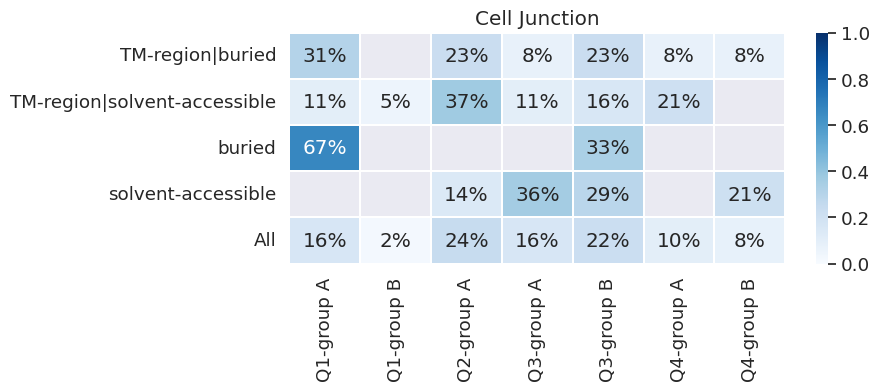

INFO:Enzyme
INFO:all


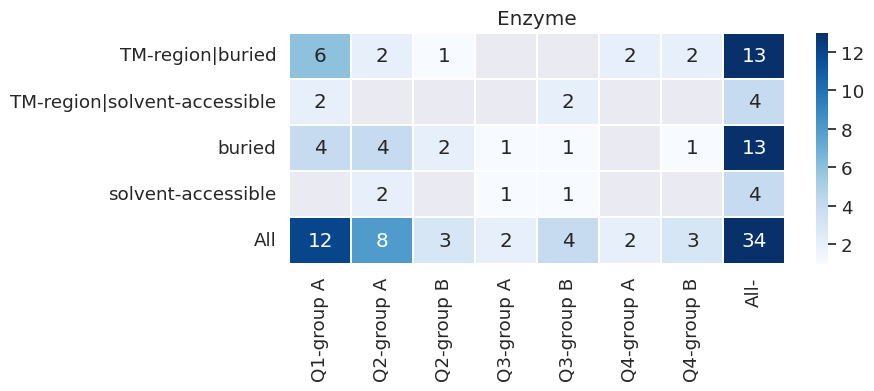

/tmp/ipykernel_38333/1966624194.py:130: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df2.drop(columns=['All'], inplace=True)


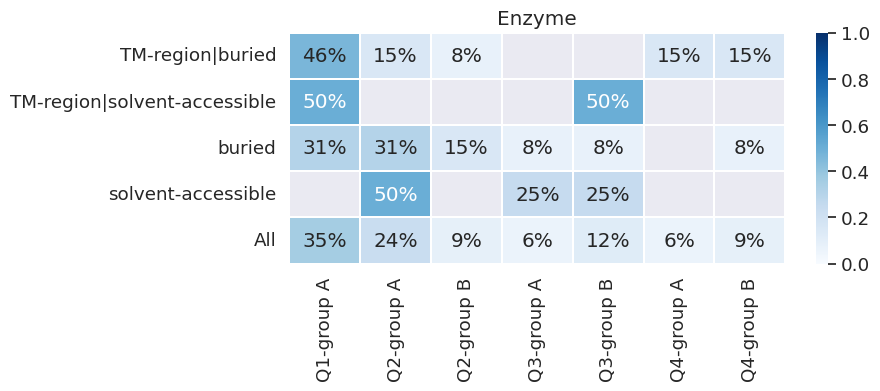

INFO:GPCR
INFO:all


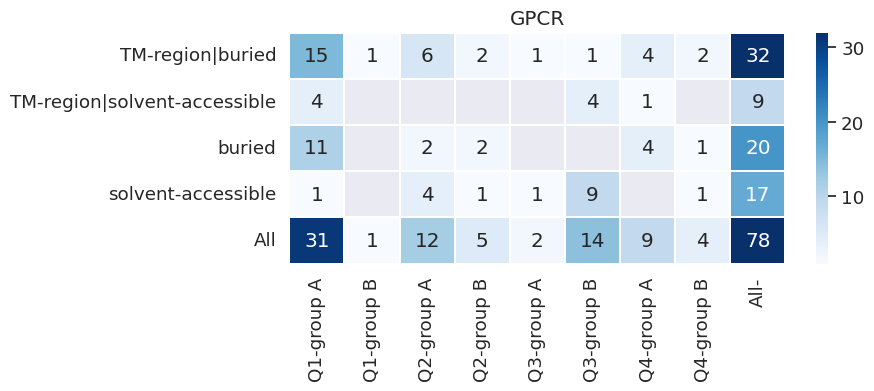

/tmp/ipykernel_38333/1966624194.py:130: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df2.drop(columns=['All'], inplace=True)


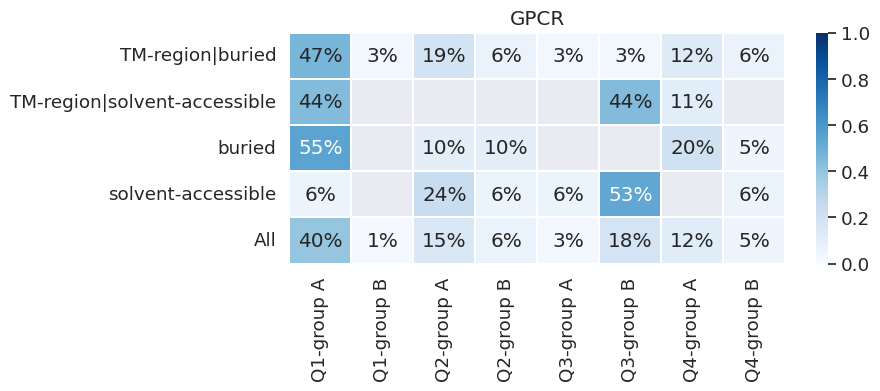

INFO:Ion channel
INFO:all


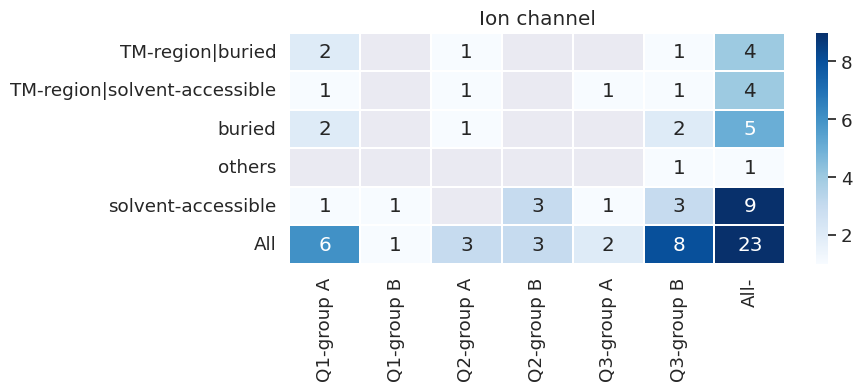

/tmp/ipykernel_38333/1966624194.py:130: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df2.drop(columns=['All'], inplace=True)


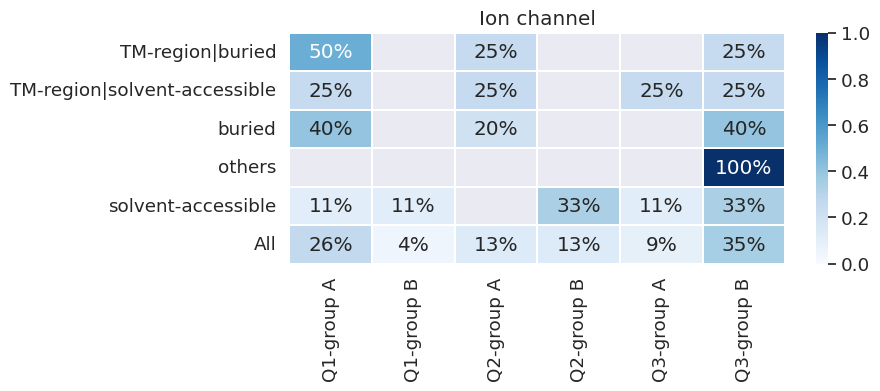

INFO:Transporter
INFO:all


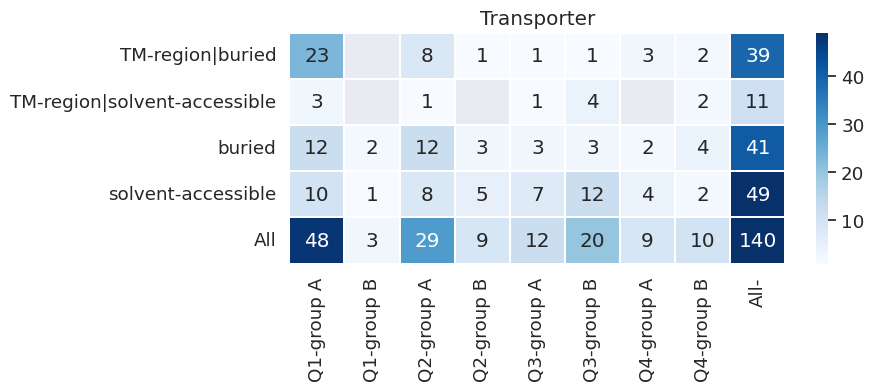

/tmp/ipykernel_38333/1966624194.py:130: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df2.drop(columns=['All'], inplace=True)


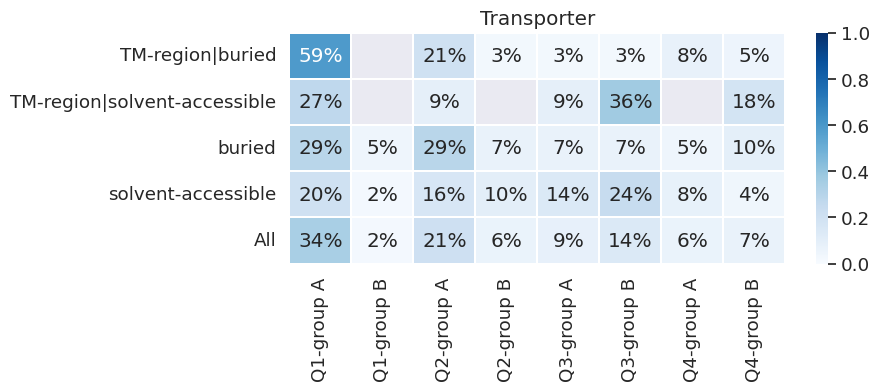

In [36]:
gemme_name = 'gemme;score'
target_dic_here = subfiltered_df_dicts
all_all_tmp = []
for category in sorted(protein_categories.keys()):
    logger.info(category)
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
        tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
        tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

        tmp_energy['property_wt'] = tmp_energy['wt'].apply(lambda x: make_property(x))
        tmp_energy['property_var'] = tmp_energy['var'].apply(lambda x: make_property(x))

        def remove_dup(x):
            if type(x)==str:
                x = x.split('|')
                x= list(set(x))
                for elem in x:
                    if elem!='':
                        return elem
            else:
                return None
        tmp_energy['SAR'] = ''
        for pdbASA in [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')]:
            tmp_energy['SAR_tmp'] = tmp_energy[pdbASA].apply(lambda x: sasa(x))
            tmp_energy['SAR_tmp'] = tmp_energy['SAR_tmp'].fillna('')
            tmp_energy['SAR'] = tmp_energy['SAR'] +'|'+ tmp_energy['SAR_tmp']
        tmp_energy['SAR'] = tmp_energy['SAR'].apply(lambda x: remove_dup(x) )

        tmp_energy['TMspan'] = ''
        for tmspan_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')]:
            tmp_energy['TMspan_tmp'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
            tmp_energy['TMspan'] = tmp_energy['TMspan'] +'|'+ tmp_energy['TMspan_tmp']
        tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: remove_dup(x) )
        tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: 'TM-region' if x else '')
#         tmp_energy['LAR'] = ''
#         for lar_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')]:
#             tmp_energy['LAR_tmp'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
#             tmp_energy['LAR'] = tmp_energy['LAR'] +'|'+ tmp_energy['LAR_tmp']
#         tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: remove_dup(x) )
#         tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: 'lipid-facing' if x else '')
#         tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

        tmp_energy['position_backup'] = tmp_energy['position']
        pos_list = ['solvent-accessible', 
                    'buried', 
#                     'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|solvent-accessible', 
#                     'TM-region|lipid-facing|solvent-accessible', 
#                     'lipid-facing|buried', 
                   ]
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: x if x in pos_list else 'others')

        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    all_all_tmp.append(all_tmp)
    for region in ['all']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        title = category
        if region != 'all':
            title = title + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        x_range = 1
        y_range = 0.1
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))
        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        all_all_tmp.append(tmp_energy)
        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi['c'] = 1
        df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                        fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()

        tmpi = tmp_energy.copy()
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

        tmpi2 = tmpi.copy()
        tmpi2['c'] = 1
        df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
        df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
        df2.drop(columns=['All'], inplace=True)

        with sns.axes_style("darkgrid"):
            f = plt.figure(figsize=(8,3))
            sns.set(font_scale = 1.2)
            sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                        annot=True, fmt=".0%", )
            plt.xlabel('')
            plt.ylabel("", size=15)
            plt.title(title)
            plt.show()
all_all_tmp = pd.concat(all_all_tmp)
            

#### make radar charts

In [65]:
count_cat_list = [['category', 'region', 'count']]
for cat in protein_categories.keys():
#     print(cat)
    tmpi = all_all_tmp.copy()

    tmpi = tmpi.loc[tmpi['accession'].isin(protein_categories[cat])]
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
#     logger.info(tmpi['position_backup'].unique())
    tmpi['c'] = 1
    df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
    df2 = df2.fillna(0)
    df2.columns
    df2['All']#['All']
    tmpi[['variant', 'label', 'position']]
#     logger.info(tmpi['position'].unique())
    tmpi.loc[~tmpi['position'].isin(['solvent-accessible', 'buried', #'others', 
    #                                  'TM-region|lipid-facing|buried',
                                     'TM-region|solvent-accessible',
                                     'TM-region|buried'
                                    ])][['variant', 'label', 'position', 'quadrant']]#['variant'].tolist()
    for elem in ['solvent-accessible', 
                        'buried', 
    #                     'TM-region|lipid-facing|buried', 
                        'TM-region|buried', 
                        'TM-region|solvent-accessible', 
    #                     'TM-region|lipid-facing|solvent-accessible', 
    #                     'lipid-facing|buried', 
                ]:
        #print(elem)
        #print(len(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist()))
        count_cat_list.append([cat, elem, len(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())])
#         print(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())
count_cat_list_df = pd.DataFrame(data=count_cat_list[1:], columns=count_cat_list[0])
# count_cat_list_sum = count_cat_list_df.groupby('region').sum().reset_index(drop=False)
count_cat_list_df['team_percent'] = count_cat_list_df['count'] / count_cat_list_df.groupby('category')['count'].transform('sum')
print(count_cat_list_df.groupby('region').sum())
print()
print(count_cat_list_df.groupby('region').sum().sum())
count_cat_list_df
count_cat_list_df

                              count  team_percent
region                                           
TM-region|buried                202      1.518305
TM-region|solvent-accessible     94      0.881176
buried                          164      1.220118
solvent-accessible              186      1.380401

count           646.0
team_percent      5.0
dtype: float64


,category,region,count,team_percent
0,Transporter,solvent-accessible,98,0.350000
1,Transporter,buried,82,0.292857
2,Transporter,TM-region|buried,78,0.278571
3,Transporter,TM-region|solvent-accessible,22,0.078571
4,Cell Junction,solvent-accessible,28,0.285714
5,Cell Junction,buried,6,0.061224
6,Cell Junction,TM-region|buried,26,0.265306
7,Cell Junction,TM-region|solvent-accessible,38,0.387755
8,Ion channel,solvent-accessible,18,0.409091
9,Ion channel,buried,10,0.227273


In [71]:
tmpi[['variant', 'label', 'position', 'quadrant']]

,variant,label,position,quadrant
0,T17K,group A,solvent-accessible,NaN
1,T17M,group A,solvent-accessible,NaN
2,P23S,group A,buried,NaN
3,M39R,group A,TM-region|solvent-accessible,NaN
4,L46R,group A,TM-region|solvent-accessible,NaN
...,...,...,...,...
151,W226R,group A,TM-region|buried,Q1
152,I256V,group A,TM-region|buried,Q3
153,N461S,group B,solvent-accessible,Q3
154,M493V,group B,solvent-accessible,Q3


#### observable:
https://observablehq.com/d/e3d0d8e150c36257

In [75]:
count_cat_list = [['category', 'region', 'quadrant', 'label', 'count']]
for cat in protein_categories.keys():
    tmpi = all_all_tmp.copy()
    tmpi = tmpi.loc[tmpi['accession'].isin(protein_categories[cat])]
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    tmpi[['variant', 'label', 'position']]
    for el in tmpi['quadrant'].unique():
        for label in tmpi['label'].unique():
            tmpsi = tmpi.copy()
            tmpsi = tmpsi.loc[tmpsi['quadrant']==el].reset_index(drop=True)
            tmpsi = tmpsi.loc[tmpsi['label']==label].reset_index(drop=True)
            for elem in ['solvent-accessible', 
                        'buried', 
                        'TM-region|buried', 
                        'TM-region|solvent-accessible', 
                    ]:
                count = len(tmpsi.loc[tmpsi['position'].isin([elem])]['variant'].tolist())
                if count >0:
                    count_cat_list.append([cat, elem, el, label, count])
count_cat_list_df = pd.DataFrame(data=count_cat_list[1:], columns=count_cat_list[0])
count_cat_list_df['team_percent'] = count_cat_list_df['count'] / count_cat_list_df.groupby('category')['count'].transform('sum')
print(count_cat_list_df.groupby('region').sum())
print(count_cat_list_df.groupby('category').sum())
print(count_cat_list_df.groupby('region').sum().sum())
count_cat_list_df


                              count  team_percent
region                                           
TM-region|buried                101      1.518305
TM-region|solvent-accessible     47      0.881176
buried                           82      1.220118
solvent-accessible               93      1.380401
               count  team_percent
category                          
Cell Junction     49           1.0
Enzyme            34           1.0
GPCR              78           1.0
Ion channel       22           1.0
Transporter      140           1.0
count           323.0
team_percent      5.0
dtype: float64


,category,region,quadrant,label,count,team_percent
0,Transporter,solvent-accessible,Q3,group B,12,0.085714
1,Transporter,buried,Q3,group B,3,0.021429
2,Transporter,TM-region|buried,Q3,group B,1,0.007143
3,Transporter,TM-region|solvent-accessible,Q3,group B,4,0.028571
4,Transporter,solvent-accessible,Q3,group A,7,0.050000
...,...,...,...,...,...,...
94,GPCR,solvent-accessible,Q3,group A,1,0.012821
95,GPCR,TM-region|buried,Q3,group A,1,0.012821
96,GPCR,solvent-accessible,Q3,group B,9,0.115385
97,GPCR,TM-region|buried,Q3,group B,1,0.012821


In [111]:
all_dat_combined = []
for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
    tmp_list = []
    for category in ['Transporter', 'Cell Junction', 'Ion channel', 'Enzyme', 'GPCR']:
        tmpsi = count_cat_list_df.copy()
        tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
        tmpsi = tmpsi.loc[tmpsi['category']==category].reset_index(drop=True)
#         percent = round(tmpsi['team_percent'].sum(),2)
        percent = tmpsi['count'].sum()
        tmp_list.append({f'axis: "{category}", value: {percent}'})
    all_dat_combined.append(tmp_list)
        
all_dat_combined 

[[{'axis: "Transporter", value: 49'},
  {'axis: "Cell Junction", value: 14'},
  {'axis: "Ion channel", value: 9'},
  {'axis: "Enzyme", value: 4'},
  {'axis: "GPCR", value: 17'}],
 [{'axis: "Transporter", value: 41'},
  {'axis: "Cell Junction", value: 3'},
  {'axis: "Ion channel", value: 5'},
  {'axis: "Enzyme", value: 13'},
  {'axis: "GPCR", value: 20'}],
 [{'axis: "Transporter", value: 11'},
  {'axis: "Cell Junction", value: 19'},
  {'axis: "Ion channel", value: 4'},
  {'axis: "Enzyme", value: 4'},
  {'axis: "GPCR", value: 9'}],
 [{'axis: "Transporter", value: 39'},
  {'axis: "Cell Junction", value: 13'},
  {'axis: "Ion channel", value: 4'},
  {'axis: "Enzyme", value: 13'},
  {'axis: "GPCR", value: 32'}]]

In [112]:
for label in ['group A', 'group B']:
    print(label)
    count_cat_list_df_patho = count_cat_list_df.copy()
    count_cat_list_df_patho = count_cat_list_df_patho.loc[count_cat_list_df_patho['label']==label].reset_index(drop=True)


    all_dat_patho = []
    for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
        tmp_list = []
        for category in ['Transporter', 'Cell Junction', 'Ion channel', 'Enzyme', 'GPCR']:
            tmpsi = count_cat_list_df_patho.copy()
            tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
            tmpsi = tmpsi.loc[tmpsi['category']==category].reset_index(drop=True)
#             percent = round(tmpsi['team_percent'].sum(),2)
            percent = tmpsi['count'].sum()
            tmp_list.append({f'axis: "{category}", value: {percent}'})
        all_dat_patho.append(tmp_list)

    print(all_dat_patho) 

group A
[[{'axis: "Transporter", value: 29'}, {'axis: "Cell Junction", value: 7'}, {'axis: "Ion channel", value: 2'}, {'axis: "Enzyme", value: 3'}, {'axis: "GPCR", value: 6'}], [{'axis: "Transporter", value: 29'}, {'axis: "Cell Junction", value: 2'}, {'axis: "Ion channel", value: 3'}, {'axis: "Enzyme", value: 9'}, {'axis: "GPCR", value: 17'}], [{'axis: "Transporter", value: 5'}, {'axis: "Cell Junction", value: 15'}, {'axis: "Ion channel", value: 3'}, {'axis: "Enzyme", value: 2'}, {'axis: "GPCR", value: 5'}], [{'axis: "Transporter", value: 35'}, {'axis: "Cell Junction", value: 9'}, {'axis: "Ion channel", value: 3'}, {'axis: "Enzyme", value: 10'}, {'axis: "GPCR", value: 26'}]]
group B
[[{'axis: "Transporter", value: 20'}, {'axis: "Cell Junction", value: 7'}, {'axis: "Ion channel", value: 7'}, {'axis: "Enzyme", value: 1'}, {'axis: "GPCR", value: 11'}], [{'axis: "Transporter", value: 12'}, {'axis: "Cell Junction", value: 1'}, {'axis: "Ion channel", value: 2'}, {'axis: "Enzyme", value: 4'},

In [87]:
count_cat_list_df_patho = count_cat_list_df.copy()
count_cat_list_df_patho = count_cat_list_df_patho.loc[count_cat_list_df_patho['label']=='group A'].reset_index(drop=True)
count_cat_list_df_patho['team_percent'] = count_cat_list_df_patho['count'] / count_cat_list_df_patho.groupby('category')['count'].transform('sum')


all_dat_patho = []
for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
    tmp_list = []
    for category in ['Transporter', 'Cell Junction', 'Ion channel', 'Enzyme', 'GPCR']:
        tmpsi = count_cat_list_df_patho.copy()
        tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
        tmpsi = tmpsi.loc[tmpsi['category']==category].reset_index(drop=True)
        percent = round(tmpsi['team_percent'].sum(),2)
        tmp_list.append({f'axis: "{category}", value: {percent}'})
    all_dat_patho.append(tmp_list)
        
all_dat_patho 

[[{'axis: "Transporter", value: 0.3'},
  {'axis: "Cell Junction", value: 0.21'},
  {'axis: "Ion channel", value: 0.18'},
  {'axis: "Enzyme", value: 0.12'},
  {'axis: "GPCR", value: 0.11'}],
 [{'axis: "Transporter", value: 0.3'},
  {'axis: "Cell Junction", value: 0.06'},
  {'axis: "Ion channel", value: 0.27'},
  {'axis: "Enzyme", value: 0.38'},
  {'axis: "GPCR", value: 0.31'}],
 [{'axis: "Transporter", value: 0.05'},
  {'axis: "Cell Junction", value: 0.45'},
  {'axis: "Ion channel", value: 0.27'},
  {'axis: "Enzyme", value: 0.08'},
  {'axis: "GPCR", value: 0.09'}],
 [{'axis: "Transporter", value: 0.36'},
  {'axis: "Cell Junction", value: 0.27'},
  {'axis: "Ion channel", value: 0.27'},
  {'axis: "Enzyme", value: 0.42'},
  {'axis: "GPCR", value: 0.48'}]]

In [113]:
count_cat_list_df_ben = count_cat_list_df.copy()
count_cat_list_df_ben = count_cat_list_df_ben.loc[count_cat_list_df_ben['label']=='group B'].reset_index(drop=True)
count_cat_list_df_ben['team_percent'] = count_cat_list_df_ben['count'] / count_cat_list_df_ben.groupby('category')['count'].transform('sum')


all_dat_ben = []
for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
    tmp_list = []
    for category in ['Transporter', 'Cell Junction', 'Ion channel', 'Enzyme', 'GPCR']:
        tmpsi = count_cat_list_df_ben.copy()
        tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
        tmpsi = tmpsi.loc[tmpsi['category']==category].reset_index(drop=True)
        percent = round(tmpsi['team_percent'].sum(),2)
        tmp_list.append({f'axis: "{category}", value: {percent}'})
    all_dat_ben.append(tmp_list)
        
all_dat_ben 

[[{'axis: "Transporter", value: 0.48'},
  {'axis: "Cell Junction", value: 0.44'},
  {'axis: "Ion channel", value: 0.64'},
  {'axis: "Enzyme", value: 0.1'},
  {'axis: "GPCR", value: 0.46'}],
 [{'axis: "Transporter", value: 0.29'},
  {'axis: "Cell Junction", value: 0.06'},
  {'axis: "Ion channel", value: 0.18'},
  {'axis: "Enzyme", value: 0.4'},
  {'axis: "GPCR", value: 0.12'}],
 [{'axis: "Transporter", value: 0.14'},
  {'axis: "Cell Junction", value: 0.25'},
  {'axis: "Ion channel", value: 0.09'},
  {'axis: "Enzyme", value: 0.2'},
  {'axis: "GPCR", value: 0.17'}],
 [{'axis: "Transporter", value: 0.1'},
  {'axis: "Cell Junction", value: 0.25'},
  {'axis: "Ion channel", value: 0.09'},
  {'axis: "Enzyme", value: 0.3'},
  {'axis: "GPCR", value: 0.25'}]]

In [114]:
for label in ['group A', 'group B']:
    print(label)
    count_cat_list_df_patho = count_cat_list_df.copy()
    count_cat_list_df_patho['team_percent'] = count_cat_list_df_patho['count'] / count_cat_list_df_patho.groupby('category')['count'].transform('sum')
    count_cat_list_df_patho = count_cat_list_df_patho.loc[count_cat_list_df_patho['label']==label].reset_index(drop=True)
    for quad in ['Q1', 'Q2', 'Q3', 'Q4']:
        print(quad)
        all_dat_pathQ = []
        for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
            tmp_list = []
            for category in ['Transporter', 'Cell Junction', 'Ion channel', 'Enzyme', 'GPCR']:
                tmpsi = count_cat_list_df_patho.copy()
                tmpsi = tmpsi.loc[tmpsi['quadrant']==quad].reset_index(drop=True)
                tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
                tmpsi = tmpsi.loc[tmpsi['category']==category].reset_index(drop=True)
#                 percent = round(tmpsi['team_percent'].sum(),2)
                percent = tmpsi['count'].sum()
                tmp_list.append({f'axis: "{category}", value: {percent}'})
            all_dat_pathQ.append(tmp_list)

        print(all_dat_pathQ) 

group A
Q1
[[{'axis: "Transporter", value: 10'}, {'axis: "Cell Junction", value: 0'}, {'axis: "Ion channel", value: 1'}, {'axis: "Enzyme", value: 0'}, {'axis: "GPCR", value: 1'}], [{'axis: "Transporter", value: 12'}, {'axis: "Cell Junction", value: 2'}, {'axis: "Ion channel", value: 2'}, {'axis: "Enzyme", value: 4'}, {'axis: "GPCR", value: 11'}], [{'axis: "Transporter", value: 3'}, {'axis: "Cell Junction", value: 2'}, {'axis: "Ion channel", value: 1'}, {'axis: "Enzyme", value: 2'}, {'axis: "GPCR", value: 4'}], [{'axis: "Transporter", value: 23'}, {'axis: "Cell Junction", value: 4'}, {'axis: "Ion channel", value: 2'}, {'axis: "Enzyme", value: 6'}, {'axis: "GPCR", value: 15'}]]
Q2
[[{'axis: "Transporter", value: 8'}, {'axis: "Cell Junction", value: 2'}, {'axis: "Ion channel", value: 0'}, {'axis: "Enzyme", value: 2'}, {'axis: "GPCR", value: 4'}], [{'axis: "Transporter", value: 12'}, {'axis: "Cell Junction", value: 0'}, {'axis: "Ion channel", value: 1'}, {'axis: "Enzyme", value: 4'}, {'axi

In [115]:
#after quadrants - all
for label in ['group A', 'group B']:
    print(label)
    count_cat_list_df_patho = count_cat_list_df.copy()
    count_cat_list_df_patho['team_percent'] = count_cat_list_df_patho['count'] / count_cat_list_df_patho.groupby('quadrant')['count'].transform('sum')

    count_cat_list_df_patho = count_cat_list_df_patho.loc[count_cat_list_df_patho['label']==label].reset_index(drop=True)
#     count_cat_list_df_patho['team_percent'] = count_cat_list_df_patho['count'] / count_cat_list_df_patho.groupby('quadrant')['count'].transform('sum')
    all_dat_pathQ = []
    for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
        tmp_list = []
        for quad in ['Q1', 'Q2', 'Q3', 'Q4']:
            tmpsi = count_cat_list_df_patho.copy()
            tmpsi = tmpsi.loc[tmpsi['quadrant']==quad].reset_index(drop=True)
            tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
#             percent = round(tmpsi['team_percent'].sum(),2)
            percent = tmpsi['count'].sum()
            tmp_list.append({f'axis: "{quad}", value: {percent}'})
        all_dat_pathQ.append(tmp_list)

    print(all_dat_pathQ) 

group A
[[{'axis: "Q1", value: 12'}, {'axis: "Q2", value: 16'}, {'axis: "Q3", value: 15'}, {'axis: "Q4", value: 4'}], [{'axis: "Q1", value: 31'}, {'axis: "Q2", value: 19'}, {'axis: "Q3", value: 4'}, {'axis: "Q4", value: 6'}], [{'axis: "Q1", value: 12'}, {'axis: "Q2", value: 9'}, {'axis: "Q3", value: 4'}, {'axis: "Q4", value: 5'}], [{'axis: "Q1", value: 50'}, {'axis: "Q2", value: 20'}, {'axis: "Q3", value: 3'}, {'axis: "Q4", value: 10'}]]
group B
[[{'axis: "Q1", value: 2'}, {'axis: "Q2", value: 9'}, {'axis: "Q3", value: 29'}, {'axis: "Q4", value: 6'}], [{'axis: "Q1", value: 2'}, {'axis: "Q2", value: 7'}, {'axis: "Q3", value: 7'}, {'axis: "Q4", value: 6'}], [{'axis: "Q1", value: 1'}, {'axis: "Q2", value: 0'}, {'axis: "Q3", value: 14'}, {'axis: "Q4", value: 2'}], [{'axis: "Q1", value: 1'}, {'axis: "Q2", value: 4'}, {'axis: "Q3", value: 6'}, {'axis: "Q4", value: 7'}]]


In [101]:
#after quadrants - per cat
for category in ['Transporter', 'Cell Junction', 'Ion channel', 'Enzyme', 'GPCR']:

    count_cat_list_df_patho = count_cat_list_df.copy()
    count_cat_list_df_patho = count_cat_list_df_patho.loc[count_cat_list_df_patho['category']==category].reset_index(drop=True)
    count_cat_list_df_patho = count_cat_list_df_patho.loc[count_cat_list_df_patho['label']=='group A'].reset_index(drop=True)
#     count_cat_list_df_patho['team_percent'] = count_cat_list_df_patho['count'] / count_cat_list_df_patho.groupby('quadrant')['count'].transform('sum')
    print(category)
    all_dat_pathQ = []
    for region in ['solvent-accessible', 'buried', 'TM-region|solvent-accessible', 'TM-region|buried']:
        tmp_list = []
        for quad in ['Q1', 'Q2', 'Q3', 'Q4']:
            tmpsi = count_cat_list_df_patho.copy()
            tmpsi = tmpsi.loc[tmpsi['quadrant']==quad].reset_index(drop=True)
            tmpsi = tmpsi.loc[tmpsi['region']==region].reset_index(drop=True)
            percent = round(tmpsi['team_percent'].sum(),2)
            tmp_list.append({f'axis: "{quad}", value: {percent}'})
        all_dat_pathQ.append(tmp_list)

    print(all_dat_pathQ) 

Transporter
[[{'axis: "Q1", value: 0.07'}, {'axis: "Q2", value: 0.06'}, {'axis: "Q3", value: 0.05'}, {'axis: "Q4", value: 0.03'}], [{'axis: "Q1", value: 0.09'}, {'axis: "Q2", value: 0.09'}, {'axis: "Q3", value: 0.02'}, {'axis: "Q4", value: 0.01'}], [{'axis: "Q1", value: 0.02'}, {'axis: "Q2", value: 0.01'}, {'axis: "Q3", value: 0.01'}, {'axis: "Q4", value: 0.0'}], [{'axis: "Q1", value: 0.16'}, {'axis: "Q2", value: 0.06'}, {'axis: "Q3", value: 0.01'}, {'axis: "Q4", value: 0.02'}]]
Cell Junction
[[{'axis: "Q1", value: 0.0'}, {'axis: "Q2", value: 0.04'}, {'axis: "Q3", value: 0.1'}, {'axis: "Q4", value: 0.0'}], [{'axis: "Q1", value: 0.04'}, {'axis: "Q2", value: 0.0'}, {'axis: "Q3", value: 0.0'}, {'axis: "Q4", value: 0.0'}], [{'axis: "Q1", value: 0.04'}, {'axis: "Q2", value: 0.14'}, {'axis: "Q3", value: 0.04'}, {'axis: "Q4", value: 0.08'}], [{'axis: "Q1", value: 0.08'}, {'axis: "Q2", value: 0.06'}, {'axis: "Q3", value: 0.02'}, {'axis: "Q4", value: 0.02'}]]
Ion channel
[[{'axis: "Q1", value: 

#### other tests

In [ ]:
total = {'buried': 366, 'TM-region': 296, 'solvent-accessible': 280, 'non-TM': 350}
dats = [#name, x=SASA (neg.buried), y=TM(pos is TM)
    ['transporter', ]
]

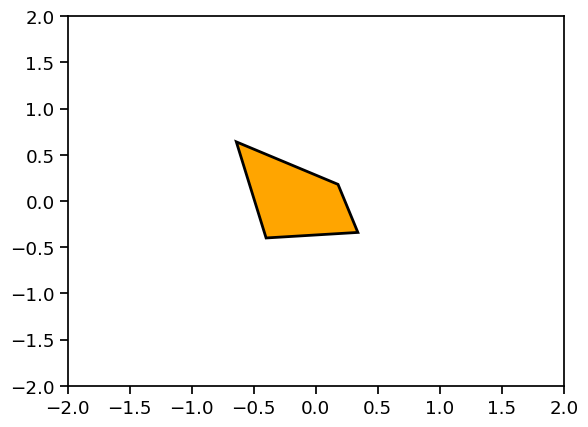

In [58]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches

GPCR = [
   (0.34, -0.34),  # left, bottom
   (0.18, 0.18),  # left, top
   (-0.64, 0.64),  # right, top
   (-0.4, -0.4),  # right, bottom
   (0.34, -0.34),  # ignored
]

codes = [
    Path.MOVETO,
    Path.LINETO,
    Path.LINETO,
    Path.LINETO,
    Path.CLOSEPOLY,
]

path = Path(GPCR, codes)

fig, ax = plt.subplots()
patch = patches.PathPatch(path, facecolor='orange', lw=2)
ax.add_patch(patch)
ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)
plt.show()

In [51]:
import plotly.graph_objects as go

categories = ['Transporter','Cell Junction','Ion channel',
              'Enzyme', 'GPCR']

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=[1, 5, 2, 2, 3],
      theta=categories,
      fill='toself',
      name='Product A'
))
fig.add_trace(go.Scatterpolar(
      r=[4, 3, 2.5, 1, 2],
      theta=categories,
      fill='toself',
      name='Product B'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[0, 5]
    )),
  showlegend=True
)

fig.show()

In [52]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=[1, 5, 2, 2, 3],
    theta=['processing cost','mechanical properties','chemical stability',
           'thermal stability', 'device integration']))
fig = px.line_polar(df, r='r', theta='theta', line_close=True)
fig.show()

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [54]:
import plotly.graph_objects as go

fig = go.Figure(go.Barpolar(
    r=[3.5, 1.5, 2.5, 4.5, 4.5, 4, 3],
    theta=[65, 15, 210, 110, 312.5, 180, 270],
    width=[20,15,10,20,15,30,15,],
    marker_color=["#E4FF87", '#709BFF', '#709BFF', '#FFAA70', '#FFAA70', '#FFDF70', '#B6FFB4'],
    marker_line_color="black",
    marker_line_width=2,
    opacity=0.8
))

fig.update_layout(
    template=None,
    polar = dict(
        radialaxis = dict(range=[0, 5], showticklabels=False, ticks=''),
        angularaxis = dict(showticklabels=False, ticks='')
    )
)

fig.show()

In [53]:
import plotly.express as px
df = px.data.wind()
fig = px.line_polar(df, r="frequency", theta="direction", color="strength", line_close=True,
                    color_discrete_sequence=px.colors.sequential.Plasma_r,
                    template="plotly_dark",)
fig.show()

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/plotly/express/_core.py:271: FutureWarn

#### make category plots

In [ ]:
tmpi = all_all_tmp.copy()

tmpi = tmpi.loc[tmpi['accession'].isin(protein_categories['GPCR'])]
tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
logger.info(tmpi['position_backup'].unique())
tmpi['c'] = 1
df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=["position"], values='c', aggfunc=len, margins=True)
df2 = df2.fillna(0)
df2.columns
df2['All']#['All']
tmpi[['variant', 'label', 'position']]
logger.info(tmpi['position'].unique())
tmpi.loc[~tmpi['position'].isin(['solvent-accessible', 'buried', #'others', 
#                                  'TM-region|lipid-facing|buried',
                                 'TM-region|solvent-accessible',
                                 'TM-region|buried'
                                ])][['variant', 'label', 'position', 'quadrant']]#['variant'].tolist()
for elem in ['solvent-accessible', 
                    'buried', 
#                     'TM-region|lipid-facing|buried', 
                    'TM-region|buried', 
                    'TM-region|solvent-accessible', 
#                     'TM-region|lipid-facing|solvent-accessible', 
#                     'lipid-facing|buried', 
            ]:
    print(elem)
    print(len(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist()))
    print(tmpi.loc[tmpi['position'].isin([elem])]['variant'].tolist())


[32.0, 17.0, 16.0, 13.0]


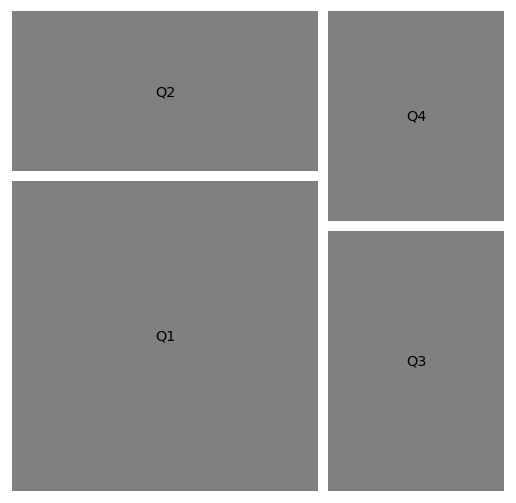

([32.0, 17.0, 16.0, 13.0], ['Q1', 'Q2', 'Q3', 'Q4'])

In [143]:
quadrant = 'Q3'
#['#D55C00', '#56B4E9', ]

label = ['Q1', 'Q2', 'Q3', 'Q4']
labels = []
sizes = []
for lab in label:
    if df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'] > 0:
        sizes.append(df2[(lab, 'group A')]['All']+df2[(lab, 'group B')]['All'])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-base_all.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

[1.0, 5.0, 1.0, 6.0]


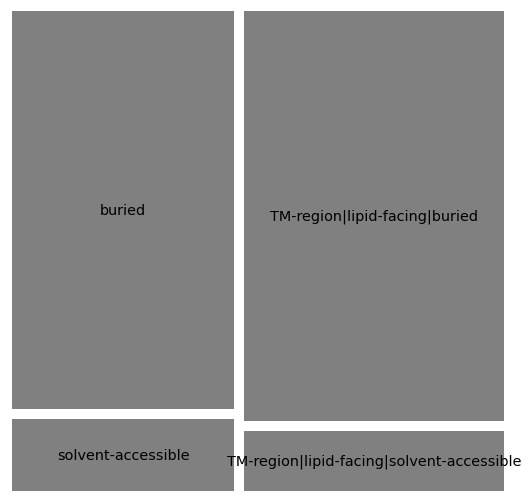

([1.0, 5.0, 1.0, 6.0],
 ['solvent-accessible',
  'buried',
  'TM-region|lipid-facing|solvent-accessible',
  'TM-region|lipid-facing|buried'])

In [147]:
quadrant = 'Q4'
#['#D55C00', '#56B4E9', ]

label = ['solvent-accessible', 'buried', 'TM-region|lipid-facing|solvent-accessible',
 'TM-region|lipid-facing|buried', 'TM-region|buried', 'others']
labels = []
sizes = []
for lab in label:
    if df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab] > 0:
        sizes.append(df2[(quadrant, 'group A')][lab]+df2[(quadrant, 'group B')][lab])
        labels.append(lab)

print(sizes)
fig, ax = plt.subplots(figsize=(9,9))
squarify.plot(sizes, label=labels, pad=True, color='grey')
plt.axis('off')
filename = os.path.join(plots_dir, f'FigS11-base_{quadrant}.svg')
plt.savefig(filename, )#transparent=True)
plt.show()

sizes,labels

INFO:GPCR
INFO:all
INFO:groupA: 48
groupB: 23
INFO:[1. 0.]
INFO:['groupA' 'groupB']


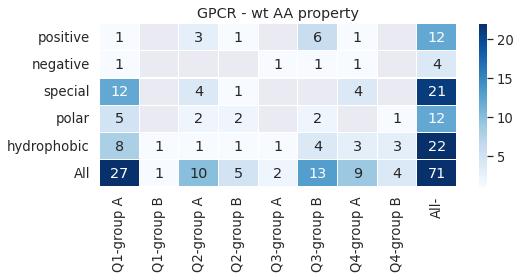

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


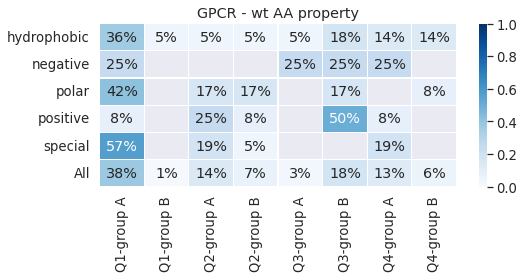

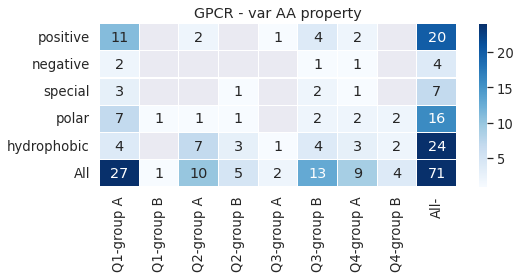

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


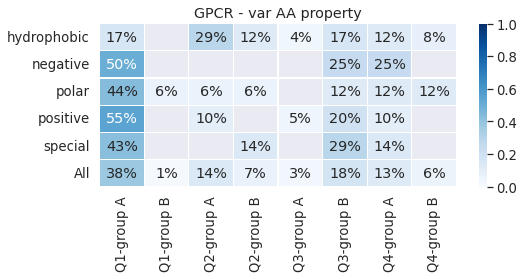

INFO:TRANSMEM
INFO:groupA: 29
groupB: 11
INFO:[1. 0.]
INFO:['groupA' 'groupB']


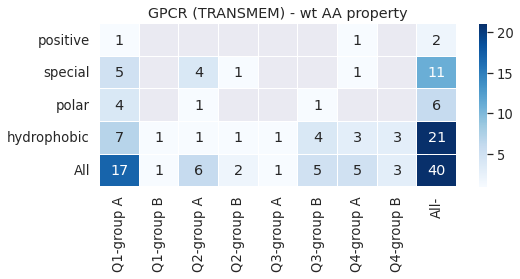

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


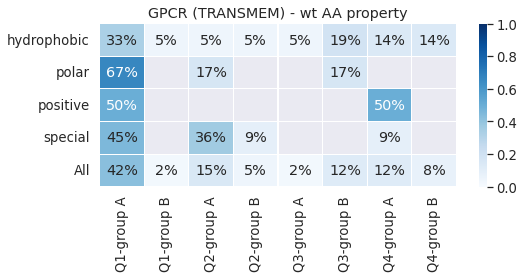

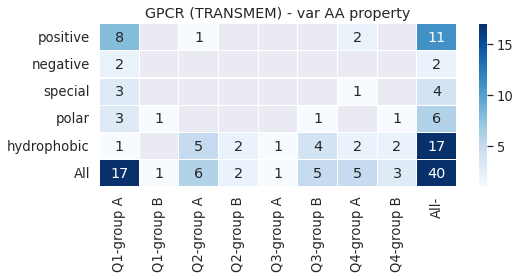

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


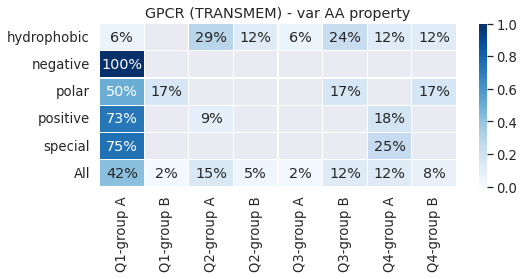

INFO:Transporter
INFO:all
INFO:groupA: 93
groupB: 39
INFO:[1. 0.]
INFO:['groupA' 'groupB']


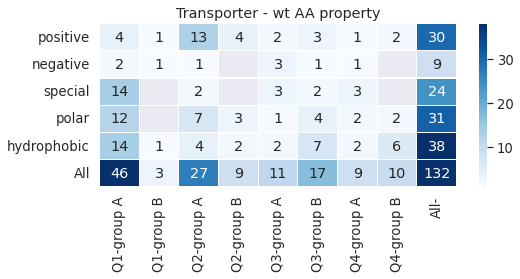

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


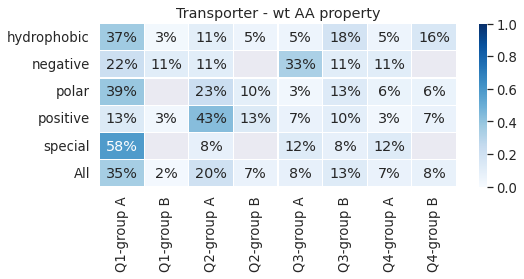

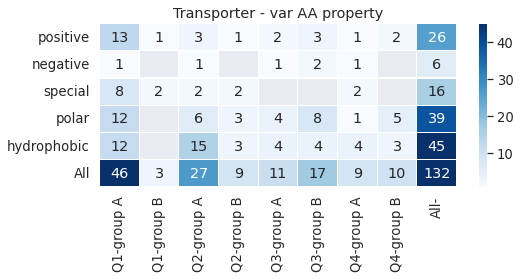

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


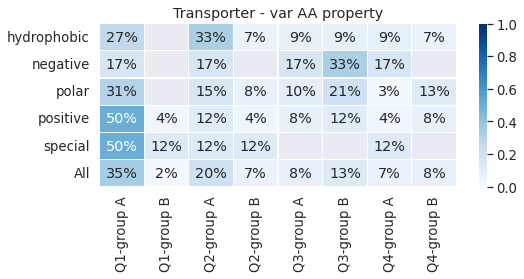

INFO:TRANSMEM
INFO:groupA: 43
groupB: 9
INFO:[1. 0.]
INFO:['groupA' 'groupB']


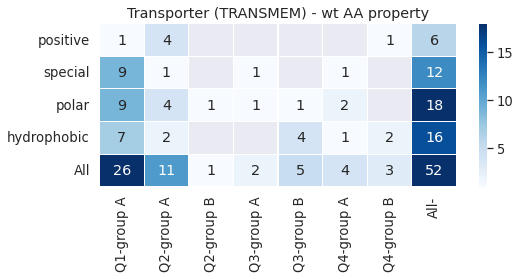

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


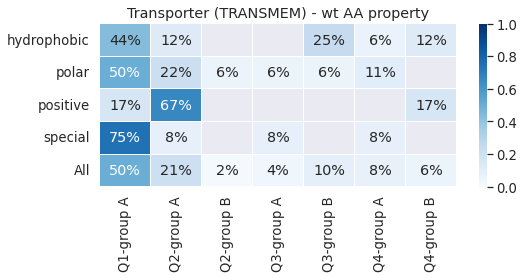

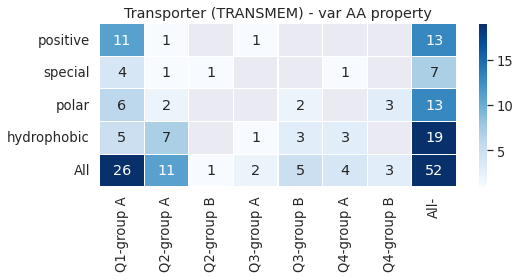

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/generic.py:3887: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


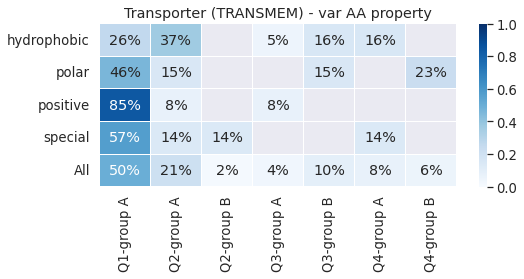

In [133]:
target_dic_here = subfiltered_df_dicts
for category in ['GPCR', 'Transporter']:
    logger.info(category)
    title_raw = category
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    
        pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
        tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
        tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
        tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
        tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'].unique()
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )
        tmp_energy['position_backup'] = tmp_energy['position']
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)

        tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

        tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
        tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        
        if region != 'all':
            title_raw = title_raw + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        groupA = len(tmp_energy[tmp_energy['score']==1].reset_index(drop=True)['score'])
        groupB = len(tmp_energy[tmp_energy['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

        def label_gorup_class(x):
            if x==1:
                return 'groupA' 
            else:
                return 'groupB'
        logger.info(tmp_energy['score'].unique())
        tmp_energy['label'] = tmp_energy['score'].apply(lambda x: label_gorup_class(x))
        tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
        tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])
        tmp_energy['wt AA property'] = tmp_energy['wt'].apply(lambda x: make_property(x))
        tmp_energy['var AA property'] = tmp_energy['var'].apply(lambda x: make_property(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(tmp_energy['label'].unique())

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        x_range = 1
        y_range = 0.1
        tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

        tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
        tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
        tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

        def make_groups(x):
            if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
                return 'Q1'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
                return 'Q2'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
                return 'Q3'
            elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
                return 'Q4'
        tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))

        tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5

        tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
        for hue in ['wt AA property', 'var AA property']:
            title = f'{title_raw} - {hue}'
            tmpi = tmp_energy.copy()
            sorter = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
            tmpi[hue] = tmpi[hue].astype("category")
            tmpi[hue].cat.set_categories(sorter, inplace=True)
            tmpi.sort_values([hue])
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            tmpi['c'] = 1
            df2 = pd.pivot_table(tmpi, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True)

            with sns.axes_style("darkgrid"):
                f = plt.figure(figsize=(8,3))
                sns.set(font_scale = 1.2)
                sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, annot=True, 
                            fmt=".0f", vmin=1, vmax=df2.reset_index(drop=True).iloc[:-1].max().sort_values().iloc[-1])
                plt.xlabel('')
                plt.ylabel("", size=15)
                plt.title(title)
                plt.show()

            tmpi = tmp_energy.copy()
            tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)

            tmpi2 = tmpi.copy()
            tmpi2['c'] = 1
            df2 = pd.pivot_table(tmpi2, columns=["quadrant", 'label'], index=[hue], values='c', aggfunc=len, margins=True).div(len(tmpi2.index))
            df2 = df2.iloc[:,:].div(df2.iloc[:,-1], axis=0)
            df2.drop(columns=['All'], inplace=True)

            with sns.axes_style("darkgrid"):
                f = plt.figure(figsize=(8,3))
                sns.set(font_scale = 1.2)
                sns.heatmap(df2, cmap='Blues', mask=df2.isnull(), linewidths=0.1, vmin=0, vmax=1, 
                            annot=True, fmt=".0%", )
                plt.xlabel('')
                plt.ylabel("", size=15)
                plt.title(title)
                plt.show()


### ddG - ddE for buried, positive, ...

In [ ]:
target_dic_here = subfiltered_df_dicts
for category in ['GPCR', 'Transporter']:
    logger.info(category)
    title_raw = category
    all_tmp = []
    for target_uniprot in sorted(target_dic_here):
        tmp_energy = target_dic_here[target_uniprot].copy()
        tmp_energy['accession'] = target_uniprot
        if gemme_name == 'gemme;score;ori':
            tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)
    
        pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
        tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
        tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
        tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
        lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
        tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
        tmp_energy['LAR'].unique()
        tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

        def tmpiii_ds(x):
            if type(x)!=float:
                return '|'.join(list(filter(None, x.split('|')))) 
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )
        tmp_energy['position_backup'] = tmp_energy['position']
        tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)
        tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

        tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
        tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
        if target_uniprot in protein_categories[category]:
            all_tmp.append(tmp_energy)

    all_tmp = pd.concat(all_tmp)
    for region in ['all', 'TRANSMEM']:
        logger.info(region)
        tmp_energy = all_tmp.copy()
        
        if region != 'all':
            title_raw = title_raw + f' ({region})'
            tmp_energy = tmp_energy[(tmp_energy['uniprot;regions_all']==region)].reset_index(drop=True)

        df2 = tmp_energy.copy()
        groupA = len(df2[df2['score']==1].reset_index(drop=True)['score'])
        groupB = len(df2[df2['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

        def label_gorup_class(x):
            if x==1:
                return 'groupA' 
            else:
                return 'groupB'
        logger.info(df2['score'].unique())
        df2['label'] = df2['score'].apply(lambda x: label_gorup_class(x))
        df2['var'] = df2['variant'].apply(lambda x: x[-1])
        df2['wt'] = df2['variant'].apply(lambda x: x[0])
        df2['wt AA property'] = df2['wt'].apply(lambda x: make_property(x))
        df2['var AA property'] = df2['var'].apply(lambda x: make_property(x))

        df2.loc[df2['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
        df2.loc[df2['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
        logger.info(df2['label'].unique())

        df2['gnomad;AF_tot_first'] = df2["gnomad;AF_tot_all"].apply(lambda x: float(x))
        for group in ['all', 'groupA', 'groupB']:
            for hue in ['wt AA property', 'var AA property']:
                title = hue#title_raw
                with sns.axes_style("white"):
                    f = plt.figure(figsize=(8,8))
                    tmpi = df2.copy()
                    if group == 'all':
                        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
                    else:
                        title = f'{title} - {group}'
                        tmpi = tmpi.loc[(tmpi['label']==group)].reset_index(drop=True)
                    g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue=hue, marginal_kws=dict(fill=False), 
                                      hue_order = ['positive', 'negative', 'special', 'polar', 'hydrophobic']
                                     )
                    g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
                    g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
                    g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
                    g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
                    g.ax_joint.set_xlim(-5.5,15.5)
                    g.ax_joint.set_ylim(-0.05,1.05)

                    g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )#fontweight='bold')
                    g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
                    g.fig.suptitle(f'{title}')
                    g.fig.subplots_adjust(top=0.95)
                    g.ax_joint.legend([], bbox_to_anchor=(1.21, 1),borderaxespad=0)#.set_title(hue)
                    plt.show()


## investigate a single protein a bit more

In [116]:
protein_of_interest = 'P08100' #P11166 P08100
for target in target_list:
    if target[0] == protein_of_interest:
        break

### plot median ddG for AA type

INFO:348
INFO:all


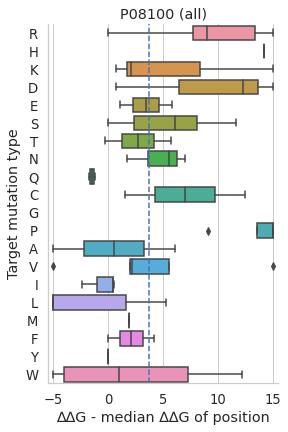

INFO:348
INFO:all


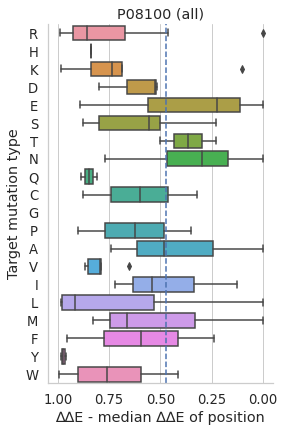

INFO:348
INFO:groupA


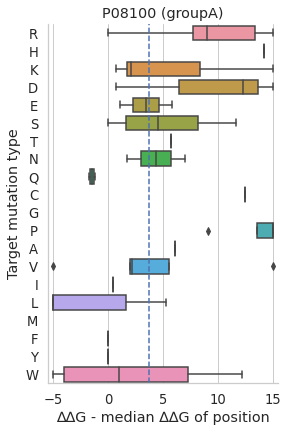

INFO:348
INFO:groupA


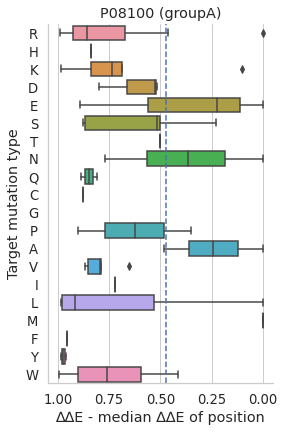

INFO:348
INFO:groupB


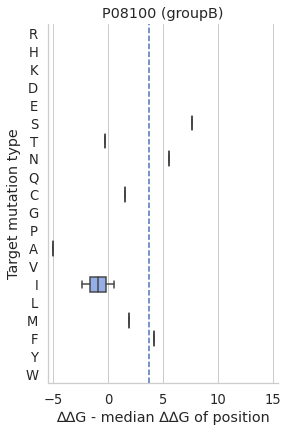

INFO:348
INFO:groupB


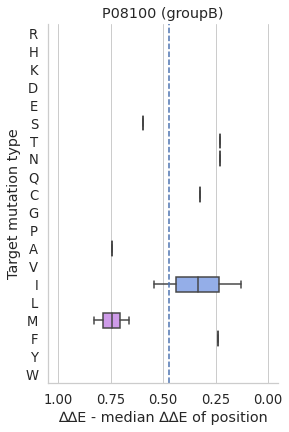

In [150]:
target_dic_here = renamed_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    tmp_energy = target_dic_here[target_uniprot].copy()
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    
    for region in ['all'] :
        for group in [ 'all', 'groupA', 'groupB']:
            for x_lab in ["rosetta;ddG", "gemme;score"]:
                tmpiiii2 = tmp_energy.copy()
                if region !='all':
                    tmpiiii2 = tmpiiii2[tmpiiii2['uniprot;regions_all']==region].reset_index(drop=True)
                tmpiiii2['resi'] = tmpiiii2['res']
                all_resis = tmpiiii2['resi'].unique()

                logger.info(len(tmpiiii2['resi'].unique()))
                all_length = len(tmpiiii2['resi'].unique())

                tmpiiii2.loc[(tmpiiii2[x_lab]>15), x_lab] = 15
                tmpiiii2.loc[(tmpiiii2[x_lab]<-5), x_lab] = -5

                tmpiiii2['label_class'] = tmpiiii2[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
                tmpiiii2['label_class'] = tmpiiii2['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

                tmpiiii2['score'] = tmpiiii2['label_class'].apply(lambda x: classify_control(x))
                tmpiiii2 = tmpiiii2.dropna(subset=['score']).reset_index(drop=True)

                if group=='groupA':
                    tmpiiii2 = tmpiiii2.loc[tmpiiii2['score']==1].reset_index(drop=True)
                elif group=='groupB':
                    tmpiiii2 = tmpiiii2.loc[tmpiiii2['score']==0].reset_index(drop=True)

                if x_lab == 'rosetta;ddG':
                    x_label = '∆∆G'
                else:
                    x_label = '∆∆E'
                if x_lab == 'rosetta;ddG':
                    x_label = '∆∆G'
                    cutoff=all_vals_cat[key][8]
                elif x_lab == 'gemme;score':
                    x_label = '∆∆E'
                    cutoff=all_vals_cat[key][9]
                else:
                    x_label = 'REU'
                logger.info(group)
                median_position_plot(tmpiiii2, x_lab, x_label, target_uniprot, group, target_plot_dir, satu='', fig_name='', cutoff = cutoff)

    
    

### ddG - ddE for buried, positive, ...

INFO:['TM-region|lipid-facing|solvent-accessible' nan
 'TM-region|lipid-facing|buried' '||buried' '||solvent-accessible'
 'TM-region||buried' '|lipid-facing|buried'
 '|lipid-facing|solvent-accessible']
INFO:groupA: 63
groupB: 10
INFO:[1. 0.]
INFO:['polar' 'special' 'hydrophobic' 'positive' 'negative'] & ['hydrophobic' 'positive' 'polar' 'special' 'negative']
INFO:['groupA' 'groupB']


<Figure size 576x576 with 0 Axes>

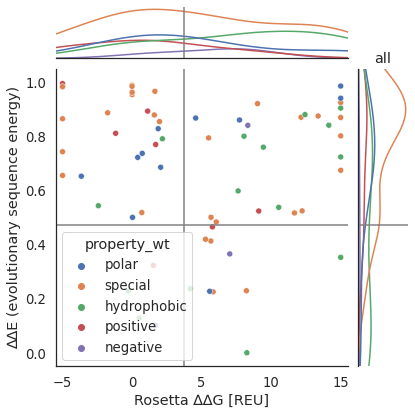

<Figure size 576x576 with 0 Axes>

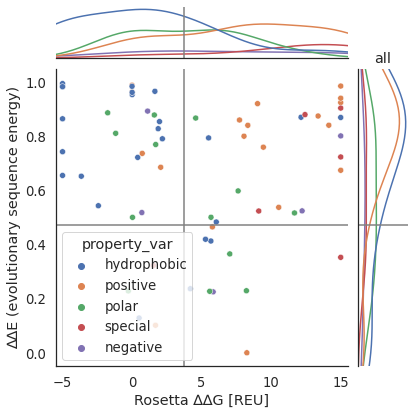

<Figure size 576x576 with 0 Axes>

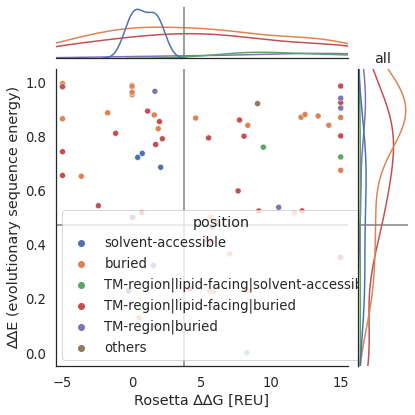

<Figure size 576x576 with 0 Axes>

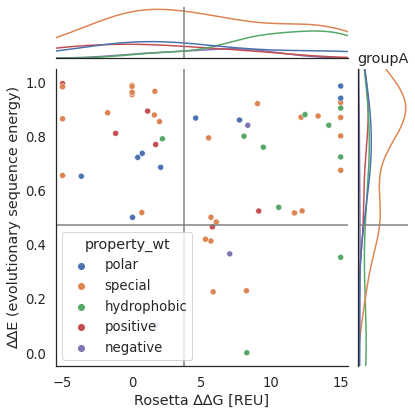

<Figure size 576x576 with 0 Axes>

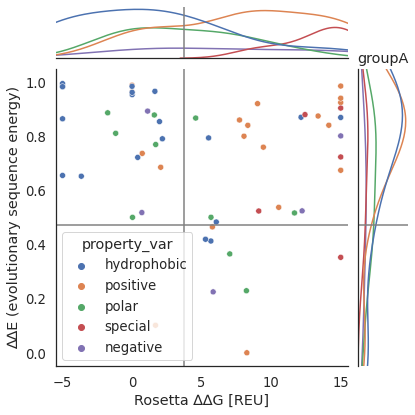

<Figure size 576x576 with 0 Axes>

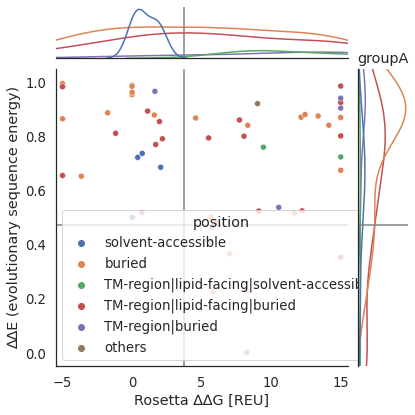

<Figure size 576x576 with 0 Axes>

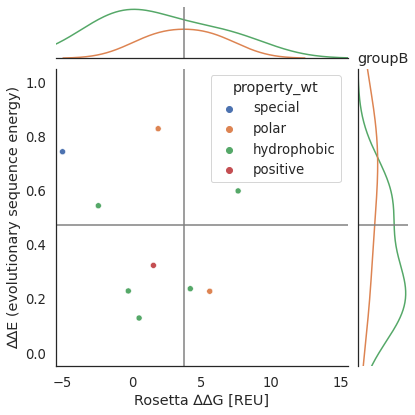

<Figure size 576x576 with 0 Axes>

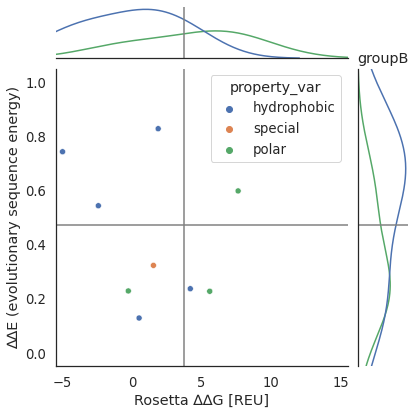

<Figure size 576x576 with 0 Axes>

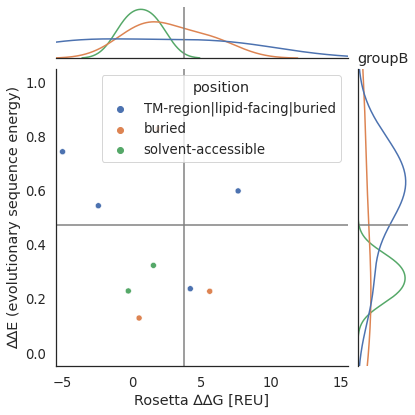

In [151]:
target_dic_here = renamed_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    tmp_energy = target_dic_here[target_uniprot].copy()
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    
    pdbASA_clumn = [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')][0]
    tmp_energy['SAR'] = tmp_energy[pdbASA_clumn].apply(lambda x: sasa(x))
    tmspan_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')][0]
    tmp_energy['TMspan'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
    lar_clumn = [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')][0]
    tmp_energy['LAR'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
    tmp_energy['LAR'].unique()
    tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']

    logger.info(tmp_energy['position'].unique())
    def tmpiii_ds(x):
        if type(x)!=float:
            return '|'.join(list(filter(None, x.split('|')))) 
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

    tmp_energy['position_backup'] = tmp_energy['position']
    tmp_energy['position'] = tmp_energy['position'].apply(lambda x: 'others' if x in ['lipid-facing|buried', 'lipid-facing|solvent-accessible', 'TM-region|solvent-accessible'] else x)
    
    tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

    tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
    tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)
    
    df2 = tmp_energy.copy()

    groupA = len(df2[df2['score']==1].reset_index(drop=True)['score'])
    groupB = len(df2[df2['score']==0].reset_index(drop=True)['score'])
    logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

    def label_gorup_class(x):
        if x==1:
            return 'groupA' 
        else:
            return 'groupB'
    logger.info(df2['score'].unique())
    df2['label'] = df2['score'].apply(lambda x: label_gorup_class(x))
    
    
    df2['var'] = df2['variant'].apply(lambda x: x[-1])
    df2['wt'] = df2['variant'].apply(lambda x: x[0])

    df2['property_wt'] = df2['wt'].apply(lambda x: make_property(x))
    df2['property_var'] = df2['var'].apply(lambda x: make_property(x))
    logger.info(f"{df2['property_wt'].unique()} & {df2['property_var'].unique()}")
    
    df2.loc[df2['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    df2.loc[df2['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(df2['label'].unique())

    df2['gnomad;AF_tot_first'] = df2["gnomad;AF_tot_all"].apply(lambda x: float(x))
    for group in ['all', 'groupA', 'groupB']:
        for hue in ['property_wt', 'property_var']:
            with sns.axes_style("white"):
                f = plt.figure(figsize=(8,8))
                tmpi = df2.copy()
                if group == 'all':
                    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
                else:
                    tmpi = tmpi.loc[(tmpi['label']==group)].reset_index(drop=True)
                g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue=hue, marginal_kws=dict(fill=False), 
                                 )
                g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
                g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
                g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
                g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
                g.ax_joint.set_xlim(-5.5,15.5)
                g.ax_joint.set_ylim(-0.05,1.05)

                g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
                g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
                plt.title(group)

                plt.show()
        with sns.axes_style("white"):
            f = plt.figure(figsize=(8,8))
            tmpi = df2.copy()
            if group == 'all':
                tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
            else:
                tmpi = tmpi.loc[(tmpi['label']==group)].reset_index(drop=True)
            g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='position', marginal_kws=dict(fill=False), 
                              #hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ]
                             )
            g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
            g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
            g.ax_joint.set_xlim(-5.5,15.5)
            g.ax_joint.set_ylim(-0.05,1.05)

            g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )
            g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
            plt.title(group)
            plt.show()
    
    

### visualize benign/ patho / group B

In [117]:
target_dic_here = renamed_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot == protein_of_interest:
        break
tmp_energy = target_dic_here[target_uniprot].copy()
target_plot_dir = os.path.join(plots_dir, target_uniprot)

tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)

df2 = tmp_energy
groupA = len(df2[df2['score']==1].reset_index(drop=True)['score'])
groupB = len(df2[df2['score']==0].reset_index(drop=True)['score'])
logger.info(f"groupA: {groupA}\ngroupB: {groupB}")

def label_gorup_class(x):
    if x==1:
        return 'groupA' 
    else:
        return 'groupB'
logger.info(df2['score'].unique())
df2['label'] = df2['score'].apply(lambda x: label_gorup_class(x))

df2.loc[df2['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
df2.loc[df2['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
logger.info(df2['label'].unique())
cutoff_value=gnomAD_cutoff_value
ddg_column='rosetta;ddG'

tmp_energy = df2
tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
tmp_energy = tmp_energy.dropna(subset=[ddg_column], how='any').reset_index(drop=True)

tmp_energy['label_class'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
tmp_energy['label_class'] = tmp_energy['label_class'].apply(lambda x: gnomad_class(x, split_val=cutoff_value))

tmp_energy['score'] = tmp_energy['label_class'].apply(lambda x: classify_control(x))
tmp_energy = tmp_energy.loc[tmp_energy['score'].isin([0,1])].reset_index(drop=True)

groupAraw = tmp_energy.loc[(tmp_energy['score']==1), 'res'].unique()
groupA = " ".join([str(ins1) for ins1 in groupAraw])
groupBraw = tmp_energy.loc[(tmp_energy['score']==0), 'res'].unique()
groupB = " ".join([str(ins1) for ins1 in groupBraw])
benignraw = tmp_energy.loc[(tmp_energy['clinvar;significance_all']=='benign'), 'res'].unique()
benign = " ".join([str(ins1) for ins1 in benignraw])

colors_groups = ['#D55C00', '#56B4E9', 'green']

write_new = True

targe_uniprot = target[0]
logger.info(target[3][0])
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)

view = nv.show_file(pdb_file_name, gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_licorice(selection=f":A and ({groupB})", color=colors_groups[1], radiusScale=2.5)
view.add_licorice(selection=f":A and ({groupA})", color=colors_groups[0], radiusScale=2.5)
view.add_licorice(selection=f":A and ({benign})", color=colors_groups[2], radiusScale=2.5)

view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
view

INFO:groupA: 65
groupB: 10
INFO:[1. 0.]
INFO:['groupA' 'groupB']
INFO:4zwj-A
INFO:4zwj


NGLWidget()

### ligand binding pocket

INFO:P08100
INFO:['other' 'group A' 'group B']
INFO:0      0.000004
1           NaN
2      0.000007
3      0.000008
4      0.000061
         ...   
250    0.000109
251    0.000013
252    0.000005
253    0.000004
254    0.000010
Name: gnomad;AF_tot_first, Length: 255, dtype: float64
INFO:{'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 'group B': ['G51A', 'T70M']}, 'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'M216R', 'S297R'], 'group B': ['A299S']}, 'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N', 'H211R'], 'group B': ['I307F', 'T320N']}, 'Q4': {'group A': ['E150K'], 'group B': ['R147C']}}


<Figure size 576x576 with 0 Axes>

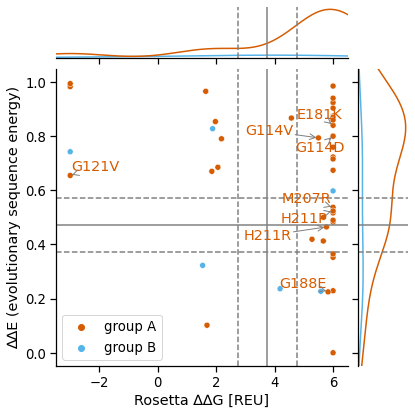

In [152]:
x_range = 1
y_range = 0.1
rosetta_grey = False
gemme_grey = False
all_tmp = []
target_dic_here = subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    logger.info(target_uniprot)
    tmp_energy = target_dic_here[target_uniprot].copy()
    target_plot_dir = os.path.join(plots_dir, target_uniprot)
    all_tmp.append(tmp_energy)
    
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
    
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 6, 'rosetta;ddG'] = 6
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -3, 'rosetta;ddG'] = -3
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    logger.info(tmp_energy['gnomad;AF_tot_first'])
    

    f = plt.figure(figsize=(8,8))
    tmpi = tmp_energy.copy()
    tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
    g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label', marginal_kws=dict(fill=False), 
                      hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ])

    key = 'all'#target_uniprot

    g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
    g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
    g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
    g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
    g.ax_joint.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
    g.ax_joint.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
    g.ax_marg_x.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
    g.ax_marg_y.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
    g.ax_joint.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
    g.ax_joint.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
    g.ax_marg_x.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
    g.ax_marg_y.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
    g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
    g.ax_joint.set_ylim(-0.05,1.05)
    g.ax_joint.set_xlim(-3.5,6.5)
    
    g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )#fontweight='bold')
    g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
    g.ax_joint.legend().set_title('')
    
    texts = []

    for line in range(0,tmpi.shape[0]):
        labeler=True
        if rosetta_grey==True and gemme_grey==True:
            if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)) and ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                labeler=True
            else:
                labeler=False
        else:
            if rosetta_grey==True:
                if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)):
                    labeler=True
                else:
                    labeler=False
            if gemme_grey==True:
                if ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                    labeler=True
                else:
                    labeler=False
        if labeler==True:
            #for NPC1: POV
            ligands = [["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"],
                      ['F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 'Q283', 'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 'E380', 'P383', 'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 'A405', 'A407', 'G408', 'F409', 'N411', 'W412', 'N415', ],
                       ['L853', 'N854', 'K855', 'V856', 'D857', 'I858', 'I1095', 'T1098', 'I1099', 'L1102', 'G1103', 'L1135', 'V1136', 'F1139', 'L1149']
                      ]
            #for GLUT1: chloride binding side
            #for NPC1: PPI
      #      ligands = [["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"],
      #                ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213', ],
      #                 ['G178', 'Y420', 'Q421', 'Y423', 'S425', 'G426', 'D501', 'D502', 'F503', 'F504', 'Y506']
      #                ]
            #for NPC1: cholesterol
      #      ligands = [["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"],
      #                ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213', ],
      #                 ['W27', 'N41', 'Q79', 'T82', 'L83', 'N86', 'L87', 'L89', 'P90', 'F108', 'L111', 'T112', 'L176', 'C177', 'W189', 'Y192', 'M193', 'F194', 'N198', 'Q200', 'A201', 'P202', 'F203', 'I205', 'P377', 'V378', 'L380', 'W381', 'I609', 'L613', 'S617', 'D618', 'D620', 'V621', 'V624', 'Y628', 'T683', 'L684', 'I685', 'V686', 'I687', 'E688','V689',  'P691','M754', 'A756', 'V757', 'F760', 'L860', 'Q862', 'S865', 'M866', 'F1087', 'Y1088', 'V1152', 'V1155', 'I1220', 'F1221', 'Y1225',]
      #                ]
            for index in range(3):
                if tmpi['variant'][line][:-1] in ligands[index]:
                    if tmpi['label'][line] == 'group A':
                        texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#D55C00'))
                    elif tmpi['label'][line] == 'group B':
                        texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color='#56B4E9'))

    adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)
    quartiles = {'Q1' : {'group A':[], 'group B':[]},
                 'Q2' : {'group A':[], 'group B':[]},
                 'Q3' : {'group A':[], 'group B':[]},
                 'Q4' : {'group A':[], 'group B':[]},
                }
    for line in range(0,tmpi.shape[0]):
        #Q1:
        if (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q1']['group A'] = quartiles['Q1']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q1']['group B'] = quartiles['Q1']['group B']+[tmpi['variant'][line]]
        elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q2']['group A'] = quartiles['Q2']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q2']['group B'] = quartiles['Q2']['group B']+[tmpi['variant'][line]]
        elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q3']['group A'] = quartiles['Q3']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q3']['group B'] = quartiles['Q3']['group B']+[tmpi['variant'][line]]
        elif (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
            if tmpi['label'][line] == 'group A':
                quartiles['Q4']['group A'] = quartiles['Q4']['group A']+[tmpi['variant'][line]]
            elif tmpi['label'][line] == 'group B':
                quartiles['Q4']['group B'] = quartiles['Q4']['group B']+[tmpi['variant'][line]]

    logger.info(quartiles)
    plt.show()
    

INFO:121
INFO:NPC1
INFO:5u74


NGLWidget()

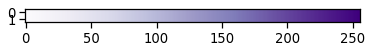

In [153]:
target_protein = 0
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ["E113", "G114", "A117", "T118", "G121", "E122", "L125", "E181", "S186", "C187", "G188", "I189", "Y191", "M207", "F208", "H211", "F212", "F261", "W265", "Y268", "A269", "A292", "F293", "A295", "K296"]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['G121V']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['G114D', 'G114V', 'E181K', 'M207R', 'H211R']
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

Q3_ligand_binding_pocket = ['G188E']
Q3_ligand_binding_pocket = [res[1:-1] for res in Q3_ligand_binding_pocket]
Q3_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q3_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]


groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']


groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]
write_new = False
targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('1U19', gui=True)
view.clear_representations()
#view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and not (1-104 165-179)", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and RET", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and RET", colorValue='#4d004b', opacity=0.25, wireframe=True)

view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
view.add_licorice(selection=f":A and ({Q3_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q3_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:287 283 134 165
INFO:OPSD
INFO:4zwj


NGLWidget()

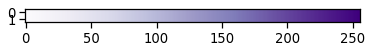

In [154]:
target_protein = 1
quartile = 5
group = 'A'


Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 'Q283', 'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 'E380', 'P383', 'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 'A405', 'A407', 'G408', 'F409', 'N411', 'W412', 'N415', ]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['G134S', 'V165I', 'Q283R', 'I287L']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['Q161R']
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

Q4_ligand_binding_pocket = ['P383L']
Q4_ligand_binding_pocket = [res[1:-1] for res in Q4_ligand_binding_pocket]
Q4_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q4_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    
#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('6tha', gui=True)
view.clear_representations()
#view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and not (9-104 196-272 309-350 390-455 295-373)", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and  (9-104 196-272 309-350 390-455 295-373)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and P33", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and P33", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')


#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:92 93
INFO:OPSD
INFO:4zwj


NGLWidget()

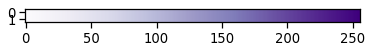

In [155]:
target_protein = 1
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213', ]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['R92W', 'R93W', ]
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])


logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]


groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']


groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    
#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('6tha', gui=True)
view.clear_representations()
#view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'


view.add_licorice(selection=f":A and CL", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and CL", colorValue='#4d004b', opacity=0.25, wireframe=True)

view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')


#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:858
INFO:GTR1
INFO:6tha


NGLWidget()

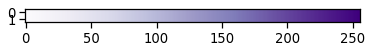

In [156]:
target_protein = 2
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['L853', 'N854', 'K855', 'V856', 'D857', 'I858V', 'I1095', 'T1098', 'I1099', 'L1102', 'G1103', 'L1135', 'V1136', 'F1139', 'L1149' ]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['I858V', ]
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])


logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]


groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']


groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False


targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    
#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('6w5s', gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'


view.add_licorice(selection=f":A and POV", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and POV", colorValue='#4d004b', opacity=0.25, wireframe=True)

    #fe9929
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#56B4E9', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:502 425
INFO:GTR1
INFO:6tha


NGLWidget()

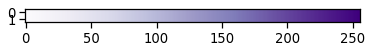

In [157]:
target_protein = 2
quartile = 5
group = 'A'


Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['L853', 'N854', 'K855', 'V856', 'D857', 'I858V', 'I1095', 'T1098', 'I1099', 'L1102', 'G1103', 'L1135', 'V1136', 'F1139', 'L1149' ]
ligand_binding_pocket = ['G178', 'Y420', 'Q421', 'Y423', 'S425', 'G426', 'D501', 'D502', 'F503', 'F504', 'Y506']
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['I858V', ]
Q1_ligand_binding_pocket = ['S425L', 'D502E']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)
    

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
view = nv.show_pdbid('5jnx', gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
view.add_cartoon(selection=f"protein and not :A", color='lightgrey', opacity=0.8, side='front')

#view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'


#view.add_licorice(selection=f":A and POV", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
#view.add_surface(selection=f":A and POV", colorValue='#4d004b', opacity=0.25, wireframe=True)
#view.add_licorice(selection=f":A and POV", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
#view.add_surface(selection=f":A and POV", colorValue='#4d004b', opacity=0.25, wireframe=True)

    #fe9929
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#56B4E9', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:684 1087 628
INFO:GTR1
INFO:6tha


NGLWidget()

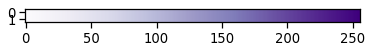

In [158]:
target_protein = 2
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = ['W27', 'N41', 'Q79', 'T82', 'L83', 'N86', 'L87', 'L89', 'P90', 'F108', 'L111', 'T112', 'L176', 'C177', 'W189', 'Y192', 'M193', 'F194', 'N198', 'Q200', 'A201', 'P202', 'F203', 'I205', 'P377', 'V378', 'L380', 'W381', 'I609', 'L613', 'S617', 'D618', 'D620', 'V621', 'V624', 'Y628', 'T683', 'L684', 'I685', 'V686', 'I687', 'E688', 'V689',  'P691','M754', 'A756', 'V757', 'F760', 'L860', 'Q862', 'S865', 'M866', 'F1087', 'Y1088', 'V1152', 'V1155', 'I1220', 'F1221', 'Y1225',]
ligand_binding_pocket = [res[1:] for res in ligand_binding_pocket]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['Y628S', 'L684F', 'F1087L']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
#view = nv.show_pdbid('6w5t', gui=True)
view = nv.show_pdbid('6uox', gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (8-22 85-99 138-148 203-218)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and not (8-22 85-99 138-148 203-218)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f"CLR", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f"CLR", colorValue='#4d004b', opacity=0.25, wireframe=True)

view.add_licorice(selection=f"QDG", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f"QDG", colorValue='#4d004b', opacity=0.25, wireframe=True)

    #fe9929
view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q4_ligand_binding_pocket_res})", colorValue='#ec7014', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q4_ligand_binding_pocket_res})", radiusScale=2.5, color='#ec7014', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


### important motifs

INFO:['other' 'group A' 'group B']
INFO:0      0.000010
1      0.000012
2      0.000004
3      0.000007
4           NaN
         ...   
249         NaN
250         NaN
251         NaN
252         NaN
253         NaN
Name: gnomad;AF_tot_first, Length: 254, dtype: float64
INFO:{'Q1': {'group A': ['N34D', 'N34S', 'P36L', 'R92W', 'R93W', 'R126C', 'Q161R', 'R212C', 'R212H', 'R223W', 'T295M', 'V328L', 'R333Q', 'R333W', 'G419V'], 'group B': ['R269C']}, 'Q2': {'group A': ['N34K', 'R126H', 'G130R', 'G130S', 'G134S', 'R153L', 'R153P', 'G167R', 'G175R', 'P211S', 'D236V', 'M244R', 'A275T', 'Q283R', 'I287L', 'S294F', 'G314S', 'S324L', 'S324P', 'F422L'], 'group B': []}, 'Q3': {'group A': ['V165I', 'E247D', 'T310I', 'S313P', 'P383L'], 'group B': ['I339T']}, 'Q4': {'group A': ['G17R', 'S313F'], 'group B': ['Q46H', 'F104L', 'K255T', 'E299K', 'A342T']}}


<Figure size 576x576 with 0 Axes>

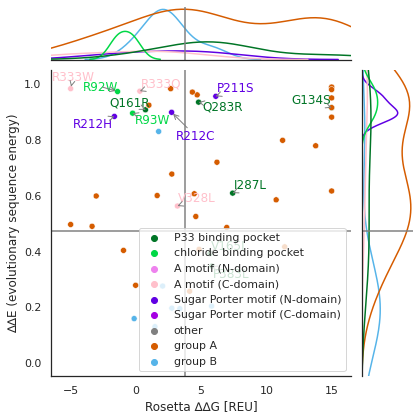

In [164]:
cutoff_value = gnomAD_cutoff_value
x_range = 1#0.5
y_range = 0.1#0.05
rosetta_grey = False
gemme_grey = False
all_tmp = []
target_dic_here = subfiltered_df_dicts#filtered_df_dicts #subfiltered_df_dicts
for target_uniprot in sorted(target_dic_here):
    if target_uniprot != protein_of_interest:
        continue
    tmp_energy = target_dic_here[target_uniprot].copy()
    all_tmp.append(tmp_energy)
    tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))
    tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
    tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
    tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'
    tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
    tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
    logger.info(tmp_energy['label'].unique())

    tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
    logger.info(tmp_energy['gnomad;AF_tot_first'])
    
    with sns.axes_style("whitegrid"):#white, dark, whitegrid, darkgrid, ticks
        sns.set(font_scale = 1.0)
        sns.set(style = 'white')
        f = plt.figure(figsize=(8,8))
        tmpi = tmp_energy.copy()
        
        def put_to_label(x, target_uniprot):
            x = x[:-1]
            if target_uniprot=='P08100':
                if x in ['E113', 'G114', 'A117', 'T118', 'G121', 'E122', 'L125', 'E181', 'S186', 
                         'C187', 'G188', 'I189', 'Y191', 'M207', 'F208', 'H211', 'F212', 'F261', 
                         'W265', 'Y268', 'A269', 'A292', 'F293', 'A295', 'K296']:
                    return 'retinal binding pocket'
                elif x in ['T17']:
                    return 'Gt activation'
                elif x in ['R135']:
                    return 'DRY motif & ionic lock'
                elif x in ['P215', 'M216']:
                    return 'PIF motif'
                else:
                    return 'other'
            if target_uniprot=='P11166':
                if x in ['F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 
                         'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 'Q283', 
                         'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 'E380', 'P383', 
                         'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 'A405', 'A407', 'G408', 
                         'F409', 'N411', 'W412', 'N415' ]:
                    return 'P33 binding pocket'
                elif x in ['G91', 'R92', 'R93', 'Y143', 'E209', 'S210', 'F213']:
                    return 'chloride binding pocket'
                elif x in ['G84', 'L85', 'F86', 'V87', 'N88', 'R89', 'F90', 'G91', 'R92', 'R93' ]:
                    return 'A motif (N-domain)'
                elif x in ['L325', 'F326', 'V327', 'V328', 'E329', 'R330', 'A331', 'G332', 'R333', 'R334']:
                    return 'A motif (C-domain)'
                elif x in ['P208', 'E209', 'S210', 'P211', 'R212']:
                    return 'Sugar Porter motif (N-domain)'
                elif x in ['P453', 'E454', 'T455', 'K456', 'G457']:
                    return 'Sugar Porter motif (C-domain)'
                else:
                    return 'other'
            else:
                return None
        
        tmpi = tmpi.loc[~(tmpi['label']=='other')].reset_index(drop=True)
        
        tmpi['label2'] = tmpi['variant'].apply(lambda x: put_to_label(x, target_uniprot))
        tmpi.loc[tmpi.label2.isin(['other']) & tmpi.label.isin(['group A']), 'label2'] = 'group A'
        tmpi.loc[tmpi.label2.isin(['other']) & tmpi.label.isin(['group B']), 'label2'] = 'group B'

        if target_uniprot=='P08100':
            hue_order = ['retinal binding pocket', 'Gt activation', 'DRY motif & ionic lock', 'PIF motif', 'other', 
                         'group A', 'group B']
            palette = ['#007526', 'violet', 'pink', '#6000e3', 'grey', '#D55C00', '#56B4E9',]
        if target_uniprot=='P11166':
            hue_order = ['P33 binding pocket', 'chloride binding pocket', 'A motif (N-domain)', 'A motif (C-domain)', 
                         'Sugar Porter motif (N-domain)', 'Sugar Porter motif (C-domain)', 'other', 'group A', 'group B']
            palette = ['#007526', '#00d846', 'violet', 'pink', '#6000e3', '#a500e3', 'grey', '#D55C00', '#56B4E9',]
        
        g = sns.jointplot(x="rosetta;ddG", y="gemme;score", data=tmpi, hue='label2', marginal_kws=dict(fill=False), 
#                           hue_order = ['group A', 'group B'], palette = ['#D55C00', '#56B4E9', ]
                         hue_order = hue_order, palette = palette
                         )

        key = 'all'#target_uniprot

        g.ax_joint.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_joint.axhline(y=all_vals_cat[key][9], color='grey')
        g.ax_marg_x.axvline(x=all_vals_cat[key][8], color='grey')
        g.ax_marg_y.axhline(y=all_vals_cat[key][9], color='grey')
        #g.ax_joint.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
        #g.ax_joint.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
        #g.ax_marg_x.axvline(x=all_vals_cat[key][8]+x_range,linestyle='--', color='grey')
        #g.ax_marg_y.axhline(y=all_vals_cat[key][9]+y_range,linestyle='--', color='grey')
        #g.ax_joint.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
        #g.ax_joint.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
        #g.ax_marg_x.axvline(x=all_vals_cat[key][8]-x_range,linestyle='--', color='grey')
        #g.ax_marg_y.axhline(y=all_vals_cat[key][9]-y_range,linestyle='--', color='grey')
       # g.ax_joint.set_xlim(tmpi['rosetta;ddG'].min()-x_range,tmpi['rosetta;ddG'].max()+0.5)
        g.ax_joint.set_ylim(-0.05,1.05)
        g.ax_joint.set_xlim(-6.5,16.5)

        g.ax_joint.set_xlabel('Rosetta ∆∆G [REU]', )#fontweight='bold')
        g.ax_joint.set_ylabel('∆∆E (evolutionary sequence energy)', )
        g.ax_joint.legend().set_title('')

        texts = []

        for line in range(0,tmpi.shape[0]):
            labeler=True
            if rosetta_grey==True and gemme_grey==True:
                if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)) and ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                    labeler=True
                else:
                    labeler=False
            else:
                if rosetta_grey==True:
                    if ((tmpi['rosetta;ddG'][line]>all_vals_cat[key][8]+x_range) or (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]-x_range)):
                        labeler=True
                    else:
                        labeler=False
                if gemme_grey==True:
                    if ((tmpi['gemme;score'][line]>all_vals_cat[key][9]+y_range) or (tmpi['gemme;score'][line]<all_vals_cat[key][9]-y_range)):
                        labeler=True
                    else:
                        labeler=False
            motifs = [['R135', 'T17', 'P215', 'M216'],#'N55', 
                     ['G84', 'L85', 'F86', 'V87', 'N88', 'R89', 'F90', 'G91', 'R92', 'R93', 
                      'L325', 'F326', 'V327', 'V328', 'E329', 'R330', 'A331', 'G332', 'R333', 'R334',
                      'P208', 'E209', 'S210', 'P211', 'R212',
                      'P453', 'E454', 'T455', 'K456', 'G457',
                      #'Q282', 'Q283', 'N288', 'F291', 'N317', 'F379', 'E380', 'W388'
                     ],
                     []]      
            if target_uniprot =='P08100':
                motifs = [#['R135', 'T17', 'P215', 'N55', 'M216']
                    'E113', 'G114', 'A117', 'T118', 'G121', 'E122', 'L125', 
                    'E181', 'S186', 'C187', 'G188', 'I189', 'Y191', 'M207', 
                    'F208', 'H211', 'F212', 'F261', 'W265', 'Y268', 'A269', 'A292', 
                    'F293', 'A295', 'K296', 'T17', 'N55', 'R135', 'P215', 'M216'
                ]
            elif target_uniprot =='P11166':
                motifs = ['G84', 'L85', 'F86', 'V87', 'N88', 'R89', 'F90', 'G91', 'R92', 'R93', 
                      'L325', 'F326', 'V327', 'V328', 'E329', 'R330', 'A331', 'G332', 'R333', 'R334',
                      'P208', 'E209', 'S210', 'P211', 'R212',
                      'P453', 'E454', 'T455', 'K456', 'G457',
                      #'Q282', 'Q283', 'N288', 'F291', 'N317', 'F379', 'E380', 'W388'
                    'F26', 'T30', 'G76', 'S80', 'V83', 'C133', 'G134', 'T137', 'G138', 'P141', 
                          'M142', 'H160', 'Q161', 'I164', 'V165', 'I168', 'Q279', 'Q282', 
                          'Q283', 'I287', 'N288', 'F291', 'Y292', 'N317', 'T321', 'F379', 
                          'E380', 'P383', 'G384', 'P385', 'P387', 'W388', 'A392', 'I404', 
                          'A405', 'A407', 'G408', 'F409', 'N411', 'W412', 'N415', 'G91', 'R92', 
                          'R93', 'Y143', 'E209', 'S210', 'F213'
                     ]
            else:
                motifs = []
            if labeler==True:
                if tmpi['variant'][line][:-1] in motifs:
                    for indi, hue in enumerate(hue_order):
                        if tmpi['label2'][line] == hue:
                            texts.append(g.ax_joint.text(tmpi['rosetta;ddG'][line], tmpi['gemme;score'][line], tmpi['variant'][line], horizontalalignment='left', size='medium', color=palette[indi]))

        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'), ax=g.ax_joint)
        quartiles = {'Q1' : {'group A':[], 'group B':[]},
                     'Q2' : {'group A':[], 'group B':[]},
                     'Q3' : {'group A':[], 'group B':[]},
                     'Q4' : {'group A':[], 'group B':[]},
                    }
        for line in range(0,tmpi.shape[0]):
            #Q1:
            if (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q1']['group A'] = quartiles['Q1']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q1']['group B'] = quartiles['Q1']['group B']+[tmpi['variant'][line]]
            elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]>=all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q2']['group A'] = quartiles['Q2']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q2']['group B'] = quartiles['Q2']['group B']+[tmpi['variant'][line]]
            elif (tmpi['rosetta;ddG'][line]>=all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q3']['group A'] = quartiles['Q3']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q3']['group B'] = quartiles['Q3']['group B']+[tmpi['variant'][line]]
            elif (tmpi['rosetta;ddG'][line]<all_vals_cat[key][8]) and (tmpi['gemme;score'][line]<all_vals_cat[key][9]):
                if tmpi['label'][line] == 'group A':
                    quartiles['Q4']['group A'] = quartiles['Q4']['group A']+[tmpi['variant'][line]]
                elif tmpi['label'][line] == 'group B':
                    quartiles['Q4']['group B'] = quartiles['Q4']['group B']+[tmpi['variant'][line]]

        logger.info(quartiles)
        filename = os.path.join(plots_dir, f'Fig3-{target_uniprot}.svg')
        plt.savefig(filename, )#transparent=True)
        plt.show()
    

INFO:{'Q1': {'group A': ['N34D', 'N34S', 'P36L', 'R92W', 'R93W', 'R126C', 'Q161R', 'R212C', 'R212H', 'R223W', 'T295M', 'V328L', 'R333Q', 'R333W', 'G419V'], 'group B': ['R269C']}, 'Q2': {'group A': ['N34K', 'R126H', 'G130R', 'G130S', 'G134S', 'R153L', 'R153P', 'G167R', 'G175R', 'P211S', 'D236V', 'M244R', 'A275T', 'Q283R', 'I287L', 'S294F', 'G314S', 'S324L', 'S324P', 'F422L'], 'group B': []}, 'Q3': {'group A': ['V165I', 'E247D', 'T310I', 'S313P', 'P383L'], 'group B': ['I339T']}, 'Q4': {'group A': ['G17R', 'S313F'], 'group B': ['Q46H', 'F104L', 'K255T', 'E299K', 'A342T']}}


<Figure size 576x576 with 0 Axes>

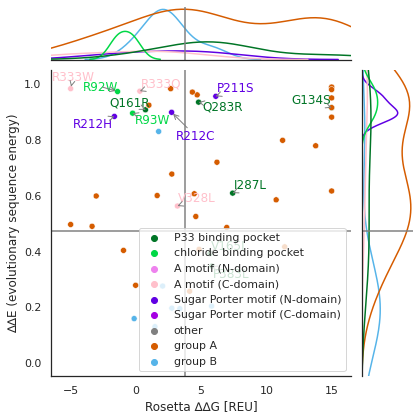

INFO:215 17 135
INFO:OPSD
INFO:4zwj
INFO:1U19
INFO:[17, '14-19', '50-59', 51, 55, 76, 79, 80, 83, 84, 87, 125, 126, 129, '130-140', 134, 135, '209-220', '212-221', 215, 223, 226, 247, 250, 251, 254, 257, 261, 262, 299, 300, 303, 306, 113, 114, 117, 118, 121, 122, 125, 181, 186, 187, 188, 189, 191, 207, 208, 211, 212, 261, 265, 268, 269, 292, 293, 295, 296, 17, 135, 215, 216]
INFO:129 257 261 134 135 262 265 268 269 17 130-140 292 293 295 296 299 300 303 306 51 181 55 186 187 188 189 209-220 212-221 191 76 79 80 207 208 83 84 254 211 87 215 212 216 223 121 226 122 250 113 114 117 118 247 50-59 14-19 251 125 126


NGLWidget()

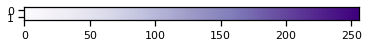

In [166]:
target_protein = 1
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = [17, '14-19', '50-59', 51, 55, 76, 79, 80, 83, 84, 87, 125, 126, 129, 
                         '130-140', 134, 135, '209-220', '212-221', 
                         215, 223, 226, 247, 250, 251, 254, 257, 261, 262, 299, 300, 303, 306, 
                         113, 114, 117, 118, 121, 122, 125, 181, 186, 
                         187, 188, 189, 191, 207, 208, 211, 212, 261, 
                         265, 268, 269, 292, 293, 295, 296, 17, 135, 215, 216]
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['R135W', 'R135L', 'T17K', 'T17M', 'P215L']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['N55K', 'M216R', ]
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
pdbs = ['1U19', '6tha']
logger.info(pdbs[0])
view = nv.show_pdbid(pdbs[0], gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A and not (164-179)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and RET", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and RET", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
#view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)

ligand_binding_pocket_new = ['G114', 'G121', 'E181', 'G188', 'M207', 'H211']
ligand_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(ligand_binding_pocket_new))])
Gt_activation = ['T17']
Gt_activation = " ".join([str(ins1[1:]) for ins1 in list(set(Gt_activation))])
DRY = ['R135']
DRY = " ".join([str(ins1[1:]) for ins1 in list(set(DRY))])
PIF = ['P215', 'M216']
PIF = " ".join([str(ins1[1:]) for ins1 in list(set(PIF))])
logger.info(ligand_binding_pocket)
view.add_licorice(selection=f":A and ({ligand_binding_pocket_new})", colorValue='#007526', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({ligand_binding_pocket_new})", radiusScale=2.5, color='#007526', zOffset=5)
view.add_licorice(selection=f":A and ({Gt_activation})", colorValue='violet', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({Gt_activation})", radiusScale=2.5, color='violet', zOffset=5)
view.add_licorice(selection=f":A and ({DRY})", colorValue='pink', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({DRY})", radiusScale=2.5, color='pink', zOffset=5)
view.add_licorice(selection=f":A and ({PIF})", colorValue='#6000e3', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({PIF})", name='PIF', radiusScale=2.5, color='#6000e3', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)
logger.info(ligand_binding_pocket_res)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


INFO:211
INFO:NPC1
INFO:5u74
INFO:[26, 30, 76, 80, 83, 133, 134, 137, 138, 141, 142, 160, 161, 164, 165, 168, 279, 282, 283, 287, 288, 291, 292, 317, 321, 379, 380, '383-385', 387, 388, 392, 404, 405, '407-409', 411, 412, 415, '91-93', 143, 209, 210, 213]


NGLWidget()

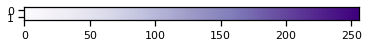

In [167]:
target_protein = 0
quartile = 5
group = 'A'

Rho = {'Q1': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']}, 
         'Q2': {'group A': ['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R'], 
                'group B': ['L68R', 'A299S']}, 
         'Q3': {'group A': ['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N'], 
                'group B': ['I307F', 'T320N']}, 
         'Q4': {'group A': ['E150K'], 
                'group B': ['G18D', 'H100R', 'R147C']}, 
         'Q5': {'group A': ['T17K', 'T17M', 'G51V', 'G121V', 'R135L', 'R135W', 'A164V', 'P215L']+['L46R', 'G51R', 'N55K', 'T58R', 'N73S', 'L88P', 'G90D', 'G106R', 'G106V', 'G106W', 'G109R', 'G114D', 'G114V', 'L131P', 'P180A', 'P180S', 'P180T', 'E181K', 'G182S', 'C185R', 'M207R', 'H211P', 'H211R', 'M216R', 'S297R']+['P23S', 'M39R', 'L95P', 'C167W', 'P180L', 'G188E', 'D190N']+['E150K'], 
                'group B': ['G51A', 'T58M', 'T70M', 'T193M']+['L68R', 'A299S']+['I307F', 'T320N']+['G18D', 'H100R', 'R147C']}}

ligand_binding_pocket = [26, 30, 76, 80, 83, 133, 134, 137, 138, 141, 142, 160, 161, 164, 165, 168, 279, 282, 283, 287, 288, 291, 292, 317, 321, 
                         379, 380, '383-385', 387, 388, 392, 404, 405, '407-409', 411, 412, 415, '91-93', 143, 209, 210, 213]
#ligand_binding_pocket = ['84-93', '325-334']
#ligand_binding_pocket = ['208-212', '453-457']
ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(ligand_binding_pocket))])

Q1_ligand_binding_pocket = ['P0S']
Q1_ligand_binding_pocket = ['P211S']
Q1_ligand_binding_pocket = [res[1:-1] for res in Q1_ligand_binding_pocket]
Q1_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q1_ligand_binding_pocket))])

Q2_ligand_binding_pocket = ['R92W', 'R93W', 'V328L', 'R333W', 'R333Q']
Q2_ligand_binding_pocket = ['R212H', 'R212C']
Q2_ligand_binding_pocket = [res[1:-1] for res in Q2_ligand_binding_pocket]
Q2_ligand_binding_pocket_res = " ".join([str(ins1) for ins1 in list(set(Q2_ligand_binding_pocket))])

logger.info(Q1_ligand_binding_pocket_res)

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

groupA = Rho[f"Q{quartile}"][f'group A']
groupB = Rho[f"Q{quartile}"][f'group B']

groupA_res = [res[1:-1] for res in groupA]
groupA_res = " ".join([str(ins1) for ins1 in list(set(groupA_res))])
groupB_res = [res[1:-1] for res in groupB]
groupB_res = " ".join([str(ins1) for ins1 in list(set(groupB_res))])
logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
pdbs = ['1U19', '6tha']

view = nv.show_pdbid(pdbs[1], gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A and not (250-265)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

view.add_licorice(selection=f":A and (P33)", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and (P33)", colorValue='#4d004b', opacity=0.25, wireframe=True)
view.add_licorice(selection=f":A and (CL)", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
view.add_surface(selection=f":A and (CL)", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
# view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)
# view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)

P33_ligand_binding_pocket_new = ['G134', 'Q161', 'Q283', 'I287', 'P383',]
P33_ligand_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(P33_ligand_binding_pocket_new))])
chloride_binding_pocket_new = ['R92', 'R93', ]
chloride_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(chloride_binding_pocket_new))])
ANdomain = ['R92', 'R93']
ANdomain = " ".join([str(ins1[1:]) for ins1 in list(set(ANdomain))])
ACdomain = ['V328', 'R333', ]
ACdomain = " ".join([str(ins1[1:]) for ins1 in list(set(ACdomain))])
SNdomain = ['P211', 'R212']
SNdomain = " ".join([str(ins1[1:]) for ins1 in list(set(SNdomain))])
logger.info(ligand_binding_pocket)
view.add_licorice(selection=f":A and ({P33_ligand_binding_pocket_new})", colorValue='#007526', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({P33_ligand_binding_pocket_new})", radiusScale=2.5, color='#007526', zOffset=5)
view.add_licorice(selection=f":A and ({chloride_binding_pocket_new})", colorValue='#00d846', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({chloride_binding_pocket_new})", radiusScale=2.5, color='#00d846', zOffset=5)
#view.add_licorice(selection=f":A and ({ANdomain})", colorValue='violet', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({ANdomain})", radiusScale=2.5, color='violet', zOffset=5)
#view.add_licorice(selection=f":A and ({ACdomain})", colorValue='pink', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({ACdomain})", radiusScale=2.5, color='pink', zOffset=5)
view.add_licorice(selection=f":A and ({SNdomain})", colorValue='#6000e3', colorScheme='element', radiusScale=2.5)
view.add_label(selection=f":A and .N and ({SNdomain})", name='PIF', radiusScale=2.5, color='#6000e3', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
#view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


### fig for sasa, buried, TM, non-TM

In [167]:
gemme_name = 'gemme;score'
target_dic_here = subfiltered_df_dicts#renamed_df_dicts#subfiltered_df_dicts
all_all_tmp = []

all_tmp = []
target_uniprot  = protein_of_interest
tmp_energy = target_dic_here[target_uniprot].copy()
tmp_energy['accession'] = target_uniprot
if gemme_name == 'gemme;score;ori':
    tmp_energy[gemme_name] = tmp_energy[gemme_name]*(-1)

tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

tmp_energy['res'] = tmp_energy['resi'].apply(lambda x: x[0])
tmp_energy['var'] = tmp_energy['variant'].apply(lambda x: x[-1])
tmp_energy['wt'] = tmp_energy['variant'].apply(lambda x: x[0])

tmp_energy['property_wt'] = tmp_energy['wt'].apply(lambda x: make_property(x))
tmp_energy['property_var'] = tmp_energy['var'].apply(lambda x: make_property(x))

def remove_dup(x):
    if type(x)==str:
        x = x.split('|')
        x= list(set(x))
        for elem in x:
            if elem!='':
                return elem
    else:
        return None
tmp_energy['SAR'] = ''
for pdbASA in [column for column in tmp_energy.columns if column.startswith('pdb;ASA_')]:
    tmp_energy['SAR_tmp'] = tmp_energy[pdbASA].apply(lambda x: sasa(x))
    tmp_energy['SAR_tmp'] = tmp_energy['SAR_tmp'].fillna('')
    tmp_energy['SAR'] = tmp_energy['SAR'] +'|'+ tmp_energy['SAR_tmp']
tmp_energy['SAR'] = tmp_energy['SAR'].apply(lambda x: remove_dup(x) )

tmp_energy['TMspan'] = ''
for tmspan_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;TMspan')]:
    tmp_energy['TMspan_tmp'] = tmp_energy[tmspan_clumn].apply(lambda x: 'TM-region' if x else '')
    tmp_energy['TMspan'] = tmp_energy['TMspan'] +'|'+ tmp_energy['TMspan_tmp']
tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: remove_dup(x) )
tmp_energy['TMspan'] = tmp_energy['TMspan'].apply(lambda x: 'TM-region' if x else '')
#         tmp_energy['LAR'] = ''
#         for lar_clumn in [column for column in tmp_energy.columns if column.startswith('rosetta;cart;LAR')]:
#             tmp_energy['LAR_tmp'] = tmp_energy[lar_clumn].apply(lambda x: 'lipid-facing' if x else '')
#             tmp_energy['LAR'] = tmp_energy['LAR'] +'|'+ tmp_energy['LAR_tmp']
#         tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: remove_dup(x) )
#         tmp_energy['LAR'] = tmp_energy['LAR'].apply(lambda x: 'lipid-facing' if x else '')
#         tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['LAR'] +'|'+ tmp_energy['SAR']
tmp_energy['position'] = tmp_energy['TMspan'] +'|'+ tmp_energy['SAR']

def tmpiii_ds(x):
    if type(x)!=float:
        return '|'.join(list(filter(None, x.split('|')))) 
tmp_energy['position'] = tmp_energy['position'].apply(lambda x: tmpiii_ds(x) )

tmp_energy['position_backup'] = tmp_energy['position']
pos_list = ['solvent-accessible', 
            'buried', 
#                     'TM-region|lipid-facing|buried', 
            'TM-region|buried', 
            'TM-region|solvent-accessible', 
#                     'TM-region|lipid-facing|solvent-accessible', 
#                     'lipid-facing|buried', 
           ]
tmp_energy['position'] = tmp_energy['position'].apply(lambda x: x if x in pos_list else 'others')


x_range = 1
y_range = 0.1
tmp_energy['label_class_raw'] = tmp_energy[['clinvar;significance_all', 'gnomad;AF_tot_all']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
tmp_energy['score'] = tmp_energy['label_class_raw'].apply(lambda x: gnomad_class_anno5(x, split_val=cutoff_value))

tmp_energy.loc[tmp_energy['score']==1,'label'] = 'group A'
tmp_energy.loc[tmp_energy['score']==0,'label'] = 'group B'
tmp_energy.loc[tmp_energy['score'].isna(),'label'] = 'other'

def make_groups(x):
    if x in [y.split('_')[1] for y in [*all_vals_cat['all'][0],*all_vals_cat['all'][4]]]:
        return 'Q1'
    elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][1], *all_vals_cat['all'][5]]]:
        return 'Q2'
    elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][2], *all_vals_cat['all'][6]]]:
        return 'Q3'
    elif x in [y.split('_')[1] for y in [*all_vals_cat['all'][3], *all_vals_cat['all'][7]]]:
        return 'Q4'
tmp_energy['quadrant'] = tmp_energy['variant'].apply(lambda x: make_groups(x))
tmp_energy.loc[tmp_energy['rosetta;ddG']> 15, 'rosetta;ddG'] = 15
tmp_energy.loc[tmp_energy['rosetta;ddG']< -5, 'rosetta;ddG'] = -5
tmp_energy['gnomad;AF_tot_first'] = tmp_energy["gnomad;AF_tot_all"].apply(lambda x: float(x))
all_all_tmp.append(tmp_energy)
print(len(all_all_tmp))
all_all_tmp = pd.concat(all_all_tmp)
all_all_tmp['resi'] = all_all_tmp['resi'].apply(lambda x: x[1:-1])

1


In [168]:
SA_list = list(set(all_all_tmp.loc[(all_all_tmp['position'] == 'solvent-accessible'), 'resi'].tolist()))
B_list = list(set(all_all_tmp.loc[(all_all_tmp['position'] == 'buried'), 'resi'].tolist()))
TMSA_list = list(set(all_all_tmp.loc[(all_all_tmp['position'] == 'TM-region|solvent-accessible'), 'resi'].tolist()))
TMB_list = list(set(all_all_tmp.loc[(all_all_tmp['position'] == 'TM-region|buried'), 'resi'].tolist()))
# TMSA_list = [el for el in TMSA_list if not el in SA_list]
# TMB_list = [el for el in TMB_list if not el in B_list]
# SA_list = [el for el in SA_list if not el in TMSA_list]
# B_list = [el for el in B_list if not el in TMB_list]
len(SA_list), len(TMSA_list)


(70, 110)

INFO:OPSD
INFO:4zwj
INFO:1U19


NGLWidget()

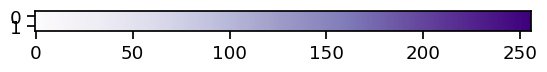

In [169]:
target_protein = 1
quartile = 5
group = 'A'

SA_list_res = " ".join([str(ins1) for ins1 in list(set(SA_list))])
B_list_res = " ".join([str(ins1) for ins1 in list(set(B_list))])
TMSA_list_res = " ".join([str(ins1) for ins1 in list(set(TMSA_list))])
TMB_list_res = " ".join([str(ins1) for ins1 in list(set(TMB_list))])

target_uniprot = target_list[target_protein][0]
target_name = target_list[target_protein][1]

logger.info(target_name)

target = target_list[target_protein]

write_new = False

targe_uniprot = target[0]
pdbid = target[3][0].split('-')[0]
logger.info(pdbid)
viewtmps_dir = os.path.join(working_dir, 'view_tmps')
os.makedirs(viewtmps_dir, exist_ok=True)
pdb_file_name = os.path.join(viewtmps_dir, f"{pdbid}-opm_holes.pdb")
if write_new:
    pdb_file = extract_from_opm(pdbid)
    with open(pdb_file_name, 'w') as fp:
        fp.write(pdb_file)
    #pdb_files = glob.glob(os.path.join(pdb_prism_dir, targe_uniprot[0:2], targe_uniprot[2:4], targe_uniprot[4:6], f'prism_pdb_XXX_{targe_uniprot}-{target[3][0]}.txt'))[0]

#    min_y = tmp_energy['rosetta;ddG'].min()
#    max_y = tmp_energy['rosetta;ddG'].max() 

#cmap(0.75)

#print(pdb_file)

colors = ['grey','green', 'lightblue', 'yellow', 'red', 'purple']
colors = ['#000014', '#00003b', '#000062', '#000089', '#0000b1', 
          '#0000d8', '#0000ff', '#2727ff', '#4e4eff', '#7676ff', 
          '#9d9dff', '#c4c4ff', '#ebebff', '#767689', '#b8b8b8', 
          '#a3a3a3', '#a3a3a3', '#999999', '#8f8f8f', '#858585']
colors.reverse()
colors
colors = sns.color_palette("ch:s=.2,rot=-.3", 20).as_hex()#sns.color_palette("YlGnBu", 20).as_hex()
#colors.reverse()

#view = nv.show_file(pdb_file_name)
pdbs = ['1U19', '6tha']
logger.info(pdbs[0])
view = nv.show_pdbid(pdbs[0], gui=True)
view.clear_representations()
view.add_cartoon(selection=f"protein and :A and not (164-179)", color='grey', opacity=0.8, side='front')
#view.add_cartoon(selection=f"protein and :A and  (1-105 164-180)", color='grey', opacity=0.25, side='front')

if group=='A':
    color_val = '#D55C00'
else:
    color_val = '#56B4E9'

# view.add_licorice(selection=f":A and RET", colorValue='#4d004b', colorScheme='element', radiusScale=2.5)
# view.add_surface(selection=f":A and RET", colorValue='#4d004b', opacity=0.25, wireframe=True)
    
#view.add_licorice(selection=f":A and ({Q1_ligand_binding_pocket_res})", colorValue='#fec44f', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q1_ligand_binding_pocket_res})", radiusScale=2.5, color='#fec44f', zOffset=5)
#view.add_licorice(selection=f":A and ({Q2_ligand_binding_pocket_res})", colorValue='#fe9929', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .N and ({Q2_ligand_binding_pocket_res})", radiusScale=2.5, color='#fe9929', zOffset=5)

view.add_licorice(selection=f":A and ({SA_list_res})", colorValue='#00A0B0', colorScheme='element', radiusScale=2.5)
view.add_licorice(selection=f":A and ({B_list_res})", colorValue='#CC333F', colorScheme='element', radiusScale=2.5)
view.add_licorice(selection=f":A and ({TMSA_list_res})", colorValue='#EDC951', colorScheme='element', radiusScale=2.5)
view.add_licorice(selection=f":A and ({TMB_list_res})", colorValue='#009E74', colorScheme='element', radiusScale=2.5)





# ligand_binding_pocket_new = ['G114', 'G121', 'E181', 'G188', 'M207', 'H211']
# ligand_binding_pocket_new = " ".join([str(ins1[1:]) for ins1 in list(set(ligand_binding_pocket_new))])
# Gt_activation = ['T17']
# Gt_activation = " ".join([str(ins1[1:]) for ins1 in list(set(Gt_activation))])
# DRY = ['R135']
# DRY = " ".join([str(ins1[1:]) for ins1 in list(set(DRY))])
# PIF = ['P215', 'M216']
# PIF = " ".join([str(ins1[1:]) for ins1 in list(set(PIF))])
# logger.info(ligand_binding_pocket)
# view.add_licorice(selection=f":A and ({ligand_binding_pocket_new})", colorValue='#007526', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({ligand_binding_pocket_new})", radiusScale=2.5, color='#007526', zOffset=5)
# view.add_licorice(selection=f":A and ({Gt_activation})", colorValue='violet', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({Gt_activation})", radiusScale=2.5, color='violet', zOffset=5)
# view.add_licorice(selection=f":A and ({DRY})", colorValue='pink', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({DRY})", radiusScale=2.5, color='pink', zOffset=5)
# view.add_licorice(selection=f":A and ({PIF})", colorValue='#6000e3', colorScheme='element', radiusScale=2.5)
# view.add_label(selection=f":A and .N and ({PIF})", name='PIF', radiusScale=2.5, color='#6000e3', zOffset=5)
    
#view.add_licorice(selection=f":A and ({groupA_res})", colorValue='#D55C00', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupA_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A and ({groupB_res})", colorValue='#56B4E9', colorScheme='element', radiusScale=2.5)
#view.add_label(selection=f":A and .O and ({groupB_res})", radiusScale=2.5, color='black')

#view.add_licorice(selection=f":A", colorValue='grey', colorScheme='element', radiusScale=0.3)

# view.add_licorice(selection=f":A and ({ligand_binding_pocket_res})", colorValue='grey', colorScheme='element', radiusScale=0.3)
# logger.info(ligand_binding_pocket_res)

##########view.add_representation('ball+stick', selection=f'HOL', opacity=0.8, radius='bfactor')#wireframe=True)#, radiusScale=0.1)
view.add_spacefill(selection='DUM', opacity=0.5, radiusScale=0.1)

#view.add_cartoon(selection="protein")
view._remote_call("setSize", target='Widget', args=['200px', '200px'])
view.parameters = dict(backgroundColor='white', clipDist=25, sampleLevel=3)#clipDist=-100
view.camera='orthographic'
view.center()
#view.clipNear(50)
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
plt.imshow(gradient, aspect=5, cmap=plt.get_cmap('Purples'))
#sns.palplot(cmap, size=0.7)
view


# Analyze GEMME neff

In [99]:
proteins = ['O15118', 'P08100', 'P11166', 'P13569', 'P16615', 'P17787', 'P29033', 'P31213', 'P32245', 
            'P35499', 'P41181', 'P43681', 'Q8N5M9', 'Q99835', 'Q9H221', 'Q9H222', 'Q9H3H5', 'Q9ULV1']
neffs_proteins = [['protein', 'sum Neffs', 'seq len', 'Nf']]
for protein in proteins:
    diri = f'/storage1/tiemann/projects/Xray_calc/gemme/{protein}/run/hhblits_run'
    hhr_file = glob.glob(os.path.join(diri, '*.hhr'))[-1]
    Neffs = []
    with open(hhr_file, 'r') as fp:
        for index, line in enumerate(fp):
            if 'Template_Neff' in line:
                tmp_neffs = float(line.split('Template_Neff=')[-1])
                Neffs.append(tmp_neffs)
    sumneffs = np.sum(Neffs)
    lenseq = len(Neffs)
    Nf = np.sum(Neffs)/(np.sqrt(len(Neffs)))
    neffs_proteins.append([protein, sumneffs, lenseq, Nf])
    print(f"{protein}, {sumneffs}, {lenseq}, {Nf}")
neffs_proteins_df = pd.DataFrame(data=neffs_proteins[1:], columns=neffs_proteins[0])
neffs_proteins_df

O15118, 5716.704, 3312, 99.33459874147795
P08100, 27607.774000000005, 20000, 195.21644208865658
P11166, 22435.093, 13596, 192.40763267296754
P13569, 40930.804000000004, 20000, 289.42449067817466
P16615, 16409.625, 12110, 149.11680330298734
P17787, 7829.051, 6150, 99.83241205970485
P29033, 769.138, 595, 31.531583820436456
P31213, 1126.3290000000002, 712, 42.21096388675099
P32245, 25742.416, 18764, 187.92587980142497
P35499, 18337.206, 14283, 153.4346495693568
P41181, 5216.307000000001, 3711, 85.62836787932751
P43681, 7787.109999999999, 6061, 100.02398833885144
Q8N5M9, 160.68300000000002, 123, 14.488298190726704
Q99835, 1581.74, 1119, 47.284636439893504
Q9H221, 34168.054, 20000, 241.60462683348138
Q9H222, 34882.079, 20000, 246.65354602784862
Q9H3H5, 1445.0390000000002, 841, 49.828931034482764
Q9ULV1, 2120.7830000000004, 1632, 52.49720191591752


,protein,sum Neffs,seq len,Nf
0,O15118,5716.704,3312,99.334599
1,P08100,27607.774,20000,195.216442
2,P11166,22435.093,13596,192.407633
3,P13569,40930.804,20000,289.424491
4,P16615,16409.625,12110,149.116803
5,P17787,7829.051,6150,99.832412
6,P29033,769.138,595,31.531584
7,P31213,1126.329,712,42.210964
8,P32245,25742.416,18764,187.925880
9,P35499,18337.206,14283,153.434650


/storage1/tiemann/projects/Xray_calc/gemme/O15118/run-v2/prism_gemme_scores.txt


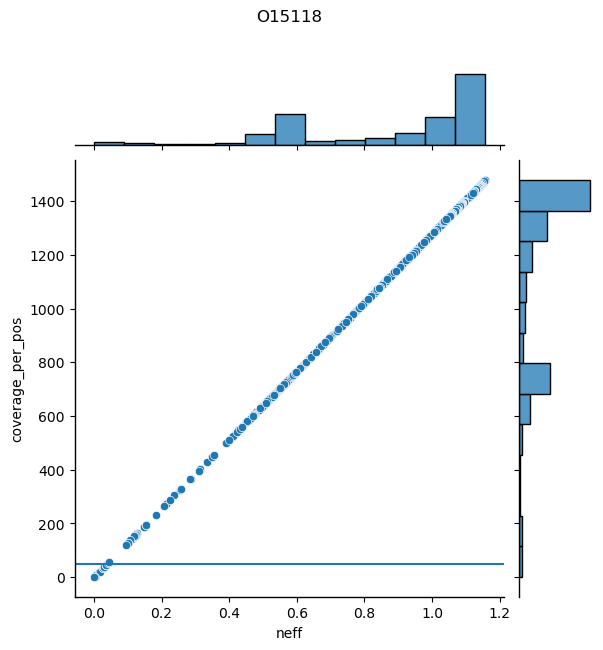

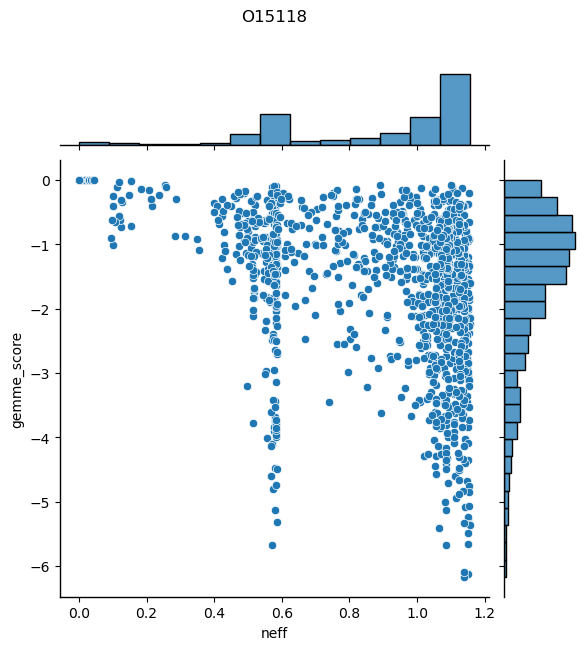

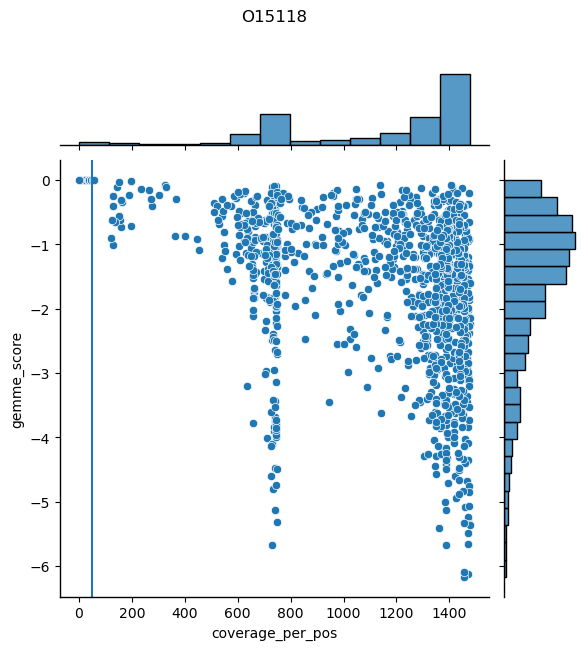

/storage1/tiemann/projects/Xray_calc/gemme/P08100/run-v2/prism_gemme_scores.txt


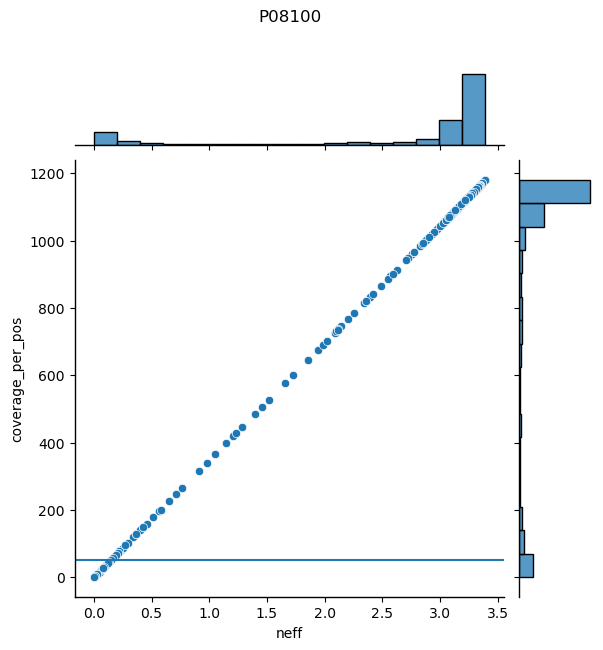

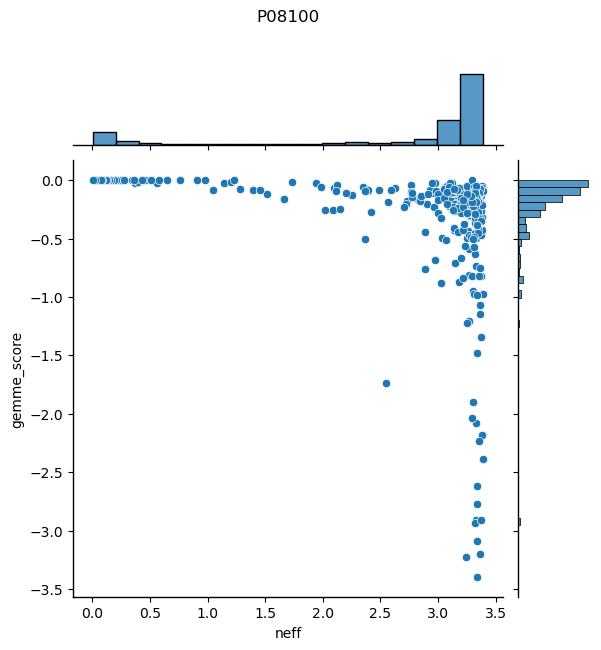

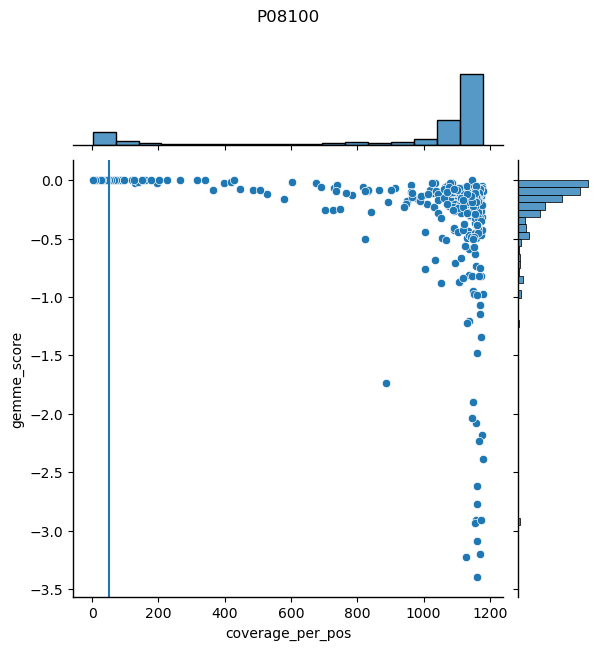

/storage1/tiemann/projects/Xray_calc/gemme/P11166/run-v2/prism_gemme_scores.txt


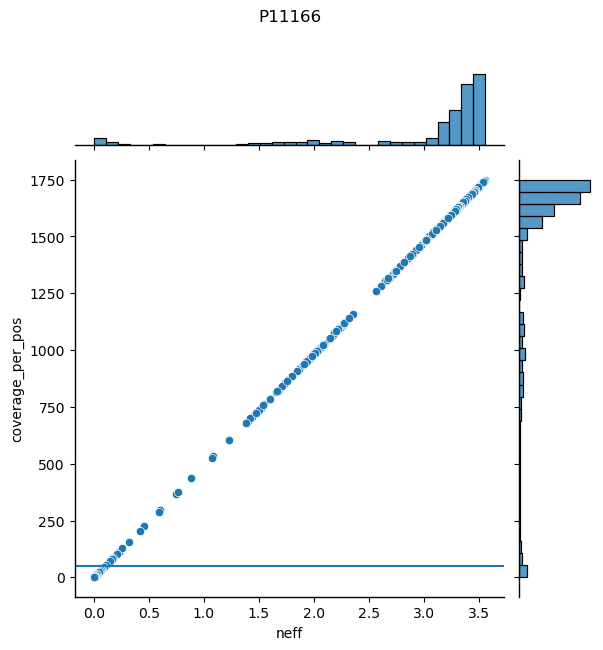

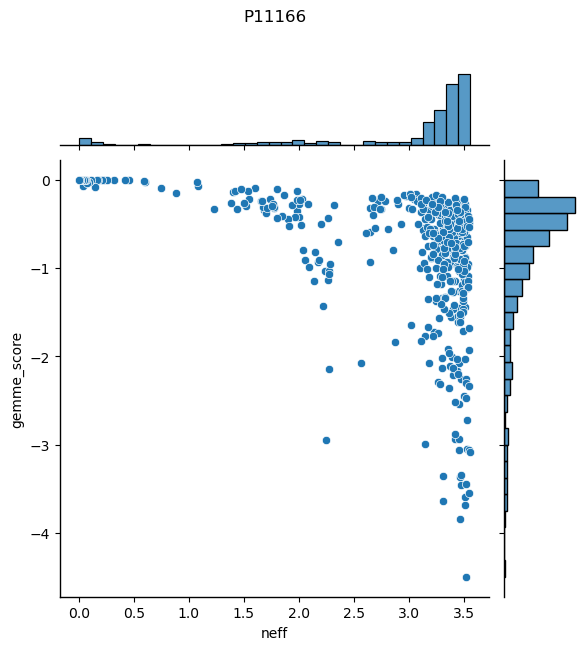

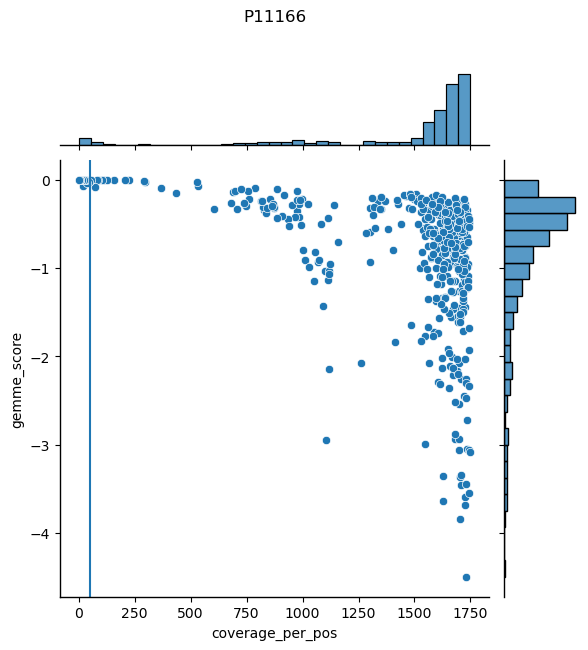

/storage1/tiemann/projects/Xray_calc/gemme/P16615/run-v2/prism_gemme_scores.txt


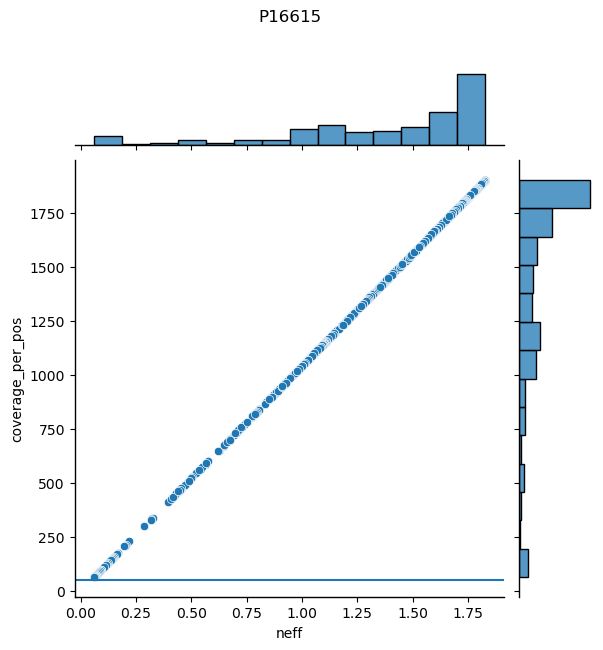

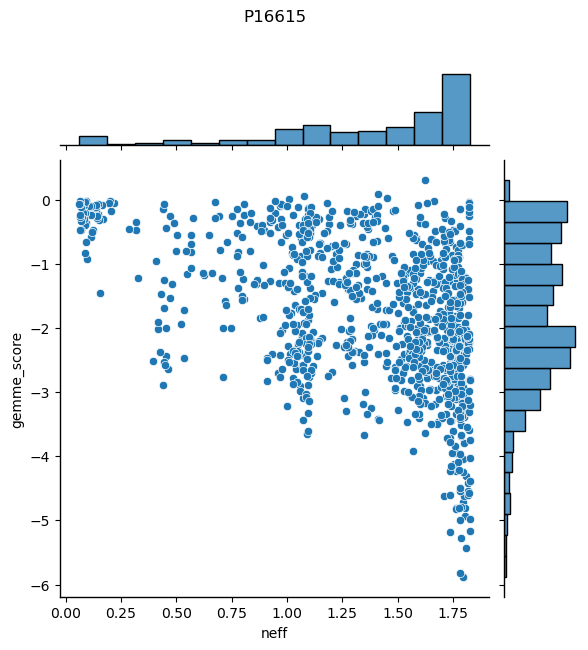

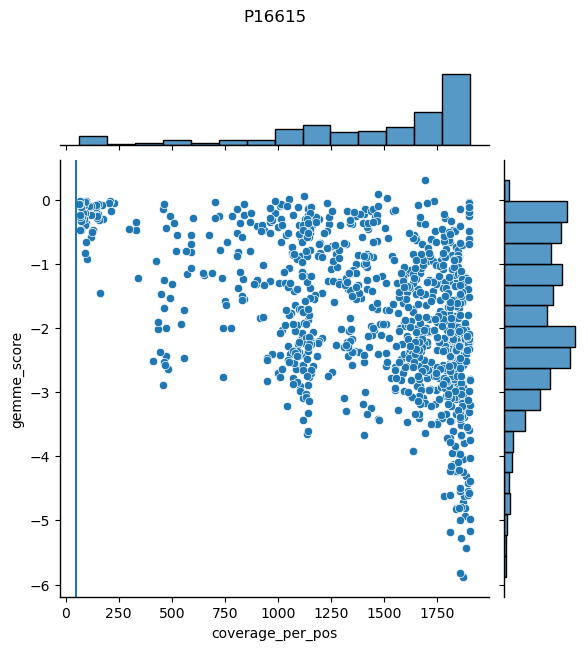

/storage1/tiemann/projects/Xray_calc/gemme/P17787/run-v2/prism_gemme_scores.txt


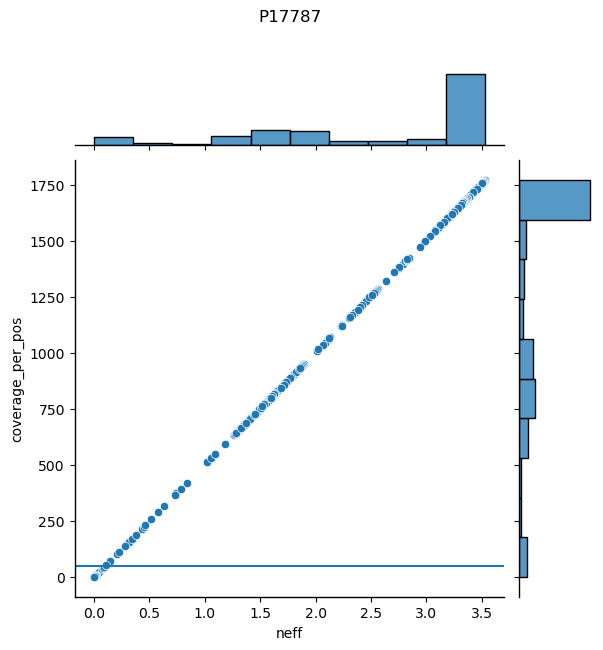

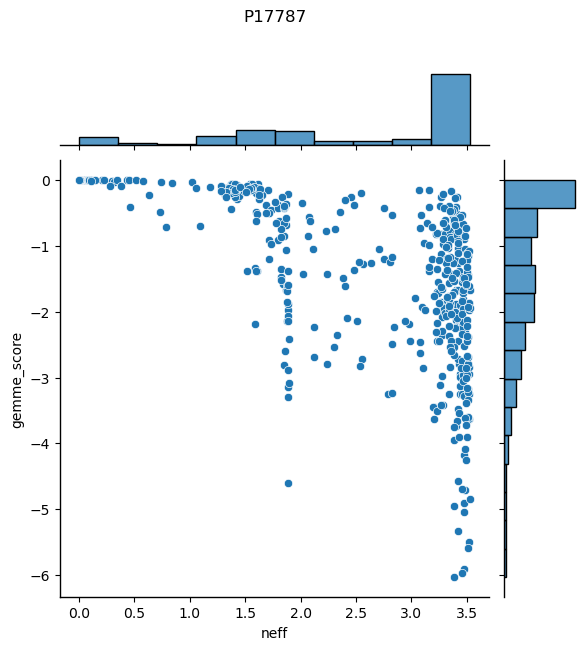

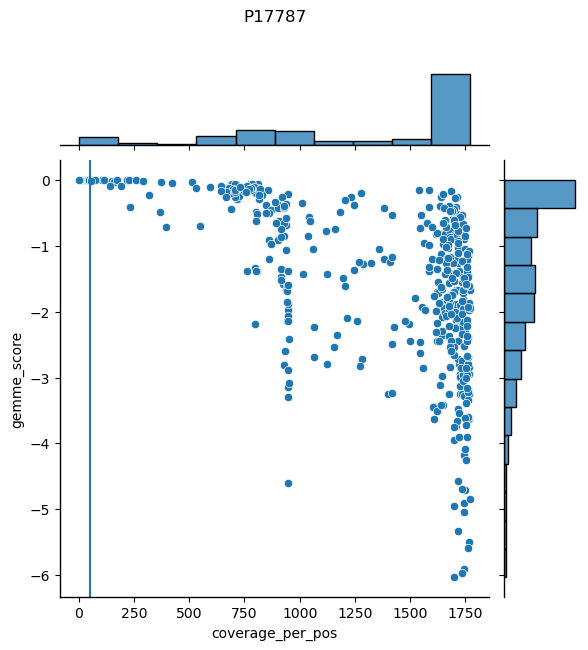

/storage1/tiemann/projects/Xray_calc/gemme/P29033/run-v2/prism_gemme_scores.txt


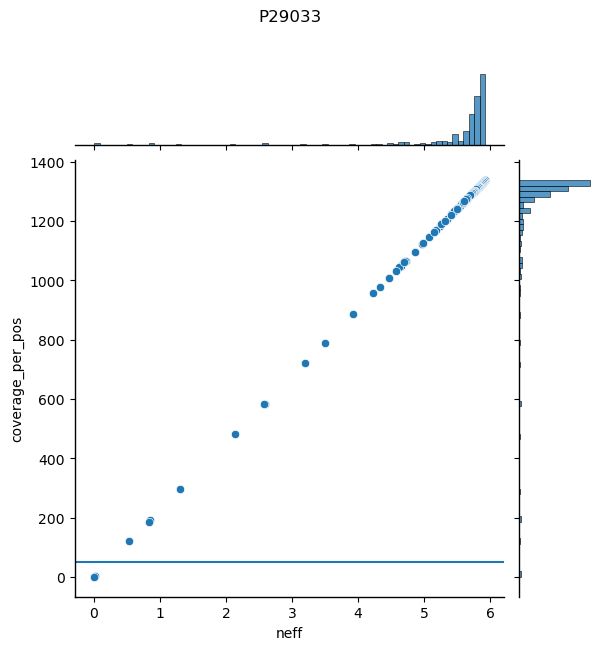

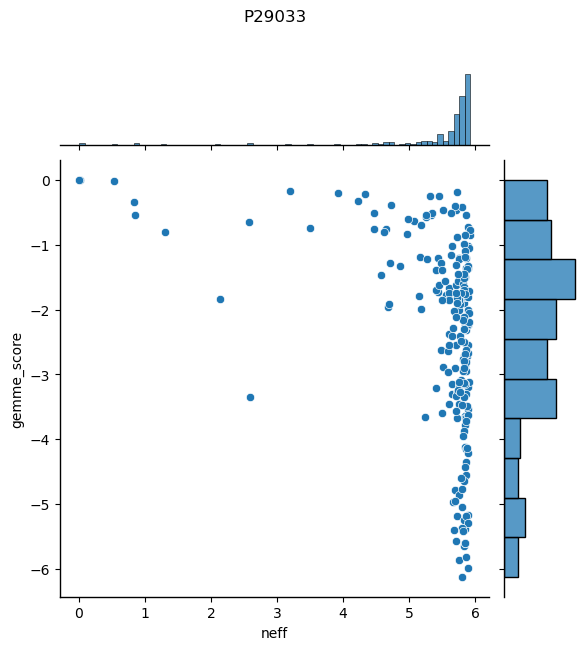

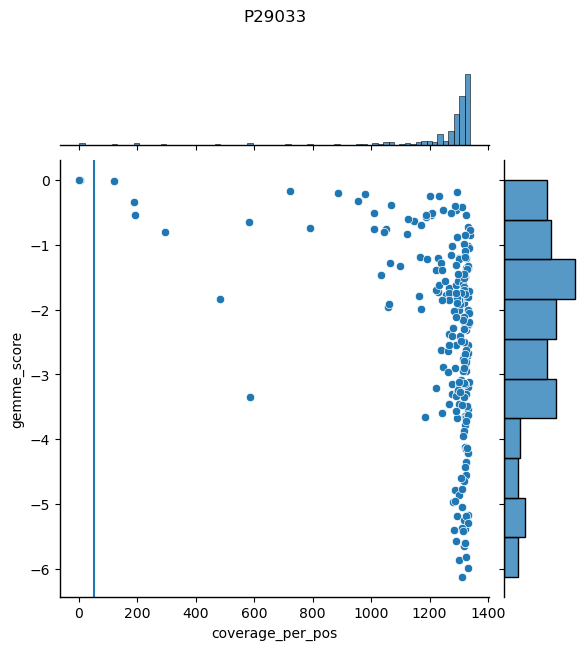

/storage1/tiemann/projects/Xray_calc/gemme/P31213/run-v2/prism_gemme_scores.txt


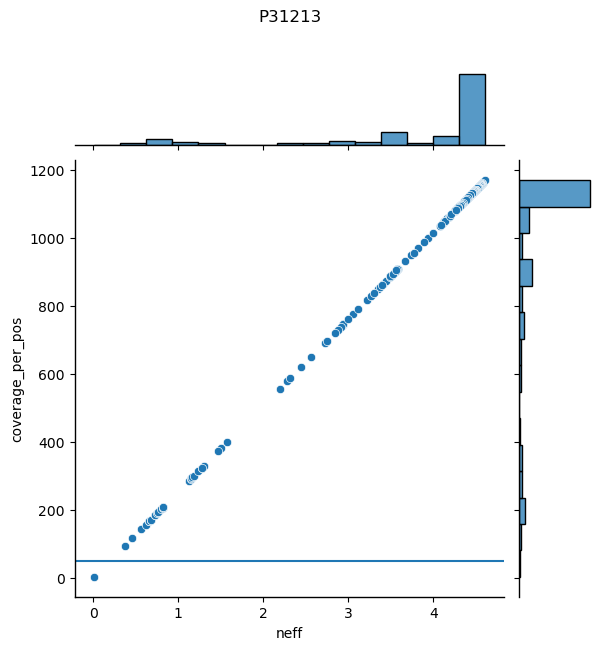

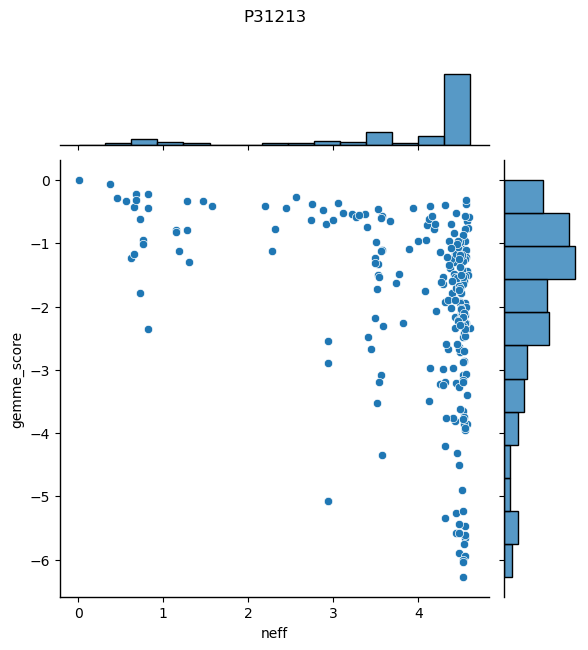

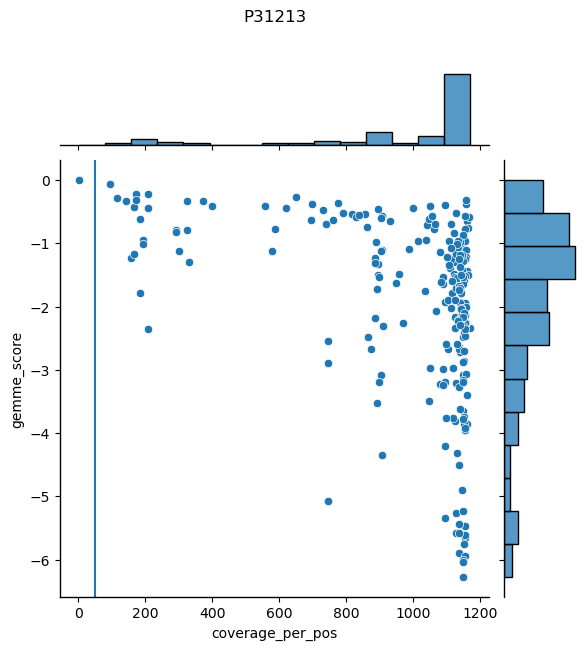

/storage1/tiemann/projects/Xray_calc/gemme/P32245/run-v2/prism_gemme_scores.txt


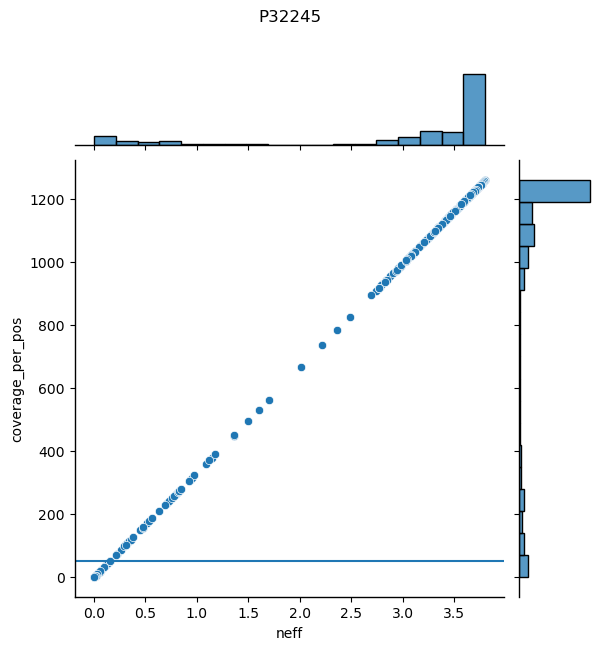

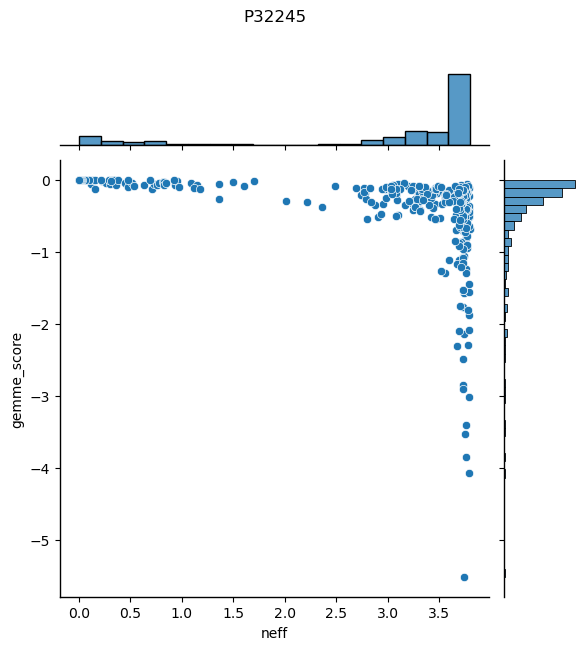

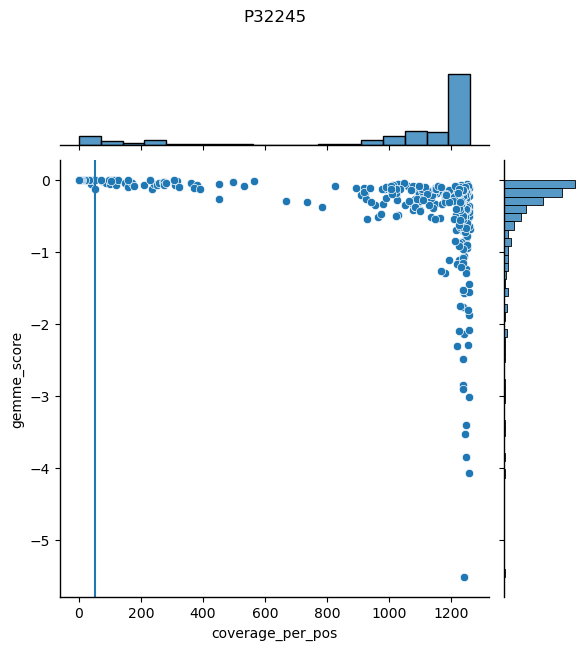

/storage1/tiemann/projects/Xray_calc/gemme/P41181/run-v2/prism_gemme_scores.txt


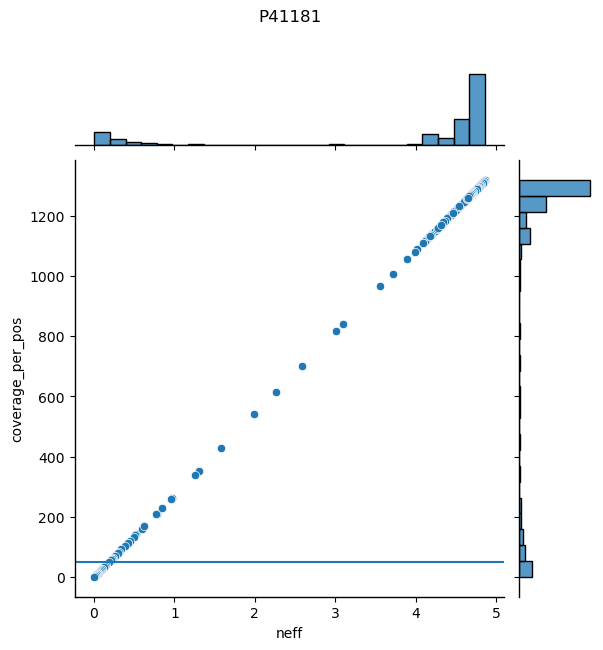

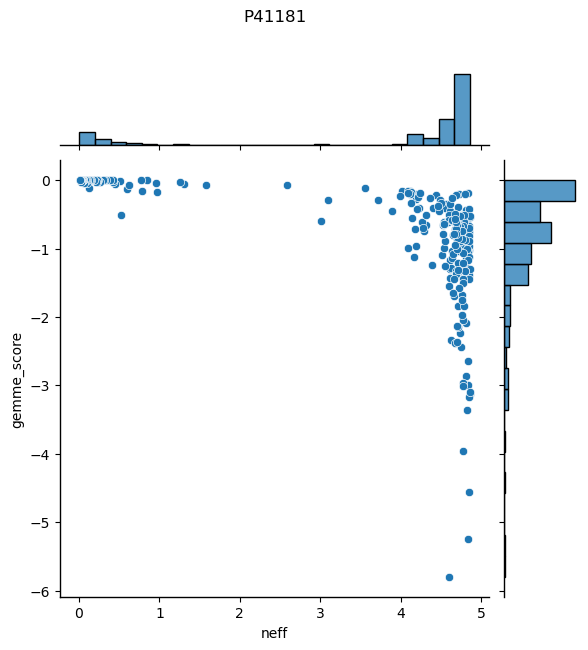

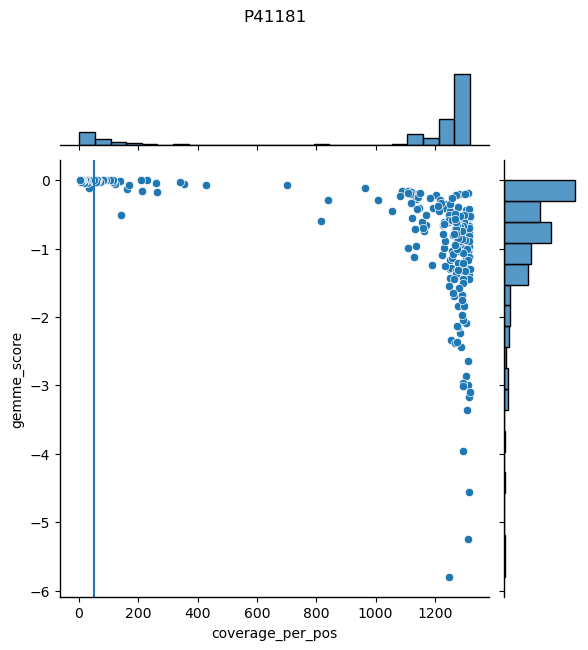

/storage1/tiemann/projects/Xray_calc/gemme/P43681/run-v2/prism_gemme_scores.txt


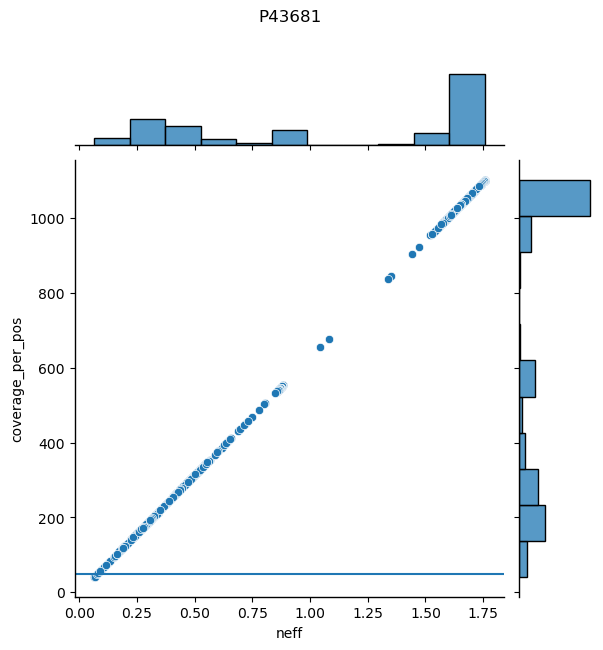

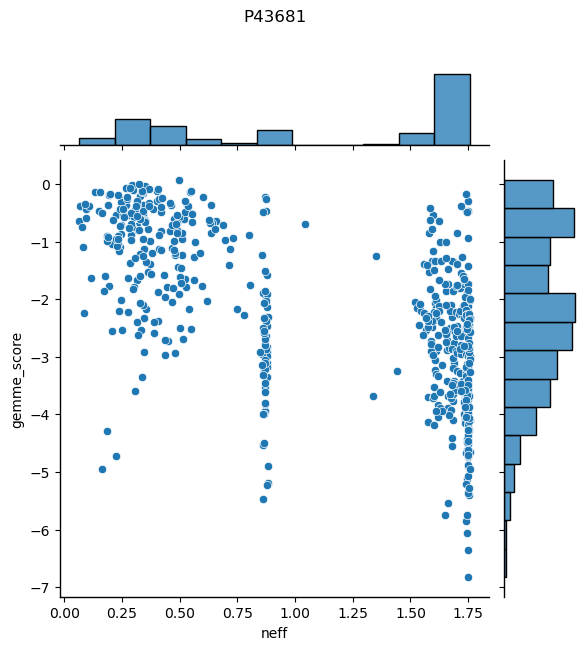

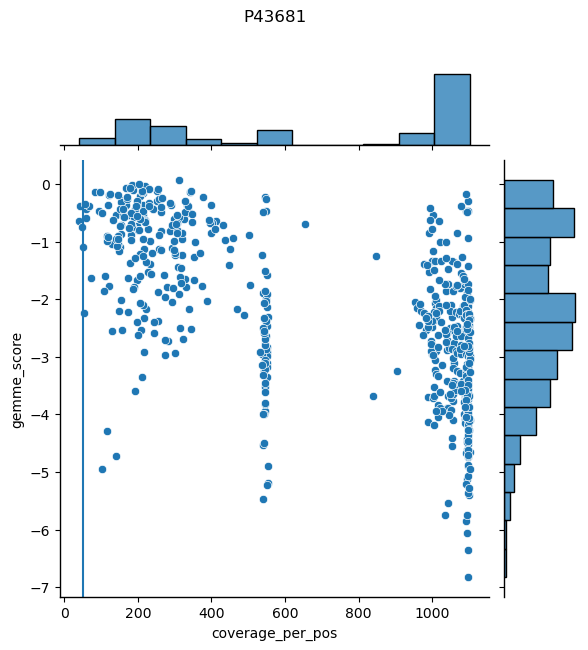

/storage1/tiemann/projects/Xray_calc/gemme/Q8N5M9/run-v2/prism_gemme_scores.txt


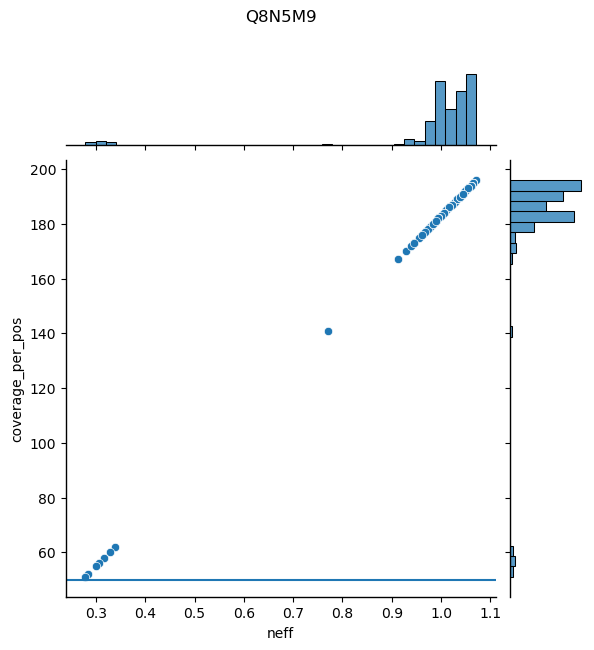

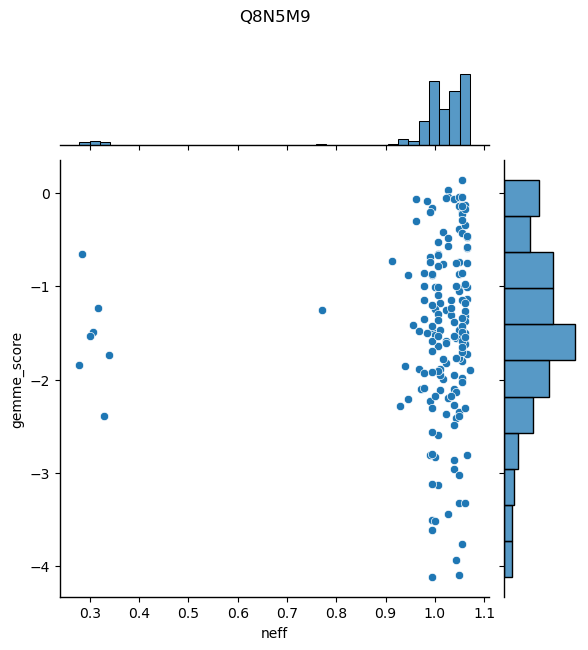

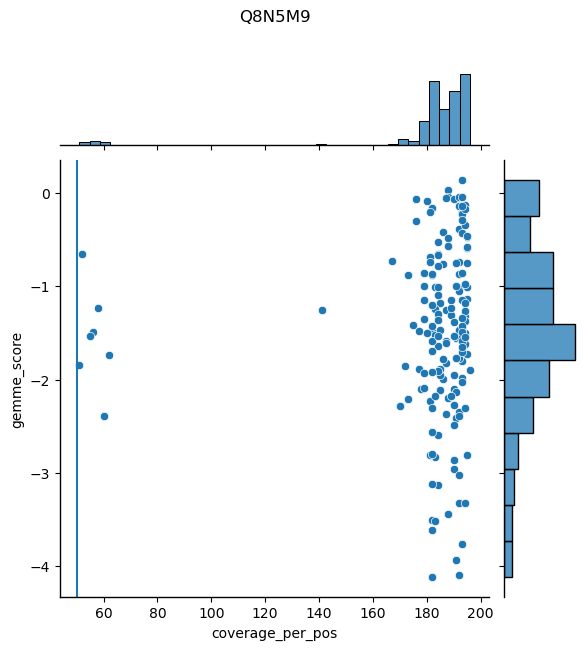

/storage1/tiemann/projects/Xray_calc/gemme/Q99835/run-v2/prism_gemme_scores.txt


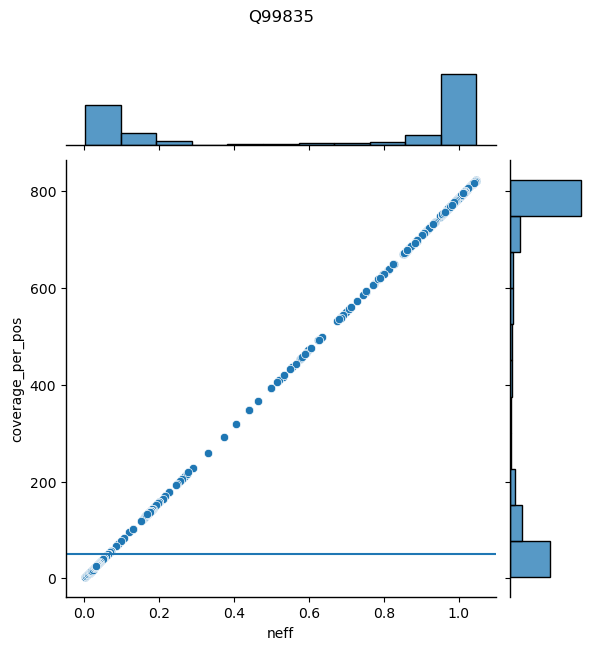

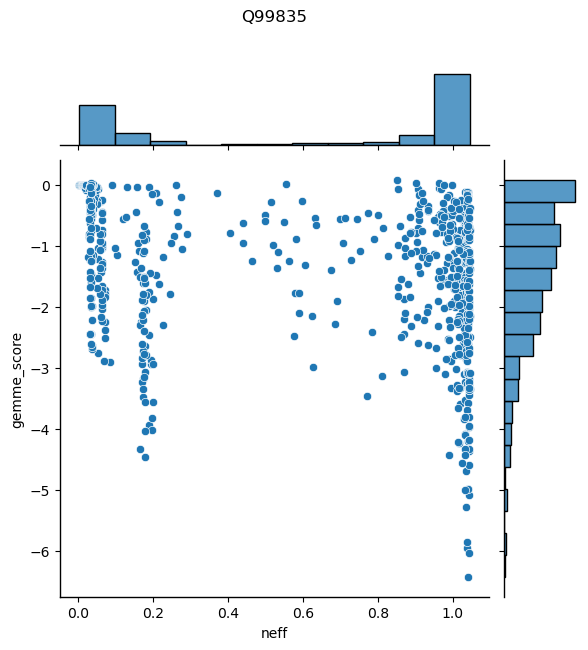

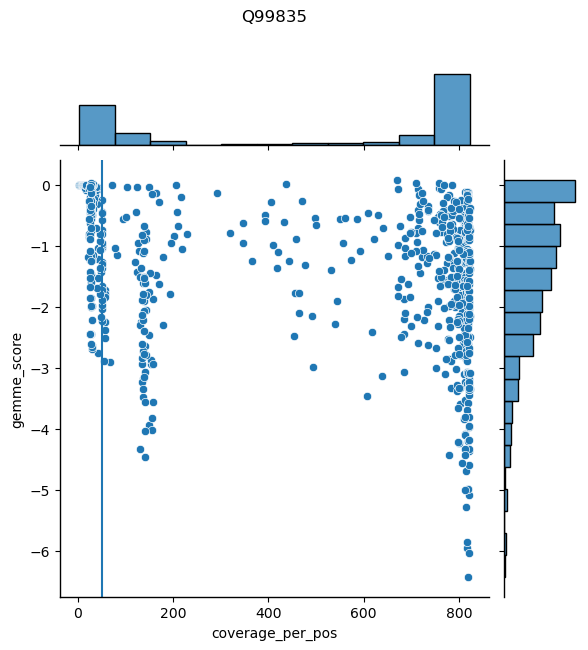

/storage1/tiemann/projects/Xray_calc/gemme/Q9H221/run-v2/prism_gemme_scores.txt


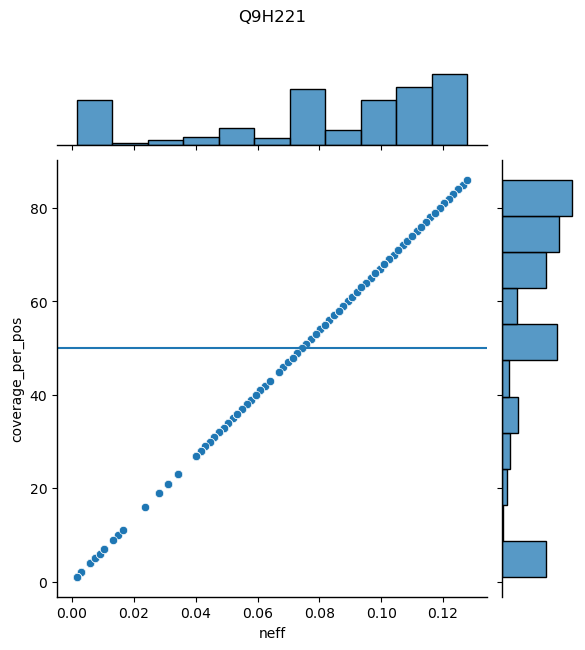

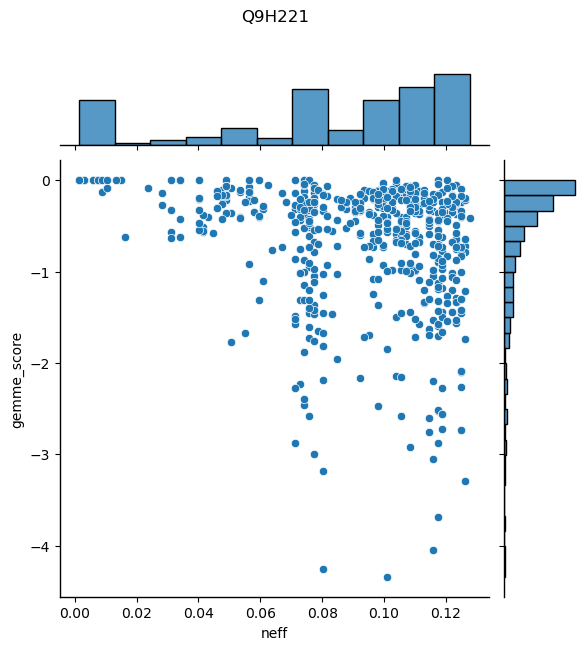

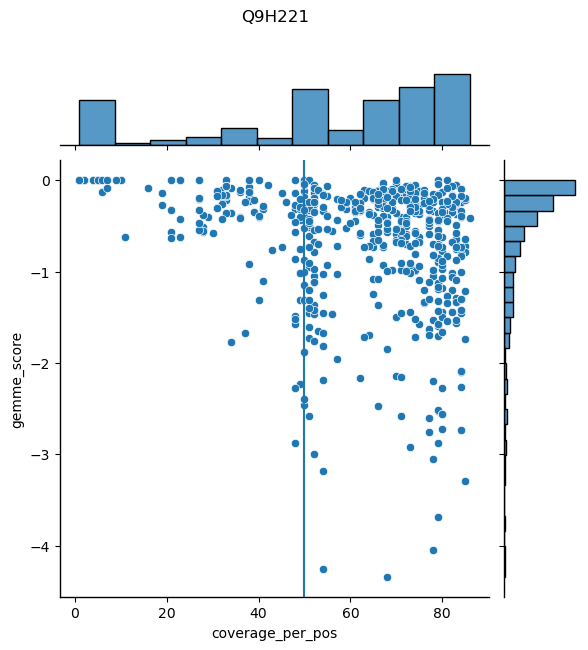

/storage1/tiemann/projects/Xray_calc/gemme/Q9H222/run-v2/prism_gemme_scores.txt


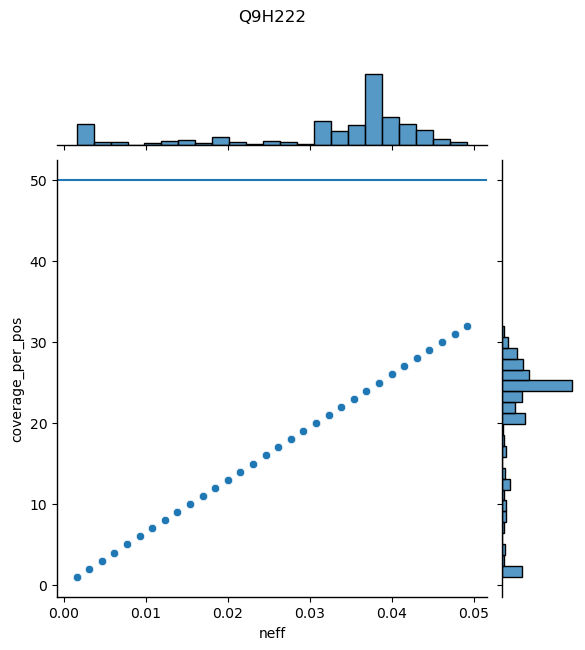

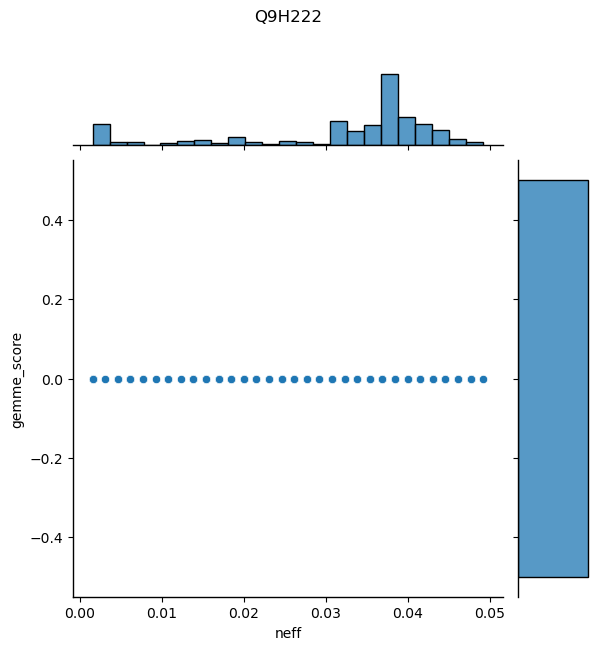

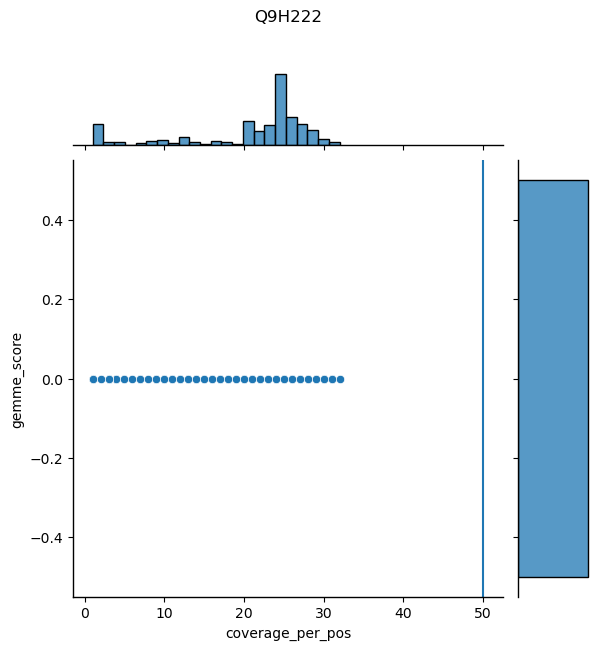

/storage1/tiemann/projects/Xray_calc/gemme/Q9H3H5/run-v2/prism_gemme_scores.txt


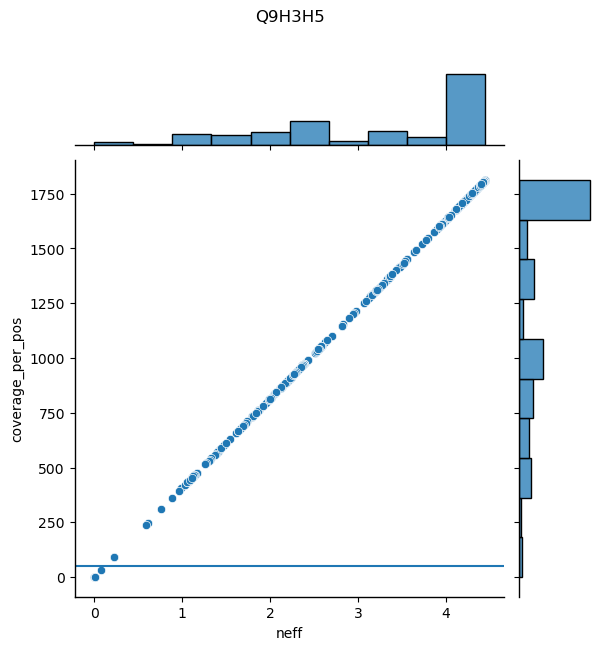

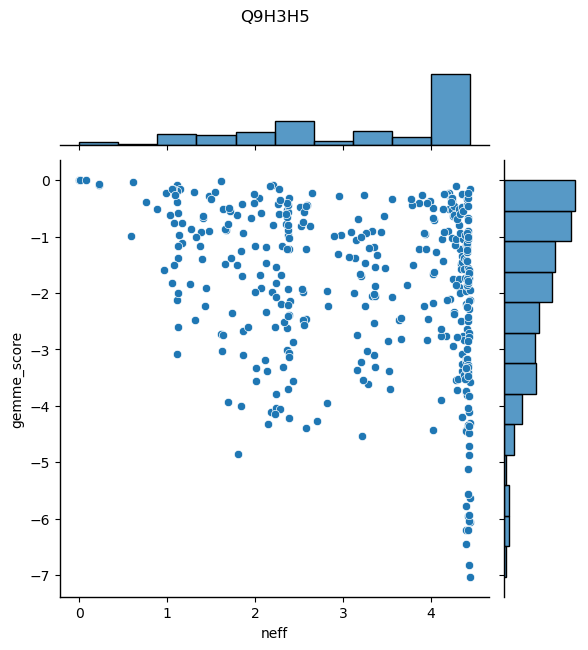

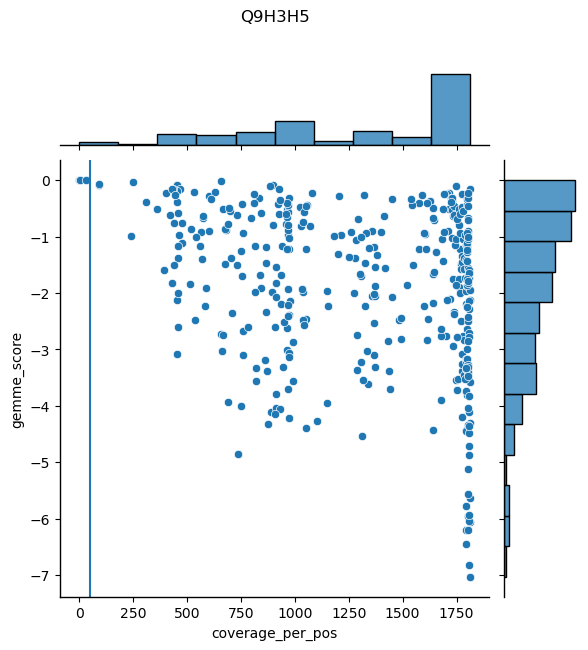

/storage1/tiemann/projects/Xray_calc/gemme/Q9ULV1/run-v2/prism_gemme_scores.txt


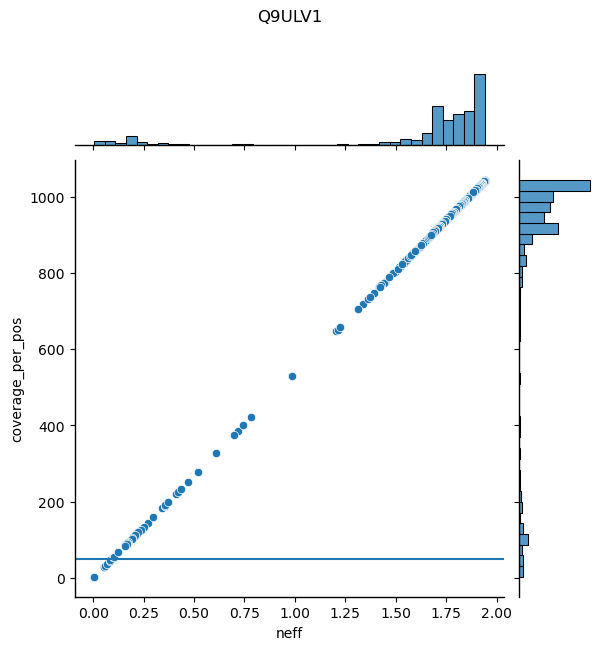

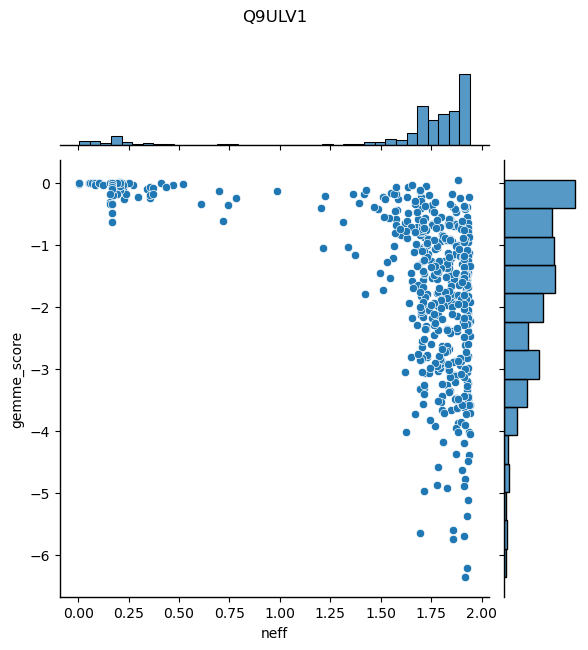

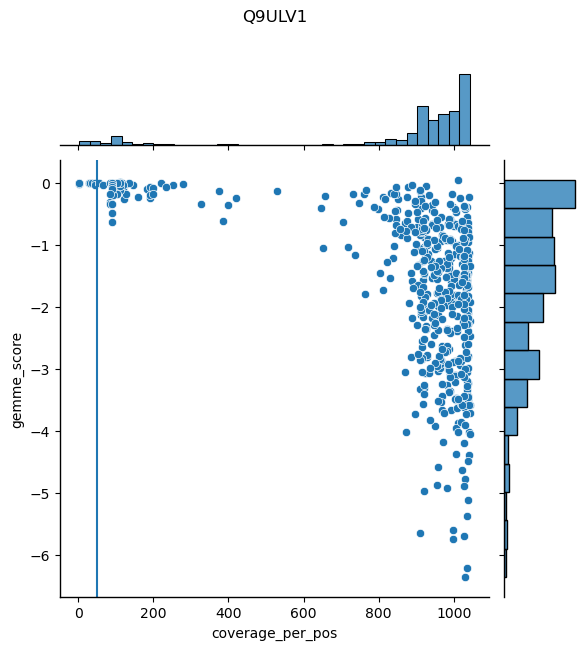

,protein,sum Neffs,seq len,max cov,mean neff,std neff,min neff,max neff,max back neff,Nf
0,O15118,1123.432707,1278,1487,0.879055,0.280760,0.000782,1.156495,1.163537,31.425460
1,P08100,917.097701,348,1184,2.635338,1.119132,0.002874,3.390805,3.402299,49.161597
2,P11166,1455.428862,492,1773,2.958189,0.877673,0.004065,3.552846,3.603659,65.615801
3,P16615,1431.073896,1042,1925,1.373391,0.452611,0.061420,1.827255,1.847409,44.333110
4,P17787,1282.193227,502,1790,2.554170,1.054456,0.003984,3.527888,3.565737,57.227084
5,P29033,1234.212389,226,1352,5.461117,0.976240,0.004425,5.920354,5.982301,82.098587
6,P31213,959.102362,254,1178,3.775994,1.182367,0.011811,4.606299,4.637795,60.179434
7,P32245,984.237952,332,1266,2.964572,1.222734,0.003012,3.798193,3.813253,54.017075
8,P41181,1026.575646,271,1327,3.788102,1.708681,0.003690,4.863469,4.896679,62.360029
9,P43681,697.322169,627,1108,1.112157,0.631169,0.065391,1.757576,1.767145,27.848365


In [194]:
proteins = ['O15118', 'P08100', 'P11166', 'P13569', 'P16615', 'P17787', 'P29033', 'P31213', 'P32245', 
            'P35499', 'P41181', 'P43681', 'Q8N5M9', 'Q99835', 'Q9H221', 'Q9H222', 'Q9H3H5', 'Q9ULV1']
neffs_proteins = [['protein', 'sum Neffs', 'seq len', 'max cov', 'mean neff', 'std neff', 'min neff', 'max neff', 'max back neff', 'Nf', ]]
for protein in sorted(proteins):
    diri = f'/storage1/tiemann/projects/Xray_calc/gemme/{protein}/run-v2'
    gemme_file = glob.glob(os.path.join(diri, 'prism_gemme_*.txt'))
    if len(gemme_file)> 0:
        print(gemme_file[0])
        with open(gemme_file[0], 'r') as fp:
            for line in fp:
                if 'MSA_tot' in line:
                    max_cov = line.split()[-1]
                    break
        df = pd.read_csv(gemme_file[0], skiprows=20, sep='\s+')
        df['resi'] = df['variant'].apply(lambda x: x[1:-1])
        df.drop_duplicates(subset=['resi'], inplace=True)
        df['neff'] = df['coverage_per_pos'].apply(lambda x: x/len(df))
        neffs_proteins.append([protein, df['neff'].sum(), 
                               len(df), 
                              max_cov,
                              df['neff'].describe()['mean'], 
                              df['neff'].describe()['std'],
                              df['neff'].min(), 
                              df['neff'].max(), 
                               float(max_cov)/len(df),
                               df['neff'].sum()/np.sqrt(len(df)),])
        sns.jointplot(x=df['neff'], y=df['coverage_per_pos'], data=df, kind='scatter')
        plt.axhline(50)
        plt.title(protein, pad=100)
        plt.show()
        sns.jointplot(x=df['neff'], y=df['gemme_score'], data=df, kind='scatter')
        plt.title(protein, pad=100)
        plt.show()
        
        sns.jointplot(x=df['coverage_per_pos'], y=df['gemme_score'], data=df, kind='scatter')
        plt.axvline(50)
        plt.title(protein, pad=100)
        plt.show()
neffs_proteins_df = pd.DataFrame(data=neffs_proteins[1:], columns=neffs_proteins[0])
neffs_proteins_df.sort_values(by=['protein'])

# Plot other (general) figures for paper

## Make plot about Rosetta statistics

### own benchmark

In [255]:
sm_corr_df = pd.read_csv(sm_corr_dfs_csv)
sm_corr_df

,rosetta;benchmark_01,rosetta;relaxes_01,rosetta;ddG_protocols_01,rosetta;sfxns_01,pearson,pearson_mse,spearman,spearman_mse,kendall,kendall_mse,count
0,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.322643,0.002401,0.447156,0.002113,0.310124,0.001250,330
1,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.294973,0.003500,0.443171,0.001707,0.307243,0.001299,272
2,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.290226,0.004438,0.415021,0.002754,0.280994,0.001083,272
3,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.286420,0.004958,0.445728,0.003056,0.313410,0.001594,272
4,benchmark_2,mp_relax,MP_flex_relax_ddG,franklin2019,0.324218,0.003680,0.474197,0.002156,0.336417,0.001211,272
...,...,...,...,...,...,...,...,...,...,...,...
135,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.338621,0.002604,0.455463,0.001945,0.315081,0.000993,330
136,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.324879,0.002532,0.447238,0.001921,0.309043,0.000928,330
137,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.347022,0.003063,0.472788,0.002004,0.329594,0.001168,330
138,benchmark_8,const_relax_mp,cart_prot,f19_cart,0.348822,0.002995,0.468504,0.001998,0.323065,0.001133,330


In [256]:
for x in sm_corr_df['rosetta;relaxes_01'].unique():
    for y in sm_corr_df['rosetta;ddG_protocols_01'].unique():
        z= 'f19_cart'
        tmp_df = sm_corr_df.copy()
        f = tmp_df.loc[((tmp_df['rosetta;relaxes_01']==x) & (tmp_df['rosetta;ddG_protocols_01']==y) & (tmp_df['rosetta;sfxns_01']==z)), 'spearman'].mean()
        if str(f)!='nan':
            logger.info(f"{x}, {y}, {z}: {f}")
        

INFO:const_relax_mp, cart_prot, f19_cart: 0.46315418918791423


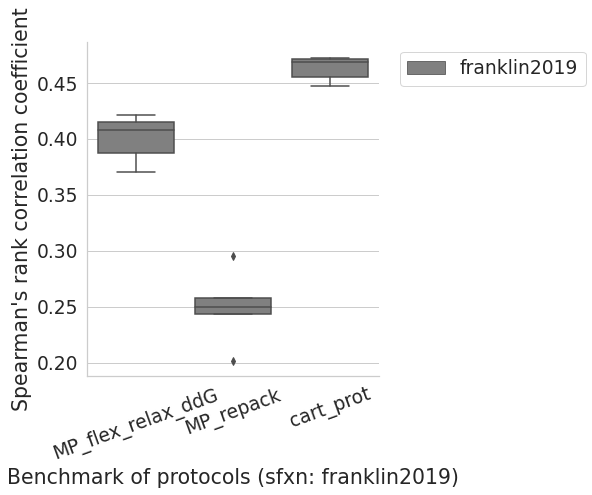

In [257]:
with sns.axes_style("white"):
    sns.set(font_scale=1.7)
    sns.set_style("whitegrid")
    palette = sns.color_palette(["grey"],)
    
    benchmark = 'benchmark_8'
    tmp_df = sm_corr_df.copy()
    tmp_df.loc[(tmp_df['rosetta;sfxns_01']=='f19_cart'), 'rosetta;sfxns_01'] = 'franklin2019'
    tmp_df = tmp_df[tmp_df['rosetta;sfxns_01']=='franklin2019'].reset_index(drop=True)
    tmp_df = tmp_df[tmp_df['rosetta;relaxes_01']=='const_relax_mp'].reset_index(drop=True)

    g = sns.catplot(data=tmp_df, y='spearman', hue='rosetta;sfxns_01',
                    x='rosetta;ddG_protocols_01', kind='box', height=6, aspect=0.95, palette=palette, legend=False,)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.xlabel('Benchmark of protocols (sfxn: franklin2019)')
    plt.ylabel("Spearman's rank correlation coefficient")
    plt.xticks(rotation=20)
    filename = os.path.join(plots_dir, f'Figsuppl_methods_own-spearman_2.svg')
    plt.savefig(filename)
    plt.show()

### rep-sci online benchmark

In [258]:
rosetta_sci_bench_stats = pd.read_csv(rosetta_sci_bench_csv)
rosetta_sci_bench_stats['cartesian'] = rosetta_sci_bench_stats['sfxn'].apply(lambda x: True if len(x.split('_'))==4 else False)
rosetta_sci_bench_stats['sfxn'] = rosetta_sci_bench_stats['sfxn'].apply(lambda x: x.split('_')[1])
rosetta_sci_bench_stats


,sfxn,date,dataset,pearson,slope,intercept,spearman,pval,cartesian
0,franklin2019,2021-07-18 05:37:35,1py6_all,0.038,0.380,1.048,-0.049,0.651,False
1,franklin2019,2021-07-18 05:37:35,1py6_ref1,-0.826,-2.748,1.251,-0.500,0.667,False
2,franklin2019,2021-07-18 05:37:35,1py6_ref2,-0.050,-0.409,1.429,-0.147,0.493,False
3,franklin2019,2021-07-18 05:37:35,1py6_ref3,0.084,0.818,-4.391,-0.069,0.798,False
4,franklin2019,2021-07-18 05:37:35,1py6_ref4,0.104,0.716,0.821,0.232,0.658,False
...,...,...,...,...,...,...,...,...,...
131,ref2015,2021-07-29 20:34:48,2xov_all,0.494,3.451,2.683,0.425,0.000,True
132,ref2015,2021-07-29 20:34:48,2xov_ref1,0.742,6.658,-0.621,0.847,0.000,True
133,ref2015,2021-07-29 20:34:48,2xov_ref2,0.439,2.758,3.531,0.349,0.003,True
134,ref2015,2021-07-29 20:34:48,2xov_ref3,-0.747,-5.469,5.025,-0.500,0.667,True


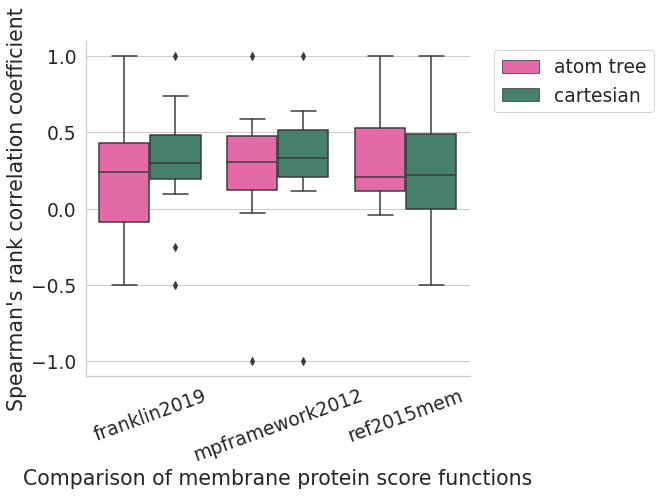

In [259]:
tmpi_plot_df = rosetta_sci_bench_stats.copy()
exclude = []#['1py6_ref1', '1py6_ref6', '2xov_ref3', ] 
tmpi_plot_df = tmpi_plot_df.loc[~tmpi_plot_df['dataset'].isin(exclude)].reset_index(drop=True)
tmpi_plot_df = tmpi_plot_df.loc[tmpi_plot_df['dataset']!='all'].reset_index(drop=True)
tmpi_plot_df.loc[tmpi_plot_df['cartesian']==True, 'cartesian'] = 'cartesian'
tmpi_plot_df.loc[tmpi_plot_df['cartesian']==False, 'cartesian'] = 'atom tree'
tmpi_plot_df = tmpi_plot_df.loc[tmpi_plot_df['sfxn']!='ref2015'].reset_index(drop=True)

with sns.axes_style("white"):
    sns.set(font_scale=1.7)
    sns.set_style("whitegrid")
    palette = sns.color_palette(['#F756A4', '#3D8971'],)
    g = sns.catplot(data=tmpi_plot_df, y='spearman', hue='cartesian', 
                        x="sfxn", kind='box', height=6, aspect=1.2, palette=palette, legend=False,)
    plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.xlabel('Comparison of membrane protein score functions')
    plt.ylabel("Spearman's rank correlation coefficient")
    plt.xticks(rotation=20)
    filename = os.path.join(plots_dir, f'Figsuppl_methods_db-spearman_2.svg')
    plt.savefig(filename, )
    plt.show()

## correlate exp. vs exp

In [193]:
exp_df = []
exp = {}
for fi in glob.glob(os.path.join(path_to_exp_data, 'prism*.txt')):
    print(fi)
    try:
        prism_df = read_prism(fi)
        name = prism_df.metadata['protein']['name']
        flag = prism_df.metadata['filename'].split('_')[2]
        if name in exp.keys():
            exp[name] = exp[name] + [prism_df]
        else:
            exp[name] = [prism_df]
    except:
        pass
#exp

/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_127_OmpA_ecoli_unfolding_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_124_GlyR_human_current_dimer_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_118_GlpG_ecoli_folding_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_126_GlpG_hinfl_dTM_unfold_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_104_GpA_ecoli_dimer_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_136_GLIC_EC50_pH50_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_121_PMP22_human_unfold_bind_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_125_GlpG_ecoli_unfold_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_119_GLIC_EC50_pH50_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_132_GlpG_ecoli_unfold_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_129_GlpG_ecoli_folding_MP.txt
/storage1/tiemann/dev/repos/prism/prism_ddG/prism_ddG_101_PagP_ecoli_wl-t

In [232]:
combi = {}
for name in exp.keys():
    if len(exp[name])>1:
        print(f'###{name}###')
        all_merged = merge_prism_df(exp[name], identity=0.7)

        key_dic = {}
        new_columns = {}
        for keyx in all_merged.metadata['merged']:
            num = keyx.split("_")[1]
            name2 = all_merged.metadata['merged'][keyx].split('_')[2]
            for column in all_merged.metadata['columns']:
                if column.endswith(num):
                    key_dic[column] = f'{name2};{column}'
                    new_columns[f'{name2};{column}'] = all_merged.metadata['columns'][column]
        all_merged.dataframe.rename(columns=key_dic, inplace=True)
        cols = ['variant']
        for col in all_merged.dataframe.columns:
            for i in ['ddG', 'ddg']:
                if i in col:
                    if not 'std' in col:
                        cols.append(col)
        tmp_df = all_merged.dataframe[cols]
        
        def counti(a, b):
            return len(a+b)
        counts = tmp_df.corr(method=counti)
        cors = tmp_df.corr(method='spearman')
        correls = {}
        for col in counts.columns:
            s = counts.index[counts[col]>12].tolist()
            for i in s:
                if i.split(';')[0]!=col.split(';')[0]:
                    na = '-'.join(sorted([i,col]))
                    cor = cors[col][i]
                    correls[na] = [cor, counts[col][i]]
        print(correls)
        if len(correls)>0:
            combi[name] = correls
combi

###OMPA###
{'103;ddG_u_01-114;ddGunf_02': [1.0, 19.0]}
###GLPG###
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 

{'OMPA': {'103;ddG_u_01-114;ddGunf_02': [1.0, 19.0]},
 'GLPG': {'122;ddG_kin_08-125;ddG_01': [0.6457970977397256, 15.0],
  '128;ddG_unf_07-129;ddG_unf_03': [0.699209502219103, 20.0],
  '122;ddG_kin_08-129;ddG_unf_03': [0.3057862842810693, 13.0],
  '122;ddG_kin_08-128;ddG_unf_07': [0.33012410872843767, 13.0]}}

In [233]:
combi

{'OMPA': {'103;ddG_u_01-114;ddGunf_02': [1.0, 19.0]},
 'GLPG': {'122;ddG_kin_08-125;ddG_01': [0.6457970977397256, 15.0],
  '128;ddG_unf_07-129;ddG_unf_03': [0.699209502219103, 20.0],
  '122;ddG_kin_08-129;ddG_unf_03': [0.3057862842810693, 13.0],
  '122;ddG_kin_08-128;ddG_unf_07': [0.33012410872843767, 13.0]}}

In [234]:
# mean
correli = []
for elem in combi.keys():
    for el in combi[elem]:
        correli.append(combi[elem][el][0])
np.mean(correli)

0.5961833985936671